In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline, make_pipeline, FeatureUnion
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler, RobustScaler, FunctionTransformer, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_recall_fscore_support
#from scipy import interp
import pickle
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression

# imports necessary for dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFE
from sklearn import svm


# metrics for evaluating regression models
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

## EDA - Exploratory Data Analysis

In [2]:
df = pd.read_csv('severe_cases_score_data.csv')

df.head()

,Unnamed: 0,FIPS,State,County,Severe COVID Case Complications,covid_cases,% Adults 65 and Older,% Diagnosed Diabetes,% Adults with Obesity,Heart Disease Death Rate,Hypertension Death Rate,COPD Mortality Rate,% Smokers
0,0,1001,Alabama,Autauga,51.721197,9012,15.973,11.4,32.7,388.7,179.6,73.41,18.081557
1,1,1003,Alabama,Baldwin,39.964354,34063,20.978,8.2,30.1,362.6,143.4,45.27,17.489033
2,2,1005,Alabama,Barbour,71.258434,3184,19.691,15.1,41.2,444.3,217.2,60.07,21.999985
3,3,1007,Alabama,Bibb,59.971356,3628,16.670,12.2,37.4,491.8,143.3,75.08,19.114200
4,4,1009,Alabama,Blount,56.204965,8862,18.701,12.2,32.5,437.9,112.4,78.32,19.208672


In [3]:
df.County.nunique()

1850

In [4]:
df.State.nunique()

51

Check for missing values

In [5]:
df.isna().sum()

Unnamed: 0                         0
FIPS                               0
State                              0
County                             0
Severe COVID Case Complications    0
covid_cases                        0
% Adults 65 and Older              0
% Diagnosed Diabetes               0
% Adults with Obesity              0
Heart Disease Death Rate           0
Hypertension Death Rate            0
COPD Mortality Rate                0
% Smokers                          0
dtype: int64

In [6]:
df.duplicated().sum()

0

In [7]:
df.describe()

,Unnamed: 0,FIPS,Severe COVID Case Complications,covid_cases,% Adults 65 and Older,% Diagnosed Diabetes,% Adults with Obesity,Heart Disease Death Rate,Hypertension Death Rate,COPD Mortality Rate,% Smokers
count,3142.000000,3142.000000,3142.000000,3.142000e+03,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000,3142.000000
mean,1570.500000,30383.649268,50.015913,1.260336e+04,19.751832,10.487015,33.430426,356.348663,254.897931,55.374717,17.469322
std,907.161599,15162.508374,16.515232,4.342938e+04,4.822887,3.525734,5.925174,85.860724,108.452493,16.229974,3.609870
min,0.000000,1001.000000,3.523234,1.000000e+00,-1.000000,2.200000,11.000000,-1.000000,-1.000000,9.940000,5.908719
25%,785.250000,18177.500000,38.525143,1.327000e+03,16.683000,7.900000,29.625000,297.525000,181.425000,43.932500,14.940346
50%,1570.500000,29176.000000,50.154360,3.223500e+03,19.402000,9.950000,33.700000,344.200000,235.800000,53.955000,16.953367
75%,2355.750000,45080.500000,62.800764,8.271250e+03,22.304000,12.500000,37.300000,402.875000,302.375000,64.807500,19.725824
max,3141.000000,56045.000000,89.246340,1.419739e+06,58.174000,28.700000,58.900000,970.800000,1136.300000,152.290000,41.491309


In [8]:
df.columns

Index(['Unnamed: 0', 'FIPS', 'State', 'County',
       'Severe COVID Case Complications', 'covid_cases',
       '% Adults 65 and Older', '% Diagnosed Diabetes',
       '% Adults with Obesity', 'Heart Disease Death Rate',
       'Hypertension Death Rate', 'COPD Mortality Rate', '% Smokers'],
      dtype='object')

In [9]:
df = df.drop(columns=['Unnamed: 0', 'FIPS'])
df.head()

,State,County,Severe COVID Case Complications,covid_cases,% Adults 65 and Older,% Diagnosed Diabetes,% Adults with Obesity,Heart Disease Death Rate,Hypertension Death Rate,COPD Mortality Rate,% Smokers
0,Alabama,Autauga,51.721197,9012,15.973,11.4,32.7,388.7,179.6,73.41,18.081557
1,Alabama,Baldwin,39.964354,34063,20.978,8.2,30.1,362.6,143.4,45.27,17.489033
2,Alabama,Barbour,71.258434,3184,19.691,15.1,41.2,444.3,217.2,60.07,21.999985
3,Alabama,Bibb,59.971356,3628,16.670,12.2,37.4,491.8,143.3,75.08,19.114200
4,Alabama,Blount,56.204965,8862,18.701,12.2,32.5,437.9,112.4,78.32,19.208672


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3142 entries, 0 to 3141
Data columns (total 11 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   State                            3142 non-null   object 
 1   County                           3142 non-null   object 
 2   Severe COVID Case Complications  3142 non-null   float64
 3   covid_cases                      3142 non-null   int64  
 4   % Adults 65 and Older            3142 non-null   float64
 5   % Diagnosed Diabetes             3142 non-null   float64
 6   % Adults with Obesity            3142 non-null   float64
 7   Heart Disease Death Rate         3142 non-null   float64
 8   Hypertension Death Rate          3142 non-null   float64
 9   COPD Mortality Rate              3142 non-null   float64
 10  % Smokers                        3142 non-null   float64
dtypes: float64(8), int64(1), object(2)
memory usage: 270.1+ KB


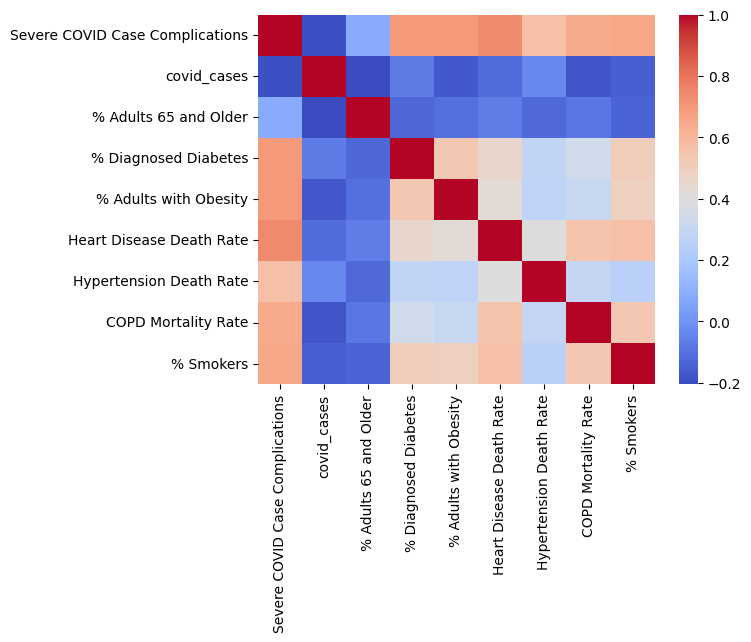

In [11]:
plt.figure()
sns.heatmap(df.corr(),cmap='coolwarm')
plt.show()

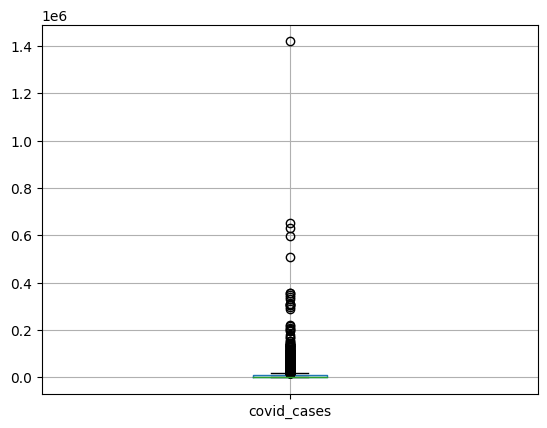

In [12]:
df.boxplot(column=['covid_cases'])
plt.show()

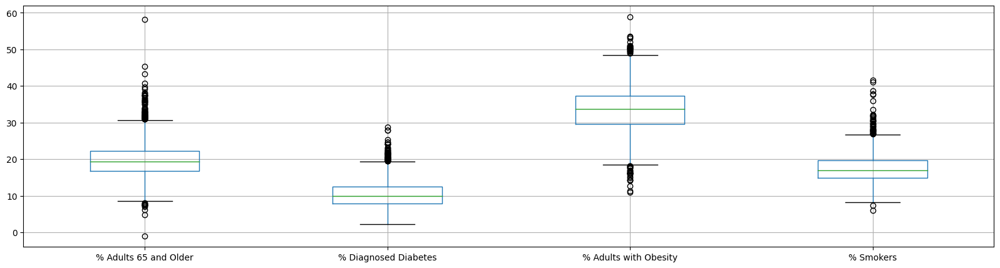

In [13]:
df.boxplot(column=['% Adults 65 and Older','% Diagnosed Diabetes','% Adults with Obesity','% Smokers'], figsize=(20,5))
plt.show()

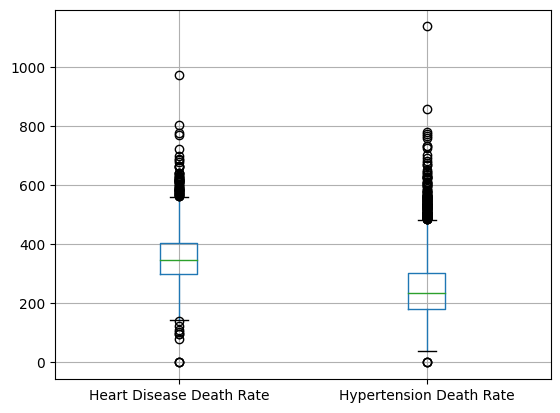

In [14]:
df.boxplot(column=['Heart Disease Death Rate','Hypertension Death Rate' ])
plt.show()

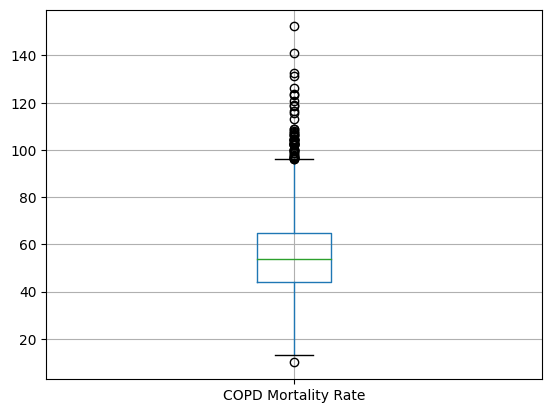

In [15]:
df.boxplot(column=['COPD Mortality Rate'])
plt.show()


## Data Preparation

### Let's replace the categorical columns "State" and "County" by numerical columns

In [16]:
a = df['State'].unique().tolist()
c = df['County'].unique().tolist()


In [17]:
b=[]
for i in range(len(a)):
    b.append(i+1)    

In [18]:
d=[]
for i in range(len(c)):
    d.append(i+1)    

In [19]:
scaler_mapper = {}
for i in range(len(a)):
    scaler_mapper[a[i]] = b[i]

In [20]:
scaler_mapper2 = {}
for i in range(len(c)):
    scaler_mapper2[c[i]] = d[i]

In [21]:
df['State'] = df['State'].map(scaler_mapper)
df['County'] = df['County'].map(scaler_mapper2)

In [22]:
df

,State,County,Severe COVID Case Complications,covid_cases,% Adults 65 and Older,% Diagnosed Diabetes,% Adults with Obesity,Heart Disease Death Rate,Hypertension Death Rate,COPD Mortality Rate,% Smokers
0,1,1,51.721197,9012,15.973,11.4,32.7,388.7,179.6,73.41,18.081557
1,1,2,39.964354,34063,20.978,8.2,30.1,362.6,143.4,45.27,17.489033
2,1,3,71.258434,3184,19.691,15.1,41.2,444.3,217.2,60.07,21.999985
3,1,4,59.971356,3628,16.670,12.2,37.4,491.8,143.3,75.08,19.114200
4,1,5,56.204965,8862,18.701,12.2,32.5,437.9,112.4,78.32,19.208672
...,...,...,...,...,...,...,...,...,...,...,...
3137,51,1847,41.787397,5791,12.963,8.0,30.1,352.6,246.9,67.91,18.073422
3138,51,484,6.813495,4502,15.841,2.2,11.0,157.7,55.3,29.41,14.546369
3139,51,1848,45.054106,3053,14.956,9.5,34.9,333.9,190.5,72.15,17.212675
3140,51,1849,40.826225,1079,22.165,8.2,29.5,305.7,235.8,50.96,16.859400


In [23]:
robust_scaler = RobustScaler()
df[['covid_cases','Hypertension Death Rate','% Adults 65 and Older','% Diagnosed Diabetes','% Adults with Obesity','COPD Mortality Rate','% Smokers']] = robust_scaler.fit_transform(df[['covid_cases','Hypertension Death Rate','% Adults 65 and Older','% Diagnosed Diabetes','% Adults with Obesity','COPD Mortality Rate','% Smokers']])

In [24]:
robust_scaler = RobustScaler()
df[['covid_cases']] = robust_scaler.fit_transform(df[['covid_cases']])

In [25]:
df['covid_cases'].min()


-0.46405299348381757

In [26]:
df['covid_cases'] = np.log(df['covid_cases']-(df.covid_cases.min()-1.01) )

In [27]:
df['Hypertension Death Rate'].min()

-1.9578338156262922

In [28]:
df['Hypertension Death Rate'] = np.log(df['Hypertension Death Rate']+2.96 )

In [29]:
df['% Adults 65 and Older'].min()

-3.629603273438891

In [30]:
df['% Adults 65 and Older'] = np.log(df['% Adults 65 and Older']+4.63 )

In [31]:
df['Heart Disease Death Rate'] = df['Heart Disease Death Rate']/df['Heart Disease Death Rate'].max()

In [32]:
df['Heart Disease Death Rate'].min()

-0.0010300782859497322

In [33]:
df['Heart Disease Death Rate'] = np.log(df['Heart Disease Death Rate']+1 )

In [34]:
df['% Diagnosed Diabetes'].min()

-1.684782608695652

In [35]:
df['% Diagnosed Diabetes'] = np.log(df['% Diagnosed Diabetes']+ 2.69 )

In [36]:
df['% Adults with Obesity'].min()

-2.957654723127037

In [37]:
df['% Adults with Obesity'] = np.log(df['% Adults with Obesity']+ 3.96 )

In [38]:
df['COPD Mortality Rate'].min()

-2.1085029940119755

In [39]:
df['COPD Mortality Rate'] = np.log(df['COPD Mortality Rate']+ 3.2 )

In [40]:
df['% Smokers'].min()

-2.307950959016287

In [41]:
df['% Smokers'] = np.log(df['% Smokers']+ 3.4 )

In [42]:
df.covid_cases.min()

0.009950330853168092

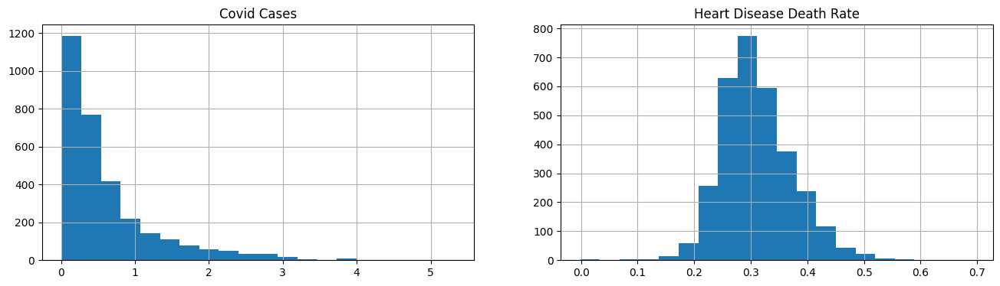

In [43]:
# Create figure with two subplots
fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("Covid Cases")
df['covid_cases'].hist(bins=20)

ax3 = fig.add_subplot(1, 2, 2)
ax3.set_title("Heart Disease Death Rate")

df['Heart Disease Death Rate'].hist(bins=20)

plt.show()

In [44]:
df.covid_cases.median()

0.38801560093027837

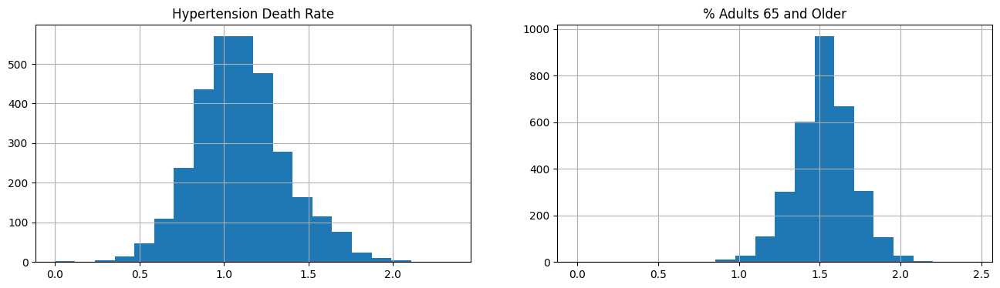

In [45]:
# Create figure with two subplots
fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("Hypertension Death Rate")
df['Hypertension Death Rate'].hist(bins=20)

ax3 = fig.add_subplot(1, 2, 2)
ax3.set_title("% Adults 65 and Older")

df['% Adults 65 and Older'].hist(bins=20)

plt.show()

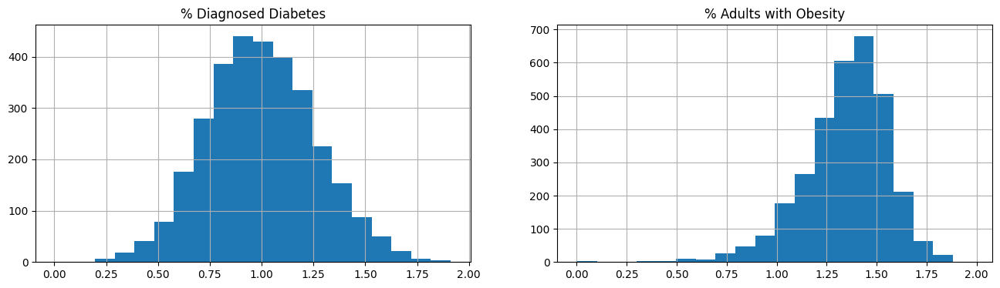

In [46]:
# Create figure with two subplots
fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("% Diagnosed Diabetes")
df['% Diagnosed Diabetes'].hist(bins=20)

ax3 = fig.add_subplot(1, 2, 2)
ax3.set_title("% Adults with Obesity")

df['% Adults with Obesity'].hist(bins=20)

plt.show()

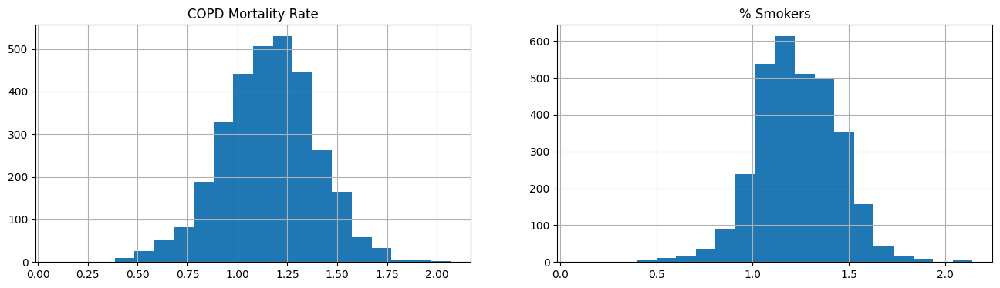

In [47]:
# Create figure with two subplots
fig = plt.figure(figsize=(16,4))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("COPD Mortality Rate")
df['COPD Mortality Rate'].hist(bins=20)

ax3 = fig.add_subplot(1, 2, 2)
ax3.set_title("% Smokers")

df['% Smokers'].hist(bins=20)

plt.show()

Finally, we can build the preprocessing pipeline. It first adds the column names back to a set of examples (that can be either a training, or a validation, or test set). Then it applies the two different data preparation strategies to the two groups of columns and unites them with FeatureUnion.

In [48]:
# store a list with the names of all predictors
names_all = [c for c in df if c not in ['Severe COVID Case Complications']]

# define column groups with same data preparation
names_outliers = ['covid_cases','Hypertension Death Rate','% Adults 65 and Older','% Diagnosed Diabetes', 'Heart Disease Death Rate','% Adults with Obesity','COPD Mortality Rate','% Smokers']
names_no_outliers = list(set(names_all) - set(names_outliers))

In [49]:
class AddColumnNames(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return pd.DataFrame(data=X, columns=self.columns)

In [50]:
class ColumnSelector(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        assert isinstance(X, pd.DataFrame)
        return X[self.columns]

In [51]:
preprocess_pipeline = make_pipeline(
    AddColumnNames(columns=names_all),
    FeatureUnion(transformer_list=[
        ("outlier_columns", make_pipeline(
            ColumnSelector(columns=names_outliers),
        )),
         ("no_outlier_columns", make_pipeline(
             ColumnSelector(columns=names_no_outliers),
         ))
    ])
)

In [52]:
y = df['Severe COVID Case Complications']
X = df.drop('Severe COVID Case Complications', axis=1).values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)

### Random Forest Pipeline

In [53]:
pipe = Pipeline(steps=[('preprocess', preprocess_pipeline), 
                       ('reduce_dim', 'passthrough'),
                       ('regresson', RandomForestRegressor(n_estimators=10))])

In [54]:
N_FEATURES_OPTIONS = [2, 6, 11]
MAX_DEPTH_OPTIONS = [2, 4, 6, 8]

param_grid = [
    {
        'reduce_dim': [PCA(iterated_power=7)],
        'reduce_dim__n_components': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    },
    {
        'reduce_dim': [RFE(svm.SVR(kernel='linear', gamma='auto')),RFE(LinearRegression())],
        'reduce_dim__n_features_to_select': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    }  
]

search = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, refit=True)
search.fit(X_train, y_train)

print("Best CV score = %0.3f:" % search.best_score_)
print("Best parameters: ", search.best_params_)

# store the best params and best model for later use
RF_best_params = search.best_params_
RF_best_model = search.best_estimator_

Best CV score = 0.950:
Best parameters:  {'reduce_dim': RFE(estimator=LinearRegression(), n_features_to_select=6), 'reduce_dim__n_features_to_select': 6, 'regresson__max_depth': 8}


/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
20 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 378, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 336, in _fit
    X, fitted_transformer = fit_transform_one_cached(
  File "/opt/anaconda3/lib/py

### Linear Regression Pipeline

In [55]:
pipe = Pipeline(steps=[('preprocess', preprocess_pipeline), 
                       ('reduce_dim', 'passthrough'),
                       ('regresson', LinearRegression())])

In [56]:
N_FEATURES_OPTIONS = [2, 6, 11]
NORMALIZE_OPTIONS = [False, True]

param_grid = [
    {
        'reduce_dim': [PCA(iterated_power=7)],
        'reduce_dim__n_components': N_FEATURES_OPTIONS,
        'regresson__normalize': NORMALIZE_OPTIONS
    },
    {
        'reduce_dim': [RFE(svm.SVR(kernel='linear', gamma='auto')),RFE(LinearRegression())],
        'reduce_dim__n_features_to_select': N_FEATURES_OPTIONS,
        'regresson__normalize': NORMALIZE_OPTIONS
    }  
]

search = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, refit=True)
search.fit(X_train, y_train)
print("Best CV score = %0.3f:" % search.best_score_)
print("Best parameters: ", search.best_params_)

# store the best params and best model for later use
LR_best_params = search.best_params_
LR_best_model = search.best_estimator_

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. P

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model =

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
I

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. P

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed

Best CV score = 0.953:
Best parameters:  {'reduce_dim': RFE(estimator=SVR(gamma='auto', kernel='linear'), n_features_to_select=11), 'reduce_dim__n_features_to_select': 11, 'regresson__normalize': True}


/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(


### XGBoost Regressor

In [66]:
import xgboost as xgb
pipe = Pipeline(steps=[#('preprocess', preprocess_pipeline), 
                       ('reduce_dim', 'passthrough'),
                       ('regresson', xgb.XGBRegressor(verbosity=0))]) 

N_FEATURES_OPTIONS = [2, 6, 11]
MAX_DEPTH_OPTIONS = [2, 4, 6, 8]

param_grid = [
    {
        'reduce_dim': [PCA(iterated_power=7)],
        'reduce_dim__n_components': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    },
    {
        'reduce_dim': [RFE(svm.SVR(kernel='linear', gamma='auto')),RFE(LinearRegression())],
        'reduce_dim__n_features_to_select': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    }  
]

search = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, refit=True)
search.fit(X_train, y_train)
print("Best CV score = %0.3f:" % search.best_score_)
print("Best parameters: ", search.best_params_)

# store the best params and best model for later use
XGB_best_params = search.best_params_
XGB_best_model = search.best_estimator_

/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
20 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 378, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 336, in _fit
    X, fitted_transformer = fit_transform_one_cached(
  File "/opt/anaconda3/lib/py

Best CV score = 0.985:
Best parameters:  {'reduce_dim': RFE(estimator=SVR(gamma='auto', kernel='linear'), n_features_to_select=11), 'reduce_dim__n_features_to_select': 11, 'regresson__max_depth': 2}


### CatBoost Regressor

In [67]:
from catboost import CatBoostRegressor
pipe = Pipeline(steps=[#('preprocess', preprocess_pipeline), 
                       ('reduce_dim', 'passthrough'),
                       ('regresson', CatBoostRegressor())]) 

N_FEATURES_OPTIONS = [2, 6, 11]
MAX_DEPTH_OPTIONS = [2, 4, 6, 8]

param_grid = [
    {
        'reduce_dim': [PCA(iterated_power=7)],
        'reduce_dim__n_components': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    },
    {
        'reduce_dim': [RFE(svm.SVR(kernel='linear', gamma='auto')),RFE(LinearRegression())],
        'reduce_dim__n_features_to_select': N_FEATURES_OPTIONS,
        'regresson__max_depth': MAX_DEPTH_OPTIONS
    }  
]

search = GridSearchCV(pipe, param_grid, n_jobs=-1, cv=5, refit=True)
search.fit(X_train, y_train)
print("Best CV score = %0.3f:" % search.best_score_)
print("Best parameters: ", search.best_params_)

# store the best params and best model for later use
CB_best_params = search.best_params_
CB_best_model = search.best_estimator_

Learning rate set to 0.045718
0:	learn: 16.2310093	total: 50ms	remaining: 50s
1:	learn: 16.1927533	total: 50.6ms	remaining: 25.3s
2:	learn: 16.1711291	total: 51.4ms	remaining: 17.1s
3:	learn: 16.1527011	total: 51.9ms	remaining: 12.9s
4:	learn: 16.1376956	total: 53.1ms	remaining: 10.6s
5:	learn: 16.1223916	total: 53.6ms	remaining: 8.88s
6:	learn: 16.0989432	total: 54.1ms	remaining: 7.67s
7:	learn: 16.0846805	total: 54.6ms	remaining: 6.77s
8:	learn: 16.0706265	total: 55.1ms	remaining: 6.07s
9:	learn: 16.0591243	total: 55.6ms	remaining: 5.5s
10:	learn: 16.0491452	total: 56.1ms	remaining: 5.04s
11:	learn: 16.0346643	total: 57.7ms	remaining: 4.75s
12:	learn: 16.0258952	total: 58.3ms	remaining: 4.43s
13:	learn: 15.9985101	total: 59.1ms	remaining: 4.17s
14:	learn: 15.9910314	total: 59.7ms	remaining: 3.92s
15:	learn: 15.9784130	total: 60.1ms	remaining: 3.7s
16:	learn: 15.9623366	total: 60.5ms	remaining: 3.5s
17:	learn: 15.9511055	total: 61ms	remaining: 3.33s
18:	learn: 15.9357175	total: 61.4ms

309:	learn: 14.0839722	total: 230ms	remaining: 512ms
310:	learn: 14.0774976	total: 230ms	remaining: 510ms
311:	learn: 14.0704881	total: 231ms	remaining: 509ms
312:	learn: 14.0672451	total: 234ms	remaining: 515ms
313:	learn: 14.0592231	total: 235ms	remaining: 514ms
314:	learn: 14.0551992	total: 236ms	remaining: 512ms
315:	learn: 14.0501527	total: 236ms	remaining: 511ms
316:	learn: 14.0478239	total: 237ms	remaining: 510ms
317:	learn: 14.0451991	total: 237ms	remaining: 508ms
318:	learn: 14.0399403	total: 238ms	remaining: 507ms
319:	learn: 14.0374874	total: 238ms	remaining: 506ms
320:	learn: 14.0307359	total: 239ms	remaining: 505ms
321:	learn: 14.0282096	total: 239ms	remaining: 504ms
322:	learn: 14.0228985	total: 240ms	remaining: 503ms
323:	learn: 14.0149834	total: 241ms	remaining: 502ms
324:	learn: 14.0121426	total: 241ms	remaining: 501ms
325:	learn: 14.0091221	total: 242ms	remaining: 500ms
326:	learn: 14.0050062	total: 243ms	remaining: 499ms
327:	learn: 14.0026411	total: 243ms	remaining:

616:	learn: 14.1890481	total: 274ms	remaining: 170ms
617:	learn: 14.1877290	total: 275ms	remaining: 170ms
618:	learn: 14.1868966	total: 275ms	remaining: 169ms
619:	learn: 14.1849092	total: 276ms	remaining: 169ms
620:	learn: 14.1828917	total: 276ms	remaining: 168ms
621:	learn: 14.1807947	total: 276ms	remaining: 168ms
622:	learn: 14.1789439	total: 277ms	remaining: 167ms
623:	learn: 14.1780363	total: 277ms	remaining: 167ms
624:	learn: 14.1774997	total: 277ms	remaining: 166ms
625:	learn: 14.1759283	total: 278ms	remaining: 166ms
626:	learn: 14.1745491	total: 278ms	remaining: 165ms
627:	learn: 14.1727527	total: 278ms	remaining: 165ms
628:	learn: 14.1718989	total: 279ms	remaining: 164ms
629:	learn: 14.1712249	total: 279ms	remaining: 164ms
630:	learn: 14.1697569	total: 279ms	remaining: 163ms
631:	learn: 14.1688940	total: 281ms	remaining: 163ms
632:	learn: 14.1678483	total: 281ms	remaining: 163ms
633:	learn: 14.1672103	total: 281ms	remaining: 162ms
634:	learn: 14.1662468	total: 281ms	remaining:

922:	learn: 14.0204582	total: 369ms	remaining: 30.7ms
923:	learn: 14.0200865	total: 369ms	remaining: 30.3ms
924:	learn: 14.0181508	total: 369ms	remaining: 29.9ms
925:	learn: 14.0178086	total: 369ms	remaining: 29.5ms
926:	learn: 14.0166221	total: 370ms	remaining: 29.1ms
927:	learn: 14.0158322	total: 370ms	remaining: 28.7ms
928:	learn: 14.0147172	total: 370ms	remaining: 28.3ms
929:	learn: 14.0136773	total: 371ms	remaining: 27.9ms
930:	learn: 14.0127793	total: 371ms	remaining: 27.5ms
931:	learn: 14.0124514	total: 371ms	remaining: 27.1ms
932:	learn: 14.0121391	total: 372ms	remaining: 26.7ms
933:	learn: 14.0115265	total: 372ms	remaining: 26.3ms
934:	learn: 14.0112212	total: 372ms	remaining: 25.9ms
935:	learn: 14.0098301	total: 373ms	remaining: 25.5ms
936:	learn: 14.0086605	total: 373ms	remaining: 25.1ms
937:	learn: 14.0079398	total: 373ms	remaining: 24.7ms
938:	learn: 14.0070022	total: 374ms	remaining: 24.3ms
939:	learn: 14.0062747	total: 374ms	remaining: 23.9ms
940:	learn: 14.0049831	total

617:	learn: 13.1063274	total: 411ms	remaining: 254ms
618:	learn: 13.1047048	total: 412ms	remaining: 253ms
619:	learn: 13.1016499	total: 412ms	remaining: 253ms
620:	learn: 13.1004161	total: 413ms	remaining: 252ms
621:	learn: 13.0963108	total: 413ms	remaining: 251ms
622:	learn: 13.0944155	total: 414ms	remaining: 250ms
623:	learn: 13.0903622	total: 414ms	remaining: 250ms
624:	learn: 13.0888974	total: 415ms	remaining: 249ms
625:	learn: 13.0853490	total: 415ms	remaining: 248ms
626:	learn: 13.0809143	total: 416ms	remaining: 247ms
627:	learn: 13.0773954	total: 416ms	remaining: 246ms
628:	learn: 13.0732309	total: 417ms	remaining: 246ms
629:	learn: 13.0708997	total: 417ms	remaining: 245ms
630:	learn: 13.0692994	total: 418ms	remaining: 244ms
631:	learn: 13.0679898	total: 419ms	remaining: 244ms
632:	learn: 13.0644621	total: 419ms	remaining: 243ms
633:	learn: 13.0612023	total: 420ms	remaining: 242ms
634:	learn: 13.0581446	total: 420ms	remaining: 241ms
635:	learn: 13.0542559	total: 421ms	remaining:

537:	learn: 13.1466242	total: 433ms	remaining: 372ms
538:	learn: 13.1442038	total: 434ms	remaining: 371ms
539:	learn: 13.1417314	total: 434ms	remaining: 370ms
540:	learn: 13.1407924	total: 435ms	remaining: 369ms
541:	learn: 13.1381271	total: 436ms	remaining: 368ms
542:	learn: 13.1353674	total: 436ms	remaining: 367ms
543:	learn: 13.1342850	total: 437ms	remaining: 366ms
544:	learn: 13.1319371	total: 437ms	remaining: 365ms
545:	learn: 13.1308321	total: 438ms	remaining: 364ms
546:	learn: 13.1268280	total: 438ms	remaining: 363ms
547:	learn: 13.1255209	total: 439ms	remaining: 362ms
548:	learn: 13.1228703	total: 439ms	remaining: 361ms
549:	learn: 13.1198353	total: 440ms	remaining: 360ms
550:	learn: 13.1184163	total: 440ms	remaining: 359ms
551:	learn: 13.1174508	total: 441ms	remaining: 358ms
552:	learn: 13.1150245	total: 441ms	remaining: 357ms
553:	learn: 13.1111674	total: 442ms	remaining: 356ms
554:	learn: 13.1082284	total: 442ms	remaining: 355ms
555:	learn: 13.1061146	total: 443ms	remaining:

232:	learn: 13.7468926	total: 333ms	remaining: 1.1s
233:	learn: 13.7396896	total: 334ms	remaining: 1.09s
234:	learn: 13.7366341	total: 336ms	remaining: 1.09s
235:	learn: 13.7331604	total: 337ms	remaining: 1.09s
236:	learn: 13.7265153	total: 338ms	remaining: 1.09s
237:	learn: 13.7231172	total: 342ms	remaining: 1.1s
238:	learn: 13.7195165	total: 343ms	remaining: 1.09s
239:	learn: 13.7079771	total: 344ms	remaining: 1.09s
240:	learn: 13.6986039	total: 345ms	remaining: 1.09s
241:	learn: 13.6917813	total: 346ms	remaining: 1.08s
242:	learn: 13.6849817	total: 347ms	remaining: 1.08s
243:	learn: 13.6812483	total: 348ms	remaining: 1.08s
244:	learn: 13.6704318	total: 349ms	remaining: 1.08s
245:	learn: 13.6619551	total: 351ms	remaining: 1.08s
246:	learn: 13.6574845	total: 352ms	remaining: 1.07s
247:	learn: 13.6501469	total: 355ms	remaining: 1.08s
248:	learn: 13.6419978	total: 356ms	remaining: 1.07s
249:	learn: 13.6366768	total: 357ms	remaining: 1.07s
250:	learn: 13.6327316	total: 358ms	remaining: 1

847:	learn: 11.6579296	total: 1.22s	remaining: 220ms
848:	learn: 11.6562103	total: 1.23s	remaining: 219ms
849:	learn: 11.6542843	total: 1.23s	remaining: 217ms
850:	learn: 11.6505002	total: 1.23s	remaining: 216ms
851:	learn: 11.6492809	total: 1.24s	remaining: 215ms
852:	learn: 11.6474209	total: 1.24s	remaining: 213ms
853:	learn: 11.6443242	total: 1.24s	remaining: 212ms
854:	learn: 11.6423315	total: 1.24s	remaining: 210ms
855:	learn: 11.6402287	total: 1.24s	remaining: 209ms
856:	learn: 11.6388189	total: 1.24s	remaining: 207ms
857:	learn: 11.6381308	total: 1.24s	remaining: 206ms
858:	learn: 11.6350803	total: 1.25s	remaining: 204ms
859:	learn: 11.6336430	total: 1.25s	remaining: 203ms
860:	learn: 11.6327775	total: 1.25s	remaining: 201ms
861:	learn: 11.6284208	total: 1.25s	remaining: 200ms
862:	learn: 11.6268406	total: 1.25s	remaining: 198ms
863:	learn: 11.6245025	total: 1.25s	remaining: 197ms
864:	learn: 11.6208127	total: 1.25s	remaining: 195ms
865:	learn: 11.6183921	total: 1.25s	remaining:

156:	learn: 5.9166956	total: 85.7ms	remaining: 460ms
157:	learn: 5.9130201	total: 86.8ms	remaining: 462ms
158:	learn: 5.9067478	total: 87.2ms	remaining: 461ms
159:	learn: 5.9023981	total: 87.8ms	remaining: 461ms
160:	learn: 5.8980797	total: 88.3ms	remaining: 460ms
161:	learn: 5.8911770	total: 88.7ms	remaining: 459ms
162:	learn: 5.8847439	total: 89.3ms	remaining: 458ms
163:	learn: 5.8813204	total: 89.8ms	remaining: 458ms
164:	learn: 5.8742892	total: 90.3ms	remaining: 457ms
165:	learn: 5.8674800	total: 92.4ms	remaining: 464ms
166:	learn: 5.8642387	total: 92.9ms	remaining: 464ms
167:	learn: 5.8616353	total: 93.4ms	remaining: 463ms
168:	learn: 5.8554709	total: 93.9ms	remaining: 462ms
169:	learn: 5.8488125	total: 94.4ms	remaining: 461ms
170:	learn: 5.8457208	total: 94.9ms	remaining: 460ms
171:	learn: 5.8425453	total: 95.4ms	remaining: 459ms
172:	learn: 5.8395991	total: 95.9ms	remaining: 458ms
173:	learn: 5.8288657	total: 96.4ms	remaining: 458ms
174:	learn: 5.8250306	total: 96.9ms	remaining:

849:	learn: 11.6324512	total: 1.2s	remaining: 211ms
850:	learn: 11.6298326	total: 1.2s	remaining: 210ms
851:	learn: 11.6279460	total: 1.2s	remaining: 208ms
852:	learn: 11.6259496	total: 1.2s	remaining: 207ms
853:	learn: 11.6244987	total: 1.2s	remaining: 205ms
854:	learn: 11.6230257	total: 1.2s	remaining: 204ms
855:	learn: 11.6213553	total: 1.2s	remaining: 202ms
856:	learn: 11.6195353	total: 1.2s	remaining: 201ms
857:	learn: 11.6172176	total: 1.21s	remaining: 199ms
858:	learn: 11.6152812	total: 1.21s	remaining: 198ms
859:	learn: 11.6136786	total: 1.21s	remaining: 197ms
860:	learn: 11.6112359	total: 1.21s	remaining: 195ms
861:	learn: 11.6094989	total: 1.21s	remaining: 194ms
862:	learn: 11.6074611	total: 1.21s	remaining: 192ms
863:	learn: 11.6046674	total: 1.21s	remaining: 191ms
864:	learn: 11.6024871	total: 1.21s	remaining: 189ms
865:	learn: 11.6011147	total: 1.21s	remaining: 188ms
866:	learn: 11.5990735	total: 1.22s	remaining: 186ms
867:	learn: 11.5983577	total: 1.22s	remaining: 185ms
8

158:	learn: 5.9274645	total: 106ms	remaining: 561ms
159:	learn: 5.9227327	total: 107ms	remaining: 560ms
160:	learn: 5.9201375	total: 108ms	remaining: 560ms
161:	learn: 5.9168720	total: 108ms	remaining: 559ms
162:	learn: 5.9147155	total: 109ms	remaining: 557ms
163:	learn: 5.9115443	total: 109ms	remaining: 556ms
164:	learn: 5.9026737	total: 110ms	remaining: 554ms
165:	learn: 5.8985773	total: 110ms	remaining: 553ms
166:	learn: 5.8962906	total: 111ms	remaining: 552ms
167:	learn: 5.8911502	total: 111ms	remaining: 551ms
168:	learn: 5.8880359	total: 112ms	remaining: 549ms
169:	learn: 5.8823862	total: 112ms	remaining: 548ms
170:	learn: 5.8777390	total: 114ms	remaining: 551ms
171:	learn: 5.8741109	total: 114ms	remaining: 549ms
172:	learn: 5.8709109	total: 115ms	remaining: 548ms
173:	learn: 5.8665363	total: 115ms	remaining: 547ms
174:	learn: 5.8622379	total: 116ms	remaining: 545ms
175:	learn: 5.8587212	total: 116ms	remaining: 544ms
176:	learn: 5.8548856	total: 117ms	remaining: 543ms
177:	learn: 

847:	learn: 11.7220916	total: 1.22s	remaining: 219ms
848:	learn: 11.7191130	total: 1.22s	remaining: 218ms
849:	learn: 11.7166395	total: 1.23s	remaining: 216ms
850:	learn: 11.7149450	total: 1.23s	remaining: 215ms
851:	learn: 11.7142610	total: 1.23s	remaining: 213ms
852:	learn: 11.7109882	total: 1.23s	remaining: 212ms
853:	learn: 11.7095094	total: 1.23s	remaining: 210ms
854:	learn: 11.7085885	total: 1.23s	remaining: 209ms
855:	learn: 11.7066462	total: 1.23s	remaining: 207ms
856:	learn: 11.7051672	total: 1.23s	remaining: 206ms
857:	learn: 11.7033371	total: 1.24s	remaining: 205ms
858:	learn: 11.7023065	total: 1.24s	remaining: 203ms
859:	learn: 11.7011109	total: 1.24s	remaining: 202ms
860:	learn: 11.6987427	total: 1.24s	remaining: 200ms
861:	learn: 11.6972103	total: 1.24s	remaining: 199ms
862:	learn: 11.6954235	total: 1.24s	remaining: 197ms
863:	learn: 11.6945794	total: 1.24s	remaining: 196ms
864:	learn: 11.6941548	total: 1.24s	remaining: 194ms
865:	learn: 11.6921975	total: 1.25s	remaining:

233:	learn: 13.4280173	total: 831ms	remaining: 2.72s
234:	learn: 13.4206387	total: 835ms	remaining: 2.72s
235:	learn: 13.4140153	total: 837ms	remaining: 2.71s
236:	learn: 13.4087456	total: 840ms	remaining: 2.7s
237:	learn: 13.4046249	total: 843ms	remaining: 2.7s
238:	learn: 13.3950868	total: 845ms	remaining: 2.69s
239:	learn: 13.3889493	total: 848ms	remaining: 2.69s
240:	learn: 13.3815860	total: 851ms	remaining: 2.68s
241:	learn: 13.3732496	total: 854ms	remaining: 2.67s
242:	learn: 13.3639909	total: 864ms	remaining: 2.69s
243:	learn: 13.3554783	total: 868ms	remaining: 2.69s
244:	learn: 13.3518906	total: 871ms	remaining: 2.68s
245:	learn: 13.3416778	total: 875ms	remaining: 2.68s
246:	learn: 13.3365776	total: 883ms	remaining: 2.69s
247:	learn: 13.3337814	total: 886ms	remaining: 2.69s
248:	learn: 13.3277900	total: 888ms	remaining: 2.68s
249:	learn: 13.3149915	total: 891ms	remaining: 2.67s
250:	learn: 13.3088082	total: 896ms	remaining: 2.67s
251:	learn: 13.3028215	total: 899ms	remaining: 2

152:	learn: 13.8559191	total: 491ms	remaining: 2.72s
153:	learn: 13.8490368	total: 493ms	remaining: 2.71s
154:	learn: 13.8415340	total: 496ms	remaining: 2.71s
155:	learn: 13.8306294	total: 504ms	remaining: 2.73s
156:	learn: 13.8249158	total: 507ms	remaining: 2.72s
157:	learn: 13.8187797	total: 510ms	remaining: 2.72s
158:	learn: 13.8078601	total: 513ms	remaining: 2.71s
159:	learn: 13.8024124	total: 516ms	remaining: 2.71s
160:	learn: 13.7948942	total: 520ms	remaining: 2.71s
161:	learn: 13.7894677	total: 524ms	remaining: 2.71s
162:	learn: 13.7853063	total: 527ms	remaining: 2.7s
163:	learn: 13.7778811	total: 530ms	remaining: 2.7s
164:	learn: 13.7734921	total: 534ms	remaining: 2.7s
165:	learn: 13.7688624	total: 538ms	remaining: 2.7s
166:	learn: 13.7584498	total: 541ms	remaining: 2.7s
167:	learn: 13.7495324	total: 543ms	remaining: 2.69s
168:	learn: 13.7429129	total: 546ms	remaining: 2.68s
169:	learn: 13.7330163	total: 548ms	remaining: 2.67s
170:	learn: 13.7252258	total: 551ms	remaining: 2.67

723:	learn: 5.1412781	total: 557ms	remaining: 212ms
724:	learn: 5.1410849	total: 557ms	remaining: 211ms
725:	learn: 5.1404371	total: 558ms	remaining: 211ms
726:	learn: 5.1396822	total: 558ms	remaining: 210ms
727:	learn: 5.1395340	total: 559ms	remaining: 209ms
728:	learn: 5.1388584	total: 560ms	remaining: 208ms
729:	learn: 5.1386084	total: 560ms	remaining: 207ms
730:	learn: 5.1383453	total: 561ms	remaining: 206ms
731:	learn: 5.1377921	total: 562ms	remaining: 206ms
732:	learn: 5.1372155	total: 562ms	remaining: 205ms
733:	learn: 5.1336129	total: 563ms	remaining: 204ms
734:	learn: 5.1326434	total: 563ms	remaining: 203ms
735:	learn: 5.1307934	total: 566ms	remaining: 203ms
736:	learn: 5.1300613	total: 566ms	remaining: 202ms
737:	learn: 5.1294762	total: 567ms	remaining: 201ms
738:	learn: 5.1291148	total: 568ms	remaining: 200ms
739:	learn: 5.1287823	total: 568ms	remaining: 200ms
740:	learn: 5.1286632	total: 569ms	remaining: 199ms
741:	learn: 5.1281892	total: 581ms	remaining: 202ms
742:	learn: 

99:	learn: 5.7620968	total: 146ms	remaining: 1.31s
100:	learn: 5.7530906	total: 147ms	remaining: 1.31s
101:	learn: 5.7434946	total: 148ms	remaining: 1.31s
102:	learn: 5.7355691	total: 150ms	remaining: 1.3s
103:	learn: 5.7278290	total: 151ms	remaining: 1.3s
104:	learn: 5.7192451	total: 152ms	remaining: 1.29s
105:	learn: 5.7087603	total: 153ms	remaining: 1.29s
106:	learn: 5.7036805	total: 154ms	remaining: 1.28s
107:	learn: 5.6929841	total: 155ms	remaining: 1.28s
108:	learn: 5.6825663	total: 158ms	remaining: 1.29s
109:	learn: 5.6761230	total: 159ms	remaining: 1.28s
110:	learn: 5.6676825	total: 160ms	remaining: 1.28s
111:	learn: 5.6597127	total: 161ms	remaining: 1.27s
112:	learn: 5.6512562	total: 162ms	remaining: 1.27s
113:	learn: 5.6453493	total: 163ms	remaining: 1.27s
114:	learn: 5.6398815	total: 164ms	remaining: 1.26s
115:	learn: 5.6342448	total: 165ms	remaining: 1.26s
116:	learn: 5.6263727	total: 167ms	remaining: 1.26s
117:	learn: 5.6175102	total: 169ms	remaining: 1.26s
118:	learn: 5.6

35:	learn: 7.4501486	total: 55.8ms	remaining: 1.49s
36:	learn: 7.3656007	total: 57.1ms	remaining: 1.49s
37:	learn: 7.2825890	total: 58.3ms	remaining: 1.48s
38:	learn: 7.2053392	total: 59.6ms	remaining: 1.47s
39:	learn: 7.1310498	total: 60.8ms	remaining: 1.46s
40:	learn: 7.0663538	total: 62.1ms	remaining: 1.45s
41:	learn: 7.0028151	total: 63.3ms	remaining: 1.44s
42:	learn: 6.9443989	total: 64.5ms	remaining: 1.44s
43:	learn: 6.9004510	total: 65.7ms	remaining: 1.43s
44:	learn: 6.8515170	total: 66.9ms	remaining: 1.42s
45:	learn: 6.8017859	total: 68ms	remaining: 1.41s
46:	learn: 6.7588413	total: 69.3ms	remaining: 1.4s
47:	learn: 6.7207393	total: 70.5ms	remaining: 1.4s
48:	learn: 6.6813141	total: 71.6ms	remaining: 1.39s
49:	learn: 6.6401500	total: 73.9ms	remaining: 1.4s
50:	learn: 6.6063096	total: 75.1ms	remaining: 1.4s
51:	learn: 6.5721160	total: 76.3ms	remaining: 1.39s
52:	learn: 6.5386520	total: 77.6ms	remaining: 1.39s
53:	learn: 6.5040604	total: 78.8ms	remaining: 1.38s
54:	learn: 6.46847

413:	learn: 4.7241842	total: 604ms	remaining: 855ms
414:	learn: 4.7219425	total: 605ms	remaining: 853ms
415:	learn: 4.7206241	total: 607ms	remaining: 852ms
416:	learn: 4.7187330	total: 608ms	remaining: 850ms
417:	learn: 4.7170500	total: 609ms	remaining: 848ms
418:	learn: 4.7136746	total: 611ms	remaining: 847ms
419:	learn: 4.7111546	total: 612ms	remaining: 845ms
420:	learn: 4.7089707	total: 613ms	remaining: 843ms
421:	learn: 4.7077195	total: 614ms	remaining: 841ms
422:	learn: 4.7064111	total: 615ms	remaining: 839ms
423:	learn: 4.7051300	total: 617ms	remaining: 838ms
424:	learn: 4.7025754	total: 618ms	remaining: 836ms
425:	learn: 4.7015917	total: 619ms	remaining: 834ms
426:	learn: 4.6992705	total: 621ms	remaining: 834ms
427:	learn: 4.6977540	total: 623ms	remaining: 832ms
428:	learn: 4.6954835	total: 624ms	remaining: 830ms
429:	learn: 4.6934654	total: 625ms	remaining: 829ms
430:	learn: 4.6917960	total: 626ms	remaining: 827ms
431:	learn: 4.6898121	total: 628ms	remaining: 825ms
432:	learn: 

462:	learn: 11.9545281	total: 1.7s	remaining: 1.97s
463:	learn: 11.9493688	total: 1.7s	remaining: 1.97s
464:	learn: 11.9470041	total: 1.71s	remaining: 1.97s
465:	learn: 11.9431076	total: 1.72s	remaining: 1.97s
466:	learn: 11.9383147	total: 1.73s	remaining: 1.97s
467:	learn: 11.9336521	total: 1.73s	remaining: 1.96s
468:	learn: 11.9295457	total: 1.73s	remaining: 1.96s
469:	learn: 11.9245499	total: 1.74s	remaining: 1.96s
470:	learn: 11.9203779	total: 1.74s	remaining: 1.96s
471:	learn: 11.9154968	total: 1.75s	remaining: 1.95s
472:	learn: 11.9120076	total: 1.75s	remaining: 1.95s
473:	learn: 11.9085976	total: 1.76s	remaining: 1.95s
474:	learn: 11.9016311	total: 1.77s	remaining: 1.96s
475:	learn: 11.8968976	total: 1.77s	remaining: 1.95s
476:	learn: 11.8932829	total: 1.78s	remaining: 1.95s
477:	learn: 11.8895401	total: 1.78s	remaining: 1.95s
478:	learn: 11.8884273	total: 1.79s	remaining: 1.94s
479:	learn: 11.8867191	total: 1.79s	remaining: 1.94s
480:	learn: 11.8817663	total: 1.79s	remaining: 1

727:	learn: 4.2170704	total: 1.06s	remaining: 396ms
728:	learn: 4.2156790	total: 1.06s	remaining: 394ms
729:	learn: 4.2147369	total: 1.06s	remaining: 392ms
730:	learn: 4.2137482	total: 1.06s	remaining: 392ms
731:	learn: 4.2127803	total: 1.07s	remaining: 390ms
732:	learn: 4.2117746	total: 1.07s	remaining: 389ms
733:	learn: 4.2105377	total: 1.07s	remaining: 387ms
734:	learn: 4.2087440	total: 1.07s	remaining: 386ms
735:	learn: 4.2076270	total: 1.07s	remaining: 384ms
736:	learn: 4.2060956	total: 1.07s	remaining: 383ms
737:	learn: 4.2048759	total: 1.08s	remaining: 382ms
738:	learn: 4.2037378	total: 1.08s	remaining: 381ms
739:	learn: 4.2023292	total: 1.08s	remaining: 379ms
740:	learn: 4.2012508	total: 1.08s	remaining: 377ms
741:	learn: 4.1999443	total: 1.08s	remaining: 376ms
742:	learn: 4.1985086	total: 1.08s	remaining: 374ms
743:	learn: 4.1979288	total: 1.08s	remaining: 373ms
744:	learn: 4.1970405	total: 1.08s	remaining: 371ms
745:	learn: 4.1961061	total: 1.09s	remaining: 371ms
746:	learn: 

466:	learn: 12.0254418	total: 1.79s	remaining: 2.04s
467:	learn: 12.0226417	total: 1.79s	remaining: 2.04s
468:	learn: 12.0178509	total: 1.8s	remaining: 2.04s
469:	learn: 12.0141224	total: 1.81s	remaining: 2.04s
470:	learn: 12.0094908	total: 1.81s	remaining: 2.03s
471:	learn: 12.0046638	total: 1.81s	remaining: 2.03s
472:	learn: 12.0012737	total: 1.81s	remaining: 2.02s
473:	learn: 11.9937305	total: 1.82s	remaining: 2.02s
474:	learn: 11.9899980	total: 1.82s	remaining: 2.02s
475:	learn: 11.9857617	total: 1.83s	remaining: 2.01s
476:	learn: 11.9800252	total: 1.83s	remaining: 2.01s
477:	learn: 11.9763861	total: 1.83s	remaining: 2s
478:	learn: 11.9716183	total: 1.84s	remaining: 2s
479:	learn: 11.9693601	total: 1.84s	remaining: 1.99s
480:	learn: 11.9630449	total: 1.84s	remaining: 1.99s
481:	learn: 11.9605490	total: 1.85s	remaining: 1.98s
482:	learn: 11.9565111	total: 1.85s	remaining: 1.98s
483:	learn: 11.9531831	total: 1.85s	remaining: 1.98s
484:	learn: 11.9507620	total: 1.85s	remaining: 1.97s


40:	learn: 7.0707078	total: 157ms	remaining: 3.66s
41:	learn: 7.0061964	total: 158ms	remaining: 3.61s
42:	learn: 6.9440527	total: 159ms	remaining: 3.54s
43:	learn: 6.8902430	total: 161ms	remaining: 3.49s
44:	learn: 6.8387300	total: 162ms	remaining: 3.43s
45:	learn: 6.7879829	total: 164ms	remaining: 3.39s
46:	learn: 6.7456870	total: 174ms	remaining: 3.53s
47:	learn: 6.7041090	total: 175ms	remaining: 3.47s
48:	learn: 6.6578818	total: 176ms	remaining: 3.42s
49:	learn: 6.6149054	total: 179ms	remaining: 3.39s
50:	learn: 6.5810569	total: 180ms	remaining: 3.35s
51:	learn: 6.5459650	total: 181ms	remaining: 3.3s
52:	learn: 6.5112059	total: 183ms	remaining: 3.26s
53:	learn: 6.4756461	total: 186ms	remaining: 3.27s
54:	learn: 6.4407522	total: 188ms	remaining: 3.23s
55:	learn: 6.4040947	total: 189ms	remaining: 3.19s
56:	learn: 6.3713180	total: 191ms	remaining: 3.15s
57:	learn: 6.3441107	total: 192ms	remaining: 3.12s
58:	learn: 6.3177413	total: 193ms	remaining: 3.08s
59:	learn: 6.2878212	total: 194m

772:	learn: 11.0837693	total: 2.78s	remaining: 815ms
773:	learn: 11.0811313	total: 2.78s	remaining: 812ms
774:	learn: 11.0792813	total: 2.79s	remaining: 809ms
775:	learn: 11.0780286	total: 2.79s	remaining: 805ms
776:	learn: 11.0757314	total: 2.79s	remaining: 801ms
777:	learn: 11.0748241	total: 2.8s	remaining: 799ms
778:	learn: 11.0723692	total: 2.8s	remaining: 795ms
779:	learn: 11.0713375	total: 2.8s	remaining: 791ms
780:	learn: 11.0690254	total: 2.82s	remaining: 790ms
781:	learn: 11.0678114	total: 2.82s	remaining: 786ms
782:	learn: 11.0653525	total: 2.82s	remaining: 782ms
783:	learn: 11.0639882	total: 2.83s	remaining: 778ms
784:	learn: 11.0614228	total: 2.83s	remaining: 776ms
785:	learn: 11.0586493	total: 2.83s	remaining: 772ms
786:	learn: 11.0559233	total: 2.84s	remaining: 768ms
787:	learn: 11.0541970	total: 2.84s	remaining: 764ms
788:	learn: 11.0514638	total: 2.84s	remaining: 760ms
789:	learn: 11.0487850	total: 2.85s	remaining: 758ms
790:	learn: 11.0465379	total: 2.85s	remaining: 75

667:	learn: 4.3349486	total: 1.25s	remaining: 624ms
668:	learn: 4.3330229	total: 1.26s	remaining: 622ms
669:	learn: 4.3323193	total: 1.26s	remaining: 619ms
670:	learn: 4.3314811	total: 1.26s	remaining: 618ms
671:	learn: 4.3289879	total: 1.26s	remaining: 616ms
672:	learn: 4.3276444	total: 1.26s	remaining: 614ms
673:	learn: 4.3244692	total: 1.26s	remaining: 612ms
674:	learn: 4.3228382	total: 1.27s	remaining: 610ms
675:	learn: 4.3222319	total: 1.27s	remaining: 610ms
676:	learn: 4.3215912	total: 1.27s	remaining: 608ms
677:	learn: 4.3210675	total: 1.27s	remaining: 606ms
678:	learn: 4.3193810	total: 1.28s	remaining: 604ms
679:	learn: 4.3183007	total: 1.28s	remaining: 602ms
680:	learn: 4.3176691	total: 1.29s	remaining: 603ms
681:	learn: 4.3151502	total: 1.29s	remaining: 601ms
682:	learn: 4.3146601	total: 1.29s	remaining: 599ms
683:	learn: 4.3141837	total: 1.29s	remaining: 597ms
684:	learn: 4.3134741	total: 1.29s	remaining: 595ms
685:	learn: 4.3123663	total: 1.29s	remaining: 593ms
686:	learn: 

776:	learn: 11.0439588	total: 3.09s	remaining: 887ms
777:	learn: 11.0424737	total: 3.09s	remaining: 882ms
778:	learn: 11.0398140	total: 3.1s	remaining: 878ms
779:	learn: 11.0376577	total: 3.1s	remaining: 875ms
780:	learn: 11.0351212	total: 3.11s	remaining: 871ms
781:	learn: 11.0332752	total: 3.11s	remaining: 868ms
782:	learn: 11.0302547	total: 3.13s	remaining: 866ms
783:	learn: 11.0250737	total: 3.14s	remaining: 865ms
784:	learn: 11.0225227	total: 3.15s	remaining: 862ms
785:	learn: 11.0204768	total: 3.15s	remaining: 858ms
786:	learn: 11.0187969	total: 3.16s	remaining: 856ms
787:	learn: 11.0158879	total: 3.17s	remaining: 852ms
788:	learn: 11.0140056	total: 3.17s	remaining: 849ms
789:	learn: 11.0101697	total: 3.24s	remaining: 861ms
790:	learn: 11.0077480	total: 3.26s	remaining: 860ms
791:	learn: 11.0053090	total: 3.26s	remaining: 856ms
792:	learn: 11.0033244	total: 3.27s	remaining: 853ms
793:	learn: 10.9999889	total: 3.27s	remaining: 850ms
794:	learn: 10.9964071	total: 3.28s	remaining: 8

82:	learn: 5.5631081	total: 305ms	remaining: 3.37s
83:	learn: 5.5526855	total: 313ms	remaining: 3.41s
84:	learn: 5.5419825	total: 316ms	remaining: 3.4s
85:	learn: 5.5272538	total: 319ms	remaining: 3.38s
86:	learn: 5.5130197	total: 321ms	remaining: 3.37s
87:	learn: 5.5037244	total: 325ms	remaining: 3.37s
88:	learn: 5.4922314	total: 328ms	remaining: 3.36s
89:	learn: 5.4822937	total: 330ms	remaining: 3.34s
90:	learn: 5.4736528	total: 332ms	remaining: 3.32s
91:	learn: 5.4659689	total: 335ms	remaining: 3.31s
92:	learn: 5.4585076	total: 339ms	remaining: 3.31s
93:	learn: 5.4491387	total: 342ms	remaining: 3.29s
94:	learn: 5.4376403	total: 345ms	remaining: 3.28s
95:	learn: 5.4277612	total: 348ms	remaining: 3.28s
96:	learn: 5.4189893	total: 351ms	remaining: 3.26s
97:	learn: 5.4121767	total: 353ms	remaining: 3.25s
98:	learn: 5.4027982	total: 356ms	remaining: 3.24s
99:	learn: 5.3954126	total: 360ms	remaining: 3.24s
100:	learn: 5.3853139	total: 363ms	remaining: 3.23s
101:	learn: 5.3745249	total: 36

981:	learn: 3.9759196	total: 1.77s	remaining: 32.4ms
982:	learn: 3.9743796	total: 1.77s	remaining: 30.6ms
983:	learn: 3.9736112	total: 1.77s	remaining: 28.8ms
984:	learn: 3.9727990	total: 1.77s	remaining: 27ms
985:	learn: 3.9717509	total: 1.77s	remaining: 25.2ms
986:	learn: 3.9710125	total: 1.77s	remaining: 23.4ms
987:	learn: 3.9698895	total: 1.77s	remaining: 21.6ms
988:	learn: 3.9692549	total: 1.78s	remaining: 19.8ms
989:	learn: 3.9684589	total: 1.78s	remaining: 18ms
990:	learn: 3.9675208	total: 1.78s	remaining: 16.2ms
991:	learn: 3.9672516	total: 1.78s	remaining: 14.4ms
992:	learn: 3.9669901	total: 1.78s	remaining: 12.6ms
993:	learn: 3.9654597	total: 1.78s	remaining: 10.8ms
994:	learn: 3.9643719	total: 1.78s	remaining: 8.96ms
995:	learn: 3.9638691	total: 1.78s	remaining: 7.17ms
996:	learn: 3.9626962	total: 1.79s	remaining: 5.38ms
997:	learn: 3.9617621	total: 1.79s	remaining: 3.58ms
998:	learn: 3.9608854	total: 1.79s	remaining: 1.79ms
999:	learn: 3.9596854	total: 1.79s	remaining: 0us


87:	learn: 5.4855581	total: 335ms	remaining: 3.48s
88:	learn: 5.4729293	total: 338ms	remaining: 3.46s
89:	learn: 5.4629616	total: 343ms	remaining: 3.47s
90:	learn: 5.4556506	total: 347ms	remaining: 3.47s
91:	learn: 5.4452454	total: 355ms	remaining: 3.5s
92:	learn: 5.4344619	total: 359ms	remaining: 3.5s
93:	learn: 5.4290828	total: 361ms	remaining: 3.48s
94:	learn: 5.4223039	total: 364ms	remaining: 3.47s
95:	learn: 5.4155428	total: 374ms	remaining: 3.52s
96:	learn: 5.4086282	total: 378ms	remaining: 3.52s
97:	learn: 5.3998226	total: 381ms	remaining: 3.5s
98:	learn: 5.3909325	total: 386ms	remaining: 3.51s
99:	learn: 5.3816613	total: 387ms	remaining: 3.49s
100:	learn: 5.3700316	total: 395ms	remaining: 3.52s
101:	learn: 5.3601975	total: 398ms	remaining: 3.5s
102:	learn: 5.3493599	total: 400ms	remaining: 3.48s
103:	learn: 5.3410899	total: 406ms	remaining: 3.49s
104:	learn: 5.3356401	total: 409ms	remaining: 3.49s
105:	learn: 5.3279216	total: 412ms	remaining: 3.47s
106:	learn: 5.3215854	total: 

294:	learn: 4.5176060	total: 1.09s	remaining: 2.6s
295:	learn: 4.5151599	total: 1.09s	remaining: 2.6s
296:	learn: 4.5118554	total: 1.1s	remaining: 2.6s
297:	learn: 4.5097580	total: 1.1s	remaining: 2.6s
298:	learn: 4.5066405	total: 1.1s	remaining: 2.59s
299:	learn: 4.5044937	total: 1.11s	remaining: 2.59s
300:	learn: 4.5000868	total: 1.12s	remaining: 2.59s
301:	learn: 4.4986456	total: 1.12s	remaining: 2.59s
302:	learn: 4.4955128	total: 1.12s	remaining: 2.58s
303:	learn: 4.4935023	total: 1.13s	remaining: 2.58s
304:	learn: 4.4888639	total: 1.13s	remaining: 2.58s
305:	learn: 4.4869608	total: 1.13s	remaining: 2.57s
306:	learn: 4.4842072	total: 1.14s	remaining: 2.57s
307:	learn: 4.4812561	total: 1.14s	remaining: 2.56s
308:	learn: 4.4793385	total: 1.14s	remaining: 2.56s
309:	learn: 4.4765025	total: 1.15s	remaining: 2.55s
310:	learn: 4.4730235	total: 1.15s	remaining: 2.55s
311:	learn: 4.4713815	total: 1.15s	remaining: 2.54s
312:	learn: 4.4691283	total: 1.16s	remaining: 2.54s
313:	learn: 4.46521

776:	learn: 11.0682437	total: 3.12s	remaining: 895ms
777:	learn: 11.0656346	total: 3.13s	remaining: 894ms
778:	learn: 11.0636450	total: 3.14s	remaining: 890ms
779:	learn: 11.0611155	total: 3.14s	remaining: 886ms
780:	learn: 11.0584188	total: 3.15s	remaining: 883ms
781:	learn: 11.0574681	total: 3.15s	remaining: 879ms
782:	learn: 11.0553291	total: 3.16s	remaining: 875ms
783:	learn: 11.0529563	total: 3.17s	remaining: 874ms
784:	learn: 11.0506157	total: 3.18s	remaining: 870ms
785:	learn: 11.0480998	total: 3.19s	remaining: 870ms
786:	learn: 11.0460370	total: 3.2s	remaining: 867ms
787:	learn: 11.0440758	total: 3.21s	remaining: 865ms
788:	learn: 11.0420681	total: 3.26s	remaining: 871ms
789:	learn: 11.0389141	total: 3.26s	remaining: 867ms
790:	learn: 11.0371006	total: 3.27s	remaining: 863ms
791:	learn: 11.0347522	total: 3.27s	remaining: 859ms
792:	learn: 11.0322765	total: 3.28s	remaining: 857ms
793:	learn: 11.0305373	total: 3.29s	remaining: 853ms
794:	learn: 11.0286445	total: 3.29s	remaining: 

591:	learn: 3.8084250	total: 2.27s	remaining: 1.56s
592:	learn: 3.8060719	total: 2.27s	remaining: 1.56s
593:	learn: 3.8043209	total: 2.27s	remaining: 1.55s
594:	learn: 3.8004293	total: 2.28s	remaining: 1.55s
595:	learn: 3.7981476	total: 2.28s	remaining: 1.54s
596:	learn: 3.7971063	total: 2.28s	remaining: 1.54s
597:	learn: 3.7949370	total: 2.29s	remaining: 1.54s
598:	learn: 3.7928783	total: 2.29s	remaining: 1.53s
599:	learn: 3.7889692	total: 2.29s	remaining: 1.53s
600:	learn: 3.7865744	total: 2.3s	remaining: 1.53s
601:	learn: 3.7851816	total: 2.3s	remaining: 1.52s
602:	learn: 3.7819181	total: 2.31s	remaining: 1.52s
603:	learn: 3.7795725	total: 2.31s	remaining: 1.51s
604:	learn: 3.7776270	total: 2.32s	remaining: 1.52s
605:	learn: 3.7753932	total: 2.33s	remaining: 1.51s
606:	learn: 3.7739369	total: 2.33s	remaining: 1.51s
607:	learn: 3.7717815	total: 2.33s	remaining: 1.5s
608:	learn: 3.7705090	total: 2.35s	remaining: 1.51s
609:	learn: 3.7680567	total: 2.35s	remaining: 1.5s
610:	learn: 3.76

794:	learn: 4.1830070	total: 1.48s	remaining: 381ms
795:	learn: 4.1822332	total: 1.48s	remaining: 379ms
796:	learn: 4.1809213	total: 1.48s	remaining: 377ms
797:	learn: 4.1794496	total: 1.48s	remaining: 375ms
798:	learn: 4.1783232	total: 1.48s	remaining: 373ms
799:	learn: 4.1771860	total: 1.48s	remaining: 371ms
800:	learn: 4.1744953	total: 1.49s	remaining: 369ms
801:	learn: 4.1729002	total: 1.49s	remaining: 367ms
802:	learn: 4.1711577	total: 1.49s	remaining: 365ms
803:	learn: 4.1690993	total: 1.49s	remaining: 363ms
804:	learn: 4.1678522	total: 1.49s	remaining: 361ms
805:	learn: 4.1672075	total: 1.5s	remaining: 360ms
806:	learn: 4.1653519	total: 1.5s	remaining: 358ms
807:	learn: 4.1647764	total: 1.5s	remaining: 356ms
808:	learn: 4.1634079	total: 1.5s	remaining: 354ms
809:	learn: 4.1614703	total: 1.5s	remaining: 352ms
810:	learn: 4.1602191	total: 1.5s	remaining: 350ms
811:	learn: 4.1585378	total: 1.51s	remaining: 349ms
812:	learn: 4.1578078	total: 1.51s	remaining: 348ms
813:	learn: 4.1560

714:	learn: 3.4519911	total: 2.79s	remaining: 1.11s
715:	learn: 3.4501337	total: 2.79s	remaining: 1.11s
716:	learn: 3.4469089	total: 2.79s	remaining: 1.1s
717:	learn: 3.4453007	total: 2.8s	remaining: 1.1s
718:	learn: 3.4436464	total: 2.8s	remaining: 1.09s
719:	learn: 3.4404946	total: 2.81s	remaining: 1.09s
720:	learn: 3.4392429	total: 2.82s	remaining: 1.09s
721:	learn: 3.4379656	total: 2.83s	remaining: 1.09s
722:	learn: 3.4367479	total: 2.83s	remaining: 1.08s
723:	learn: 3.4347333	total: 2.83s	remaining: 1.08s
724:	learn: 3.4316667	total: 2.84s	remaining: 1.08s
725:	learn: 3.4310080	total: 2.84s	remaining: 1.07s
726:	learn: 3.4281399	total: 2.85s	remaining: 1.07s
727:	learn: 3.4273985	total: 2.85s	remaining: 1.06s
728:	learn: 3.4256741	total: 2.85s	remaining: 1.06s
729:	learn: 3.4242817	total: 2.86s	remaining: 1.06s
730:	learn: 3.4220817	total: 2.86s	remaining: 1.05s
731:	learn: 3.4192322	total: 2.87s	remaining: 1.05s
732:	learn: 3.4164644	total: 2.87s	remaining: 1.05s
733:	learn: 3.41

985:	learn: 3.8965445	total: 1.85s	remaining: 26.3ms
986:	learn: 3.8961469	total: 1.85s	remaining: 24.4ms
987:	learn: 3.8941921	total: 1.86s	remaining: 22.5ms
988:	learn: 3.8934572	total: 1.86s	remaining: 20.7ms
989:	learn: 3.8926780	total: 1.86s	remaining: 18.8ms
990:	learn: 3.8915489	total: 1.86s	remaining: 16.9ms
991:	learn: 3.8909126	total: 1.86s	remaining: 15ms
992:	learn: 3.8895784	total: 1.86s	remaining: 13.1ms
993:	learn: 3.8885822	total: 1.87s	remaining: 11.3ms
994:	learn: 3.8876583	total: 1.87s	remaining: 9.38ms
995:	learn: 3.8865011	total: 1.87s	remaining: 7.5ms
996:	learn: 3.8856062	total: 1.87s	remaining: 5.63ms
997:	learn: 3.8840193	total: 1.87s	remaining: 3.75ms
998:	learn: 3.8836270	total: 1.87s	remaining: 1.87ms
999:	learn: 3.8829080	total: 1.87s	remaining: 0us
Learning rate set to 0.045718
0:	learn: 15.7102028	total: 10.2ms	remaining: 10.2s
1:	learn: 15.1708695	total: 18ms	remaining: 8.97s
2:	learn: 14.6808667	total: 30.6ms	remaining: 10.2s
3:	learn: 14.2508752	total:

87:	learn: 5.2157986	total: 937ms	remaining: 9.71s
88:	learn: 5.2055440	total: 947ms	remaining: 9.7s
89:	learn: 5.1923842	total: 957ms	remaining: 9.67s
90:	learn: 5.1828703	total: 970ms	remaining: 9.69s
91:	learn: 5.1706633	total: 981ms	remaining: 9.68s
92:	learn: 5.1582279	total: 992ms	remaining: 9.68s
93:	learn: 5.1504994	total: 1s	remaining: 9.66s
94:	learn: 5.1370653	total: 1.02s	remaining: 9.69s
95:	learn: 5.1247269	total: 1.02s	remaining: 9.66s
96:	learn: 5.1125251	total: 1.04s	remaining: 9.65s
97:	learn: 5.0967764	total: 1.04s	remaining: 9.62s
98:	learn: 5.0855548	total: 1.05s	remaining: 9.61s
99:	learn: 5.0727918	total: 1.06s	remaining: 9.58s
100:	learn: 5.0628324	total: 1.07s	remaining: 9.57s
101:	learn: 5.0522542	total: 1.08s	remaining: 9.52s
102:	learn: 5.0407621	total: 1.09s	remaining: 9.5s
103:	learn: 5.0317281	total: 1.1s	remaining: 9.47s
104:	learn: 5.0216485	total: 1.11s	remaining: 9.49s
105:	learn: 5.0108545	total: 1.13s	remaining: 9.52s
106:	learn: 4.9999500	total: 1.

109:	learn: 5.0670385	total: 1.14s	remaining: 9.2s
110:	learn: 5.0570553	total: 1.15s	remaining: 9.18s
111:	learn: 5.0484099	total: 1.16s	remaining: 9.2s
112:	learn: 5.0389928	total: 1.17s	remaining: 9.17s
113:	learn: 5.0322337	total: 1.18s	remaining: 9.2s
114:	learn: 5.0214976	total: 1.21s	remaining: 9.28s
115:	learn: 5.0118136	total: 1.21s	remaining: 9.24s
116:	learn: 4.9977014	total: 1.23s	remaining: 9.27s
117:	learn: 4.9896460	total: 1.24s	remaining: 9.26s
118:	learn: 4.9841499	total: 1.25s	remaining: 9.26s
119:	learn: 4.9761987	total: 1.26s	remaining: 9.24s
120:	learn: 4.9674343	total: 1.27s	remaining: 9.23s
121:	learn: 4.9623352	total: 1.28s	remaining: 9.23s
122:	learn: 4.9575740	total: 1.29s	remaining: 9.18s
123:	learn: 4.9513144	total: 1.3s	remaining: 9.19s
124:	learn: 4.9463852	total: 1.31s	remaining: 9.19s
125:	learn: 4.9418802	total: 1.32s	remaining: 9.17s
126:	learn: 4.9365367	total: 1.33s	remaining: 9.17s
127:	learn: 4.9268503	total: 1.35s	remaining: 9.17s
128:	learn: 4.91

29:	learn: 7.7022677	total: 315ms	remaining: 10.2s
30:	learn: 7.5782015	total: 333ms	remaining: 10.4s
31:	learn: 7.4625663	total: 343ms	remaining: 10.4s
32:	learn: 7.3620690	total: 356ms	remaining: 10.4s
33:	learn: 7.2589718	total: 369ms	remaining: 10.5s
34:	learn: 7.1633389	total: 385ms	remaining: 10.6s
35:	learn: 7.0754160	total: 396ms	remaining: 10.6s
36:	learn: 6.9909765	total: 412ms	remaining: 10.7s
37:	learn: 6.9017627	total: 423ms	remaining: 10.7s
38:	learn: 6.8317432	total: 435ms	remaining: 10.7s
39:	learn: 6.7584885	total: 447ms	remaining: 10.7s
40:	learn: 6.6854709	total: 456ms	remaining: 10.7s
41:	learn: 6.6200858	total: 469ms	remaining: 10.7s
42:	learn: 6.5597943	total: 481ms	remaining: 10.7s
43:	learn: 6.4898991	total: 487ms	remaining: 10.6s
44:	learn: 6.4325986	total: 500ms	remaining: 10.6s
45:	learn: 6.3750286	total: 557ms	remaining: 11.5s
46:	learn: 6.3236050	total: 573ms	remaining: 11.6s
47:	learn: 6.2699635	total: 582ms	remaining: 11.5s
48:	learn: 6.2258199	total: 592

302:	learn: 3.9609530	total: 3.67s	remaining: 8.45s
303:	learn: 3.9583464	total: 3.68s	remaining: 8.42s
304:	learn: 3.9534551	total: 3.68s	remaining: 8.4s
305:	learn: 3.9483632	total: 3.69s	remaining: 8.37s
306:	learn: 3.9422683	total: 3.71s	remaining: 8.36s
307:	learn: 3.9393001	total: 3.71s	remaining: 8.34s
308:	learn: 3.9352675	total: 3.73s	remaining: 8.34s
309:	learn: 3.9312210	total: 3.73s	remaining: 8.31s
310:	learn: 3.9267817	total: 3.74s	remaining: 8.29s
311:	learn: 3.9230455	total: 3.75s	remaining: 8.27s
312:	learn: 3.9179318	total: 3.76s	remaining: 8.26s
313:	learn: 3.9144798	total: 3.77s	remaining: 8.23s
314:	learn: 3.9115198	total: 3.78s	remaining: 8.22s
315:	learn: 3.9080340	total: 3.79s	remaining: 8.2s
316:	learn: 3.9047639	total: 3.8s	remaining: 8.19s
317:	learn: 3.9008453	total: 3.81s	remaining: 8.18s
318:	learn: 3.8960519	total: 3.82s	remaining: 8.16s
319:	learn: 3.8920114	total: 3.83s	remaining: 8.14s
320:	learn: 3.8895053	total: 3.84s	remaining: 8.12s
321:	learn: 3.8

403:	learn: 3.4981707	total: 4.77s	remaining: 7.04s
404:	learn: 3.4961476	total: 4.78s	remaining: 7.03s
405:	learn: 3.4924319	total: 4.79s	remaining: 7.02s
406:	learn: 3.4895410	total: 4.8s	remaining: 7s
407:	learn: 3.4876739	total: 4.82s	remaining: 6.99s
408:	learn: 3.4824530	total: 4.83s	remaining: 6.98s
409:	learn: 3.4787443	total: 4.83s	remaining: 6.96s
410:	learn: 3.4735961	total: 4.84s	remaining: 6.94s
411:	learn: 3.4697643	total: 4.86s	remaining: 6.93s
412:	learn: 3.4658871	total: 4.87s	remaining: 6.92s
413:	learn: 3.4599522	total: 4.88s	remaining: 6.91s
414:	learn: 3.4583465	total: 4.89s	remaining: 6.9s
415:	learn: 3.4535858	total: 4.91s	remaining: 6.89s
416:	learn: 3.4507308	total: 4.92s	remaining: 6.88s
417:	learn: 3.4485297	total: 4.93s	remaining: 6.87s
418:	learn: 3.4435660	total: 4.94s	remaining: 6.85s
419:	learn: 3.4400326	total: 4.96s	remaining: 6.84s
420:	learn: 3.4349956	total: 4.97s	remaining: 6.83s
421:	learn: 3.4316886	total: 4.98s	remaining: 6.82s
422:	learn: 3.425

425:	learn: 3.5920292	total: 4.95s	remaining: 6.67s
426:	learn: 3.5880064	total: 4.96s	remaining: 6.65s
427:	learn: 3.5842401	total: 4.96s	remaining: 6.63s
428:	learn: 3.5826594	total: 4.98s	remaining: 6.62s
429:	learn: 3.5808291	total: 4.98s	remaining: 6.61s
430:	learn: 3.5787480	total: 4.99s	remaining: 6.59s
431:	learn: 3.5768386	total: 5s	remaining: 6.57s
432:	learn: 3.5745914	total: 5s	remaining: 6.55s
433:	learn: 3.5732801	total: 5.01s	remaining: 6.54s
434:	learn: 3.5678863	total: 5.03s	remaining: 6.53s
435:	learn: 3.5645605	total: 5.04s	remaining: 6.51s
436:	learn: 3.5612329	total: 5.04s	remaining: 6.5s
437:	learn: 3.5581500	total: 5.06s	remaining: 6.49s
438:	learn: 3.5550144	total: 5.07s	remaining: 6.47s
439:	learn: 3.5528200	total: 5.07s	remaining: 6.46s
440:	learn: 3.5480604	total: 5.08s	remaining: 6.44s
441:	learn: 3.5461249	total: 5.09s	remaining: 6.42s
442:	learn: 3.5413914	total: 5.09s	remaining: 6.41s
443:	learn: 3.5367580	total: 5.1s	remaining: 6.39s
444:	learn: 3.534284

346:	learn: 3.8102969	total: 3.72s	remaining: 6.99s
347:	learn: 3.8026642	total: 3.72s	remaining: 6.98s
348:	learn: 3.8004365	total: 3.73s	remaining: 6.96s
349:	learn: 3.7967541	total: 3.74s	remaining: 6.95s
350:	learn: 3.7938589	total: 3.75s	remaining: 6.94s
351:	learn: 3.7875268	total: 3.76s	remaining: 6.92s
352:	learn: 3.7845857	total: 3.77s	remaining: 6.91s
353:	learn: 3.7795638	total: 3.78s	remaining: 6.89s
354:	learn: 3.7755493	total: 3.79s	remaining: 6.88s
355:	learn: 3.7723846	total: 3.79s	remaining: 6.86s
356:	learn: 3.7689513	total: 3.8s	remaining: 6.84s
357:	learn: 3.7656276	total: 3.81s	remaining: 6.83s
358:	learn: 3.7618229	total: 3.82s	remaining: 6.82s
359:	learn: 3.7576371	total: 3.83s	remaining: 6.8s
360:	learn: 3.7549567	total: 3.83s	remaining: 6.79s
361:	learn: 3.7484867	total: 3.84s	remaining: 6.77s
362:	learn: 3.7458310	total: 3.85s	remaining: 6.75s
363:	learn: 3.7427222	total: 3.86s	remaining: 6.74s
364:	learn: 3.7388591	total: 3.87s	remaining: 6.73s
365:	learn: 3.

613:	learn: 3.7084287	total: 2.51s	remaining: 1.58s
614:	learn: 3.7060682	total: 2.51s	remaining: 1.57s
615:	learn: 3.7045908	total: 2.51s	remaining: 1.57s
616:	learn: 3.7025558	total: 2.52s	remaining: 1.57s
617:	learn: 3.6998843	total: 2.52s	remaining: 1.56s
618:	learn: 3.6969542	total: 2.53s	remaining: 1.56s
619:	learn: 3.6941105	total: 2.54s	remaining: 1.55s
620:	learn: 3.6921810	total: 2.54s	remaining: 1.55s
621:	learn: 3.6901037	total: 2.54s	remaining: 1.54s
622:	learn: 3.6882131	total: 2.54s	remaining: 1.54s
623:	learn: 3.6864728	total: 2.55s	remaining: 1.54s
624:	learn: 3.6850359	total: 2.55s	remaining: 1.53s
625:	learn: 3.6808630	total: 2.56s	remaining: 1.53s
626:	learn: 3.6792687	total: 2.56s	remaining: 1.52s
627:	learn: 3.6763645	total: 2.57s	remaining: 1.52s
628:	learn: 3.6751940	total: 2.57s	remaining: 1.52s
629:	learn: 3.6732121	total: 2.57s	remaining: 1.51s
630:	learn: 3.6718396	total: 2.58s	remaining: 1.51s
631:	learn: 3.6708940	total: 2.58s	remaining: 1.5s
632:	learn: 3

928:	learn: 3.1199751	total: 4s	remaining: 306ms
929:	learn: 3.1188010	total: 4s	remaining: 301ms
930:	learn: 3.1173894	total: 4.01s	remaining: 297ms
931:	learn: 3.1159693	total: 4.01s	remaining: 293ms
932:	learn: 3.1146563	total: 4.02s	remaining: 288ms
933:	learn: 3.1123472	total: 4.03s	remaining: 285ms
934:	learn: 3.1112896	total: 4.03s	remaining: 280ms
935:	learn: 3.1101596	total: 4.03s	remaining: 276ms
936:	learn: 3.1091259	total: 4.04s	remaining: 272ms
937:	learn: 3.1068296	total: 4.05s	remaining: 268ms
938:	learn: 3.1058731	total: 4.05s	remaining: 263ms
939:	learn: 3.1034757	total: 4.06s	remaining: 259ms
940:	learn: 3.1002923	total: 4.07s	remaining: 255ms
941:	learn: 3.0984122	total: 4.07s	remaining: 251ms
942:	learn: 3.0971745	total: 4.08s	remaining: 246ms
943:	learn: 3.0957751	total: 4.08s	remaining: 242ms
944:	learn: 3.0942730	total: 4.09s	remaining: 238ms
945:	learn: 3.0912768	total: 4.09s	remaining: 233ms
946:	learn: 3.0889210	total: 4.09s	remaining: 229ms
947:	learn: 3.0870

662:	learn: 2.7700882	total: 7.09s	remaining: 3.6s
663:	learn: 2.7675282	total: 7.1s	remaining: 3.59s
664:	learn: 2.7626150	total: 7.11s	remaining: 3.58s
665:	learn: 2.7609339	total: 7.12s	remaining: 3.57s
666:	learn: 2.7585473	total: 7.13s	remaining: 3.56s
667:	learn: 2.7549435	total: 7.14s	remaining: 3.55s
668:	learn: 2.7527758	total: 7.15s	remaining: 3.54s
669:	learn: 2.7502591	total: 7.16s	remaining: 3.52s
670:	learn: 2.7465725	total: 7.17s	remaining: 3.51s
671:	learn: 2.7442514	total: 7.17s	remaining: 3.5s
672:	learn: 2.7410501	total: 7.18s	remaining: 3.49s
673:	learn: 2.7385436	total: 7.19s	remaining: 3.48s
674:	learn: 2.7357313	total: 7.2s	remaining: 3.46s
675:	learn: 2.7328547	total: 7.2s	remaining: 3.45s
676:	learn: 2.7307791	total: 7.21s	remaining: 3.44s
677:	learn: 2.7281932	total: 7.22s	remaining: 3.43s
678:	learn: 2.7260260	total: 7.22s	remaining: 3.42s
679:	learn: 2.7229372	total: 7.23s	remaining: 3.4s
680:	learn: 2.7208934	total: 7.24s	remaining: 3.39s
681:	learn: 2.7186

978:	learn: 2.1065985	total: 10.3s	remaining: 222ms
979:	learn: 2.1046796	total: 10.4s	remaining: 211ms
980:	learn: 2.1039443	total: 10.4s	remaining: 201ms
981:	learn: 2.1022715	total: 10.4s	remaining: 190ms
982:	learn: 2.1003404	total: 10.4s	remaining: 180ms
983:	learn: 2.0977476	total: 10.4s	remaining: 169ms
984:	learn: 2.0957650	total: 10.4s	remaining: 158ms
985:	learn: 2.0945688	total: 10.4s	remaining: 148ms
986:	learn: 2.0933238	total: 10.4s	remaining: 137ms
987:	learn: 2.0921186	total: 10.4s	remaining: 127ms
988:	learn: 2.0907847	total: 10.4s	remaining: 116ms
989:	learn: 2.0896371	total: 10.4s	remaining: 106ms
990:	learn: 2.0885802	total: 10.5s	remaining: 95ms
991:	learn: 2.0872157	total: 10.5s	remaining: 84.4ms
992:	learn: 2.0854414	total: 10.5s	remaining: 73.9ms
993:	learn: 2.0834750	total: 10.5s	remaining: 63.4ms
994:	learn: 2.0822870	total: 10.5s	remaining: 52.8ms
995:	learn: 2.0811318	total: 10.5s	remaining: 42.2ms
996:	learn: 2.0800379	total: 10.5s	remaining: 31.7ms
997:	le

291:	learn: 7.1002938	total: 211ms	remaining: 511ms
292:	learn: 7.0990986	total: 212ms	remaining: 510ms
293:	learn: 7.0984862	total: 212ms	remaining: 509ms
294:	learn: 7.0981755	total: 213ms	remaining: 509ms
295:	learn: 7.0968064	total: 217ms	remaining: 516ms
296:	learn: 7.0965472	total: 218ms	remaining: 516ms
297:	learn: 7.0958239	total: 219ms	remaining: 515ms
298:	learn: 7.0951476	total: 219ms	remaining: 514ms
299:	learn: 7.0947201	total: 220ms	remaining: 513ms
300:	learn: 7.0941042	total: 221ms	remaining: 512ms
301:	learn: 7.0927241	total: 221ms	remaining: 511ms
302:	learn: 7.0913191	total: 222ms	remaining: 510ms
303:	learn: 7.0911004	total: 223ms	remaining: 510ms
304:	learn: 7.0902755	total: 223ms	remaining: 509ms
305:	learn: 7.0889726	total: 224ms	remaining: 508ms
306:	learn: 7.0864697	total: 225ms	remaining: 507ms
307:	learn: 7.0841376	total: 226ms	remaining: 507ms
308:	learn: 7.0820990	total: 228ms	remaining: 510ms
309:	learn: 7.0813068	total: 230ms	remaining: 511ms
310:	learn: 

719:	learn: 2.5934691	total: 7.93s	remaining: 3.08s
720:	learn: 2.5914140	total: 7.94s	remaining: 3.07s
721:	learn: 2.5883796	total: 7.95s	remaining: 3.06s
722:	learn: 2.5865678	total: 7.98s	remaining: 3.06s
723:	learn: 2.5846108	total: 7.99s	remaining: 3.05s
724:	learn: 2.5826564	total: 8.01s	remaining: 3.04s
725:	learn: 2.5802599	total: 8.02s	remaining: 3.03s
726:	learn: 2.5775051	total: 8.03s	remaining: 3.02s
727:	learn: 2.5759229	total: 8.04s	remaining: 3s
728:	learn: 2.5744416	total: 8.05s	remaining: 2.99s
729:	learn: 2.5719038	total: 8.06s	remaining: 2.98s
730:	learn: 2.5693401	total: 8.07s	remaining: 2.97s
731:	learn: 2.5669292	total: 8.08s	remaining: 2.96s
732:	learn: 2.5632629	total: 8.09s	remaining: 2.95s
733:	learn: 2.5605251	total: 8.11s	remaining: 2.94s
734:	learn: 2.5581262	total: 8.12s	remaining: 2.93s
735:	learn: 2.5541290	total: 8.13s	remaining: 2.92s
736:	learn: 2.5523388	total: 8.14s	remaining: 2.9s
737:	learn: 2.5496406	total: 8.15s	remaining: 2.89s
738:	learn: 2.54

346:	learn: 7.3312167	total: 154ms	remaining: 291ms
347:	learn: 7.3305821	total: 155ms	remaining: 290ms
348:	learn: 7.3302065	total: 155ms	remaining: 289ms
349:	learn: 7.3300267	total: 156ms	remaining: 289ms
350:	learn: 7.3294992	total: 156ms	remaining: 288ms
351:	learn: 7.3294317	total: 156ms	remaining: 288ms
352:	learn: 7.3288086	total: 157ms	remaining: 287ms
353:	learn: 7.3283853	total: 157ms	remaining: 287ms
354:	learn: 7.3283266	total: 157ms	remaining: 286ms
355:	learn: 7.3280644	total: 158ms	remaining: 286ms
356:	learn: 7.3273983	total: 158ms	remaining: 285ms
357:	learn: 7.3268736	total: 159ms	remaining: 284ms
358:	learn: 7.3267186	total: 159ms	remaining: 284ms
359:	learn: 7.3265278	total: 159ms	remaining: 283ms
360:	learn: 7.3262048	total: 160ms	remaining: 283ms
361:	learn: 7.3261540	total: 160ms	remaining: 282ms
362:	learn: 7.3250319	total: 161ms	remaining: 282ms
363:	learn: 7.3248939	total: 161ms	remaining: 281ms
364:	learn: 7.3244296	total: 161ms	remaining: 281ms
365:	learn: 

719:	learn: 3.3943962	total: 3.04s	remaining: 1.18s
720:	learn: 3.3921372	total: 3.04s	remaining: 1.18s
721:	learn: 3.3884958	total: 3.05s	remaining: 1.17s
722:	learn: 3.3857628	total: 3.05s	remaining: 1.17s
723:	learn: 3.3833928	total: 3.05s	remaining: 1.16s
724:	learn: 3.3795697	total: 3.06s	remaining: 1.16s
725:	learn: 3.3777712	total: 3.06s	remaining: 1.16s
726:	learn: 3.3739962	total: 3.08s	remaining: 1.16s
727:	learn: 3.3719645	total: 3.08s	remaining: 1.15s
728:	learn: 3.3700206	total: 3.09s	remaining: 1.15s
729:	learn: 3.3681443	total: 3.11s	remaining: 1.15s
730:	learn: 3.3671097	total: 3.11s	remaining: 1.14s
731:	learn: 3.3648959	total: 3.11s	remaining: 1.14s
732:	learn: 3.3629264	total: 3.12s	remaining: 1.14s
733:	learn: 3.3607522	total: 3.13s	remaining: 1.13s
734:	learn: 3.3592351	total: 3.14s	remaining: 1.13s
735:	learn: 3.3566981	total: 3.15s	remaining: 1.13s
736:	learn: 3.3554831	total: 3.15s	remaining: 1.13s
737:	learn: 3.3539526	total: 3.16s	remaining: 1.12s
738:	learn: 

345:	learn: 7.2266948	total: 145ms	remaining: 274ms
346:	learn: 7.2265881	total: 146ms	remaining: 274ms
347:	learn: 7.2261535	total: 146ms	remaining: 273ms
348:	learn: 7.2260354	total: 146ms	remaining: 273ms
349:	learn: 7.2257118	total: 147ms	remaining: 273ms
350:	learn: 7.2253459	total: 147ms	remaining: 272ms
351:	learn: 7.2249714	total: 148ms	remaining: 272ms
352:	learn: 7.2243461	total: 148ms	remaining: 271ms
353:	learn: 7.2239162	total: 148ms	remaining: 271ms
354:	learn: 7.2234031	total: 149ms	remaining: 270ms
355:	learn: 7.2228432	total: 149ms	remaining: 270ms
356:	learn: 7.2224716	total: 150ms	remaining: 269ms
357:	learn: 7.2223833	total: 150ms	remaining: 269ms
358:	learn: 7.2217712	total: 150ms	remaining: 268ms
359:	learn: 7.2215731	total: 151ms	remaining: 268ms
360:	learn: 7.2212300	total: 151ms	remaining: 267ms
361:	learn: 7.2211674	total: 151ms	remaining: 267ms
362:	learn: 7.2207529	total: 152ms	remaining: 267ms
363:	learn: 7.2204304	total: 152ms	remaining: 266ms
364:	learn: 

741:	learn: 2.7128319	total: 8.3s	remaining: 2.88s
742:	learn: 2.7112284	total: 8.31s	remaining: 2.87s
743:	learn: 2.7099691	total: 8.32s	remaining: 2.86s
744:	learn: 2.7077262	total: 8.33s	remaining: 2.85s
745:	learn: 2.7067364	total: 8.34s	remaining: 2.84s
746:	learn: 2.7048378	total: 8.35s	remaining: 2.83s
747:	learn: 2.7028388	total: 8.36s	remaining: 2.82s
748:	learn: 2.7016233	total: 8.37s	remaining: 2.81s
749:	learn: 2.7002133	total: 8.38s	remaining: 2.79s
750:	learn: 2.6967764	total: 8.39s	remaining: 2.78s
751:	learn: 2.6942059	total: 8.43s	remaining: 2.78s
752:	learn: 2.6913876	total: 8.44s	remaining: 2.77s
753:	learn: 2.6889872	total: 8.46s	remaining: 2.76s
754:	learn: 2.6869562	total: 8.46s	remaining: 2.75s
755:	learn: 2.6843762	total: 8.47s	remaining: 2.73s
756:	learn: 2.6812134	total: 8.48s	remaining: 2.72s
757:	learn: 2.6778802	total: 8.5s	remaining: 2.71s
758:	learn: 2.6740901	total: 8.51s	remaining: 2.7s
759:	learn: 2.6717371	total: 8.53s	remaining: 2.69s
760:	learn: 2.6

367:	learn: 7.3751803	total: 170ms	remaining: 291ms
368:	learn: 7.3746613	total: 170ms	remaining: 291ms
369:	learn: 7.3742731	total: 171ms	remaining: 291ms
370:	learn: 7.3735987	total: 171ms	remaining: 290ms
371:	learn: 7.3732704	total: 172ms	remaining: 290ms
372:	learn: 7.3725224	total: 172ms	remaining: 289ms
373:	learn: 7.3719633	total: 173ms	remaining: 289ms
374:	learn: 7.3717865	total: 173ms	remaining: 288ms
375:	learn: 7.3714327	total: 173ms	remaining: 288ms
376:	learn: 7.3712320	total: 174ms	remaining: 288ms
377:	learn: 7.3703456	total: 174ms	remaining: 287ms
378:	learn: 7.3702145	total: 175ms	remaining: 286ms
379:	learn: 7.3699836	total: 175ms	remaining: 286ms
380:	learn: 7.3696936	total: 176ms	remaining: 285ms
381:	learn: 7.3696211	total: 176ms	remaining: 285ms
382:	learn: 7.3691032	total: 177ms	remaining: 284ms
383:	learn: 7.3689992	total: 177ms	remaining: 284ms
384:	learn: 7.3683813	total: 177ms	remaining: 283ms
385:	learn: 7.3681548	total: 178ms	remaining: 283ms
386:	learn: 

661:	learn: 2.6779131	total: 7.08s	remaining: 3.62s
662:	learn: 2.6759202	total: 7.09s	remaining: 3.6s
663:	learn: 2.6729858	total: 7.1s	remaining: 3.59s
664:	learn: 2.6709964	total: 7.11s	remaining: 3.58s
665:	learn: 2.6685068	total: 7.12s	remaining: 3.57s
666:	learn: 2.6653767	total: 7.13s	remaining: 3.56s
667:	learn: 2.6629531	total: 7.13s	remaining: 3.55s
668:	learn: 2.6604444	total: 7.14s	remaining: 3.53s
669:	learn: 2.6581643	total: 7.15s	remaining: 3.52s
670:	learn: 2.6558045	total: 7.16s	remaining: 3.51s
671:	learn: 2.6527818	total: 7.17s	remaining: 3.5s
672:	learn: 2.6496254	total: 7.18s	remaining: 3.49s
673:	learn: 2.6481168	total: 7.18s	remaining: 3.48s
674:	learn: 2.6459428	total: 7.19s	remaining: 3.46s
675:	learn: 2.6438534	total: 7.2s	remaining: 3.45s
676:	learn: 2.6415040	total: 7.21s	remaining: 3.44s
677:	learn: 2.6396731	total: 7.22s	remaining: 3.43s
678:	learn: 2.6386261	total: 7.23s	remaining: 3.42s
679:	learn: 2.6361535	total: 7.24s	remaining: 3.4s
680:	learn: 2.633

977:	learn: 2.0290567	total: 10.4s	remaining: 234ms
978:	learn: 2.0273810	total: 10.4s	remaining: 224ms
979:	learn: 2.0252552	total: 10.4s	remaining: 213ms
980:	learn: 2.0235431	total: 10.5s	remaining: 202ms
981:	learn: 2.0215652	total: 10.5s	remaining: 192ms
982:	learn: 2.0196813	total: 10.5s	remaining: 181ms
983:	learn: 2.0185119	total: 10.5s	remaining: 170ms
984:	learn: 2.0170886	total: 10.5s	remaining: 160ms
985:	learn: 2.0158348	total: 10.5s	remaining: 149ms
986:	learn: 2.0135100	total: 10.5s	remaining: 139ms
987:	learn: 2.0123005	total: 10.5s	remaining: 128ms
988:	learn: 2.0107893	total: 10.5s	remaining: 117ms
989:	learn: 2.0086267	total: 10.5s	remaining: 107ms
990:	learn: 2.0071922	total: 10.6s	remaining: 95.9ms
991:	learn: 2.0060135	total: 10.6s	remaining: 85.2ms
992:	learn: 2.0045153	total: 10.6s	remaining: 74.5ms
993:	learn: 2.0027124	total: 10.6s	remaining: 63.9ms
994:	learn: 2.0009933	total: 10.6s	remaining: 53.2ms
995:	learn: 1.9977368	total: 10.6s	remaining: 42.6ms
996:	l

290:	learn: 7.1062037	total: 247ms	remaining: 603ms
291:	learn: 7.1051099	total: 248ms	remaining: 602ms
292:	learn: 7.1045367	total: 249ms	remaining: 601ms
293:	learn: 7.1038174	total: 250ms	remaining: 600ms
294:	learn: 7.1033852	total: 253ms	remaining: 605ms
295:	learn: 7.1021220	total: 254ms	remaining: 605ms
296:	learn: 7.1018437	total: 255ms	remaining: 604ms
297:	learn: 7.1010748	total: 256ms	remaining: 603ms
298:	learn: 7.1006195	total: 257ms	remaining: 602ms
299:	learn: 7.1003330	total: 257ms	remaining: 600ms
300:	learn: 7.1000844	total: 258ms	remaining: 599ms
301:	learn: 7.0995515	total: 259ms	remaining: 598ms
302:	learn: 7.0982503	total: 259ms	remaining: 597ms
303:	learn: 7.0975858	total: 260ms	remaining: 595ms
304:	learn: 7.0963302	total: 261ms	remaining: 594ms
305:	learn: 7.0949520	total: 262ms	remaining: 593ms
306:	learn: 7.0943808	total: 262ms	remaining: 592ms
307:	learn: 7.0925633	total: 263ms	remaining: 591ms
308:	learn: 7.0921330	total: 264ms	remaining: 590ms
309:	learn: 

610:	learn: 3.7507960	total: 2.35s	remaining: 1.5s
611:	learn: 3.7485974	total: 2.35s	remaining: 1.49s
612:	learn: 3.7465110	total: 2.35s	remaining: 1.49s
613:	learn: 3.7446029	total: 2.36s	remaining: 1.49s
614:	learn: 3.7421426	total: 2.37s	remaining: 1.48s
615:	learn: 3.7403477	total: 2.37s	remaining: 1.48s
616:	learn: 3.7380803	total: 2.37s	remaining: 1.47s
617:	learn: 3.7360929	total: 2.38s	remaining: 1.47s
618:	learn: 3.7351499	total: 2.38s	remaining: 1.47s
619:	learn: 3.7337065	total: 2.38s	remaining: 1.46s
620:	learn: 3.7323326	total: 2.39s	remaining: 1.46s
621:	learn: 3.7310763	total: 2.4s	remaining: 1.46s
622:	learn: 3.7285979	total: 2.4s	remaining: 1.45s
623:	learn: 3.7270561	total: 2.4s	remaining: 1.45s
624:	learn: 3.7250838	total: 2.41s	remaining: 1.44s
625:	learn: 3.7227205	total: 2.42s	remaining: 1.44s
626:	learn: 3.7192060	total: 2.42s	remaining: 1.44s
627:	learn: 3.7175533	total: 2.42s	remaining: 1.44s
628:	learn: 3.7165690	total: 2.43s	remaining: 1.43s
629:	learn: 3.71

236:	learn: 7.4016611	total: 95.5ms	remaining: 308ms
237:	learn: 7.4012523	total: 95.9ms	remaining: 307ms
238:	learn: 7.4011344	total: 96.3ms	remaining: 307ms
239:	learn: 7.4008772	total: 96.6ms	remaining: 306ms
240:	learn: 7.4005599	total: 97ms	remaining: 306ms
241:	learn: 7.4003948	total: 97.4ms	remaining: 305ms
242:	learn: 7.4002844	total: 97.7ms	remaining: 304ms
243:	learn: 7.3991652	total: 98.1ms	remaining: 304ms
244:	learn: 7.3985762	total: 98.5ms	remaining: 304ms
245:	learn: 7.3983108	total: 98.9ms	remaining: 303ms
246:	learn: 7.3975845	total: 99.2ms	remaining: 303ms
247:	learn: 7.3975237	total: 99.6ms	remaining: 302ms
248:	learn: 7.3974001	total: 100ms	remaining: 301ms
249:	learn: 7.3968759	total: 100ms	remaining: 301ms
250:	learn: 7.3967329	total: 101ms	remaining: 300ms
251:	learn: 7.3965753	total: 101ms	remaining: 300ms
252:	learn: 7.3964752	total: 101ms	remaining: 299ms
253:	learn: 7.3963774	total: 102ms	remaining: 299ms
254:	learn: 7.3951445	total: 102ms	remaining: 299ms
25

618:	learn: 2.9611131	total: 6.79s	remaining: 4.18s
619:	learn: 2.9589773	total: 6.8s	remaining: 4.17s
620:	learn: 2.9574440	total: 6.81s	remaining: 4.15s
621:	learn: 2.9541091	total: 6.82s	remaining: 4.14s
622:	learn: 2.9520527	total: 6.83s	remaining: 4.13s
623:	learn: 2.9495422	total: 6.84s	remaining: 4.12s
624:	learn: 2.9470093	total: 6.85s	remaining: 4.11s
625:	learn: 2.9425286	total: 6.86s	remaining: 4.1s
626:	learn: 2.9390785	total: 6.87s	remaining: 4.09s
627:	learn: 2.9369579	total: 6.88s	remaining: 4.08s
628:	learn: 2.9358849	total: 6.89s	remaining: 4.07s
629:	learn: 2.9342302	total: 6.9s	remaining: 4.05s
630:	learn: 2.9312172	total: 6.91s	remaining: 4.04s
631:	learn: 2.9290561	total: 6.92s	remaining: 4.03s
632:	learn: 2.9271974	total: 6.93s	remaining: 4.02s
633:	learn: 2.9227837	total: 6.94s	remaining: 4s
634:	learn: 2.9200932	total: 6.95s	remaining: 3.99s
635:	learn: 2.9176612	total: 6.96s	remaining: 3.98s
636:	learn: 2.9153931	total: 6.97s	remaining: 3.97s
637:	learn: 2.9134

934:	learn: 2.2767580	total: 10.1s	remaining: 699ms
935:	learn: 2.2751125	total: 10.1s	remaining: 689ms
936:	learn: 2.2734474	total: 10.1s	remaining: 678ms
937:	learn: 2.2706524	total: 10.1s	remaining: 667ms
938:	learn: 2.2684666	total: 10.1s	remaining: 656ms
939:	learn: 2.2654292	total: 10.1s	remaining: 645ms
940:	learn: 2.2637356	total: 10.1s	remaining: 634ms
941:	learn: 2.2626634	total: 10.1s	remaining: 623ms
942:	learn: 2.2600609	total: 10.1s	remaining: 612ms
943:	learn: 2.2591156	total: 10.1s	remaining: 601ms
944:	learn: 2.2571609	total: 10.1s	remaining: 591ms
945:	learn: 2.2549865	total: 10.2s	remaining: 580ms
946:	learn: 2.2541351	total: 10.2s	remaining: 569ms
947:	learn: 2.2528633	total: 10.2s	remaining: 558ms
948:	learn: 2.2513081	total: 10.2s	remaining: 547ms
949:	learn: 2.2500383	total: 10.2s	remaining: 536ms
950:	learn: 2.2477643	total: 10.2s	remaining: 525ms
951:	learn: 2.2442140	total: 10.2s	remaining: 515ms
952:	learn: 2.2421603	total: 10.2s	remaining: 504ms
953:	learn: 

247:	learn: 7.2599623	total: 203ms	remaining: 615ms
248:	learn: 7.2591431	total: 203ms	remaining: 614ms
249:	learn: 7.2584185	total: 204ms	remaining: 613ms
250:	learn: 7.2571158	total: 205ms	remaining: 612ms
251:	learn: 7.2559264	total: 206ms	remaining: 610ms
252:	learn: 7.2542235	total: 207ms	remaining: 612ms
253:	learn: 7.2540607	total: 208ms	remaining: 610ms
254:	learn: 7.2526069	total: 215ms	remaining: 628ms
255:	learn: 7.2502932	total: 216ms	remaining: 627ms
256:	learn: 7.2488821	total: 217ms	remaining: 626ms
257:	learn: 7.2474767	total: 217ms	remaining: 625ms
258:	learn: 7.2465020	total: 218ms	remaining: 623ms
259:	learn: 7.2449688	total: 219ms	remaining: 622ms
260:	learn: 7.2444240	total: 219ms	remaining: 621ms
261:	learn: 7.2434725	total: 220ms	remaining: 620ms
262:	learn: 7.2409781	total: 221ms	remaining: 618ms
263:	learn: 7.2399008	total: 221ms	remaining: 617ms
264:	learn: 7.2395644	total: 222ms	remaining: 616ms
265:	learn: 7.2383079	total: 227ms	remaining: 627ms
266:	learn: 

554:	learn: 7.1728452	total: 352ms	remaining: 282ms
555:	learn: 7.1725740	total: 352ms	remaining: 281ms
556:	learn: 7.1724249	total: 353ms	remaining: 280ms
557:	learn: 7.1721862	total: 353ms	remaining: 280ms
558:	learn: 7.1719321	total: 353ms	remaining: 279ms
559:	learn: 7.1717077	total: 354ms	remaining: 278ms
560:	learn: 7.1714044	total: 354ms	remaining: 277ms
561:	learn: 7.1709796	total: 354ms	remaining: 276ms
562:	learn: 7.1705792	total: 355ms	remaining: 275ms
563:	learn: 7.1703529	total: 355ms	remaining: 275ms
564:	learn: 7.1701404	total: 356ms	remaining: 274ms
565:	learn: 7.1700418	total: 356ms	remaining: 273ms
566:	learn: 7.1697464	total: 356ms	remaining: 272ms
567:	learn: 7.1693747	total: 357ms	remaining: 271ms
568:	learn: 7.1691250	total: 357ms	remaining: 271ms
569:	learn: 7.1686548	total: 358ms	remaining: 270ms
570:	learn: 7.1683292	total: 358ms	remaining: 269ms
571:	learn: 7.1679984	total: 358ms	remaining: 268ms
572:	learn: 7.1677971	total: 359ms	remaining: 267ms
573:	learn: 

868:	learn: 7.0804839	total: 545ms	remaining: 82.2ms
869:	learn: 7.0804003	total: 546ms	remaining: 81.6ms
870:	learn: 7.0799205	total: 547ms	remaining: 81ms
871:	learn: 7.0794301	total: 547ms	remaining: 80.3ms
872:	learn: 7.0792357	total: 548ms	remaining: 79.7ms
873:	learn: 7.0791202	total: 548ms	remaining: 79ms
874:	learn: 7.0790930	total: 549ms	remaining: 78.4ms
875:	learn: 7.0788474	total: 549ms	remaining: 77.7ms
876:	learn: 7.0786772	total: 550ms	remaining: 77.1ms
877:	learn: 7.0785747	total: 550ms	remaining: 76.4ms
878:	learn: 7.0779979	total: 551ms	remaining: 75.8ms
879:	learn: 7.0777189	total: 551ms	remaining: 75.2ms
880:	learn: 7.0774696	total: 552ms	remaining: 74.5ms
881:	learn: 7.0774455	total: 554ms	remaining: 74.1ms
882:	learn: 7.0773990	total: 554ms	remaining: 73.5ms
883:	learn: 7.0769494	total: 555ms	remaining: 72.9ms
884:	learn: 7.0766568	total: 556ms	remaining: 72.3ms
885:	learn: 7.0762439	total: 557ms	remaining: 71.6ms
886:	learn: 7.0759928	total: 557ms	remaining: 71ms

179:	learn: 7.3144353	total: 148ms	remaining: 674ms
180:	learn: 7.3129192	total: 149ms	remaining: 673ms
181:	learn: 7.3118651	total: 149ms	remaining: 671ms
182:	learn: 7.3103401	total: 150ms	remaining: 670ms
183:	learn: 7.3094980	total: 151ms	remaining: 669ms
184:	learn: 7.3086070	total: 152ms	remaining: 668ms
185:	learn: 7.3077882	total: 152ms	remaining: 666ms
186:	learn: 7.3072030	total: 153ms	remaining: 665ms
187:	learn: 7.3062344	total: 154ms	remaining: 663ms
188:	learn: 7.3057559	total: 154ms	remaining: 662ms
189:	learn: 7.3045720	total: 155ms	remaining: 661ms
190:	learn: 7.3034378	total: 156ms	remaining: 660ms
191:	learn: 7.3020751	total: 156ms	remaining: 658ms
192:	learn: 7.3011795	total: 157ms	remaining: 657ms
193:	learn: 7.3002488	total: 158ms	remaining: 655ms
194:	learn: 7.2997841	total: 158ms	remaining: 654ms
195:	learn: 7.2987038	total: 159ms	remaining: 653ms
196:	learn: 7.2978170	total: 160ms	remaining: 652ms
197:	learn: 7.2963027	total: 161ms	remaining: 650ms
198:	learn: 

493:	learn: 7.0282482	total: 374ms	remaining: 383ms
494:	learn: 7.0269884	total: 375ms	remaining: 383ms
495:	learn: 7.0263314	total: 376ms	remaining: 382ms
496:	learn: 7.0256129	total: 376ms	remaining: 381ms
497:	learn: 7.0252129	total: 377ms	remaining: 380ms
498:	learn: 7.0247410	total: 378ms	remaining: 379ms
499:	learn: 7.0238542	total: 378ms	remaining: 378ms
500:	learn: 7.0225016	total: 379ms	remaining: 378ms
501:	learn: 7.0208509	total: 380ms	remaining: 377ms
502:	learn: 7.0188097	total: 381ms	remaining: 376ms
503:	learn: 7.0176464	total: 381ms	remaining: 375ms
504:	learn: 7.0172571	total: 382ms	remaining: 374ms
505:	learn: 7.0164546	total: 383ms	remaining: 374ms
506:	learn: 7.0149333	total: 383ms	remaining: 373ms
507:	learn: 7.0133213	total: 384ms	remaining: 372ms
508:	learn: 7.0126408	total: 385ms	remaining: 371ms
509:	learn: 7.0125433	total: 385ms	remaining: 370ms
510:	learn: 7.0119813	total: 386ms	remaining: 369ms
511:	learn: 7.0104308	total: 387ms	remaining: 369ms
512:	learn: 

659:	learn: 7.1239197	total: 276ms	remaining: 142ms
660:	learn: 7.1237358	total: 276ms	remaining: 142ms
661:	learn: 7.1236564	total: 276ms	remaining: 141ms
662:	learn: 7.1235086	total: 277ms	remaining: 141ms
663:	learn: 7.1229136	total: 277ms	remaining: 140ms
664:	learn: 7.1224944	total: 277ms	remaining: 140ms
665:	learn: 7.1221771	total: 278ms	remaining: 139ms
666:	learn: 7.1219359	total: 278ms	remaining: 139ms
667:	learn: 7.1217154	total: 279ms	remaining: 138ms
668:	learn: 7.1212533	total: 279ms	remaining: 138ms
669:	learn: 7.1210888	total: 279ms	remaining: 138ms
670:	learn: 7.1210079	total: 280ms	remaining: 137ms
671:	learn: 7.1206673	total: 280ms	remaining: 137ms
672:	learn: 7.1206207	total: 281ms	remaining: 136ms
673:	learn: 7.1204743	total: 281ms	remaining: 136ms
674:	learn: 7.1202338	total: 281ms	remaining: 136ms
675:	learn: 7.1198290	total: 282ms	remaining: 135ms
676:	learn: 7.1195578	total: 282ms	remaining: 135ms
677:	learn: 7.1194209	total: 283ms	remaining: 134ms
678:	learn: 

970:	learn: 7.0479654	total: 404ms	remaining: 12.1ms
971:	learn: 7.0478307	total: 405ms	remaining: 11.7ms
972:	learn: 7.0475675	total: 405ms	remaining: 11.2ms
973:	learn: 7.0474645	total: 406ms	remaining: 10.8ms
974:	learn: 7.0474080	total: 406ms	remaining: 10.4ms
975:	learn: 7.0472202	total: 406ms	remaining: 9.99ms
976:	learn: 7.0468213	total: 407ms	remaining: 9.57ms
977:	learn: 7.0466239	total: 407ms	remaining: 9.16ms
978:	learn: 7.0464550	total: 407ms	remaining: 8.74ms
979:	learn: 7.0460897	total: 408ms	remaining: 8.32ms
980:	learn: 7.0457591	total: 408ms	remaining: 7.91ms
981:	learn: 7.0455823	total: 409ms	remaining: 7.49ms
982:	learn: 7.0454615	total: 409ms	remaining: 7.07ms
983:	learn: 7.0451791	total: 409ms	remaining: 6.66ms
984:	learn: 7.0451255	total: 410ms	remaining: 6.24ms
985:	learn: 7.0450531	total: 410ms	remaining: 5.82ms
986:	learn: 7.0446572	total: 410ms	remaining: 5.41ms
987:	learn: 7.0441667	total: 411ms	remaining: 4.99ms
988:	learn: 7.0440546	total: 411ms	remaining: 

284:	learn: 6.9673767	total: 381ms	remaining: 955ms
285:	learn: 6.9665030	total: 382ms	remaining: 954ms
286:	learn: 6.9662631	total: 383ms	remaining: 952ms
287:	learn: 6.9637742	total: 385ms	remaining: 951ms
288:	learn: 6.9630272	total: 386ms	remaining: 950ms
289:	learn: 6.9614564	total: 387ms	remaining: 949ms
290:	learn: 6.9589974	total: 389ms	remaining: 948ms
291:	learn: 6.9581306	total: 390ms	remaining: 946ms
292:	learn: 6.9573558	total: 392ms	remaining: 945ms
293:	learn: 6.9559298	total: 393ms	remaining: 943ms
294:	learn: 6.9557726	total: 394ms	remaining: 942ms
295:	learn: 6.9547033	total: 395ms	remaining: 941ms
296:	learn: 6.9528320	total: 397ms	remaining: 939ms
297:	learn: 6.9525559	total: 398ms	remaining: 938ms
298:	learn: 6.9505979	total: 399ms	remaining: 936ms
299:	learn: 6.9496563	total: 401ms	remaining: 935ms
300:	learn: 6.9479860	total: 402ms	remaining: 934ms
301:	learn: 6.9442387	total: 403ms	remaining: 932ms
302:	learn: 6.9436290	total: 405ms	remaining: 931ms
303:	learn: 

605:	learn: 6.8344298	total: 449ms	remaining: 292ms
606:	learn: 6.8331396	total: 449ms	remaining: 291ms
607:	learn: 6.8322047	total: 450ms	remaining: 290ms
608:	learn: 6.8303818	total: 451ms	remaining: 289ms
609:	learn: 6.8298066	total: 452ms	remaining: 289ms
610:	learn: 6.8291244	total: 452ms	remaining: 288ms
611:	learn: 6.8285220	total: 453ms	remaining: 287ms
612:	learn: 6.8274397	total: 455ms	remaining: 287ms
613:	learn: 6.8264786	total: 455ms	remaining: 286ms
614:	learn: 6.8260937	total: 459ms	remaining: 287ms
615:	learn: 6.8245282	total: 460ms	remaining: 287ms
616:	learn: 6.8240604	total: 460ms	remaining: 286ms
617:	learn: 6.8236540	total: 461ms	remaining: 285ms
618:	learn: 6.8221655	total: 462ms	remaining: 284ms
619:	learn: 6.8214895	total: 463ms	remaining: 284ms
620:	learn: 6.8212843	total: 464ms	remaining: 283ms
621:	learn: 6.8208606	total: 464ms	remaining: 282ms
622:	learn: 6.8204693	total: 465ms	remaining: 282ms
623:	learn: 6.8202117	total: 468ms	remaining: 282ms
624:	learn: 

918:	learn: 6.5977299	total: 714ms	remaining: 63ms
919:	learn: 6.5973132	total: 715ms	remaining: 62.2ms
920:	learn: 6.5956555	total: 716ms	remaining: 61.4ms
921:	learn: 6.5951470	total: 716ms	remaining: 60.6ms
922:	learn: 6.5947350	total: 717ms	remaining: 59.8ms
923:	learn: 6.5941049	total: 717ms	remaining: 59ms
924:	learn: 6.5939607	total: 718ms	remaining: 58.2ms
925:	learn: 6.5935498	total: 719ms	remaining: 57.4ms
926:	learn: 6.5929609	total: 719ms	remaining: 56.7ms
927:	learn: 6.5924363	total: 720ms	remaining: 55.9ms
928:	learn: 6.5918356	total: 721ms	remaining: 55.1ms
929:	learn: 6.5908471	total: 721ms	remaining: 54.3ms
930:	learn: 6.5897728	total: 722ms	remaining: 53.5ms
931:	learn: 6.5890105	total: 723ms	remaining: 52.7ms
932:	learn: 6.5882146	total: 723ms	remaining: 51.9ms
933:	learn: 6.5875835	total: 724ms	remaining: 51.2ms
934:	learn: 6.5869255	total: 725ms	remaining: 50.4ms
935:	learn: 6.5863743	total: 725ms	remaining: 49.6ms
936:	learn: 6.5860236	total: 726ms	remaining: 48.8

230:	learn: 7.3228711	total: 170ms	remaining: 567ms
231:	learn: 7.3224159	total: 171ms	remaining: 566ms
232:	learn: 7.3216677	total: 172ms	remaining: 565ms
233:	learn: 7.3206897	total: 172ms	remaining: 564ms
234:	learn: 7.3188336	total: 173ms	remaining: 564ms
235:	learn: 7.3177852	total: 174ms	remaining: 563ms
236:	learn: 7.3174271	total: 175ms	remaining: 562ms
237:	learn: 7.3172035	total: 175ms	remaining: 561ms
238:	learn: 7.3156088	total: 176ms	remaining: 560ms
239:	learn: 7.3147983	total: 177ms	remaining: 559ms
240:	learn: 7.3138014	total: 177ms	remaining: 558ms
241:	learn: 7.3127162	total: 178ms	remaining: 558ms
242:	learn: 7.3121748	total: 179ms	remaining: 557ms
243:	learn: 7.3117428	total: 179ms	remaining: 556ms
244:	learn: 7.3112766	total: 180ms	remaining: 555ms
245:	learn: 7.3105879	total: 181ms	remaining: 554ms
246:	learn: 7.3099320	total: 181ms	remaining: 553ms
247:	learn: 7.3085891	total: 182ms	remaining: 552ms
248:	learn: 7.3076312	total: 183ms	remaining: 551ms
249:	learn: 

604:	learn: 6.8441350	total: 502ms	remaining: 328ms
605:	learn: 6.8425808	total: 503ms	remaining: 327ms
606:	learn: 6.8422084	total: 504ms	remaining: 326ms
607:	learn: 6.8415489	total: 504ms	remaining: 325ms
608:	learn: 6.8408771	total: 505ms	remaining: 324ms
609:	learn: 6.8381535	total: 506ms	remaining: 323ms
610:	learn: 6.8374325	total: 507ms	remaining: 323ms
611:	learn: 6.8366462	total: 507ms	remaining: 322ms
612:	learn: 6.8354240	total: 508ms	remaining: 321ms
613:	learn: 6.8339914	total: 509ms	remaining: 320ms
614:	learn: 6.8332715	total: 511ms	remaining: 320ms
615:	learn: 6.8307450	total: 511ms	remaining: 319ms
616:	learn: 6.8304365	total: 512ms	remaining: 318ms
617:	learn: 6.8293478	total: 513ms	remaining: 317ms
618:	learn: 6.8284659	total: 514ms	remaining: 316ms
619:	learn: 6.8282525	total: 514ms	remaining: 315ms
620:	learn: 6.8279233	total: 515ms	remaining: 314ms
621:	learn: 6.8263589	total: 516ms	remaining: 314ms
622:	learn: 6.8261656	total: 517ms	remaining: 313ms
623:	learn: 

917:	learn: 6.6104033	total: 740ms	remaining: 66.1ms
918:	learn: 6.6095709	total: 741ms	remaining: 65.3ms
919:	learn: 6.6087837	total: 742ms	remaining: 64.5ms
920:	learn: 6.6079607	total: 742ms	remaining: 63.7ms
921:	learn: 6.6078688	total: 743ms	remaining: 62.9ms
922:	learn: 6.6070815	total: 744ms	remaining: 62ms
923:	learn: 6.6067837	total: 744ms	remaining: 61.2ms
924:	learn: 6.6062970	total: 745ms	remaining: 60.4ms
925:	learn: 6.6050512	total: 746ms	remaining: 59.6ms
926:	learn: 6.6049587	total: 746ms	remaining: 58.8ms
927:	learn: 6.6042624	total: 747ms	remaining: 58ms
928:	learn: 6.6039463	total: 748ms	remaining: 57.2ms
929:	learn: 6.6029845	total: 748ms	remaining: 56.3ms
930:	learn: 6.6021510	total: 749ms	remaining: 55.5ms
931:	learn: 6.6015093	total: 750ms	remaining: 54.7ms
932:	learn: 6.6009479	total: 751ms	remaining: 53.9ms
933:	learn: 6.5997416	total: 752ms	remaining: 53.1ms
934:	learn: 6.5988234	total: 752ms	remaining: 52.3ms
935:	learn: 6.5983217	total: 753ms	remaining: 51.5

230:	learn: 7.1545980	total: 293ms	remaining: 974ms
231:	learn: 7.1539832	total: 294ms	remaining: 973ms
232:	learn: 7.1533897	total: 295ms	remaining: 971ms
233:	learn: 7.1524218	total: 296ms	remaining: 970ms
234:	learn: 7.1504211	total: 298ms	remaining: 969ms
235:	learn: 7.1496159	total: 299ms	remaining: 968ms
236:	learn: 7.1483281	total: 300ms	remaining: 966ms
237:	learn: 7.1468248	total: 301ms	remaining: 965ms
238:	learn: 7.1457900	total: 303ms	remaining: 964ms
239:	learn: 7.1444988	total: 304ms	remaining: 962ms
240:	learn: 7.1435108	total: 305ms	remaining: 961ms
241:	learn: 7.1429801	total: 306ms	remaining: 959ms
242:	learn: 7.1399743	total: 307ms	remaining: 958ms
243:	learn: 7.1387785	total: 309ms	remaining: 957ms
244:	learn: 7.1378674	total: 310ms	remaining: 956ms
245:	learn: 7.1360578	total: 311ms	remaining: 954ms
246:	learn: 7.1350145	total: 313ms	remaining: 953ms
247:	learn: 7.1338844	total: 314ms	remaining: 951ms
248:	learn: 7.1321057	total: 315ms	remaining: 950ms
249:	learn: 

681:	learn: 7.2732079	total: 319ms	remaining: 149ms
682:	learn: 7.2727698	total: 319ms	remaining: 148ms
683:	learn: 7.2725683	total: 319ms	remaining: 148ms
684:	learn: 7.2725403	total: 320ms	remaining: 147ms
685:	learn: 7.2725105	total: 320ms	remaining: 147ms
686:	learn: 7.2721653	total: 321ms	remaining: 146ms
687:	learn: 7.2721442	total: 321ms	remaining: 146ms
688:	learn: 7.2718683	total: 321ms	remaining: 145ms
689:	learn: 7.2717324	total: 322ms	remaining: 145ms
690:	learn: 7.2716777	total: 322ms	remaining: 144ms
691:	learn: 7.2715892	total: 322ms	remaining: 144ms
692:	learn: 7.2713418	total: 323ms	remaining: 143ms
693:	learn: 7.2712041	total: 323ms	remaining: 143ms
694:	learn: 7.2708357	total: 324ms	remaining: 142ms
695:	learn: 7.2705235	total: 324ms	remaining: 142ms
696:	learn: 7.2704599	total: 324ms	remaining: 141ms
697:	learn: 7.2702339	total: 325ms	remaining: 141ms
698:	learn: 7.2698878	total: 325ms	remaining: 140ms
699:	learn: 7.2698634	total: 326ms	remaining: 140ms
700:	learn: 

992:	learn: 7.2004204	total: 445ms	remaining: 3.14ms
993:	learn: 7.2001675	total: 446ms	remaining: 2.69ms
994:	learn: 7.2001548	total: 446ms	remaining: 2.24ms
995:	learn: 7.1999804	total: 447ms	remaining: 1.79ms
996:	learn: 7.1997256	total: 447ms	remaining: 1.34ms
997:	learn: 7.1996790	total: 447ms	remaining: 896us
998:	learn: 7.1996076	total: 448ms	remaining: 448us
999:	learn: 7.1992842	total: 448ms	remaining: 0us
Learning rate set to 0.045718
0:	learn: 15.7305676	total: 2.66ms	remaining: 2.66s
1:	learn: 15.2154220	total: 4ms	remaining: 2s
2:	learn: 14.7423175	total: 5.38ms	remaining: 1.79s
3:	learn: 14.2906055	total: 6.72ms	remaining: 1.67s
4:	learn: 13.8690778	total: 8.07ms	remaining: 1.6s
5:	learn: 13.4657842	total: 9.41ms	remaining: 1.56s
6:	learn: 13.0840028	total: 10.8ms	remaining: 1.53s
7:	learn: 12.7134682	total: 12.1ms	remaining: 1.5s
8:	learn: 12.3700115	total: 13.4ms	remaining: 1.47s
9:	learn: 12.0410831	total: 14.7ms	remaining: 1.46s
10:	learn: 11.7452202	total: 16ms	remai

306:	learn: 6.9098402	total: 515ms	remaining: 1.16s
307:	learn: 6.9092876	total: 516ms	remaining: 1.16s
308:	learn: 6.9057835	total: 518ms	remaining: 1.16s
309:	learn: 6.9019988	total: 519ms	remaining: 1.16s
310:	learn: 6.8996294	total: 520ms	remaining: 1.15s
311:	learn: 6.8986887	total: 522ms	remaining: 1.15s
312:	learn: 6.8971746	total: 523ms	remaining: 1.15s
313:	learn: 6.8946540	total: 524ms	remaining: 1.15s
314:	learn: 6.8934718	total: 525ms	remaining: 1.14s
315:	learn: 6.8925992	total: 527ms	remaining: 1.14s
316:	learn: 6.8919125	total: 528ms	remaining: 1.14s
317:	learn: 6.8907029	total: 529ms	remaining: 1.14s
318:	learn: 6.8894494	total: 531ms	remaining: 1.13s
319:	learn: 6.8882428	total: 532ms	remaining: 1.13s
320:	learn: 6.8856782	total: 533ms	remaining: 1.13s
321:	learn: 6.8814135	total: 535ms	remaining: 1.13s
322:	learn: 6.8806850	total: 536ms	remaining: 1.12s
323:	learn: 6.8783078	total: 537ms	remaining: 1.12s
324:	learn: 6.8772895	total: 538ms	remaining: 1.12s
325:	learn: 

660:	learn: 7.2308033	total: 291ms	remaining: 149ms
661:	learn: 7.2305081	total: 292ms	remaining: 149ms
662:	learn: 7.2300421	total: 292ms	remaining: 148ms
663:	learn: 7.2297054	total: 292ms	remaining: 148ms
664:	learn: 7.2296033	total: 293ms	remaining: 148ms
665:	learn: 7.2291775	total: 293ms	remaining: 147ms
666:	learn: 7.2289022	total: 294ms	remaining: 147ms
667:	learn: 7.2285053	total: 294ms	remaining: 146ms
668:	learn: 7.2280700	total: 294ms	remaining: 146ms
669:	learn: 7.2278469	total: 295ms	remaining: 145ms
670:	learn: 7.2275300	total: 295ms	remaining: 145ms
671:	learn: 7.2273172	total: 296ms	remaining: 144ms
672:	learn: 7.2270831	total: 296ms	remaining: 144ms
673:	learn: 7.2268014	total: 296ms	remaining: 143ms
674:	learn: 7.2265582	total: 297ms	remaining: 143ms
675:	learn: 7.2262383	total: 297ms	remaining: 142ms
676:	learn: 7.2260683	total: 297ms	remaining: 142ms
677:	learn: 7.2256715	total: 298ms	remaining: 141ms
678:	learn: 7.2253079	total: 298ms	remaining: 141ms
679:	learn: 

971:	learn: 7.1528591	total: 413ms	remaining: 11.9ms
972:	learn: 7.1527155	total: 415ms	remaining: 11.5ms
973:	learn: 7.1526467	total: 415ms	remaining: 11.1ms
974:	learn: 7.1526257	total: 415ms	remaining: 10.6ms
975:	learn: 7.1524775	total: 416ms	remaining: 10.2ms
976:	learn: 7.1524154	total: 416ms	remaining: 9.79ms
977:	learn: 7.1523576	total: 416ms	remaining: 9.37ms
978:	learn: 7.1519779	total: 417ms	remaining: 8.94ms
979:	learn: 7.1516731	total: 417ms	remaining: 8.51ms
980:	learn: 7.1516075	total: 418ms	remaining: 8.09ms
981:	learn: 7.1513447	total: 418ms	remaining: 7.66ms
982:	learn: 7.1512146	total: 418ms	remaining: 7.23ms
983:	learn: 7.1511086	total: 419ms	remaining: 6.81ms
984:	learn: 7.1508810	total: 419ms	remaining: 6.38ms
985:	learn: 7.1505554	total: 419ms	remaining: 5.96ms
986:	learn: 7.1503061	total: 420ms	remaining: 5.53ms
987:	learn: 7.1499921	total: 420ms	remaining: 5.1ms
988:	learn: 7.1496315	total: 421ms	remaining: 4.68ms
989:	learn: 7.1494894	total: 421ms	remaining: 4

286:	learn: 7.0298033	total: 457ms	remaining: 1.14s
287:	learn: 7.0278295	total: 459ms	remaining: 1.13s
288:	learn: 7.0270446	total: 460ms	remaining: 1.13s
289:	learn: 7.0257904	total: 461ms	remaining: 1.13s
290:	learn: 7.0247384	total: 462ms	remaining: 1.13s
291:	learn: 7.0241415	total: 464ms	remaining: 1.12s
292:	learn: 7.0223457	total: 465ms	remaining: 1.12s
293:	learn: 7.0213074	total: 466ms	remaining: 1.12s
294:	learn: 7.0208677	total: 468ms	remaining: 1.12s
295:	learn: 7.0180678	total: 471ms	remaining: 1.12s
296:	learn: 7.0175763	total: 472ms	remaining: 1.12s
297:	learn: 7.0169786	total: 473ms	remaining: 1.11s
298:	learn: 7.0147126	total: 474ms	remaining: 1.11s
299:	learn: 7.0121051	total: 475ms	remaining: 1.11s
300:	learn: 7.0088486	total: 477ms	remaining: 1.11s
301:	learn: 7.0078422	total: 478ms	remaining: 1.1s
302:	learn: 7.0067173	total: 479ms	remaining: 1.1s
303:	learn: 7.0044277	total: 481ms	remaining: 1.1s
304:	learn: 7.0025409	total: 482ms	remaining: 1.1s
305:	learn: 7.00

550:	learn: 7.2825955	total: 228ms	remaining: 186ms
551:	learn: 7.2824483	total: 229ms	remaining: 186ms
552:	learn: 7.2822985	total: 229ms	remaining: 185ms
553:	learn: 7.2817441	total: 230ms	remaining: 185ms
554:	learn: 7.2816608	total: 230ms	remaining: 184ms
555:	learn: 7.2814650	total: 230ms	remaining: 184ms
556:	learn: 7.2810466	total: 231ms	remaining: 184ms
557:	learn: 7.2807276	total: 231ms	remaining: 183ms
558:	learn: 7.2802387	total: 232ms	remaining: 183ms
559:	learn: 7.2798149	total: 232ms	remaining: 182ms
560:	learn: 7.2793265	total: 232ms	remaining: 182ms
561:	learn: 7.2790239	total: 233ms	remaining: 181ms
562:	learn: 7.2784119	total: 233ms	remaining: 181ms
563:	learn: 7.2781479	total: 233ms	remaining: 180ms
564:	learn: 7.2778806	total: 234ms	remaining: 180ms
565:	learn: 7.2775042	total: 234ms	remaining: 180ms
566:	learn: 7.2773599	total: 235ms	remaining: 179ms
567:	learn: 7.2773192	total: 235ms	remaining: 179ms
568:	learn: 7.2770244	total: 235ms	remaining: 178ms
569:	learn: 

862:	learn: 7.1911928	total: 352ms	remaining: 55.8ms
863:	learn: 7.1911591	total: 352ms	remaining: 55.4ms
864:	learn: 7.1907725	total: 352ms	remaining: 55ms
865:	learn: 7.1903722	total: 353ms	remaining: 54.6ms
866:	learn: 7.1900575	total: 353ms	remaining: 54.2ms
867:	learn: 7.1899697	total: 354ms	remaining: 53.8ms
868:	learn: 7.1894440	total: 354ms	remaining: 53.3ms
869:	learn: 7.1890371	total: 354ms	remaining: 53ms
870:	learn: 7.1887374	total: 355ms	remaining: 52.6ms
871:	learn: 7.1882434	total: 355ms	remaining: 52.1ms
872:	learn: 7.1879973	total: 356ms	remaining: 51.7ms
873:	learn: 7.1875573	total: 356ms	remaining: 51.3ms
874:	learn: 7.1873948	total: 356ms	remaining: 50.9ms
875:	learn: 7.1873116	total: 357ms	remaining: 50.5ms
876:	learn: 7.1871778	total: 357ms	remaining: 50.1ms
877:	learn: 7.1863321	total: 358ms	remaining: 49.7ms
878:	learn: 7.1862828	total: 358ms	remaining: 49.3ms
879:	learn: 7.1862605	total: 358ms	remaining: 48.9ms
880:	learn: 7.1860698	total: 359ms	remaining: 48.5

174:	learn: 7.2971419	total: 275ms	remaining: 1.3s
175:	learn: 7.2962503	total: 276ms	remaining: 1.29s
176:	learn: 7.2943236	total: 277ms	remaining: 1.29s
177:	learn: 7.2930184	total: 279ms	remaining: 1.29s
178:	learn: 7.2904762	total: 280ms	remaining: 1.28s
179:	learn: 7.2898687	total: 281ms	remaining: 1.28s
180:	learn: 7.2887764	total: 282ms	remaining: 1.28s
181:	learn: 7.2861159	total: 285ms	remaining: 1.28s
182:	learn: 7.2840602	total: 286ms	remaining: 1.28s
183:	learn: 7.2820001	total: 288ms	remaining: 1.27s
184:	learn: 7.2800535	total: 289ms	remaining: 1.27s
185:	learn: 7.2790821	total: 290ms	remaining: 1.27s
186:	learn: 7.2774646	total: 291ms	remaining: 1.27s
187:	learn: 7.2751870	total: 293ms	remaining: 1.26s
188:	learn: 7.2740647	total: 294ms	remaining: 1.26s
189:	learn: 7.2725848	total: 295ms	remaining: 1.26s
190:	learn: 7.2707745	total: 297ms	remaining: 1.26s
191:	learn: 7.2694238	total: 298ms	remaining: 1.25s
192:	learn: 7.2680724	total: 299ms	remaining: 1.25s
193:	learn: 7

489:	learn: 6.8413900	total: 931ms	remaining: 971ms
490:	learn: 6.8405930	total: 932ms	remaining: 968ms
491:	learn: 6.8383378	total: 940ms	remaining: 972ms
492:	learn: 6.8375941	total: 941ms	remaining: 970ms
493:	learn: 6.8366131	total: 943ms	remaining: 968ms
494:	learn: 6.8360187	total: 944ms	remaining: 965ms
495:	learn: 6.8348472	total: 945ms	remaining: 963ms
496:	learn: 6.8342644	total: 947ms	remaining: 960ms
497:	learn: 6.8322681	total: 948ms	remaining: 958ms
498:	learn: 6.8318278	total: 957ms	remaining: 963ms
499:	learn: 6.8310508	total: 959ms	remaining: 961ms
500:	learn: 6.8291741	total: 960ms	remaining: 958ms
501:	learn: 6.8279657	total: 962ms	remaining: 956ms
502:	learn: 6.8267978	total: 963ms	remaining: 954ms
503:	learn: 6.8250030	total: 965ms	remaining: 951ms
504:	learn: 6.8240482	total: 966ms	remaining: 949ms
505:	learn: 6.8207502	total: 967ms	remaining: 946ms
506:	learn: 6.8203026	total: 969ms	remaining: 944ms
507:	learn: 6.8200619	total: 970ms	remaining: 941ms
508:	learn: 

561:	learn: 6.9468468	total: 465ms	remaining: 362ms
562:	learn: 6.9466765	total: 465ms	remaining: 361ms
563:	learn: 6.9464320	total: 466ms	remaining: 360ms
564:	learn: 6.9457901	total: 467ms	remaining: 359ms
565:	learn: 6.9450390	total: 467ms	remaining: 358ms
566:	learn: 6.9443127	total: 468ms	remaining: 357ms
567:	learn: 6.9429655	total: 471ms	remaining: 358ms
568:	learn: 6.9419276	total: 472ms	remaining: 357ms
569:	learn: 6.9409567	total: 472ms	remaining: 356ms
570:	learn: 6.9403986	total: 473ms	remaining: 355ms
571:	learn: 6.9398612	total: 474ms	remaining: 354ms
572:	learn: 6.9391587	total: 474ms	remaining: 353ms
573:	learn: 6.9384930	total: 475ms	remaining: 353ms
574:	learn: 6.9376602	total: 476ms	remaining: 352ms
575:	learn: 6.9367604	total: 476ms	remaining: 351ms
576:	learn: 6.9357822	total: 477ms	remaining: 350ms
577:	learn: 6.9347659	total: 478ms	remaining: 349ms
578:	learn: 6.9342662	total: 478ms	remaining: 348ms
579:	learn: 6.9329522	total: 479ms	remaining: 347ms
580:	learn: 

875:	learn: 6.7174074	total: 726ms	remaining: 103ms
876:	learn: 6.7168136	total: 727ms	remaining: 102ms
877:	learn: 6.7159829	total: 728ms	remaining: 101ms
878:	learn: 6.7153380	total: 728ms	remaining: 100ms
879:	learn: 6.7143740	total: 729ms	remaining: 99.4ms
880:	learn: 6.7140437	total: 729ms	remaining: 98.5ms
881:	learn: 6.7138301	total: 730ms	remaining: 97.7ms
882:	learn: 6.7130032	total: 731ms	remaining: 96.8ms
883:	learn: 6.7123972	total: 731ms	remaining: 96ms
884:	learn: 6.7122867	total: 732ms	remaining: 95.1ms
885:	learn: 6.7120815	total: 733ms	remaining: 94.3ms
886:	learn: 6.7115991	total: 733ms	remaining: 93.4ms
887:	learn: 6.7107710	total: 734ms	remaining: 92.6ms
888:	learn: 6.7104687	total: 734ms	remaining: 91.7ms
889:	learn: 6.7090198	total: 735ms	remaining: 90.9ms
890:	learn: 6.7087421	total: 736ms	remaining: 90ms
891:	learn: 6.7079158	total: 736ms	remaining: 89.2ms
892:	learn: 6.7077038	total: 737ms	remaining: 88.3ms
893:	learn: 6.7075641	total: 738ms	remaining: 87.5ms
8

189:	learn: 7.0828271	total: 826ms	remaining: 3.52s
190:	learn: 7.0801603	total: 829ms	remaining: 3.51s
191:	learn: 7.0763901	total: 836ms	remaining: 3.52s
192:	learn: 7.0750651	total: 839ms	remaining: 3.51s
193:	learn: 7.0733898	total: 843ms	remaining: 3.5s
194:	learn: 7.0716427	total: 848ms	remaining: 3.5s
195:	learn: 7.0667326	total: 851ms	remaining: 3.49s
196:	learn: 7.0643379	total: 855ms	remaining: 3.48s
197:	learn: 7.0609967	total: 858ms	remaining: 3.48s
198:	learn: 7.0578067	total: 862ms	remaining: 3.47s
199:	learn: 7.0549550	total: 864ms	remaining: 3.46s
200:	learn: 7.0506822	total: 868ms	remaining: 3.45s
201:	learn: 7.0494209	total: 872ms	remaining: 3.44s
202:	learn: 7.0473907	total: 875ms	remaining: 3.44s
203:	learn: 7.0440118	total: 879ms	remaining: 3.43s
204:	learn: 7.0409219	total: 883ms	remaining: 3.42s
205:	learn: 7.0384340	total: 887ms	remaining: 3.42s
206:	learn: 7.0355365	total: 890ms	remaining: 3.41s
207:	learn: 7.0321804	total: 893ms	remaining: 3.4s
208:	learn: 7.0

505:	learn: 6.4099362	total: 2.18s	remaining: 2.13s
506:	learn: 6.4088215	total: 2.19s	remaining: 2.13s
507:	learn: 6.4065417	total: 2.2s	remaining: 2.13s
508:	learn: 6.4041670	total: 2.2s	remaining: 2.13s
509:	learn: 6.4037247	total: 2.21s	remaining: 2.13s
510:	learn: 6.4032543	total: 2.22s	remaining: 2.12s
511:	learn: 6.3997435	total: 2.22s	remaining: 2.12s
512:	learn: 6.3972250	total: 2.23s	remaining: 2.12s
513:	learn: 6.3965412	total: 2.23s	remaining: 2.11s
514:	learn: 6.3942093	total: 2.24s	remaining: 2.11s
515:	learn: 6.3902830	total: 2.25s	remaining: 2.11s
516:	learn: 6.3890771	total: 2.25s	remaining: 2.1s
517:	learn: 6.3878566	total: 2.26s	remaining: 2.1s
518:	learn: 6.3860587	total: 2.26s	remaining: 2.1s
519:	learn: 6.3850048	total: 2.27s	remaining: 2.09s
520:	learn: 6.3827572	total: 2.27s	remaining: 2.09s
521:	learn: 6.3810666	total: 2.28s	remaining: 2.08s
522:	learn: 6.3797177	total: 2.28s	remaining: 2.08s
523:	learn: 6.3782440	total: 2.29s	remaining: 2.08s
524:	learn: 6.375

807:	learn: 6.7594693	total: 607ms	remaining: 144ms
808:	learn: 6.7590450	total: 608ms	remaining: 144ms
809:	learn: 6.7586773	total: 609ms	remaining: 143ms
810:	learn: 6.7573918	total: 609ms	remaining: 142ms
811:	learn: 6.7571829	total: 610ms	remaining: 141ms
812:	learn: 6.7568638	total: 611ms	remaining: 140ms
813:	learn: 6.7558415	total: 611ms	remaining: 140ms
814:	learn: 6.7551329	total: 612ms	remaining: 139ms
815:	learn: 6.7540909	total: 613ms	remaining: 138ms
816:	learn: 6.7534674	total: 614ms	remaining: 137ms
817:	learn: 6.7532704	total: 614ms	remaining: 137ms
818:	learn: 6.7526864	total: 615ms	remaining: 136ms
819:	learn: 6.7524088	total: 616ms	remaining: 135ms
820:	learn: 6.7509818	total: 616ms	remaining: 134ms
821:	learn: 6.7505541	total: 617ms	remaining: 134ms
822:	learn: 6.7498666	total: 618ms	remaining: 133ms
823:	learn: 6.7490474	total: 619ms	remaining: 132ms
824:	learn: 6.7483134	total: 619ms	remaining: 131ms
825:	learn: 6.7473009	total: 620ms	remaining: 131ms
826:	learn: 

121:	learn: 7.1172534	total: 473ms	remaining: 3.4s
122:	learn: 7.1154400	total: 477ms	remaining: 3.4s
123:	learn: 7.1139812	total: 480ms	remaining: 3.39s
124:	learn: 7.1103201	total: 483ms	remaining: 3.38s
125:	learn: 7.1091068	total: 487ms	remaining: 3.38s
126:	learn: 7.1074565	total: 490ms	remaining: 3.37s
127:	learn: 7.1063774	total: 494ms	remaining: 3.36s
128:	learn: 7.1049175	total: 497ms	remaining: 3.36s
129:	learn: 7.1027356	total: 501ms	remaining: 3.35s
130:	learn: 7.1012018	total: 504ms	remaining: 3.34s
131:	learn: 7.0994272	total: 509ms	remaining: 3.35s
132:	learn: 7.0977917	total: 512ms	remaining: 3.34s
133:	learn: 7.0965666	total: 516ms	remaining: 3.33s
134:	learn: 7.0958379	total: 519ms	remaining: 3.33s
135:	learn: 7.0945912	total: 522ms	remaining: 3.32s
136:	learn: 7.0930567	total: 526ms	remaining: 3.31s
137:	learn: 7.0921333	total: 529ms	remaining: 3.31s
138:	learn: 7.0900791	total: 533ms	remaining: 3.3s
139:	learn: 7.0884398	total: 536ms	remaining: 3.29s
140:	learn: 7.0

436:	learn: 6.4945260	total: 1.59s	remaining: 2.05s
437:	learn: 6.4920687	total: 1.6s	remaining: 2.05s
438:	learn: 6.4902060	total: 1.6s	remaining: 2.04s
439:	learn: 6.4889710	total: 1.6s	remaining: 2.04s
440:	learn: 6.4858241	total: 1.61s	remaining: 2.04s
441:	learn: 6.4829781	total: 1.61s	remaining: 2.03s
442:	learn: 6.4808707	total: 1.61s	remaining: 2.03s
443:	learn: 6.4778350	total: 1.62s	remaining: 2.03s
444:	learn: 6.4758028	total: 1.62s	remaining: 2.02s
445:	learn: 6.4727869	total: 1.62s	remaining: 2.02s
446:	learn: 6.4704869	total: 1.63s	remaining: 2.01s
447:	learn: 6.4674288	total: 1.63s	remaining: 2.01s
448:	learn: 6.4658042	total: 1.63s	remaining: 2.01s
449:	learn: 6.4622875	total: 1.64s	remaining: 2s
450:	learn: 6.4602954	total: 1.64s	remaining: 2s
451:	learn: 6.4580294	total: 1.64s	remaining: 1.99s
452:	learn: 6.4553809	total: 1.65s	remaining: 1.99s
453:	learn: 6.4533358	total: 1.65s	remaining: 1.98s
454:	learn: 6.4506853	total: 1.65s	remaining: 1.98s
455:	learn: 6.4482154

544:	learn: 7.0810341	total: 476ms	remaining: 397ms
545:	learn: 7.0800128	total: 477ms	remaining: 396ms
546:	learn: 7.0793107	total: 477ms	remaining: 395ms
547:	learn: 7.0770319	total: 478ms	remaining: 394ms
548:	learn: 7.0767286	total: 479ms	remaining: 393ms
549:	learn: 7.0761911	total: 480ms	remaining: 392ms
550:	learn: 7.0760777	total: 480ms	remaining: 391ms
551:	learn: 7.0754089	total: 481ms	remaining: 390ms
552:	learn: 7.0743205	total: 482ms	remaining: 389ms
553:	learn: 7.0740350	total: 482ms	remaining: 388ms
554:	learn: 7.0739023	total: 483ms	remaining: 387ms
555:	learn: 7.0732373	total: 484ms	remaining: 386ms
556:	learn: 7.0728216	total: 485ms	remaining: 386ms
557:	learn: 7.0719417	total: 486ms	remaining: 385ms
558:	learn: 7.0711655	total: 486ms	remaining: 384ms
559:	learn: 7.0697953	total: 487ms	remaining: 383ms
560:	learn: 7.0690963	total: 488ms	remaining: 382ms
561:	learn: 7.0675049	total: 489ms	remaining: 381ms
562:	learn: 7.0668585	total: 489ms	remaining: 380ms
563:	learn: 

858:	learn: 6.8683414	total: 728ms	remaining: 120ms
859:	learn: 6.8678557	total: 729ms	remaining: 119ms
860:	learn: 6.8674744	total: 730ms	remaining: 118ms
861:	learn: 6.8670971	total: 731ms	remaining: 117ms
862:	learn: 6.8654288	total: 731ms	remaining: 116ms
863:	learn: 6.8652313	total: 732ms	remaining: 115ms
864:	learn: 6.8650081	total: 733ms	remaining: 114ms
865:	learn: 6.8643725	total: 733ms	remaining: 113ms
866:	learn: 6.8639345	total: 734ms	remaining: 113ms
867:	learn: 6.8638608	total: 735ms	remaining: 112ms
868:	learn: 6.8633263	total: 735ms	remaining: 111ms
869:	learn: 6.8632109	total: 736ms	remaining: 110ms
870:	learn: 6.8626897	total: 737ms	remaining: 109ms
871:	learn: 6.8626042	total: 738ms	remaining: 108ms
872:	learn: 6.8624539	total: 738ms	remaining: 107ms
873:	learn: 6.8620595	total: 739ms	remaining: 107ms
874:	learn: 6.8612339	total: 740ms	remaining: 106ms
875:	learn: 6.8609045	total: 740ms	remaining: 105ms
876:	learn: 6.8605988	total: 741ms	remaining: 104ms
877:	learn: 

172:	learn: 7.1182052	total: 794ms	remaining: 3.8s
173:	learn: 7.1161084	total: 798ms	remaining: 3.79s
174:	learn: 7.1147379	total: 802ms	remaining: 3.78s
175:	learn: 7.1117464	total: 805ms	remaining: 3.77s
176:	learn: 7.1100235	total: 807ms	remaining: 3.75s
177:	learn: 7.1086244	total: 811ms	remaining: 3.75s
178:	learn: 7.1071971	total: 814ms	remaining: 3.73s
179:	learn: 7.1041611	total: 818ms	remaining: 3.73s
180:	learn: 7.1030844	total: 821ms	remaining: 3.72s
181:	learn: 7.1014521	total: 824ms	remaining: 3.7s
182:	learn: 7.0991104	total: 827ms	remaining: 3.69s
183:	learn: 7.0972484	total: 831ms	remaining: 3.68s
184:	learn: 7.0950537	total: 833ms	remaining: 3.67s
185:	learn: 7.0929835	total: 837ms	remaining: 3.66s
186:	learn: 7.0882797	total: 839ms	remaining: 3.65s
187:	learn: 7.0854440	total: 843ms	remaining: 3.64s
188:	learn: 7.0841520	total: 846ms	remaining: 3.63s
189:	learn: 7.0821942	total: 850ms	remaining: 3.62s
190:	learn: 7.0790151	total: 853ms	remaining: 3.61s
191:	learn: 7.

488:	learn: 6.4577219	total: 2.21s	remaining: 2.31s
489:	learn: 6.4553194	total: 2.21s	remaining: 2.3s
490:	learn: 6.4528910	total: 2.22s	remaining: 2.3s
491:	learn: 6.4516891	total: 2.22s	remaining: 2.29s
492:	learn: 6.4493653	total: 2.23s	remaining: 2.29s
493:	learn: 6.4470559	total: 2.23s	remaining: 2.29s
494:	learn: 6.4444816	total: 2.24s	remaining: 2.28s
495:	learn: 6.4436480	total: 2.24s	remaining: 2.28s
496:	learn: 6.4428805	total: 2.25s	remaining: 2.28s
497:	learn: 6.4408657	total: 2.25s	remaining: 2.27s
498:	learn: 6.4392317	total: 2.25s	remaining: 2.26s
499:	learn: 6.4384474	total: 2.27s	remaining: 2.27s
500:	learn: 6.4373001	total: 2.28s	remaining: 2.27s
501:	learn: 6.4351768	total: 2.29s	remaining: 2.27s
502:	learn: 6.4326348	total: 2.29s	remaining: 2.27s
503:	learn: 6.4314352	total: 2.3s	remaining: 2.26s
504:	learn: 6.4309419	total: 2.31s	remaining: 2.26s
505:	learn: 6.4292591	total: 2.31s	remaining: 2.26s
506:	learn: 6.4287914	total: 2.31s	remaining: 2.25s
507:	learn: 6.4

598:	learn: 6.4994875	total: 858ms	remaining: 574ms
599:	learn: 6.4991581	total: 859ms	remaining: 573ms
600:	learn: 6.4984587	total: 861ms	remaining: 571ms
601:	learn: 6.4982046	total: 862ms	remaining: 570ms
602:	learn: 6.4967707	total: 863ms	remaining: 568ms
603:	learn: 6.4949833	total: 865ms	remaining: 567ms
604:	learn: 6.4931358	total: 866ms	remaining: 565ms
605:	learn: 6.4928752	total: 867ms	remaining: 564ms
606:	learn: 6.4919525	total: 869ms	remaining: 562ms
607:	learn: 6.4909229	total: 870ms	remaining: 561ms
608:	learn: 6.4891237	total: 871ms	remaining: 559ms
609:	learn: 6.4877002	total: 873ms	remaining: 558ms
610:	learn: 6.4861611	total: 874ms	remaining: 556ms
611:	learn: 6.4849400	total: 875ms	remaining: 555ms
612:	learn: 6.4838159	total: 876ms	remaining: 553ms
613:	learn: 6.4833547	total: 878ms	remaining: 552ms
614:	learn: 6.4812805	total: 879ms	remaining: 550ms
615:	learn: 6.4796912	total: 881ms	remaining: 549ms
616:	learn: 6.4788621	total: 882ms	remaining: 547ms
617:	learn: 

912:	learn: 6.1352726	total: 1.28s	remaining: 122ms
913:	learn: 6.1333781	total: 1.29s	remaining: 121ms
914:	learn: 6.1326244	total: 1.29s	remaining: 120ms
915:	learn: 6.1321108	total: 1.29s	remaining: 118ms
916:	learn: 6.1317334	total: 1.29s	remaining: 117ms
917:	learn: 6.1300887	total: 1.29s	remaining: 115ms
918:	learn: 6.1296782	total: 1.29s	remaining: 114ms
919:	learn: 6.1280134	total: 1.29s	remaining: 113ms
920:	learn: 6.1276885	total: 1.29s	remaining: 111ms
921:	learn: 6.1259557	total: 1.3s	remaining: 110ms
922:	learn: 6.1245212	total: 1.3s	remaining: 108ms
923:	learn: 6.1237621	total: 1.3s	remaining: 107ms
924:	learn: 6.1228877	total: 1.3s	remaining: 105ms
925:	learn: 6.1216186	total: 1.3s	remaining: 104ms
926:	learn: 6.1209988	total: 1.3s	remaining: 103ms
927:	learn: 6.1204299	total: 1.3s	remaining: 101ms
928:	learn: 6.1189958	total: 1.31s	remaining: 99.8ms
929:	learn: 6.1172885	total: 1.31s	remaining: 98.4ms
930:	learn: 6.1166304	total: 1.31s	remaining: 97ms
931:	learn: 6.1149

227:	learn: 6.8912511	total: 875ms	remaining: 2.96s
228:	learn: 6.8893352	total: 880ms	remaining: 2.96s
229:	learn: 6.8881603	total: 884ms	remaining: 2.96s
230:	learn: 6.8855453	total: 887ms	remaining: 2.95s
231:	learn: 6.8836845	total: 893ms	remaining: 2.96s
232:	learn: 6.8817024	total: 900ms	remaining: 2.96s
233:	learn: 6.8801386	total: 904ms	remaining: 2.96s
234:	learn: 6.8784609	total: 910ms	remaining: 2.96s
235:	learn: 6.8768062	total: 914ms	remaining: 2.96s
236:	learn: 6.8733878	total: 918ms	remaining: 2.95s
237:	learn: 6.8714498	total: 928ms	remaining: 2.97s
238:	learn: 6.8704435	total: 931ms	remaining: 2.96s
239:	learn: 6.8691852	total: 934ms	remaining: 2.96s
240:	learn: 6.8680863	total: 943ms	remaining: 2.97s
241:	learn: 6.8663070	total: 947ms	remaining: 2.96s
242:	learn: 6.8636693	total: 952ms	remaining: 2.97s
243:	learn: 6.8604657	total: 957ms	remaining: 2.96s
244:	learn: 6.8596804	total: 960ms	remaining: 2.96s
245:	learn: 6.8559647	total: 964ms	remaining: 2.95s
246:	learn: 

600:	learn: 6.5979075	total: 937ms	remaining: 622ms
601:	learn: 6.5947753	total: 939ms	remaining: 621ms
602:	learn: 6.5940839	total: 941ms	remaining: 619ms
603:	learn: 6.5930148	total: 942ms	remaining: 618ms
604:	learn: 6.5920655	total: 945ms	remaining: 617ms
605:	learn: 6.5909851	total: 946ms	remaining: 615ms
606:	learn: 6.5885479	total: 948ms	remaining: 614ms
607:	learn: 6.5869631	total: 950ms	remaining: 612ms
608:	learn: 6.5864099	total: 951ms	remaining: 611ms
609:	learn: 6.5854960	total: 953ms	remaining: 609ms
610:	learn: 6.5847716	total: 954ms	remaining: 607ms
611:	learn: 6.5839363	total: 956ms	remaining: 606ms
612:	learn: 6.5832796	total: 957ms	remaining: 604ms
613:	learn: 6.5828636	total: 959ms	remaining: 603ms
614:	learn: 6.5809334	total: 960ms	remaining: 601ms
615:	learn: 6.5791915	total: 962ms	remaining: 599ms
616:	learn: 6.5775479	total: 963ms	remaining: 598ms
617:	learn: 6.5768479	total: 964ms	remaining: 596ms
618:	learn: 6.5746439	total: 966ms	remaining: 594ms
619:	learn: 

914:	learn: 6.2384633	total: 1.45s	remaining: 135ms
915:	learn: 6.2366929	total: 1.46s	remaining: 134ms
916:	learn: 6.2355234	total: 1.46s	remaining: 132ms
917:	learn: 6.2342797	total: 1.46s	remaining: 130ms
918:	learn: 6.2327855	total: 1.46s	remaining: 129ms
919:	learn: 6.2320606	total: 1.46s	remaining: 127ms
920:	learn: 6.2307187	total: 1.46s	remaining: 125ms
921:	learn: 6.2299035	total: 1.46s	remaining: 124ms
922:	learn: 6.2282007	total: 1.47s	remaining: 122ms
923:	learn: 6.2269411	total: 1.47s	remaining: 121ms
924:	learn: 6.2257000	total: 1.47s	remaining: 119ms
925:	learn: 6.2234595	total: 1.47s	remaining: 117ms
926:	learn: 6.2219934	total: 1.47s	remaining: 116ms
927:	learn: 6.2208958	total: 1.47s	remaining: 114ms
928:	learn: 6.2203686	total: 1.47s	remaining: 113ms
929:	learn: 6.2196504	total: 1.47s	remaining: 111ms
930:	learn: 6.2179864	total: 1.48s	remaining: 109ms
931:	learn: 6.2175333	total: 1.48s	remaining: 108ms
932:	learn: 6.2165341	total: 1.48s	remaining: 106ms
933:	learn: 

227:	learn: 1.7299942	total: 216ms	remaining: 732ms
228:	learn: 1.7266094	total: 218ms	remaining: 733ms
229:	learn: 1.7222484	total: 219ms	remaining: 732ms
230:	learn: 1.7189773	total: 220ms	remaining: 734ms
231:	learn: 1.7143213	total: 221ms	remaining: 732ms
232:	learn: 1.7107935	total: 225ms	remaining: 740ms
233:	learn: 1.7069670	total: 226ms	remaining: 739ms
234:	learn: 1.7038574	total: 226ms	remaining: 737ms
235:	learn: 1.7003596	total: 227ms	remaining: 735ms
236:	learn: 1.6961759	total: 228ms	remaining: 733ms
237:	learn: 1.6929013	total: 228ms	remaining: 731ms
238:	learn: 1.6897672	total: 229ms	remaining: 729ms
239:	learn: 1.6867834	total: 230ms	remaining: 728ms
240:	learn: 1.6836731	total: 230ms	remaining: 726ms
241:	learn: 1.6799092	total: 231ms	remaining: 724ms
242:	learn: 1.6768790	total: 232ms	remaining: 722ms
243:	learn: 1.6740016	total: 232ms	remaining: 720ms
244:	learn: 1.6707601	total: 233ms	remaining: 718ms
245:	learn: 1.6671692	total: 234ms	remaining: 716ms
246:	learn: 

544:	learn: 6.6796793	total: 707ms	remaining: 590ms
545:	learn: 6.6779388	total: 708ms	remaining: 589ms
546:	learn: 6.6769850	total: 710ms	remaining: 588ms
547:	learn: 6.6766283	total: 711ms	remaining: 587ms
548:	learn: 6.6752103	total: 713ms	remaining: 586ms
549:	learn: 6.6745701	total: 714ms	remaining: 584ms
550:	learn: 6.6725049	total: 715ms	remaining: 583ms
551:	learn: 6.6720117	total: 717ms	remaining: 582ms
552:	learn: 6.6716241	total: 718ms	remaining: 580ms
553:	learn: 6.6696954	total: 720ms	remaining: 579ms
554:	learn: 6.6681773	total: 721ms	remaining: 578ms
555:	learn: 6.6667908	total: 723ms	remaining: 577ms
556:	learn: 6.6648234	total: 725ms	remaining: 576ms
557:	learn: 6.6621915	total: 726ms	remaining: 575ms
558:	learn: 6.6597112	total: 727ms	remaining: 574ms
559:	learn: 6.6593206	total: 728ms	remaining: 572ms
560:	learn: 6.6582809	total: 730ms	remaining: 571ms
561:	learn: 6.6573748	total: 732ms	remaining: 571ms
562:	learn: 6.6560544	total: 734ms	remaining: 569ms
563:	learn: 

858:	learn: 6.2998509	total: 1.12s	remaining: 185ms
859:	learn: 6.2990441	total: 1.13s	remaining: 183ms
860:	learn: 6.2985714	total: 1.13s	remaining: 182ms
861:	learn: 6.2981687	total: 1.13s	remaining: 181ms
862:	learn: 6.2969076	total: 1.13s	remaining: 179ms
863:	learn: 6.2958157	total: 1.13s	remaining: 178ms
864:	learn: 6.2924156	total: 1.13s	remaining: 177ms
865:	learn: 6.2918587	total: 1.13s	remaining: 175ms
866:	learn: 6.2905695	total: 1.13s	remaining: 174ms
867:	learn: 6.2898761	total: 1.14s	remaining: 173ms
868:	learn: 6.2892137	total: 1.14s	remaining: 171ms
869:	learn: 6.2876859	total: 1.14s	remaining: 170ms
870:	learn: 6.2859226	total: 1.14s	remaining: 169ms
871:	learn: 6.2852648	total: 1.14s	remaining: 167ms
872:	learn: 6.2848150	total: 1.14s	remaining: 166ms
873:	learn: 6.2843245	total: 1.14s	remaining: 165ms
874:	learn: 6.2831617	total: 1.14s	remaining: 163ms
875:	learn: 6.2813299	total: 1.15s	remaining: 162ms
876:	learn: 6.2808053	total: 1.15s	remaining: 161ms
877:	learn: 

172:	learn: 7.2007524	total: 891ms	remaining: 4.26s
173:	learn: 7.1993181	total: 894ms	remaining: 4.24s
174:	learn: 7.1977747	total: 897ms	remaining: 4.23s
175:	learn: 7.1936910	total: 900ms	remaining: 4.21s
176:	learn: 7.1899975	total: 904ms	remaining: 4.2s
177:	learn: 7.1876219	total: 908ms	remaining: 4.19s
178:	learn: 7.1856072	total: 911ms	remaining: 4.18s
179:	learn: 7.1814095	total: 916ms	remaining: 4.17s
180:	learn: 7.1804274	total: 919ms	remaining: 4.16s
181:	learn: 7.1785842	total: 931ms	remaining: 4.18s
182:	learn: 7.1769325	total: 935ms	remaining: 4.17s
183:	learn: 7.1752182	total: 938ms	remaining: 4.16s
184:	learn: 7.1737112	total: 942ms	remaining: 4.15s
185:	learn: 7.1714385	total: 945ms	remaining: 4.14s
186:	learn: 7.1683913	total: 948ms	remaining: 4.12s
187:	learn: 7.1651248	total: 952ms	remaining: 4.11s
188:	learn: 7.1628758	total: 954ms	remaining: 4.09s
189:	learn: 7.1598628	total: 958ms	remaining: 4.08s
190:	learn: 7.1586200	total: 963ms	remaining: 4.08s
191:	learn: 7

488:	learn: 6.5454736	total: 2.18s	remaining: 2.27s
489:	learn: 6.5436328	total: 2.18s	remaining: 2.27s
490:	learn: 6.5419366	total: 2.18s	remaining: 2.26s
491:	learn: 6.5393785	total: 2.19s	remaining: 2.26s
492:	learn: 6.5376056	total: 2.19s	remaining: 2.25s
493:	learn: 6.5368562	total: 2.2s	remaining: 2.25s
494:	learn: 6.5345976	total: 2.2s	remaining: 2.24s
495:	learn: 6.5336995	total: 2.2s	remaining: 2.24s
496:	learn: 6.5332550	total: 2.21s	remaining: 2.23s
497:	learn: 6.5326368	total: 2.21s	remaining: 2.23s
498:	learn: 6.5295341	total: 2.21s	remaining: 2.22s
499:	learn: 6.5265408	total: 2.22s	remaining: 2.22s
500:	learn: 6.5262995	total: 2.22s	remaining: 2.21s
501:	learn: 6.5241993	total: 2.23s	remaining: 2.21s
502:	learn: 6.5238050	total: 2.23s	remaining: 2.2s
503:	learn: 6.5220877	total: 2.23s	remaining: 2.2s
504:	learn: 6.5196776	total: 2.25s	remaining: 2.2s
505:	learn: 6.5164045	total: 2.25s	remaining: 2.19s
506:	learn: 6.5152266	total: 2.26s	remaining: 2.2s
507:	learn: 6.51304

803:	learn: 6.4834538	total: 1.53s	remaining: 374ms
804:	learn: 6.4816068	total: 1.54s	remaining: 373ms
805:	learn: 6.4796438	total: 1.54s	remaining: 371ms
806:	learn: 6.4792296	total: 1.54s	remaining: 369ms
807:	learn: 6.4774128	total: 1.54s	remaining: 367ms
808:	learn: 6.4766986	total: 1.54s	remaining: 365ms
809:	learn: 6.4753558	total: 1.54s	remaining: 362ms
810:	learn: 6.4746665	total: 1.54s	remaining: 360ms
811:	learn: 6.4732615	total: 1.55s	remaining: 360ms
812:	learn: 6.4722338	total: 1.55s	remaining: 358ms
813:	learn: 6.4720853	total: 1.55s	remaining: 356ms
814:	learn: 6.4712012	total: 1.56s	remaining: 355ms
815:	learn: 6.4703571	total: 1.56s	remaining: 353ms
816:	learn: 6.4687569	total: 1.56s	remaining: 350ms
817:	learn: 6.4676274	total: 1.56s	remaining: 348ms
818:	learn: 6.4673992	total: 1.56s	remaining: 346ms
819:	learn: 6.4650503	total: 1.57s	remaining: 345ms
820:	learn: 6.4637881	total: 1.57s	remaining: 342ms
821:	learn: 6.4623019	total: 1.57s	remaining: 341ms
822:	learn: 

116:	learn: 2.8699039	total: 111ms	remaining: 839ms
117:	learn: 2.8461651	total: 112ms	remaining: 836ms
118:	learn: 2.8244669	total: 113ms	remaining: 833ms
119:	learn: 2.8018339	total: 113ms	remaining: 830ms
120:	learn: 2.7768595	total: 115ms	remaining: 836ms
121:	learn: 2.7540820	total: 116ms	remaining: 833ms
122:	learn: 2.7294527	total: 116ms	remaining: 830ms
123:	learn: 2.7087281	total: 117ms	remaining: 827ms
124:	learn: 2.6845081	total: 118ms	remaining: 824ms
125:	learn: 2.6648009	total: 118ms	remaining: 821ms
126:	learn: 2.6437202	total: 119ms	remaining: 818ms
127:	learn: 2.6254643	total: 120ms	remaining: 816ms
128:	learn: 2.6036898	total: 120ms	remaining: 813ms
129:	learn: 2.5839742	total: 121ms	remaining: 811ms
130:	learn: 2.5669814	total: 122ms	remaining: 808ms
131:	learn: 2.5507424	total: 122ms	remaining: 805ms
132:	learn: 2.5342535	total: 123ms	remaining: 802ms
133:	learn: 2.5142466	total: 124ms	remaining: 800ms
134:	learn: 2.4965124	total: 135ms	remaining: 866ms
135:	learn: 

430:	learn: 1.3392711	total: 468ms	remaining: 618ms
431:	learn: 1.3381533	total: 470ms	remaining: 618ms
432:	learn: 1.3375140	total: 471ms	remaining: 617ms
433:	learn: 1.3362141	total: 472ms	remaining: 615ms
434:	learn: 1.3356063	total: 472ms	remaining: 613ms
435:	learn: 1.3350057	total: 473ms	remaining: 612ms
436:	learn: 1.3344127	total: 474ms	remaining: 610ms
437:	learn: 1.3338224	total: 474ms	remaining: 609ms
438:	learn: 1.3332197	total: 475ms	remaining: 607ms
439:	learn: 1.3322110	total: 476ms	remaining: 605ms
440:	learn: 1.3313738	total: 476ms	remaining: 604ms
441:	learn: 1.3308474	total: 477ms	remaining: 602ms
442:	learn: 1.3302089	total: 477ms	remaining: 600ms
443:	learn: 1.3295086	total: 478ms	remaining: 599ms
444:	learn: 1.3290087	total: 479ms	remaining: 597ms
445:	learn: 1.3279696	total: 479ms	remaining: 595ms
446:	learn: 1.3272718	total: 480ms	remaining: 593ms
447:	learn: 1.3266861	total: 480ms	remaining: 592ms
448:	learn: 1.3261498	total: 481ms	remaining: 590ms
449:	learn: 

620:	learn: 6.4507361	total: 1.05s	remaining: 643ms
621:	learn: 6.4506028	total: 1.05s	remaining: 642ms
622:	learn: 6.4487249	total: 1.06s	remaining: 640ms
623:	learn: 6.4475757	total: 1.06s	remaining: 638ms
624:	learn: 6.4447046	total: 1.06s	remaining: 636ms
625:	learn: 6.4434093	total: 1.06s	remaining: 634ms
626:	learn: 6.4423156	total: 1.06s	remaining: 632ms
627:	learn: 6.4412448	total: 1.06s	remaining: 630ms
628:	learn: 6.4399317	total: 1.06s	remaining: 628ms
629:	learn: 6.4371833	total: 1.07s	remaining: 626ms
630:	learn: 6.4366093	total: 1.07s	remaining: 624ms
631:	learn: 6.4349090	total: 1.07s	remaining: 623ms
632:	learn: 6.4339619	total: 1.07s	remaining: 621ms
633:	learn: 6.4319597	total: 1.07s	remaining: 619ms
634:	learn: 6.4307193	total: 1.07s	remaining: 617ms
635:	learn: 6.4303637	total: 1.07s	remaining: 615ms
636:	learn: 6.4299168	total: 1.07s	remaining: 613ms
637:	learn: 6.4280545	total: 1.08s	remaining: 611ms
638:	learn: 6.4269787	total: 1.08s	remaining: 609ms
639:	learn: 

934:	learn: 6.1097979	total: 1.51s	remaining: 105ms
935:	learn: 6.1092332	total: 1.51s	remaining: 103ms
936:	learn: 6.1088484	total: 1.51s	remaining: 102ms
937:	learn: 6.1071624	total: 1.51s	remaining: 99.9ms
938:	learn: 6.1061196	total: 1.51s	remaining: 98.3ms
939:	learn: 6.1053513	total: 1.51s	remaining: 96.6ms
940:	learn: 6.1046386	total: 1.51s	remaining: 95ms
941:	learn: 6.1030886	total: 1.52s	remaining: 93.3ms
942:	learn: 6.1018828	total: 1.52s	remaining: 91.7ms
943:	learn: 6.1013045	total: 1.52s	remaining: 90.1ms
944:	learn: 6.1007625	total: 1.52s	remaining: 88.5ms
945:	learn: 6.1006457	total: 1.52s	remaining: 86.8ms
946:	learn: 6.1005144	total: 1.52s	remaining: 85.2ms
947:	learn: 6.0998991	total: 1.52s	remaining: 83.6ms
948:	learn: 6.0990372	total: 1.52s	remaining: 81.9ms
949:	learn: 6.0982438	total: 1.53s	remaining: 80.3ms
950:	learn: 6.0980694	total: 1.53s	remaining: 78.7ms
951:	learn: 6.0966566	total: 1.53s	remaining: 77.1ms
952:	learn: 6.0960291	total: 1.53s	remaining: 75.4m

247:	learn: 1.6282842	total: 262ms	remaining: 796ms
248:	learn: 1.6258695	total: 263ms	remaining: 794ms
249:	learn: 1.6232964	total: 266ms	remaining: 797ms
250:	learn: 1.6206983	total: 266ms	remaining: 795ms
251:	learn: 1.6176294	total: 267ms	remaining: 792ms
252:	learn: 1.6149966	total: 267ms	remaining: 790ms
253:	learn: 1.6125025	total: 268ms	remaining: 788ms
254:	learn: 1.6101757	total: 269ms	remaining: 785ms
255:	learn: 1.6074547	total: 269ms	remaining: 783ms
256:	learn: 1.6051839	total: 270ms	remaining: 782ms
257:	learn: 1.6030289	total: 271ms	remaining: 780ms
258:	learn: 1.6006306	total: 272ms	remaining: 777ms
259:	learn: 1.5986868	total: 272ms	remaining: 775ms
260:	learn: 1.5964317	total: 273ms	remaining: 773ms
261:	learn: 1.5940597	total: 274ms	remaining: 771ms
262:	learn: 1.5908949	total: 275ms	remaining: 772ms
263:	learn: 1.5883655	total: 276ms	remaining: 770ms
264:	learn: 1.5865678	total: 277ms	remaining: 768ms
265:	learn: 1.5842209	total: 278ms	remaining: 767ms
266:	learn: 

821:	learn: 5.9130515	total: 3.82s	remaining: 828ms
822:	learn: 5.9123025	total: 3.83s	remaining: 823ms
823:	learn: 5.9118775	total: 3.83s	remaining: 818ms
824:	learn: 5.9112569	total: 3.83s	remaining: 813ms
825:	learn: 5.9107421	total: 3.83s	remaining: 808ms
826:	learn: 5.9098227	total: 3.84s	remaining: 803ms
827:	learn: 5.9070625	total: 3.84s	remaining: 798ms
828:	learn: 5.9069653	total: 3.85s	remaining: 793ms
829:	learn: 5.9060616	total: 3.85s	remaining: 788ms
830:	learn: 5.9046064	total: 3.85s	remaining: 784ms
831:	learn: 5.9028361	total: 3.86s	remaining: 779ms
832:	learn: 5.9018239	total: 3.86s	remaining: 774ms
833:	learn: 5.9002030	total: 3.86s	remaining: 769ms
834:	learn: 5.8979825	total: 3.87s	remaining: 764ms
835:	learn: 5.8968189	total: 3.87s	remaining: 760ms
836:	learn: 5.8955511	total: 3.88s	remaining: 755ms
837:	learn: 5.8927517	total: 3.88s	remaining: 750ms
838:	learn: 5.8917774	total: 3.88s	remaining: 745ms
839:	learn: 5.8899116	total: 3.89s	remaining: 741ms
840:	learn: 

135:	learn: 2.4293603	total: 162ms	remaining: 1.03s
136:	learn: 2.4115532	total: 163ms	remaining: 1.03s
137:	learn: 2.3929816	total: 164ms	remaining: 1.02s
138:	learn: 2.3772668	total: 164ms	remaining: 1.02s
139:	learn: 2.3597626	total: 165ms	remaining: 1.01s
140:	learn: 2.3429584	total: 166ms	remaining: 1.01s
141:	learn: 2.3285613	total: 166ms	remaining: 1s
142:	learn: 2.3117063	total: 167ms	remaining: 1s
143:	learn: 2.2979277	total: 168ms	remaining: 996ms
144:	learn: 2.2817957	total: 169ms	remaining: 998ms
145:	learn: 2.2666078	total: 170ms	remaining: 994ms
146:	learn: 2.2521600	total: 171ms	remaining: 989ms
147:	learn: 2.2389086	total: 171ms	remaining: 985ms
148:	learn: 2.2247381	total: 172ms	remaining: 985ms
149:	learn: 2.2128638	total: 173ms	remaining: 981ms
150:	learn: 2.2002788	total: 174ms	remaining: 977ms
151:	learn: 2.1863882	total: 174ms	remaining: 973ms
152:	learn: 2.1732383	total: 175ms	remaining: 969ms
153:	learn: 2.1605368	total: 176ms	remaining: 965ms
154:	learn: 2.1499

449:	learn: 1.3258089	total: 430ms	remaining: 526ms
450:	learn: 1.3253172	total: 431ms	remaining: 525ms
451:	learn: 1.3249733	total: 432ms	remaining: 524ms
452:	learn: 1.3242745	total: 433ms	remaining: 522ms
453:	learn: 1.3228282	total: 440ms	remaining: 529ms
454:	learn: 1.3224307	total: 441ms	remaining: 528ms
455:	learn: 1.3220030	total: 441ms	remaining: 526ms
456:	learn: 1.3214872	total: 442ms	remaining: 525ms
457:	learn: 1.3210756	total: 443ms	remaining: 524ms
458:	learn: 1.3206622	total: 443ms	remaining: 522ms
459:	learn: 1.3196655	total: 444ms	remaining: 521ms
460:	learn: 1.3191525	total: 445ms	remaining: 520ms
461:	learn: 1.3183687	total: 445ms	remaining: 519ms
462:	learn: 1.3175774	total: 446ms	remaining: 518ms
463:	learn: 1.3171776	total: 447ms	remaining: 516ms
464:	learn: 1.3158715	total: 447ms	remaining: 515ms
465:	learn: 1.3154514	total: 448ms	remaining: 514ms
466:	learn: 1.3150085	total: 458ms	remaining: 522ms
467:	learn: 1.3141825	total: 458ms	remaining: 521ms
468:	learn: 

752:	learn: 5.9269623	total: 2.69s	remaining: 882ms
753:	learn: 5.9261099	total: 2.69s	remaining: 878ms
754:	learn: 5.9238836	total: 2.69s	remaining: 874ms
755:	learn: 5.9217178	total: 2.7s	remaining: 871ms
756:	learn: 5.9200092	total: 2.7s	remaining: 867ms
757:	learn: 5.9183954	total: 2.7s	remaining: 863ms
758:	learn: 5.9172115	total: 2.71s	remaining: 860ms
759:	learn: 5.9166022	total: 2.71s	remaining: 856ms
760:	learn: 5.9152742	total: 2.71s	remaining: 852ms
761:	learn: 5.9136044	total: 2.72s	remaining: 849ms
762:	learn: 5.9125440	total: 2.72s	remaining: 845ms
763:	learn: 5.9117098	total: 2.73s	remaining: 842ms
764:	learn: 5.9097071	total: 2.73s	remaining: 838ms
765:	learn: 5.9080628	total: 2.73s	remaining: 835ms
766:	learn: 5.9054216	total: 2.74s	remaining: 831ms
767:	learn: 5.9036372	total: 2.74s	remaining: 828ms
768:	learn: 5.9027714	total: 2.74s	remaining: 824ms
769:	learn: 5.9015763	total: 2.75s	remaining: 820ms
770:	learn: 5.9002960	total: 2.75s	remaining: 816ms
771:	learn: 5.8

66:	learn: 4.9400431	total: 54.7ms	remaining: 762ms
67:	learn: 4.8861742	total: 56ms	remaining: 768ms
68:	learn: 4.8190724	total: 57.3ms	remaining: 774ms
69:	learn: 4.7613451	total: 58ms	remaining: 771ms
70:	learn: 4.7019851	total: 58.7ms	remaining: 768ms
71:	learn: 4.6371689	total: 59.3ms	remaining: 765ms
72:	learn: 4.5799950	total: 60ms	remaining: 762ms
73:	learn: 4.5215318	total: 60.5ms	remaining: 757ms
74:	learn: 4.4656865	total: 61.4ms	remaining: 757ms
75:	learn: 4.4123601	total: 62.1ms	remaining: 755ms
76:	learn: 4.3605464	total: 62.7ms	remaining: 752ms
77:	learn: 4.3082554	total: 63.4ms	remaining: 749ms
78:	learn: 4.2605100	total: 64ms	remaining: 746ms
79:	learn: 4.2146393	total: 64.7ms	remaining: 744ms
80:	learn: 4.1662176	total: 67.1ms	remaining: 762ms
81:	learn: 4.1258106	total: 68ms	remaining: 761ms
82:	learn: 4.0735824	total: 68.6ms	remaining: 758ms
83:	learn: 4.0336223	total: 69.3ms	remaining: 756ms
84:	learn: 3.9875931	total: 70ms	remaining: 754ms
85:	learn: 3.9456888	tot

380:	learn: 1.4275289	total: 308ms	remaining: 500ms
381:	learn: 1.4266824	total: 309ms	remaining: 499ms
382:	learn: 1.4254708	total: 310ms	remaining: 500ms
383:	learn: 1.4247273	total: 311ms	remaining: 499ms
384:	learn: 1.4236265	total: 312ms	remaining: 498ms
385:	learn: 1.4227126	total: 313ms	remaining: 497ms
386:	learn: 1.4212559	total: 313ms	remaining: 496ms
387:	learn: 1.4199559	total: 314ms	remaining: 495ms
388:	learn: 1.4192250	total: 314ms	remaining: 494ms
389:	learn: 1.4184469	total: 315ms	remaining: 493ms
390:	learn: 1.4162993	total: 316ms	remaining: 492ms
391:	learn: 1.4153927	total: 316ms	remaining: 490ms
392:	learn: 1.4145638	total: 317ms	remaining: 489ms
393:	learn: 1.4133789	total: 317ms	remaining: 488ms
394:	learn: 1.4121852	total: 318ms	remaining: 487ms
395:	learn: 1.4114963	total: 319ms	remaining: 486ms
396:	learn: 1.4107775	total: 324ms	remaining: 493ms
397:	learn: 1.4102000	total: 325ms	remaining: 492ms
398:	learn: 1.4089906	total: 326ms	remaining: 490ms
399:	learn: 

543:	learn: 6.2416649	total: 2.08s	remaining: 1.74s
544:	learn: 6.2389248	total: 2.08s	remaining: 1.74s
545:	learn: 6.2361456	total: 2.09s	remaining: 1.74s
546:	learn: 6.2329707	total: 2.09s	remaining: 1.73s
547:	learn: 6.2315139	total: 2.09s	remaining: 1.73s
548:	learn: 6.2311042	total: 2.1s	remaining: 1.72s
549:	learn: 6.2283223	total: 2.1s	remaining: 1.72s
550:	learn: 6.2275385	total: 2.1s	remaining: 1.71s
551:	learn: 6.2272277	total: 2.11s	remaining: 1.71s
552:	learn: 6.2237874	total: 2.11s	remaining: 1.71s
553:	learn: 6.2228701	total: 2.11s	remaining: 1.7s
554:	learn: 6.2214972	total: 2.12s	remaining: 1.7s
555:	learn: 6.2199739	total: 2.12s	remaining: 1.69s
556:	learn: 6.2171114	total: 2.12s	remaining: 1.69s
557:	learn: 6.2159402	total: 2.13s	remaining: 1.69s
558:	learn: 6.2145094	total: 2.13s	remaining: 1.68s
559:	learn: 6.2119431	total: 2.13s	remaining: 1.68s
560:	learn: 6.2101478	total: 2.14s	remaining: 1.67s
561:	learn: 6.2085103	total: 2.14s	remaining: 1.67s
562:	learn: 6.206

859:	learn: 5.7601605	total: 3.57s	remaining: 582ms
860:	learn: 5.7596991	total: 3.58s	remaining: 577ms
861:	learn: 5.7581446	total: 3.58s	remaining: 573ms
862:	learn: 5.7573361	total: 3.59s	remaining: 570ms
863:	learn: 5.7566814	total: 3.6s	remaining: 566ms
864:	learn: 5.7554282	total: 3.6s	remaining: 562ms
865:	learn: 5.7533087	total: 3.6s	remaining: 558ms
866:	learn: 5.7510558	total: 3.62s	remaining: 555ms
867:	learn: 5.7506613	total: 3.62s	remaining: 550ms
868:	learn: 5.7487355	total: 3.62s	remaining: 546ms
869:	learn: 5.7479692	total: 3.63s	remaining: 543ms
870:	learn: 5.7468701	total: 3.63s	remaining: 538ms
871:	learn: 5.7429607	total: 3.64s	remaining: 534ms
872:	learn: 5.7412999	total: 3.64s	remaining: 530ms
873:	learn: 5.7397127	total: 3.65s	remaining: 526ms
874:	learn: 5.7382019	total: 3.65s	remaining: 522ms
875:	learn: 5.7368532	total: 3.65s	remaining: 517ms
876:	learn: 5.7357254	total: 3.66s	remaining: 513ms
877:	learn: 5.7347962	total: 3.66s	remaining: 509ms
878:	learn: 5.7

174:	learn: 1.5073097	total: 276ms	remaining: 1.3s
175:	learn: 1.5043236	total: 277ms	remaining: 1.3s
176:	learn: 1.5013185	total: 279ms	remaining: 1.29s
177:	learn: 1.4980206	total: 280ms	remaining: 1.29s
178:	learn: 1.4951588	total: 281ms	remaining: 1.29s
179:	learn: 1.4914718	total: 283ms	remaining: 1.29s
180:	learn: 1.4885482	total: 285ms	remaining: 1.29s
181:	learn: 1.4838365	total: 286ms	remaining: 1.28s
182:	learn: 1.4809606	total: 287ms	remaining: 1.28s
183:	learn: 1.4771710	total: 289ms	remaining: 1.28s
184:	learn: 1.4746210	total: 293ms	remaining: 1.29s
185:	learn: 1.4722584	total: 294ms	remaining: 1.29s
186:	learn: 1.4687920	total: 296ms	remaining: 1.29s
187:	learn: 1.4659940	total: 298ms	remaining: 1.28s
188:	learn: 1.4640504	total: 303ms	remaining: 1.3s
189:	learn: 1.4616233	total: 305ms	remaining: 1.3s
190:	learn: 1.4578055	total: 307ms	remaining: 1.3s
191:	learn: 1.4543542	total: 312ms	remaining: 1.31s
192:	learn: 1.4520913	total: 314ms	remaining: 1.31s
193:	learn: 1.448

489:	learn: 1.1063075	total: 931ms	remaining: 969ms
490:	learn: 1.1061360	total: 938ms	remaining: 972ms
491:	learn: 1.1056124	total: 939ms	remaining: 970ms
492:	learn: 1.1051839	total: 941ms	remaining: 968ms
493:	learn: 1.1044848	total: 942ms	remaining: 965ms
494:	learn: 1.1039872	total: 944ms	remaining: 963ms
495:	learn: 1.1033898	total: 945ms	remaining: 960ms
496:	learn: 1.1028440	total: 946ms	remaining: 958ms
497:	learn: 1.1024640	total: 952ms	remaining: 959ms
498:	learn: 1.1021772	total: 953ms	remaining: 957ms
499:	learn: 1.1014842	total: 955ms	remaining: 955ms
500:	learn: 1.1010801	total: 957ms	remaining: 953ms
501:	learn: 1.1003680	total: 958ms	remaining: 950ms
502:	learn: 1.1002178	total: 960ms	remaining: 948ms
503:	learn: 1.0997331	total: 965ms	remaining: 949ms
504:	learn: 1.0993330	total: 967ms	remaining: 948ms
505:	learn: 1.0989230	total: 969ms	remaining: 946ms
506:	learn: 1.0980790	total: 971ms	remaining: 944ms
507:	learn: 1.0974003	total: 972ms	remaining: 942ms
508:	learn: 

541:	learn: 1.2868639	total: 503ms	remaining: 425ms
542:	learn: 1.2865861	total: 503ms	remaining: 424ms
543:	learn: 1.2863614	total: 504ms	remaining: 422ms
544:	learn: 1.2853029	total: 505ms	remaining: 421ms
545:	learn: 1.2849580	total: 505ms	remaining: 420ms
546:	learn: 1.2846627	total: 506ms	remaining: 419ms
547:	learn: 1.2840991	total: 508ms	remaining: 419ms
548:	learn: 1.2832456	total: 509ms	remaining: 418ms
549:	learn: 1.2829535	total: 509ms	remaining: 417ms
550:	learn: 1.2826538	total: 510ms	remaining: 416ms
551:	learn: 1.2818413	total: 511ms	remaining: 415ms
552:	learn: 1.2814643	total: 512ms	remaining: 414ms
553:	learn: 1.2811450	total: 512ms	remaining: 412ms
554:	learn: 1.2808462	total: 513ms	remaining: 411ms
555:	learn: 1.2805123	total: 514ms	remaining: 410ms
556:	learn: 1.2802515	total: 515ms	remaining: 409ms
557:	learn: 1.2798439	total: 521ms	remaining: 413ms
558:	learn: 1.2795483	total: 521ms	remaining: 411ms
559:	learn: 1.2790500	total: 522ms	remaining: 410ms
560:	learn: 

855:	learn: 1.1819366	total: 776ms	remaining: 131ms
856:	learn: 1.1817179	total: 777ms	remaining: 130ms
857:	learn: 1.1815719	total: 777ms	remaining: 129ms
858:	learn: 1.1814579	total: 778ms	remaining: 128ms
859:	learn: 1.1811200	total: 779ms	remaining: 127ms
860:	learn: 1.1808955	total: 779ms	remaining: 126ms
861:	learn: 1.1807250	total: 780ms	remaining: 125ms
862:	learn: 1.1806679	total: 781ms	remaining: 124ms
863:	learn: 1.1805000	total: 781ms	remaining: 123ms
864:	learn: 1.1802565	total: 782ms	remaining: 122ms
865:	learn: 1.1801198	total: 783ms	remaining: 121ms
866:	learn: 1.1798450	total: 783ms	remaining: 120ms
867:	learn: 1.1796656	total: 784ms	remaining: 119ms
868:	learn: 1.1794785	total: 786ms	remaining: 118ms
869:	learn: 1.1790446	total: 786ms	remaining: 117ms
870:	learn: 1.1790258	total: 787ms	remaining: 117ms
871:	learn: 1.1789455	total: 788ms	remaining: 116ms
872:	learn: 1.1785511	total: 788ms	remaining: 115ms
873:	learn: 1.1783517	total: 789ms	remaining: 114ms
874:	learn: 

168:	learn: 1.5183743	total: 320ms	remaining: 1.57s
169:	learn: 1.5151068	total: 321ms	remaining: 1.57s
170:	learn: 1.5121605	total: 326ms	remaining: 1.58s
171:	learn: 1.5080018	total: 329ms	remaining: 1.58s
172:	learn: 1.5050849	total: 332ms	remaining: 1.58s
173:	learn: 1.5012533	total: 333ms	remaining: 1.58s
174:	learn: 1.4971703	total: 336ms	remaining: 1.58s
175:	learn: 1.4930628	total: 338ms	remaining: 1.58s
176:	learn: 1.4893112	total: 339ms	remaining: 1.58s
177:	learn: 1.4868575	total: 341ms	remaining: 1.57s
178:	learn: 1.4832017	total: 342ms	remaining: 1.57s
179:	learn: 1.4807778	total: 343ms	remaining: 1.56s
180:	learn: 1.4779991	total: 345ms	remaining: 1.56s
181:	learn: 1.4744128	total: 347ms	remaining: 1.56s
182:	learn: 1.4711650	total: 349ms	remaining: 1.56s
183:	learn: 1.4673374	total: 350ms	remaining: 1.55s
184:	learn: 1.4648794	total: 352ms	remaining: 1.55s
185:	learn: 1.4619588	total: 354ms	remaining: 1.55s
186:	learn: 1.4591369	total: 356ms	remaining: 1.55s
187:	learn: 

482:	learn: 1.0912720	total: 854ms	remaining: 914ms
483:	learn: 1.0908210	total: 855ms	remaining: 912ms
484:	learn: 1.0903309	total: 857ms	remaining: 910ms
485:	learn: 1.0899398	total: 859ms	remaining: 908ms
486:	learn: 1.0893413	total: 860ms	remaining: 906ms
487:	learn: 1.0888492	total: 863ms	remaining: 905ms
488:	learn: 1.0883046	total: 864ms	remaining: 903ms
489:	learn: 1.0878944	total: 866ms	remaining: 901ms
490:	learn: 1.0871347	total: 867ms	remaining: 899ms
491:	learn: 1.0865967	total: 869ms	remaining: 897ms
492:	learn: 1.0862943	total: 870ms	remaining: 895ms
493:	learn: 1.0851651	total: 872ms	remaining: 893ms
494:	learn: 1.0848295	total: 873ms	remaining: 891ms
495:	learn: 1.0843091	total: 875ms	remaining: 889ms
496:	learn: 1.0836013	total: 876ms	remaining: 886ms
497:	learn: 1.0833015	total: 877ms	remaining: 884ms
498:	learn: 1.0826703	total: 879ms	remaining: 882ms
499:	learn: 1.0824016	total: 880ms	remaining: 880ms
500:	learn: 1.0821368	total: 881ms	remaining: 877ms
501:	learn: 

804:	learn: 6.0692028	total: 3.56s	remaining: 863ms
805:	learn: 6.0668715	total: 3.56s	remaining: 858ms
806:	learn: 6.0664664	total: 3.57s	remaining: 854ms
807:	learn: 6.0639445	total: 3.57s	remaining: 849ms
808:	learn: 6.0622096	total: 3.58s	remaining: 844ms
809:	learn: 6.0601697	total: 3.58s	remaining: 840ms
810:	learn: 6.0580719	total: 3.58s	remaining: 835ms
811:	learn: 6.0567971	total: 3.59s	remaining: 830ms
812:	learn: 6.0547616	total: 3.59s	remaining: 826ms
813:	learn: 6.0534193	total: 3.59s	remaining: 821ms
814:	learn: 6.0508354	total: 3.6s	remaining: 817ms
815:	learn: 6.0503081	total: 3.6s	remaining: 812ms
816:	learn: 6.0493931	total: 3.6s	remaining: 807ms
817:	learn: 6.0481284	total: 3.61s	remaining: 803ms
818:	learn: 6.0466951	total: 3.61s	remaining: 798ms
819:	learn: 6.0457435	total: 3.61s	remaining: 793ms
820:	learn: 6.0435586	total: 3.62s	remaining: 789ms
821:	learn: 6.0423573	total: 3.62s	remaining: 784ms
822:	learn: 6.0404560	total: 3.62s	remaining: 780ms
823:	learn: 6.0

118:	learn: 1.7650059	total: 205ms	remaining: 1.51s
119:	learn: 1.7553963	total: 206ms	remaining: 1.51s
120:	learn: 1.7451421	total: 207ms	remaining: 1.5s
121:	learn: 1.7355023	total: 209ms	remaining: 1.5s
122:	learn: 1.7270472	total: 210ms	remaining: 1.5s
123:	learn: 1.7179788	total: 212ms	remaining: 1.5s
124:	learn: 1.7097834	total: 213ms	remaining: 1.49s
125:	learn: 1.7015947	total: 215ms	remaining: 1.49s
126:	learn: 1.6948739	total: 216ms	remaining: 1.48s
127:	learn: 1.6883122	total: 217ms	remaining: 1.48s
128:	learn: 1.6813576	total: 219ms	remaining: 1.48s
129:	learn: 1.6740551	total: 221ms	remaining: 1.48s
130:	learn: 1.6680276	total: 222ms	remaining: 1.47s
131:	learn: 1.6626962	total: 223ms	remaining: 1.47s
132:	learn: 1.6563002	total: 225ms	remaining: 1.47s
133:	learn: 1.6510881	total: 226ms	remaining: 1.46s
134:	learn: 1.6453652	total: 228ms	remaining: 1.46s
135:	learn: 1.6399291	total: 230ms	remaining: 1.46s
136:	learn: 1.6339855	total: 231ms	remaining: 1.46s
137:	learn: 1.62

432:	learn: 1.1424127	total: 774ms	remaining: 1.01s
433:	learn: 1.1416564	total: 776ms	remaining: 1.01s
434:	learn: 1.1409831	total: 778ms	remaining: 1.01s
435:	learn: 1.1406381	total: 780ms	remaining: 1.01s
436:	learn: 1.1400844	total: 781ms	remaining: 1.01s
437:	learn: 1.1394689	total: 783ms	remaining: 1s
438:	learn: 1.1389321	total: 784ms	remaining: 1s
439:	learn: 1.1381371	total: 785ms	remaining: 1000ms
440:	learn: 1.1372204	total: 787ms	remaining: 998ms
441:	learn: 1.1368330	total: 789ms	remaining: 995ms
442:	learn: 1.1362623	total: 790ms	remaining: 994ms
443:	learn: 1.1357176	total: 792ms	remaining: 992ms
444:	learn: 1.1351827	total: 793ms	remaining: 989ms
445:	learn: 1.1348878	total: 795ms	remaining: 987ms
446:	learn: 1.1343786	total: 796ms	remaining: 985ms
447:	learn: 1.1333418	total: 797ms	remaining: 983ms
448:	learn: 1.1329574	total: 799ms	remaining: 980ms
449:	learn: 1.1325015	total: 800ms	remaining: 978ms
450:	learn: 1.1321600	total: 802ms	remaining: 976ms
451:	learn: 1.131

804:	learn: 5.9513690	total: 3.59s	remaining: 869ms
805:	learn: 5.9504119	total: 3.59s	remaining: 864ms
806:	learn: 5.9493979	total: 3.59s	remaining: 859ms
807:	learn: 5.9484533	total: 3.6s	remaining: 854ms
808:	learn: 5.9481011	total: 3.6s	remaining: 850ms
809:	learn: 5.9461584	total: 3.6s	remaining: 845ms
810:	learn: 5.9439934	total: 3.6s	remaining: 840ms
811:	learn: 5.9423309	total: 3.61s	remaining: 835ms
812:	learn: 5.9407109	total: 3.61s	remaining: 831ms
813:	learn: 5.9400883	total: 3.62s	remaining: 826ms
814:	learn: 5.9383139	total: 3.62s	remaining: 822ms
815:	learn: 5.9365528	total: 3.62s	remaining: 817ms
816:	learn: 5.9350912	total: 3.63s	remaining: 812ms
817:	learn: 5.9346149	total: 3.63s	remaining: 808ms
818:	learn: 5.9322083	total: 3.63s	remaining: 803ms
819:	learn: 5.9302991	total: 3.63s	remaining: 798ms
820:	learn: 5.9297746	total: 3.64s	remaining: 793ms
821:	learn: 5.9292844	total: 3.64s	remaining: 789ms
822:	learn: 5.9267176	total: 3.65s	remaining: 784ms
823:	learn: 5.92

120:	learn: 1.7536577	total: 273ms	remaining: 1.98s
121:	learn: 1.7456186	total: 274ms	remaining: 1.97s
122:	learn: 1.7376043	total: 276ms	remaining: 1.97s
123:	learn: 1.7292746	total: 277ms	remaining: 1.96s
124:	learn: 1.7223652	total: 279ms	remaining: 1.95s
125:	learn: 1.7146468	total: 280ms	remaining: 1.94s
126:	learn: 1.7083187	total: 282ms	remaining: 1.94s
127:	learn: 1.7011811	total: 283ms	remaining: 1.93s
128:	learn: 1.6930398	total: 285ms	remaining: 1.93s
129:	learn: 1.6856358	total: 287ms	remaining: 1.92s
130:	learn: 1.6796615	total: 289ms	remaining: 1.91s
131:	learn: 1.6742260	total: 290ms	remaining: 1.91s
132:	learn: 1.6682978	total: 291ms	remaining: 1.9s
133:	learn: 1.6616302	total: 293ms	remaining: 1.9s
134:	learn: 1.6552825	total: 295ms	remaining: 1.89s
135:	learn: 1.6494925	total: 301ms	remaining: 1.91s
136:	learn: 1.6437320	total: 303ms	remaining: 1.91s
137:	learn: 1.6388517	total: 304ms	remaining: 1.9s
138:	learn: 1.6335863	total: 306ms	remaining: 1.89s
139:	learn: 1.6

434:	learn: 1.1378190	total: 1.09s	remaining: 1.41s
435:	learn: 1.1373469	total: 1.09s	remaining: 1.41s
436:	learn: 1.1366699	total: 1.09s	remaining: 1.4s
437:	learn: 1.1358336	total: 1.09s	remaining: 1.4s
438:	learn: 1.1352879	total: 1.09s	remaining: 1.4s
439:	learn: 1.1344514	total: 1.1s	remaining: 1.4s
440:	learn: 1.1337111	total: 1.1s	remaining: 1.39s
441:	learn: 1.1329180	total: 1.1s	remaining: 1.39s
442:	learn: 1.1323593	total: 1.1s	remaining: 1.39s
443:	learn: 1.1319656	total: 1.1s	remaining: 1.38s
444:	learn: 1.1313607	total: 1.12s	remaining: 1.39s
445:	learn: 1.1307102	total: 1.12s	remaining: 1.39s
446:	learn: 1.1303411	total: 1.12s	remaining: 1.39s
447:	learn: 1.1297061	total: 1.12s	remaining: 1.38s
448:	learn: 1.1291111	total: 1.13s	remaining: 1.38s
449:	learn: 1.1283574	total: 1.13s	remaining: 1.38s
450:	learn: 1.1279024	total: 1.13s	remaining: 1.37s
451:	learn: 1.1270358	total: 1.13s	remaining: 1.37s
452:	learn: 1.1266932	total: 1.13s	remaining: 1.37s
453:	learn: 1.1257429

763:	learn: 1.2054720	total: 702ms	remaining: 217ms
764:	learn: 1.2053774	total: 703ms	remaining: 216ms
765:	learn: 1.2050622	total: 704ms	remaining: 215ms
766:	learn: 1.2047270	total: 704ms	remaining: 214ms
767:	learn: 1.2043966	total: 709ms	remaining: 214ms
768:	learn: 1.2042210	total: 710ms	remaining: 213ms
769:	learn: 1.2039973	total: 710ms	remaining: 212ms
770:	learn: 1.2038054	total: 711ms	remaining: 211ms
771:	learn: 1.2032917	total: 712ms	remaining: 210ms
772:	learn: 1.2031704	total: 712ms	remaining: 209ms
773:	learn: 1.2029809	total: 713ms	remaining: 208ms
774:	learn: 1.2029136	total: 714ms	remaining: 207ms
775:	learn: 1.2027892	total: 714ms	remaining: 206ms
776:	learn: 1.2023996	total: 715ms	remaining: 205ms
777:	learn: 1.2022447	total: 716ms	remaining: 204ms
778:	learn: 1.2019245	total: 716ms	remaining: 203ms
779:	learn: 1.2017567	total: 717ms	remaining: 202ms
780:	learn: 1.2016029	total: 718ms	remaining: 201ms
781:	learn: 1.2013319	total: 719ms	remaining: 200ms
782:	learn: 

77:	learn: 2.1271465	total: 303ms	remaining: 3.58s
78:	learn: 2.1006101	total: 307ms	remaining: 3.58s
79:	learn: 2.0720814	total: 310ms	remaining: 3.56s
80:	learn: 2.0460990	total: 313ms	remaining: 3.55s
81:	learn: 2.0220878	total: 316ms	remaining: 3.54s
82:	learn: 1.9993846	total: 320ms	remaining: 3.53s
83:	learn: 1.9787495	total: 322ms	remaining: 3.51s
84:	learn: 1.9558884	total: 325ms	remaining: 3.5s
85:	learn: 1.9335583	total: 328ms	remaining: 3.49s
86:	learn: 1.9117678	total: 332ms	remaining: 3.48s
87:	learn: 1.8917863	total: 335ms	remaining: 3.47s
88:	learn: 1.8742608	total: 347ms	remaining: 3.55s
89:	learn: 1.8568523	total: 351ms	remaining: 3.55s
90:	learn: 1.8382252	total: 355ms	remaining: 3.54s
91:	learn: 1.8221672	total: 359ms	remaining: 3.54s
92:	learn: 1.8070669	total: 366ms	remaining: 3.57s
93:	learn: 1.7910936	total: 370ms	remaining: 3.57s
94:	learn: 1.7770189	total: 373ms	remaining: 3.55s
95:	learn: 1.7627282	total: 376ms	remaining: 3.54s
96:	learn: 1.7490734	total: 380m

393:	learn: 1.0189728	total: 1.56s	remaining: 2.4s
394:	learn: 1.0182932	total: 1.56s	remaining: 2.39s
395:	learn: 1.0173799	total: 1.57s	remaining: 2.39s
396:	learn: 1.0162037	total: 1.57s	remaining: 2.38s
397:	learn: 1.0155381	total: 1.58s	remaining: 2.39s
398:	learn: 1.0145675	total: 1.58s	remaining: 2.39s
399:	learn: 1.0134771	total: 1.59s	remaining: 2.38s
400:	learn: 1.0134232	total: 1.59s	remaining: 2.38s
401:	learn: 1.0124638	total: 1.59s	remaining: 2.37s
402:	learn: 1.0116286	total: 1.6s	remaining: 2.37s
403:	learn: 1.0107221	total: 1.6s	remaining: 2.36s
404:	learn: 1.0100267	total: 1.6s	remaining: 2.36s
405:	learn: 1.0092058	total: 1.61s	remaining: 2.35s
406:	learn: 1.0083027	total: 1.61s	remaining: 2.35s
407:	learn: 1.0076229	total: 1.61s	remaining: 2.34s
408:	learn: 1.0066558	total: 1.62s	remaining: 2.34s
409:	learn: 1.0058447	total: 1.62s	remaining: 2.33s
410:	learn: 1.0050434	total: 1.62s	remaining: 2.33s
411:	learn: 1.0037266	total: 1.63s	remaining: 2.32s
412:	learn: 1.00

744:	learn: 1.1827946	total: 736ms	remaining: 252ms
745:	learn: 1.1824584	total: 737ms	remaining: 251ms
746:	learn: 1.1821965	total: 738ms	remaining: 250ms
747:	learn: 1.1819977	total: 738ms	remaining: 249ms
748:	learn: 1.1818516	total: 739ms	remaining: 248ms
749:	learn: 1.1816695	total: 740ms	remaining: 247ms
750:	learn: 1.1814903	total: 741ms	remaining: 246ms
751:	learn: 1.1812039	total: 743ms	remaining: 245ms
752:	learn: 1.1810564	total: 743ms	remaining: 244ms
753:	learn: 1.1808916	total: 745ms	remaining: 243ms
754:	learn: 1.1806000	total: 746ms	remaining: 242ms
755:	learn: 1.1799804	total: 746ms	remaining: 241ms
756:	learn: 1.1798900	total: 747ms	remaining: 240ms
757:	learn: 1.1797432	total: 748ms	remaining: 239ms
758:	learn: 1.1795260	total: 749ms	remaining: 238ms
759:	learn: 1.1792294	total: 749ms	remaining: 237ms
760:	learn: 1.1788887	total: 750ms	remaining: 236ms
761:	learn: 1.1785760	total: 751ms	remaining: 234ms
762:	learn: 1.1782759	total: 753ms	remaining: 234ms
763:	learn: 

57:	learn: 3.6899857	total: 91.1ms	remaining: 1.48s
58:	learn: 3.6261885	total: 92.1ms	remaining: 1.47s
59:	learn: 3.5608344	total: 93.4ms	remaining: 1.46s
60:	learn: 3.5004427	total: 94.6ms	remaining: 1.46s
61:	learn: 3.4376571	total: 95.9ms	remaining: 1.45s
62:	learn: 3.3773006	total: 97.4ms	remaining: 1.45s
63:	learn: 3.3177375	total: 98.7ms	remaining: 1.44s
64:	learn: 3.2619866	total: 100ms	remaining: 1.44s
65:	learn: 3.2082367	total: 102ms	remaining: 1.44s
66:	learn: 3.1496710	total: 103ms	remaining: 1.43s
67:	learn: 3.1065716	total: 104ms	remaining: 1.42s
68:	learn: 3.0528323	total: 105ms	remaining: 1.42s
69:	learn: 3.0053641	total: 106ms	remaining: 1.41s
70:	learn: 2.9523583	total: 108ms	remaining: 1.41s
71:	learn: 2.9045133	total: 109ms	remaining: 1.41s
72:	learn: 2.8588328	total: 111ms	remaining: 1.41s
73:	learn: 2.8132816	total: 112ms	remaining: 1.41s
74:	learn: 2.7694330	total: 114ms	remaining: 1.4s
75:	learn: 2.7251917	total: 115ms	remaining: 1.4s
76:	learn: 2.6892479	total

372:	learn: 1.1990284	total: 567ms	remaining: 952ms
373:	learn: 1.1983266	total: 571ms	remaining: 957ms
374:	learn: 1.1980620	total: 574ms	remaining: 956ms
375:	learn: 1.1973607	total: 577ms	remaining: 958ms
376:	learn: 1.1966121	total: 579ms	remaining: 956ms
377:	learn: 1.1957397	total: 580ms	remaining: 955ms
378:	learn: 1.1954533	total: 582ms	remaining: 954ms
379:	learn: 1.1947410	total: 587ms	remaining: 957ms
380:	learn: 1.1942532	total: 588ms	remaining: 956ms
381:	learn: 1.1936838	total: 593ms	remaining: 959ms
382:	learn: 1.1932599	total: 594ms	remaining: 957ms
383:	learn: 1.1927905	total: 596ms	remaining: 956ms
384:	learn: 1.1915979	total: 598ms	remaining: 955ms
385:	learn: 1.1910721	total: 600ms	remaining: 954ms
386:	learn: 1.1905997	total: 607ms	remaining: 961ms
387:	learn: 1.1896592	total: 608ms	remaining: 959ms
388:	learn: 1.1891372	total: 609ms	remaining: 957ms
389:	learn: 1.1886488	total: 610ms	remaining: 955ms
390:	learn: 1.1877622	total: 612ms	remaining: 953ms
391:	learn: 

561:	learn: 1.2869808	total: 539ms	remaining: 420ms
562:	learn: 1.2862800	total: 540ms	remaining: 419ms
563:	learn: 1.2856259	total: 541ms	remaining: 418ms
564:	learn: 1.2854158	total: 542ms	remaining: 417ms
565:	learn: 1.2847318	total: 542ms	remaining: 416ms
566:	learn: 1.2841951	total: 543ms	remaining: 415ms
567:	learn: 1.2835826	total: 544ms	remaining: 413ms
568:	learn: 1.2832013	total: 544ms	remaining: 412ms
569:	learn: 1.2827481	total: 545ms	remaining: 411ms
570:	learn: 1.2820814	total: 546ms	remaining: 410ms
571:	learn: 1.2812740	total: 546ms	remaining: 409ms
572:	learn: 1.2807866	total: 547ms	remaining: 408ms
573:	learn: 1.2803868	total: 548ms	remaining: 407ms
574:	learn: 1.2801446	total: 549ms	remaining: 406ms
575:	learn: 1.2799520	total: 549ms	remaining: 404ms
576:	learn: 1.2797225	total: 556ms	remaining: 407ms
577:	learn: 1.2792213	total: 559ms	remaining: 408ms
578:	learn: 1.2785529	total: 561ms	remaining: 408ms
579:	learn: 1.2782865	total: 562ms	remaining: 407ms
580:	learn: 

875:	learn: 1.1919528	total: 897ms	remaining: 127ms
876:	learn: 1.1918607	total: 898ms	remaining: 126ms
877:	learn: 1.1915878	total: 899ms	remaining: 125ms
878:	learn: 1.1911823	total: 899ms	remaining: 124ms
879:	learn: 1.1910791	total: 900ms	remaining: 123ms
880:	learn: 1.1909119	total: 900ms	remaining: 122ms
881:	learn: 1.1906081	total: 902ms	remaining: 121ms
882:	learn: 1.1905759	total: 902ms	remaining: 120ms
883:	learn: 1.1902073	total: 903ms	remaining: 118ms
884:	learn: 1.1900291	total: 904ms	remaining: 117ms
885:	learn: 1.1898743	total: 904ms	remaining: 116ms
886:	learn: 1.1897036	total: 905ms	remaining: 115ms
887:	learn: 1.1895387	total: 906ms	remaining: 114ms
888:	learn: 1.1892714	total: 912ms	remaining: 114ms
889:	learn: 1.1891708	total: 913ms	remaining: 113ms
890:	learn: 1.1889730	total: 914ms	remaining: 112ms
891:	learn: 1.1886924	total: 914ms	remaining: 111ms
892:	learn: 1.1883617	total: 915ms	remaining: 110ms
893:	learn: 1.1881205	total: 916ms	remaining: 109ms
894:	learn: 

189:	learn: 1.2756268	total: 576ms	remaining: 2.45s
190:	learn: 1.2738950	total: 580ms	remaining: 2.46s
191:	learn: 1.2722471	total: 585ms	remaining: 2.46s
192:	learn: 1.2697529	total: 589ms	remaining: 2.46s
193:	learn: 1.2676550	total: 591ms	remaining: 2.46s
194:	learn: 1.2658123	total: 598ms	remaining: 2.47s
195:	learn: 1.2624798	total: 602ms	remaining: 2.47s
196:	learn: 1.2602026	total: 605ms	remaining: 2.46s
197:	learn: 1.2574178	total: 610ms	remaining: 2.47s
198:	learn: 1.2549574	total: 612ms	remaining: 2.46s
199:	learn: 1.2518155	total: 615ms	remaining: 2.46s
200:	learn: 1.2493764	total: 620ms	remaining: 2.46s
201:	learn: 1.2477939	total: 624ms	remaining: 2.46s
202:	learn: 1.2456674	total: 627ms	remaining: 2.46s
203:	learn: 1.2436572	total: 629ms	remaining: 2.45s
204:	learn: 1.2415814	total: 632ms	remaining: 2.45s
205:	learn: 1.2404350	total: 635ms	remaining: 2.45s
206:	learn: 1.2384176	total: 638ms	remaining: 2.44s
207:	learn: 1.2363631	total: 642ms	remaining: 2.44s
208:	learn: 

505:	learn: 0.9378314	total: 1.7s	remaining: 1.66s
506:	learn: 0.9375403	total: 1.7s	remaining: 1.65s
507:	learn: 0.9369422	total: 1.7s	remaining: 1.65s
508:	learn: 0.9360799	total: 1.7s	remaining: 1.64s
509:	learn: 0.9353790	total: 1.71s	remaining: 1.64s
510:	learn: 0.9344274	total: 1.71s	remaining: 1.64s
511:	learn: 0.9341898	total: 1.72s	remaining: 1.64s
512:	learn: 0.9335371	total: 1.72s	remaining: 1.63s
513:	learn: 0.9327735	total: 1.72s	remaining: 1.63s
514:	learn: 0.9318869	total: 1.73s	remaining: 1.63s
515:	learn: 0.9308463	total: 1.73s	remaining: 1.63s
516:	learn: 0.9303910	total: 1.74s	remaining: 1.62s
517:	learn: 0.9298753	total: 1.74s	remaining: 1.62s
518:	learn: 0.9294430	total: 1.74s	remaining: 1.61s
519:	learn: 0.9292277	total: 1.74s	remaining: 1.61s
520:	learn: 0.9286972	total: 1.75s	remaining: 1.6s
521:	learn: 0.9282940	total: 1.75s	remaining: 1.6s
522:	learn: 0.9278709	total: 1.75s	remaining: 1.6s
523:	learn: 0.9274897	total: 1.76s	remaining: 1.59s
524:	learn: 0.92688

803:	learn: 0.9870047	total: 1.53s	remaining: 374ms
804:	learn: 0.9868687	total: 1.54s	remaining: 372ms
805:	learn: 0.9867402	total: 1.54s	remaining: 370ms
806:	learn: 0.9864884	total: 1.54s	remaining: 368ms
807:	learn: 0.9861368	total: 1.54s	remaining: 366ms
808:	learn: 0.9855561	total: 1.54s	remaining: 364ms
809:	learn: 0.9853216	total: 1.54s	remaining: 362ms
810:	learn: 0.9850023	total: 1.54s	remaining: 360ms
811:	learn: 0.9848967	total: 1.55s	remaining: 358ms
812:	learn: 0.9845489	total: 1.55s	remaining: 356ms
813:	learn: 0.9842999	total: 1.55s	remaining: 354ms
814:	learn: 0.9842052	total: 1.55s	remaining: 352ms
815:	learn: 0.9839817	total: 1.55s	remaining: 350ms
816:	learn: 0.9837730	total: 1.55s	remaining: 348ms
817:	learn: 0.9834793	total: 1.55s	remaining: 346ms
818:	learn: 0.9832934	total: 1.56s	remaining: 344ms
819:	learn: 0.9829160	total: 1.56s	remaining: 342ms
820:	learn: 0.9825112	total: 1.56s	remaining: 340ms
821:	learn: 0.9821400	total: 1.56s	remaining: 338ms
822:	learn: 

118:	learn: 1.5276750	total: 359ms	remaining: 2.66s
119:	learn: 1.5219522	total: 362ms	remaining: 2.66s
120:	learn: 1.5165883	total: 365ms	remaining: 2.65s
121:	learn: 1.5117566	total: 368ms	remaining: 2.65s
122:	learn: 1.5057832	total: 371ms	remaining: 2.65s
123:	learn: 1.5002461	total: 374ms	remaining: 2.65s
124:	learn: 1.4951305	total: 377ms	remaining: 2.64s
125:	learn: 1.4893665	total: 381ms	remaining: 2.64s
126:	learn: 1.4844413	total: 383ms	remaining: 2.63s
127:	learn: 1.4801140	total: 385ms	remaining: 2.62s
128:	learn: 1.4753236	total: 387ms	remaining: 2.61s
129:	learn: 1.4714095	total: 390ms	remaining: 2.61s
130:	learn: 1.4667116	total: 393ms	remaining: 2.6s
131:	learn: 1.4624789	total: 395ms	remaining: 2.6s
132:	learn: 1.4587354	total: 398ms	remaining: 2.6s
133:	learn: 1.4536074	total: 401ms	remaining: 2.59s
134:	learn: 1.4495059	total: 403ms	remaining: 2.58s
135:	learn: 1.4457948	total: 413ms	remaining: 2.62s
136:	learn: 1.4404010	total: 416ms	remaining: 2.62s
137:	learn: 1.4

433:	learn: 0.9932176	total: 1.3s	remaining: 1.7s
434:	learn: 0.9923639	total: 1.3s	remaining: 1.7s
435:	learn: 0.9914403	total: 1.31s	remaining: 1.69s
436:	learn: 0.9903952	total: 1.31s	remaining: 1.69s
437:	learn: 0.9896779	total: 1.31s	remaining: 1.69s
438:	learn: 0.9886650	total: 1.32s	remaining: 1.68s
439:	learn: 0.9879066	total: 1.33s	remaining: 1.69s
440:	learn: 0.9873506	total: 1.33s	remaining: 1.69s
441:	learn: 0.9865394	total: 1.34s	remaining: 1.69s
442:	learn: 0.9862473	total: 1.34s	remaining: 1.69s
443:	learn: 0.9855035	total: 1.34s	remaining: 1.68s
444:	learn: 0.9847820	total: 1.35s	remaining: 1.68s
445:	learn: 0.9838812	total: 1.35s	remaining: 1.68s
446:	learn: 0.9827745	total: 1.35s	remaining: 1.67s
447:	learn: 0.9818372	total: 1.35s	remaining: 1.67s
448:	learn: 0.9813443	total: 1.36s	remaining: 1.67s
449:	learn: 0.9805586	total: 1.36s	remaining: 1.66s
450:	learn: 0.9792410	total: 1.36s	remaining: 1.66s
451:	learn: 0.9785858	total: 1.36s	remaining: 1.65s
452:	learn: 0.97

694:	learn: 1.2385388	total: 568ms	remaining: 249ms
695:	learn: 1.2383317	total: 571ms	remaining: 249ms
696:	learn: 1.2380579	total: 572ms	remaining: 249ms
697:	learn: 1.2377172	total: 573ms	remaining: 248ms
698:	learn: 1.2374885	total: 574ms	remaining: 247ms
699:	learn: 1.2369117	total: 575ms	remaining: 246ms
700:	learn: 1.2366788	total: 575ms	remaining: 245ms
701:	learn: 1.2362612	total: 576ms	remaining: 244ms
702:	learn: 1.2357092	total: 577ms	remaining: 244ms
703:	learn: 1.2351131	total: 577ms	remaining: 243ms
704:	learn: 1.2347925	total: 578ms	remaining: 242ms
705:	learn: 1.2342311	total: 578ms	remaining: 241ms
706:	learn: 1.2338037	total: 579ms	remaining: 240ms
707:	learn: 1.2335593	total: 580ms	remaining: 239ms
708:	learn: 1.2333804	total: 580ms	remaining: 238ms
709:	learn: 1.2327572	total: 581ms	remaining: 237ms
710:	learn: 1.2322446	total: 582ms	remaining: 236ms
711:	learn: 1.2319949	total: 582ms	remaining: 236ms
712:	learn: 1.2318360	total: 583ms	remaining: 235ms
713:	learn: 

6:	learn: 12.6606344	total: 31.6ms	remaining: 4.49s
7:	learn: 12.2493333	total: 37.9ms	remaining: 4.7s
8:	learn: 11.8367210	total: 41.4ms	remaining: 4.56s
9:	learn: 11.4410828	total: 45.3ms	remaining: 4.49s
10:	learn: 11.0679619	total: 48.5ms	remaining: 4.36s
11:	learn: 10.7102780	total: 51.7ms	remaining: 4.26s
12:	learn: 10.3696015	total: 54.9ms	remaining: 4.17s
13:	learn: 10.0435946	total: 58.5ms	remaining: 4.12s
14:	learn: 9.7105425	total: 62ms	remaining: 4.07s
15:	learn: 9.3936308	total: 66.5ms	remaining: 4.09s
16:	learn: 9.0915366	total: 69.7ms	remaining: 4.03s
17:	learn: 8.8012007	total: 73.8ms	remaining: 4.03s
18:	learn: 8.5173325	total: 76.8ms	remaining: 3.96s
19:	learn: 8.2528952	total: 82.5ms	remaining: 4.04s
20:	learn: 7.9994074	total: 90.4ms	remaining: 4.21s
21:	learn: 7.7483807	total: 94.2ms	remaining: 4.19s
22:	learn: 7.5132410	total: 98.7ms	remaining: 4.19s
23:	learn: 7.2839758	total: 101ms	remaining: 4.1s
24:	learn: 7.0606257	total: 104ms	remaining: 4.05s
25:	learn: 6.8

322:	learn: 1.0544345	total: 981ms	remaining: 2.06s
323:	learn: 1.0533439	total: 984ms	remaining: 2.05s
324:	learn: 1.0522047	total: 986ms	remaining: 2.05s
325:	learn: 1.0507631	total: 989ms	remaining: 2.04s
326:	learn: 1.0497747	total: 992ms	remaining: 2.04s
327:	learn: 1.0488052	total: 995ms	remaining: 2.04s
328:	learn: 1.0477000	total: 998ms	remaining: 2.03s
329:	learn: 1.0470699	total: 1s	remaining: 2.03s
330:	learn: 1.0458966	total: 1s	remaining: 2.03s
331:	learn: 1.0451791	total: 1.01s	remaining: 2.02s
332:	learn: 1.0440928	total: 1.01s	remaining: 2.02s
333:	learn: 1.0433495	total: 1.01s	remaining: 2.02s
334:	learn: 1.0424863	total: 1.01s	remaining: 2.02s
335:	learn: 1.0415531	total: 1.02s	remaining: 2.01s
336:	learn: 1.0400127	total: 1.02s	remaining: 2.01s
337:	learn: 1.0388668	total: 1.02s	remaining: 2s
338:	learn: 1.0379639	total: 1.03s	remaining: 2s
339:	learn: 1.0374604	total: 1.03s	remaining: 2s
340:	learn: 1.0362681	total: 1.03s	remaining: 1.99s
341:	learn: 1.0355080	total

749:	learn: 1.0030076	total: 1.73s	remaining: 576ms
750:	learn: 1.0025965	total: 1.73s	remaining: 574ms
751:	learn: 1.0023357	total: 1.73s	remaining: 571ms
752:	learn: 1.0021307	total: 1.74s	remaining: 569ms
753:	learn: 1.0019346	total: 1.74s	remaining: 567ms
754:	learn: 1.0014288	total: 1.74s	remaining: 564ms
755:	learn: 1.0008639	total: 1.74s	remaining: 562ms
756:	learn: 1.0007341	total: 1.74s	remaining: 559ms
757:	learn: 1.0004290	total: 1.74s	remaining: 557ms
758:	learn: 1.0002419	total: 1.75s	remaining: 555ms
759:	learn: 0.9996766	total: 1.75s	remaining: 553ms
760:	learn: 0.9994183	total: 1.75s	remaining: 550ms
761:	learn: 0.9991879	total: 1.75s	remaining: 547ms
762:	learn: 0.9989284	total: 1.75s	remaining: 545ms
763:	learn: 0.9987112	total: 1.75s	remaining: 542ms
764:	learn: 0.9983529	total: 1.76s	remaining: 540ms
765:	learn: 0.9981610	total: 1.76s	remaining: 538ms
766:	learn: 0.9978339	total: 1.76s	remaining: 536ms
767:	learn: 0.9976716	total: 1.76s	remaining: 533ms
768:	learn: 

63:	learn: 2.4801660	total: 832ms	remaining: 12.2s
64:	learn: 2.4345483	total: 843ms	remaining: 12.1s
65:	learn: 2.3903461	total: 851ms	remaining: 12s
66:	learn: 2.3473079	total: 861ms	remaining: 12s
67:	learn: 2.3073243	total: 870ms	remaining: 11.9s
68:	learn: 2.2683114	total: 884ms	remaining: 11.9s
69:	learn: 2.2309421	total: 895ms	remaining: 11.9s
70:	learn: 2.1933346	total: 904ms	remaining: 11.8s
71:	learn: 2.1601055	total: 916ms	remaining: 11.8s
72:	learn: 2.1254964	total: 927ms	remaining: 11.8s
73:	learn: 2.0914632	total: 937ms	remaining: 11.7s
74:	learn: 2.0601968	total: 947ms	remaining: 11.7s
75:	learn: 2.0340273	total: 956ms	remaining: 11.6s
76:	learn: 2.0066311	total: 967ms	remaining: 11.6s
77:	learn: 1.9798346	total: 977ms	remaining: 11.5s
78:	learn: 1.9534566	total: 984ms	remaining: 11.5s
79:	learn: 1.9267853	total: 993ms	remaining: 11.4s
80:	learn: 1.9003769	total: 1s	remaining: 11.4s
81:	learn: 1.8752349	total: 1.01s	remaining: 11.3s
82:	learn: 1.8517911	total: 1.02s	rema

380:	learn: 0.8654555	total: 4.29s	remaining: 6.98s
381:	learn: 0.8647077	total: 4.3s	remaining: 6.96s
382:	learn: 0.8633474	total: 4.31s	remaining: 6.95s
383:	learn: 0.8623551	total: 4.32s	remaining: 6.93s
384:	learn: 0.8606954	total: 4.33s	remaining: 6.92s
385:	learn: 0.8591212	total: 4.34s	remaining: 6.9s
386:	learn: 0.8578128	total: 4.35s	remaining: 6.89s
387:	learn: 0.8572665	total: 4.37s	remaining: 6.89s
388:	learn: 0.8562629	total: 4.38s	remaining: 6.88s
389:	learn: 0.8561244	total: 4.39s	remaining: 6.86s
390:	learn: 0.8551851	total: 4.4s	remaining: 6.85s
391:	learn: 0.8545839	total: 4.41s	remaining: 6.84s
392:	learn: 0.8540160	total: 4.42s	remaining: 6.82s
393:	learn: 0.8526873	total: 4.44s	remaining: 6.83s
394:	learn: 0.8513293	total: 4.45s	remaining: 6.82s
395:	learn: 0.8501919	total: 4.46s	remaining: 6.8s
396:	learn: 0.8499616	total: 4.47s	remaining: 6.79s
397:	learn: 0.8491696	total: 4.48s	remaining: 6.78s
398:	learn: 0.8490269	total: 4.5s	remaining: 6.78s
399:	learn: 0.848

796:	learn: 0.9701873	total: 1.37s	remaining: 349ms
797:	learn: 0.9698956	total: 1.37s	remaining: 347ms
798:	learn: 0.9694389	total: 1.37s	remaining: 345ms
799:	learn: 0.9691325	total: 1.37s	remaining: 343ms
800:	learn: 0.9687670	total: 1.37s	remaining: 342ms
801:	learn: 0.9685328	total: 1.38s	remaining: 340ms
802:	learn: 0.9682381	total: 1.38s	remaining: 338ms
803:	learn: 0.9679207	total: 1.38s	remaining: 336ms
804:	learn: 0.9676804	total: 1.38s	remaining: 335ms
805:	learn: 0.9671819	total: 1.38s	remaining: 333ms
806:	learn: 0.9670559	total: 1.38s	remaining: 331ms
807:	learn: 0.9668066	total: 1.39s	remaining: 329ms
808:	learn: 0.9665530	total: 1.39s	remaining: 327ms
809:	learn: 0.9663190	total: 1.39s	remaining: 326ms
810:	learn: 0.9660788	total: 1.39s	remaining: 324ms
811:	learn: 0.9658313	total: 1.39s	remaining: 323ms
812:	learn: 0.9656566	total: 1.39s	remaining: 321ms
813:	learn: 0.9655437	total: 1.4s	remaining: 319ms
814:	learn: 0.9654478	total: 1.4s	remaining: 317ms
815:	learn: 0.

111:	learn: 1.6366784	total: 387ms	remaining: 3.07s
112:	learn: 1.6290501	total: 390ms	remaining: 3.06s
113:	learn: 1.6209889	total: 392ms	remaining: 3.05s
114:	learn: 1.6137448	total: 395ms	remaining: 3.04s
115:	learn: 1.6073203	total: 398ms	remaining: 3.03s
116:	learn: 1.6016073	total: 400ms	remaining: 3.02s
117:	learn: 1.5937345	total: 403ms	remaining: 3.01s
118:	learn: 1.5873593	total: 405ms	remaining: 3s
119:	learn: 1.5817431	total: 407ms	remaining: 2.99s
120:	learn: 1.5769488	total: 410ms	remaining: 2.98s
121:	learn: 1.5715768	total: 412ms	remaining: 2.97s
122:	learn: 1.5642348	total: 419ms	remaining: 2.99s
123:	learn: 1.5575216	total: 422ms	remaining: 2.98s
124:	learn: 1.5524684	total: 425ms	remaining: 2.97s
125:	learn: 1.5458401	total: 428ms	remaining: 2.97s
126:	learn: 1.5402696	total: 431ms	remaining: 2.96s
127:	learn: 1.5341502	total: 434ms	remaining: 2.95s
128:	learn: 1.5286295	total: 437ms	remaining: 2.95s
129:	learn: 1.5236126	total: 439ms	remaining: 2.94s
130:	learn: 1.5

426:	learn: 0.9975582	total: 1.49s	remaining: 2s
427:	learn: 0.9965393	total: 1.49s	remaining: 1.99s
428:	learn: 0.9960573	total: 1.49s	remaining: 1.99s
429:	learn: 0.9953427	total: 1.5s	remaining: 1.98s
430:	learn: 0.9947052	total: 1.5s	remaining: 1.98s
431:	learn: 0.9940138	total: 1.5s	remaining: 1.97s
432:	learn: 0.9933278	total: 1.5s	remaining: 1.97s
433:	learn: 0.9926562	total: 1.51s	remaining: 1.97s
434:	learn: 0.9921860	total: 1.51s	remaining: 1.97s
435:	learn: 0.9912744	total: 1.51s	remaining: 1.96s
436:	learn: 0.9902958	total: 1.52s	remaining: 1.96s
437:	learn: 0.9891944	total: 1.52s	remaining: 1.96s
438:	learn: 0.9888669	total: 1.53s	remaining: 1.95s
439:	learn: 0.9880531	total: 1.53s	remaining: 1.95s
440:	learn: 0.9873651	total: 1.53s	remaining: 1.94s
441:	learn: 0.9864321	total: 1.54s	remaining: 1.94s
442:	learn: 0.9852986	total: 1.54s	remaining: 1.94s
443:	learn: 0.9842938	total: 1.54s	remaining: 1.94s
444:	learn: 0.9835073	total: 1.55s	remaining: 1.93s
445:	learn: 0.98252

746:	learn: 1.0135713	total: 1.33s	remaining: 449ms
747:	learn: 1.0131596	total: 1.33s	remaining: 447ms
748:	learn: 1.0126363	total: 1.33s	remaining: 446ms
749:	learn: 1.0123639	total: 1.33s	remaining: 444ms
750:	learn: 1.0118383	total: 1.33s	remaining: 442ms
751:	learn: 1.0116439	total: 1.33s	remaining: 440ms
752:	learn: 1.0112704	total: 1.33s	remaining: 438ms
753:	learn: 1.0111348	total: 1.34s	remaining: 436ms
754:	learn: 1.0108365	total: 1.34s	remaining: 434ms
755:	learn: 1.0105524	total: 1.34s	remaining: 432ms
756:	learn: 1.0101217	total: 1.34s	remaining: 431ms
757:	learn: 1.0094207	total: 1.34s	remaining: 429ms
758:	learn: 1.0089548	total: 1.34s	remaining: 427ms
759:	learn: 1.0087412	total: 1.35s	remaining: 425ms
760:	learn: 1.0085546	total: 1.35s	remaining: 423ms
761:	learn: 1.0081669	total: 1.35s	remaining: 421ms
762:	learn: 1.0078754	total: 1.35s	remaining: 419ms
763:	learn: 1.0074328	total: 1.35s	remaining: 418ms
764:	learn: 1.0071603	total: 1.35s	remaining: 416ms
765:	learn: 

709:	learn: 0.8256578	total: 2.73s	remaining: 1.12s
710:	learn: 0.8251033	total: 2.74s	remaining: 1.11s
711:	learn: 0.8248682	total: 2.74s	remaining: 1.11s
712:	learn: 0.8245473	total: 2.75s	remaining: 1.1s
713:	learn: 0.8243493	total: 2.75s	remaining: 1.1s
714:	learn: 0.8240391	total: 2.75s	remaining: 1.1s
715:	learn: 0.8233434	total: 2.76s	remaining: 1.09s
716:	learn: 0.8229332	total: 2.76s	remaining: 1.09s
717:	learn: 0.8225640	total: 2.76s	remaining: 1.08s
718:	learn: 0.8219567	total: 2.77s	remaining: 1.08s
719:	learn: 0.8213718	total: 2.77s	remaining: 1.08s
720:	learn: 0.8208485	total: 2.78s	remaining: 1.07s
721:	learn: 0.8201981	total: 2.78s	remaining: 1.07s
722:	learn: 0.8196808	total: 2.78s	remaining: 1.07s
723:	learn: 0.8194282	total: 2.79s	remaining: 1.06s
724:	learn: 0.8188741	total: 2.79s	remaining: 1.06s
725:	learn: 0.8181261	total: 2.79s	remaining: 1.05s
726:	learn: 0.8177856	total: 2.8s	remaining: 1.05s
727:	learn: 0.8175550	total: 2.8s	remaining: 1.05s
728:	learn: 0.817

60:	learn: 2.6135645	total: 828ms	remaining: 12.7s
61:	learn: 2.5596302	total: 840ms	remaining: 12.7s
62:	learn: 2.5054658	total: 847ms	remaining: 12.6s
63:	learn: 2.4592311	total: 855ms	remaining: 12.5s
64:	learn: 2.4134788	total: 863ms	remaining: 12.4s
65:	learn: 2.3702978	total: 874ms	remaining: 12.4s
66:	learn: 2.3262037	total: 887ms	remaining: 12.4s
67:	learn: 2.2850305	total: 893ms	remaining: 12.2s
68:	learn: 2.2473092	total: 901ms	remaining: 12.2s
69:	learn: 2.2108435	total: 909ms	remaining: 12.1s
70:	learn: 2.1743036	total: 917ms	remaining: 12s
71:	learn: 2.1396524	total: 925ms	remaining: 11.9s
72:	learn: 2.1050177	total: 937ms	remaining: 11.9s
73:	learn: 2.0731335	total: 944ms	remaining: 11.8s
74:	learn: 2.0405646	total: 952ms	remaining: 11.7s
75:	learn: 2.0118229	total: 960ms	remaining: 11.7s
76:	learn: 1.9839196	total: 967ms	remaining: 11.6s
77:	learn: 1.9552999	total: 983ms	remaining: 11.6s
78:	learn: 1.9294166	total: 992ms	remaining: 11.6s
79:	learn: 1.9023499	total: 1s	re

24:	learn: 6.8334402	total: 415ms	remaining: 16.2s
25:	learn: 6.6189177	total: 422ms	remaining: 15.8s
26:	learn: 6.4073010	total: 435ms	remaining: 15.7s
27:	learn: 6.2117537	total: 446ms	remaining: 15.5s
28:	learn: 6.0178833	total: 455ms	remaining: 15.2s
29:	learn: 5.8284178	total: 463ms	remaining: 15s
30:	learn: 5.6517516	total: 476ms	remaining: 14.9s
31:	learn: 5.4968924	total: 484ms	remaining: 14.6s
32:	learn: 5.3336217	total: 494ms	remaining: 14.5s
33:	learn: 5.1886935	total: 507ms	remaining: 14.4s
34:	learn: 5.0400864	total: 520ms	remaining: 14.3s
35:	learn: 4.8927137	total: 537ms	remaining: 14.4s
36:	learn: 4.7521454	total: 547ms	remaining: 14.2s
37:	learn: 4.6142054	total: 560ms	remaining: 14.2s
38:	learn: 4.4820253	total: 570ms	remaining: 14.1s
39:	learn: 4.3527928	total: 579ms	remaining: 13.9s
40:	learn: 4.2308125	total: 588ms	remaining: 13.7s
41:	learn: 4.1142110	total: 603ms	remaining: 13.7s
42:	learn: 4.0027859	total: 612ms	remaining: 13.6s
43:	learn: 3.9049565	total: 623ms

377:	learn: 0.8684491	total: 4.21s	remaining: 6.92s
378:	learn: 0.8678278	total: 4.21s	remaining: 6.91s
379:	learn: 0.8670882	total: 4.22s	remaining: 6.89s
380:	learn: 0.8663600	total: 4.23s	remaining: 6.87s
381:	learn: 0.8652030	total: 4.24s	remaining: 6.86s
382:	learn: 0.8642649	total: 4.25s	remaining: 6.85s
383:	learn: 0.8635548	total: 4.26s	remaining: 6.83s
384:	learn: 0.8628849	total: 4.26s	remaining: 6.81s
385:	learn: 0.8620752	total: 4.27s	remaining: 6.8s
386:	learn: 0.8610263	total: 4.28s	remaining: 6.78s
387:	learn: 0.8604683	total: 4.29s	remaining: 6.77s
388:	learn: 0.8598561	total: 4.3s	remaining: 6.75s
389:	learn: 0.8586706	total: 4.31s	remaining: 6.74s
390:	learn: 0.8573481	total: 4.32s	remaining: 6.72s
391:	learn: 0.8566834	total: 4.33s	remaining: 6.71s
392:	learn: 0.8555187	total: 4.33s	remaining: 6.7s
393:	learn: 0.8546570	total: 4.34s	remaining: 6.68s
394:	learn: 0.8538163	total: 4.35s	remaining: 6.66s
395:	learn: 0.8532251	total: 4.36s	remaining: 6.65s
396:	learn: 0.8

341:	learn: 0.9020092	total: 3.55s	remaining: 6.83s
342:	learn: 0.9009795	total: 3.56s	remaining: 6.82s
343:	learn: 0.8995482	total: 3.57s	remaining: 6.8s
344:	learn: 0.8976433	total: 3.58s	remaining: 6.79s
345:	learn: 0.8964871	total: 3.58s	remaining: 6.78s
346:	learn: 0.8953452	total: 3.6s	remaining: 6.77s
347:	learn: 0.8940687	total: 3.61s	remaining: 6.76s
348:	learn: 0.8929004	total: 3.62s	remaining: 6.75s
349:	learn: 0.8912130	total: 3.62s	remaining: 6.73s
350:	learn: 0.8903746	total: 3.63s	remaining: 6.71s
351:	learn: 0.8894607	total: 3.64s	remaining: 6.7s
352:	learn: 0.8881477	total: 3.65s	remaining: 6.69s
353:	learn: 0.8871469	total: 3.66s	remaining: 6.68s
354:	learn: 0.8856579	total: 3.67s	remaining: 6.67s
355:	learn: 0.8840477	total: 3.68s	remaining: 6.66s
356:	learn: 0.8826727	total: 3.69s	remaining: 6.64s
357:	learn: 0.8819488	total: 3.7s	remaining: 6.63s
358:	learn: 0.8798090	total: 3.71s	remaining: 6.62s
359:	learn: 0.8786517	total: 3.71s	remaining: 6.6s
360:	learn: 0.877

686:	learn: 1.0423079	total: 1.07s	remaining: 488ms
687:	learn: 1.0419121	total: 1.07s	remaining: 487ms
688:	learn: 1.0414854	total: 1.07s	remaining: 485ms
689:	learn: 1.0412363	total: 1.07s	remaining: 483ms
690:	learn: 1.0406840	total: 1.08s	remaining: 482ms
691:	learn: 1.0403511	total: 1.08s	remaining: 480ms
692:	learn: 1.0400412	total: 1.08s	remaining: 478ms
693:	learn: 1.0399571	total: 1.08s	remaining: 476ms
694:	learn: 1.0396564	total: 1.08s	remaining: 475ms
695:	learn: 1.0393716	total: 1.08s	remaining: 473ms
696:	learn: 1.0388954	total: 1.08s	remaining: 472ms
697:	learn: 1.0387022	total: 1.09s	remaining: 470ms
698:	learn: 1.0384772	total: 1.09s	remaining: 469ms
699:	learn: 1.0382528	total: 1.09s	remaining: 467ms
700:	learn: 1.0382194	total: 1.09s	remaining: 466ms
701:	learn: 1.0379582	total: 1.09s	remaining: 464ms
702:	learn: 1.0375620	total: 1.09s	remaining: 462ms
703:	learn: 1.0370283	total: 1.1s	remaining: 462ms
704:	learn: 1.0367529	total: 1.1s	remaining: 460ms
705:	learn: 1.

999:	learn: 0.9516192	total: 1.52s	remaining: 0us
Learning rate set to 0.045721
0:	learn: 15.8852832	total: 16.4ms	remaining: 16.4s
1:	learn: 15.3221973	total: 26.8ms	remaining: 13.4s
2:	learn: 14.7800545	total: 52.5ms	remaining: 17.5s
3:	learn: 14.2704626	total: 163ms	remaining: 40.6s
4:	learn: 13.7819570	total: 200ms	remaining: 39.8s
5:	learn: 13.2866111	total: 218ms	remaining: 36.1s
6:	learn: 12.8060373	total: 276ms	remaining: 39.1s
7:	learn: 12.3596946	total: 307ms	remaining: 38.1s
8:	learn: 11.9222380	total: 387ms	remaining: 42.6s
9:	learn: 11.5127279	total: 410ms	remaining: 40.6s
10:	learn: 11.1163832	total: 421ms	remaining: 37.8s
11:	learn: 10.7365684	total: 432ms	remaining: 35.5s
12:	learn: 10.3765316	total: 442ms	remaining: 33.5s
13:	learn: 10.0329714	total: 515ms	remaining: 36.3s
14:	learn: 9.6933348	total: 546ms	remaining: 35.9s
15:	learn: 9.3584645	total: 555ms	remaining: 34.2s
16:	learn: 9.0492762	total: 588ms	remaining: 34s
17:	learn: 8.7648410	total: 603ms	remaining: 32.

316:	learn: 0.9288718	total: 4.83s	remaining: 10.4s
317:	learn: 0.9278105	total: 4.84s	remaining: 10.4s
318:	learn: 0.9265445	total: 4.85s	remaining: 10.4s
319:	learn: 0.9247964	total: 4.87s	remaining: 10.3s
320:	learn: 0.9232349	total: 4.88s	remaining: 10.3s
321:	learn: 0.9216118	total: 4.89s	remaining: 10.3s
322:	learn: 0.9201845	total: 4.9s	remaining: 10.3s
323:	learn: 0.9183216	total: 4.91s	remaining: 10.2s
324:	learn: 0.9168147	total: 4.92s	remaining: 10.2s
325:	learn: 0.9161382	total: 4.93s	remaining: 10.2s
326:	learn: 0.9153532	total: 4.94s	remaining: 10.2s
327:	learn: 0.9142769	total: 4.95s	remaining: 10.1s
328:	learn: 0.9126223	total: 4.96s	remaining: 10.1s
329:	learn: 0.9117543	total: 4.97s	remaining: 10.1s
330:	learn: 0.9093631	total: 4.98s	remaining: 10.1s
331:	learn: 0.9085808	total: 4.99s	remaining: 10s
332:	learn: 0.9074101	total: 5s	remaining: 10s
333:	learn: 0.9065580	total: 5.02s	remaining: 10s
334:	learn: 0.9049214	total: 5.03s	remaining: 9.98s
335:	learn: 0.9033247	

638:	learn: 0.8360240	total: 1.91s	remaining: 1.08s
639:	learn: 0.8356752	total: 1.91s	remaining: 1.08s
640:	learn: 0.8350373	total: 1.92s	remaining: 1.07s
641:	learn: 0.8348839	total: 1.92s	remaining: 1.07s
642:	learn: 0.8343470	total: 1.92s	remaining: 1.07s
643:	learn: 0.8338146	total: 1.93s	remaining: 1.06s
644:	learn: 0.8332811	total: 1.93s	remaining: 1.06s
645:	learn: 0.8326262	total: 1.93s	remaining: 1.06s
646:	learn: 0.8321283	total: 1.93s	remaining: 1.05s
647:	learn: 0.8315384	total: 1.94s	remaining: 1.05s
648:	learn: 0.8310056	total: 1.94s	remaining: 1.05s
649:	learn: 0.8305710	total: 1.94s	remaining: 1.05s
650:	learn: 0.8304501	total: 1.95s	remaining: 1.04s
651:	learn: 0.8298684	total: 1.95s	remaining: 1.04s
652:	learn: 0.8292140	total: 1.95s	remaining: 1.04s
653:	learn: 0.8286016	total: 1.96s	remaining: 1.03s
654:	learn: 0.8282833	total: 1.96s	remaining: 1.03s
655:	learn: 0.8274354	total: 1.96s	remaining: 1.03s
656:	learn: 0.8270627	total: 1.97s	remaining: 1.03s
657:	learn: 

953:	learn: 0.6997500	total: 2.9s	remaining: 140ms
954:	learn: 0.6993951	total: 2.9s	remaining: 137ms
955:	learn: 0.6991495	total: 2.91s	remaining: 134ms
956:	learn: 0.6990311	total: 2.91s	remaining: 131ms
957:	learn: 0.6984636	total: 2.91s	remaining: 128ms
958:	learn: 0.6980986	total: 2.92s	remaining: 125ms
959:	learn: 0.6976480	total: 2.92s	remaining: 122ms
960:	learn: 0.6974043	total: 2.92s	remaining: 119ms
961:	learn: 0.6968610	total: 2.93s	remaining: 116ms
962:	learn: 0.6962350	total: 2.93s	remaining: 113ms
963:	learn: 0.6959237	total: 2.93s	remaining: 110ms
964:	learn: 0.6956020	total: 2.94s	remaining: 106ms
965:	learn: 0.6951929	total: 2.94s	remaining: 103ms
966:	learn: 0.6949034	total: 2.94s	remaining: 100ms
967:	learn: 0.6945340	total: 2.94s	remaining: 97.3ms
968:	learn: 0.6943697	total: 2.95s	remaining: 94.3ms
969:	learn: 0.6942155	total: 2.95s	remaining: 91.2ms
970:	learn: 0.6938039	total: 2.95s	remaining: 88.2ms
971:	learn: 0.6934532	total: 2.96s	remaining: 85.2ms
972:	lear

266:	learn: 1.2957806	total: 258ms	remaining: 709ms
267:	learn: 1.2914198	total: 259ms	remaining: 708ms
268:	learn: 1.2870507	total: 260ms	remaining: 707ms
269:	learn: 1.2827139	total: 261ms	remaining: 706ms
270:	learn: 1.2788852	total: 262ms	remaining: 704ms
271:	learn: 1.2744713	total: 263ms	remaining: 703ms
272:	learn: 1.2692453	total: 264ms	remaining: 702ms
273:	learn: 1.2653177	total: 264ms	remaining: 701ms
274:	learn: 1.2605006	total: 265ms	remaining: 699ms
275:	learn: 1.2562060	total: 266ms	remaining: 698ms
276:	learn: 1.2523732	total: 267ms	remaining: 696ms
277:	learn: 1.2483788	total: 268ms	remaining: 695ms
278:	learn: 1.2446403	total: 269ms	remaining: 694ms
279:	learn: 1.2410345	total: 269ms	remaining: 693ms
280:	learn: 1.2355188	total: 270ms	remaining: 692ms
281:	learn: 1.2314703	total: 271ms	remaining: 690ms
282:	learn: 1.2273929	total: 272ms	remaining: 689ms
283:	learn: 1.2237643	total: 273ms	remaining: 688ms
284:	learn: 1.2200123	total: 274ms	remaining: 687ms
285:	learn: 

821:	learn: 0.7801421	total: 2.83s	remaining: 613ms
822:	learn: 0.7799254	total: 2.83s	remaining: 610ms
823:	learn: 0.7797982	total: 2.84s	remaining: 606ms
824:	learn: 0.7792596	total: 2.84s	remaining: 602ms
825:	learn: 0.7789051	total: 2.84s	remaining: 599ms
826:	learn: 0.7781632	total: 2.85s	remaining: 595ms
827:	learn: 0.7779238	total: 2.85s	remaining: 592ms
828:	learn: 0.7776331	total: 2.85s	remaining: 588ms
829:	learn: 0.7774312	total: 2.85s	remaining: 585ms
830:	learn: 0.7768271	total: 2.86s	remaining: 581ms
831:	learn: 0.7762655	total: 2.86s	remaining: 578ms
832:	learn: 0.7758390	total: 2.86s	remaining: 574ms
833:	learn: 0.7753332	total: 2.87s	remaining: 571ms
834:	learn: 0.7750607	total: 2.87s	remaining: 567ms
835:	learn: 0.7744520	total: 2.87s	remaining: 563ms
836:	learn: 0.7741960	total: 2.87s	remaining: 560ms
837:	learn: 0.7738386	total: 2.88s	remaining: 556ms
838:	learn: 0.7736086	total: 2.88s	remaining: 553ms
839:	learn: 0.7732862	total: 2.88s	remaining: 550ms
840:	learn: 

136:	learn: 1.3115318	total: 1.17s	remaining: 7.4s
137:	learn: 1.3080668	total: 1.18s	remaining: 7.39s
138:	learn: 1.3052280	total: 1.19s	remaining: 7.39s
139:	learn: 1.3001018	total: 1.2s	remaining: 7.38s
140:	learn: 1.2951356	total: 1.21s	remaining: 7.36s
141:	learn: 1.2911237	total: 1.22s	remaining: 7.36s
142:	learn: 1.2861403	total: 1.23s	remaining: 7.35s
143:	learn: 1.2830609	total: 1.23s	remaining: 7.33s
144:	learn: 1.2791367	total: 1.24s	remaining: 7.31s
145:	learn: 1.2760686	total: 1.25s	remaining: 7.3s
146:	learn: 1.2739806	total: 1.25s	remaining: 7.29s
147:	learn: 1.2701915	total: 1.26s	remaining: 7.28s
148:	learn: 1.2669140	total: 1.27s	remaining: 7.26s
149:	learn: 1.2632366	total: 1.28s	remaining: 7.25s
150:	learn: 1.2592764	total: 1.29s	remaining: 7.24s
151:	learn: 1.2555672	total: 1.3s	remaining: 7.24s
152:	learn: 1.2529727	total: 1.31s	remaining: 7.23s
153:	learn: 1.2499530	total: 1.31s	remaining: 7.23s
154:	learn: 1.2476800	total: 1.32s	remaining: 7.22s
155:	learn: 1.24

452:	learn: 0.7862727	total: 3.88s	remaining: 4.69s
453:	learn: 0.7855258	total: 3.89s	remaining: 4.68s
454:	learn: 0.7847902	total: 3.9s	remaining: 4.67s
455:	learn: 0.7842320	total: 3.91s	remaining: 4.66s
456:	learn: 0.7834533	total: 3.92s	remaining: 4.65s
457:	learn: 0.7826734	total: 3.93s	remaining: 4.65s
458:	learn: 0.7819764	total: 3.94s	remaining: 4.64s
459:	learn: 0.7809036	total: 3.94s	remaining: 4.63s
460:	learn: 0.7804133	total: 3.95s	remaining: 4.62s
461:	learn: 0.7798951	total: 3.96s	remaining: 4.61s
462:	learn: 0.7789287	total: 3.96s	remaining: 4.6s
463:	learn: 0.7783115	total: 3.97s	remaining: 4.59s
464:	learn: 0.7776641	total: 3.98s	remaining: 4.58s
465:	learn: 0.7771379	total: 3.99s	remaining: 4.57s
466:	learn: 0.7761229	total: 4s	remaining: 4.56s
467:	learn: 0.7750687	total: 4s	remaining: 4.55s
468:	learn: 0.7743081	total: 4.01s	remaining: 4.54s
469:	learn: 0.7733486	total: 4.03s	remaining: 4.54s
470:	learn: 0.7727036	total: 4.03s	remaining: 4.53s
471:	learn: 0.772019

749:	learn: 0.8171661	total: 2.28s	remaining: 759ms
750:	learn: 0.8165125	total: 2.28s	remaining: 756ms
751:	learn: 0.8163206	total: 2.29s	remaining: 754ms
752:	learn: 0.8158640	total: 2.29s	remaining: 752ms
753:	learn: 0.8155354	total: 2.29s	remaining: 749ms
754:	learn: 0.8149948	total: 2.3s	remaining: 746ms
755:	learn: 0.8145651	total: 2.3s	remaining: 744ms
756:	learn: 0.8141768	total: 2.31s	remaining: 741ms
757:	learn: 0.8133902	total: 2.31s	remaining: 738ms
758:	learn: 0.8130678	total: 2.32s	remaining: 737ms
759:	learn: 0.8127263	total: 2.33s	remaining: 734ms
760:	learn: 0.8122023	total: 2.33s	remaining: 731ms
761:	learn: 0.8116666	total: 2.33s	remaining: 730ms
762:	learn: 0.8115137	total: 2.34s	remaining: 727ms
763:	learn: 0.8109165	total: 2.34s	remaining: 724ms
764:	learn: 0.8106003	total: 2.35s	remaining: 721ms
765:	learn: 0.8099778	total: 2.35s	remaining: 719ms
766:	learn: 0.8096094	total: 2.36s	remaining: 717ms
767:	learn: 0.8093419	total: 2.37s	remaining: 715ms
768:	learn: 0.

62:	learn: 5.1639606	total: 64.1ms	remaining: 954ms
63:	learn: 5.0911190	total: 65.1ms	remaining: 952ms
64:	learn: 5.0168269	total: 66ms	remaining: 950ms
65:	learn: 4.9499551	total: 67ms	remaining: 948ms
66:	learn: 4.8928442	total: 68.9ms	remaining: 960ms
67:	learn: 4.8257706	total: 70ms	remaining: 960ms
68:	learn: 4.7580949	total: 71ms	remaining: 957ms
69:	learn: 4.6941613	total: 72ms	remaining: 956ms
70:	learn: 4.6313826	total: 72.9ms	remaining: 954ms
71:	learn: 4.5763801	total: 73.7ms	remaining: 951ms
72:	learn: 4.5199879	total: 74.7ms	remaining: 949ms
73:	learn: 4.4675778	total: 75.6ms	remaining: 947ms
74:	learn: 4.4184753	total: 76.6ms	remaining: 945ms
75:	learn: 4.3585496	total: 77.4ms	remaining: 941ms
76:	learn: 4.3030850	total: 82.3ms	remaining: 986ms
77:	learn: 4.2513438	total: 83.2ms	remaining: 984ms
78:	learn: 4.2030186	total: 84.2ms	remaining: 982ms
79:	learn: 4.1539733	total: 85.2ms	remaining: 979ms
80:	learn: 4.1042978	total: 86.1ms	remaining: 977ms
81:	learn: 4.0536171	t

376:	learn: 0.9673253	total: 421ms	remaining: 695ms
377:	learn: 0.9652655	total: 422ms	remaining: 694ms
378:	learn: 0.9633821	total: 423ms	remaining: 692ms
379:	learn: 0.9615438	total: 423ms	remaining: 691ms
380:	learn: 0.9585617	total: 425ms	remaining: 690ms
381:	learn: 0.9566559	total: 426ms	remaining: 688ms
382:	learn: 0.9542145	total: 427ms	remaining: 687ms
383:	learn: 0.9523226	total: 428ms	remaining: 686ms
384:	learn: 0.9505177	total: 428ms	remaining: 684ms
385:	learn: 0.9484645	total: 432ms	remaining: 688ms
386:	learn: 0.9463598	total: 433ms	remaining: 686ms
387:	learn: 0.9445909	total: 434ms	remaining: 685ms
388:	learn: 0.9424028	total: 435ms	remaining: 683ms
389:	learn: 0.9391899	total: 436ms	remaining: 682ms
390:	learn: 0.9372570	total: 437ms	remaining: 681ms
391:	learn: 0.9351324	total: 438ms	remaining: 679ms
392:	learn: 0.9328200	total: 439ms	remaining: 678ms
393:	learn: 0.9307482	total: 440ms	remaining: 677ms
394:	learn: 0.9280758	total: 441ms	remaining: 675ms
395:	learn: 

696:	learn: 0.6367439	total: 7.88s	remaining: 3.43s
697:	learn: 0.6363607	total: 7.89s	remaining: 3.42s
698:	learn: 0.6359197	total: 7.9s	remaining: 3.4s
699:	learn: 0.6352739	total: 7.91s	remaining: 3.39s
700:	learn: 0.6344458	total: 7.92s	remaining: 3.38s
701:	learn: 0.6339173	total: 7.93s	remaining: 3.37s
702:	learn: 0.6331607	total: 7.94s	remaining: 3.35s
703:	learn: 0.6320658	total: 7.95s	remaining: 3.34s
704:	learn: 0.6311256	total: 7.96s	remaining: 3.33s
705:	learn: 0.6305155	total: 7.97s	remaining: 3.32s
706:	learn: 0.6295897	total: 7.98s	remaining: 3.31s
707:	learn: 0.6289200	total: 7.99s	remaining: 3.29s
708:	learn: 0.6283999	total: 8s	remaining: 3.28s
709:	learn: 0.6274268	total: 8.01s	remaining: 3.27s
710:	learn: 0.6269117	total: 8.01s	remaining: 3.26s
711:	learn: 0.6262492	total: 8.02s	remaining: 3.25s
712:	learn: 0.6258549	total: 8.04s	remaining: 3.23s
713:	learn: 0.6254711	total: 8.05s	remaining: 3.23s
714:	learn: 0.6249907	total: 8.07s	remaining: 3.22s
715:	learn: 0.624

11:	learn: 12.0196374	total: 15.2ms	remaining: 1.25s
12:	learn: 11.7428249	total: 16.8ms	remaining: 1.28s
13:	learn: 11.4891997	total: 18ms	remaining: 1.27s
14:	learn: 11.2362457	total: 19ms	remaining: 1.25s
15:	learn: 11.0177310	total: 19.9ms	remaining: 1.23s
16:	learn: 10.7966248	total: 25ms	remaining: 1.45s
17:	learn: 10.5897851	total: 26.1ms	remaining: 1.42s
18:	learn: 10.3787754	total: 27ms	remaining: 1.4s
19:	learn: 10.1780807	total: 28ms	remaining: 1.37s
20:	learn: 9.9833450	total: 28.9ms	remaining: 1.35s
21:	learn: 9.7997831	total: 29.9ms	remaining: 1.33s
22:	learn: 9.6064090	total: 30.9ms	remaining: 1.31s
23:	learn: 9.4323310	total: 31.8ms	remaining: 1.29s
24:	learn: 9.2732880	total: 32.7ms	remaining: 1.27s
25:	learn: 9.1209508	total: 33.7ms	remaining: 1.26s
26:	learn: 8.9699350	total: 35.8ms	remaining: 1.29s
27:	learn: 8.8034475	total: 37.2ms	remaining: 1.29s
28:	learn: 8.6444863	total: 38.2ms	remaining: 1.28s
29:	learn: 8.4955762	total: 39.2ms	remaining: 1.27s
30:	learn: 8.3

326:	learn: 1.1636397	total: 483ms	remaining: 995ms
327:	learn: 1.1591686	total: 485ms	remaining: 993ms
328:	learn: 1.1562700	total: 486ms	remaining: 991ms
329:	learn: 1.1532237	total: 487ms	remaining: 989ms
330:	learn: 1.1504209	total: 488ms	remaining: 986ms
331:	learn: 1.1473698	total: 489ms	remaining: 984ms
332:	learn: 1.1444811	total: 490ms	remaining: 982ms
333:	learn: 1.1416863	total: 491ms	remaining: 980ms
334:	learn: 1.1381690	total: 492ms	remaining: 977ms
335:	learn: 1.1356828	total: 493ms	remaining: 975ms
336:	learn: 1.1332941	total: 496ms	remaining: 975ms
337:	learn: 1.1293056	total: 497ms	remaining: 973ms
338:	learn: 1.1258730	total: 498ms	remaining: 971ms
339:	learn: 1.1226515	total: 499ms	remaining: 968ms
340:	learn: 1.1189934	total: 500ms	remaining: 966ms
341:	learn: 1.1164756	total: 503ms	remaining: 968ms
342:	learn: 1.1135428	total: 504ms	remaining: 965ms
343:	learn: 1.1109645	total: 505ms	remaining: 963ms
344:	learn: 1.1083890	total: 506ms	remaining: 960ms
345:	learn: 

742:	learn: 0.8120551	total: 2.54s	remaining: 880ms
743:	learn: 0.8116050	total: 2.55s	remaining: 877ms
744:	learn: 0.8108790	total: 2.55s	remaining: 873ms
745:	learn: 0.8102473	total: 2.56s	remaining: 870ms
746:	learn: 0.8096696	total: 2.56s	remaining: 866ms
747:	learn: 0.8090935	total: 2.56s	remaining: 863ms
748:	learn: 0.8086230	total: 2.56s	remaining: 860ms
749:	learn: 0.8079995	total: 2.57s	remaining: 856ms
750:	learn: 0.8076697	total: 2.57s	remaining: 853ms
751:	learn: 0.8072265	total: 2.58s	remaining: 850ms
752:	learn: 0.8064281	total: 2.58s	remaining: 846ms
753:	learn: 0.8057867	total: 2.58s	remaining: 843ms
754:	learn: 0.8050373	total: 2.59s	remaining: 839ms
755:	learn: 0.8043262	total: 2.59s	remaining: 836ms
756:	learn: 0.8039207	total: 2.59s	remaining: 832ms
757:	learn: 0.8034252	total: 2.6s	remaining: 829ms
758:	learn: 0.8026844	total: 2.6s	remaining: 825ms
759:	learn: 0.8019735	total: 2.6s	remaining: 823ms
760:	learn: 0.8013377	total: 2.61s	remaining: 819ms
761:	learn: 0.8

56:	learn: 5.5960237	total: 83.3ms	remaining: 1.38s
57:	learn: 5.5187360	total: 84.3ms	remaining: 1.37s
58:	learn: 5.4402007	total: 85.2ms	remaining: 1.36s
59:	learn: 5.3556487	total: 86.1ms	remaining: 1.35s
60:	learn: 5.2743905	total: 87.1ms	remaining: 1.34s
61:	learn: 5.2080246	total: 88ms	remaining: 1.33s
62:	learn: 5.1313441	total: 89.1ms	remaining: 1.32s
63:	learn: 5.0661393	total: 90.2ms	remaining: 1.32s
64:	learn: 4.9944434	total: 91.4ms	remaining: 1.31s
65:	learn: 4.9271211	total: 92.5ms	remaining: 1.31s
66:	learn: 4.8645361	total: 93.5ms	remaining: 1.3s
67:	learn: 4.7974887	total: 94.4ms	remaining: 1.29s
68:	learn: 4.7336962	total: 95.3ms	remaining: 1.29s
69:	learn: 4.6666619	total: 96.4ms	remaining: 1.28s
70:	learn: 4.6038379	total: 97.3ms	remaining: 1.27s
71:	learn: 4.5456170	total: 99ms	remaining: 1.28s
72:	learn: 4.4847211	total: 100ms	remaining: 1.27s
73:	learn: 4.4308245	total: 101ms	remaining: 1.26s
74:	learn: 4.3798207	total: 102ms	remaining: 1.25s
75:	learn: 4.3276334

371:	learn: 0.9333475	total: 465ms	remaining: 785ms
372:	learn: 0.9315488	total: 466ms	remaining: 783ms
373:	learn: 0.9296065	total: 467ms	remaining: 782ms
374:	learn: 0.9270331	total: 468ms	remaining: 780ms
375:	learn: 0.9251117	total: 469ms	remaining: 779ms
376:	learn: 0.9234502	total: 470ms	remaining: 777ms
377:	learn: 0.9216002	total: 473ms	remaining: 779ms
378:	learn: 0.9194928	total: 474ms	remaining: 777ms
379:	learn: 0.9173684	total: 475ms	remaining: 775ms
380:	learn: 0.9150595	total: 476ms	remaining: 773ms
381:	learn: 0.9134593	total: 477ms	remaining: 772ms
382:	learn: 0.9116194	total: 478ms	remaining: 770ms
383:	learn: 0.9098312	total: 479ms	remaining: 768ms
384:	learn: 0.9073389	total: 480ms	remaining: 766ms
385:	learn: 0.9051084	total: 481ms	remaining: 764ms
386:	learn: 0.9029266	total: 482ms	remaining: 763ms
387:	learn: 0.9011868	total: 483ms	remaining: 761ms
388:	learn: 0.8992243	total: 484ms	remaining: 759ms
389:	learn: 0.8968501	total: 484ms	remaining: 758ms
390:	learn: 

632:	learn: 0.6586987	total: 8.32s	remaining: 4.83s
633:	learn: 0.6581652	total: 8.33s	remaining: 4.81s
634:	learn: 0.6573180	total: 8.34s	remaining: 4.8s
635:	learn: 0.6569119	total: 8.35s	remaining: 4.78s
636:	learn: 0.6562871	total: 8.36s	remaining: 4.77s
637:	learn: 0.6554167	total: 8.37s	remaining: 4.75s
638:	learn: 0.6548498	total: 8.38s	remaining: 4.74s
639:	learn: 0.6539122	total: 8.39s	remaining: 4.72s
640:	learn: 0.6536307	total: 8.4s	remaining: 4.7s
641:	learn: 0.6531581	total: 8.41s	remaining: 4.69s
642:	learn: 0.6530732	total: 8.42s	remaining: 4.67s
643:	learn: 0.6527808	total: 8.43s	remaining: 4.66s
644:	learn: 0.6526258	total: 8.44s	remaining: 4.64s
645:	learn: 0.6519087	total: 8.45s	remaining: 4.63s
646:	learn: 0.6509564	total: 8.46s	remaining: 4.62s
647:	learn: 0.6504182	total: 8.47s	remaining: 4.6s
648:	learn: 0.6497030	total: 8.48s	remaining: 4.59s
649:	learn: 0.6491841	total: 8.49s	remaining: 4.57s
650:	learn: 0.6483076	total: 8.5s	remaining: 4.56s
651:	learn: 0.647

948:	learn: 0.5102616	total: 12.7s	remaining: 682ms
949:	learn: 0.5098162	total: 12.7s	remaining: 668ms
950:	learn: 0.5090906	total: 12.7s	remaining: 654ms
951:	learn: 0.5084910	total: 12.7s	remaining: 641ms
952:	learn: 0.5079653	total: 12.7s	remaining: 628ms
953:	learn: 0.5073177	total: 12.7s	remaining: 614ms
954:	learn: 0.5071296	total: 12.7s	remaining: 600ms
955:	learn: 0.5064434	total: 12.8s	remaining: 587ms
956:	learn: 0.5056751	total: 12.8s	remaining: 574ms
957:	learn: 0.5055385	total: 12.8s	remaining: 561ms
958:	learn: 0.5048663	total: 12.9s	remaining: 553ms
959:	learn: 0.5045718	total: 13.1s	remaining: 544ms
960:	learn: 0.5037960	total: 13.1s	remaining: 530ms
961:	learn: 0.5036458	total: 13.1s	remaining: 517ms
962:	learn: 0.5033711	total: 13.1s	remaining: 503ms
963:	learn: 0.5031030	total: 13.1s	remaining: 491ms
964:	learn: 0.5028529	total: 13.1s	remaining: 477ms
965:	learn: 0.5026508	total: 13.2s	remaining: 464ms
966:	learn: 0.5021795	total: 13.3s	remaining: 452ms
967:	learn: 

263:	learn: 0.7028152	total: 575ms	remaining: 1.6s
264:	learn: 0.7008182	total: 583ms	remaining: 1.62s
265:	learn: 0.6988246	total: 584ms	remaining: 1.61s
266:	learn: 0.6962746	total: 586ms	remaining: 1.61s
267:	learn: 0.6942321	total: 588ms	remaining: 1.6s
268:	learn: 0.6916037	total: 591ms	remaining: 1.61s
269:	learn: 0.6889634	total: 597ms	remaining: 1.61s
270:	learn: 0.6871076	total: 599ms	remaining: 1.61s
271:	learn: 0.6847598	total: 601ms	remaining: 1.61s
272:	learn: 0.6827231	total: 605ms	remaining: 1.61s
273:	learn: 0.6807883	total: 608ms	remaining: 1.61s
274:	learn: 0.6783193	total: 611ms	remaining: 1.61s
275:	learn: 0.6767345	total: 613ms	remaining: 1.61s
276:	learn: 0.6743370	total: 616ms	remaining: 1.61s
277:	learn: 0.6721616	total: 618ms	remaining: 1.6s
278:	learn: 0.6700041	total: 620ms	remaining: 1.6s
279:	learn: 0.6683373	total: 622ms	remaining: 1.6s
280:	learn: 0.6665025	total: 624ms	remaining: 1.59s
281:	learn: 0.6645447	total: 625ms	remaining: 1.59s
282:	learn: 0.662

693:	learn: 0.6415535	total: 7.48s	remaining: 3.3s
694:	learn: 0.6409134	total: 7.49s	remaining: 3.29s
695:	learn: 0.6400666	total: 7.5s	remaining: 3.27s
696:	learn: 0.6393728	total: 7.51s	remaining: 3.26s
697:	learn: 0.6382303	total: 7.52s	remaining: 3.25s
698:	learn: 0.6374123	total: 7.53s	remaining: 3.24s
699:	learn: 0.6369171	total: 7.54s	remaining: 3.23s
700:	learn: 0.6365608	total: 7.55s	remaining: 3.22s
701:	learn: 0.6362245	total: 7.57s	remaining: 3.21s
702:	learn: 0.6357010	total: 7.58s	remaining: 3.2s
703:	learn: 0.6353037	total: 7.59s	remaining: 3.19s
704:	learn: 0.6349256	total: 7.6s	remaining: 3.18s
705:	learn: 0.6348066	total: 7.61s	remaining: 3.17s
706:	learn: 0.6338295	total: 7.62s	remaining: 3.16s
707:	learn: 0.6330985	total: 7.63s	remaining: 3.15s
708:	learn: 0.6325314	total: 7.66s	remaining: 3.14s
709:	learn: 0.6317059	total: 7.66s	remaining: 3.13s
710:	learn: 0.6308941	total: 7.67s	remaining: 3.12s
711:	learn: 0.6303674	total: 7.68s	remaining: 3.11s
712:	learn: 0.62

8:	learn: 13.0134570	total: 14.2ms	remaining: 1.57s
9:	learn: 12.7441542	total: 17.7ms	remaining: 1.75s
10:	learn: 12.4563305	total: 20.3ms	remaining: 1.82s
11:	learn: 12.2022230	total: 21.2ms	remaining: 1.75s
12:	learn: 11.9243885	total: 22.2ms	remaining: 1.68s
13:	learn: 11.6694236	total: 23.1ms	remaining: 1.63s
14:	learn: 11.4027473	total: 25.6ms	remaining: 1.68s
15:	learn: 11.1617434	total: 26.7ms	remaining: 1.64s
16:	learn: 10.9220411	total: 27.9ms	remaining: 1.61s
17:	learn: 10.6789459	total: 29.6ms	remaining: 1.62s
18:	learn: 10.4559744	total: 31.4ms	remaining: 1.62s
19:	learn: 10.2409948	total: 32.5ms	remaining: 1.59s
20:	learn: 10.0243741	total: 33.5ms	remaining: 1.56s
21:	learn: 9.8280006	total: 34.4ms	remaining: 1.53s
22:	learn: 9.6437593	total: 35.4ms	remaining: 1.5s
23:	learn: 9.4653479	total: 36.4ms	remaining: 1.48s
24:	learn: 9.2902890	total: 37.4ms	remaining: 1.46s
25:	learn: 9.1413875	total: 38.2ms	remaining: 1.43s
26:	learn: 8.9741455	total: 39.5ms	remaining: 1.42s
27

323:	learn: 1.1221553	total: 404ms	remaining: 842ms
324:	learn: 1.1195634	total: 405ms	remaining: 840ms
325:	learn: 1.1165407	total: 406ms	remaining: 839ms
326:	learn: 1.1137265	total: 407ms	remaining: 837ms
327:	learn: 1.1102760	total: 408ms	remaining: 835ms
328:	learn: 1.1075947	total: 409ms	remaining: 833ms
329:	learn: 1.1049287	total: 410ms	remaining: 831ms
330:	learn: 1.1014419	total: 410ms	remaining: 830ms
331:	learn: 1.0980420	total: 412ms	remaining: 828ms
332:	learn: 1.0951927	total: 413ms	remaining: 827ms
333:	learn: 1.0923894	total: 414ms	remaining: 825ms
334:	learn: 1.0899048	total: 415ms	remaining: 823ms
335:	learn: 1.0874235	total: 416ms	remaining: 821ms
336:	learn: 1.0845997	total: 416ms	remaining: 819ms
337:	learn: 1.0814039	total: 417ms	remaining: 818ms
338:	learn: 1.0785640	total: 418ms	remaining: 816ms
339:	learn: 1.0757926	total: 419ms	remaining: 814ms
340:	learn: 1.0722867	total: 420ms	remaining: 812ms
341:	learn: 1.0694294	total: 421ms	remaining: 811ms
342:	learn: 

657:	learn: 0.6359766	total: 6.86s	remaining: 3.56s
658:	learn: 0.6348342	total: 6.87s	remaining: 3.55s
659:	learn: 0.6342028	total: 6.88s	remaining: 3.54s
660:	learn: 0.6338919	total: 6.89s	remaining: 3.53s
661:	learn: 0.6331964	total: 6.9s	remaining: 3.52s
662:	learn: 0.6329290	total: 6.91s	remaining: 3.51s
663:	learn: 0.6324845	total: 6.93s	remaining: 3.5s
664:	learn: 0.6317455	total: 6.94s	remaining: 3.49s
665:	learn: 0.6314066	total: 6.94s	remaining: 3.48s
666:	learn: 0.6309322	total: 6.95s	remaining: 3.47s
667:	learn: 0.6308105	total: 6.96s	remaining: 3.46s
668:	learn: 0.6301288	total: 6.98s	remaining: 3.45s
669:	learn: 0.6295319	total: 7s	remaining: 3.44s
670:	learn: 0.6287041	total: 7s	remaining: 3.44s
671:	learn: 0.6276528	total: 7.02s	remaining: 3.42s
672:	learn: 0.6269232	total: 7.03s	remaining: 3.41s
673:	learn: 0.6266660	total: 7.04s	remaining: 3.4s
674:	learn: 0.6261454	total: 7.05s	remaining: 3.39s
675:	learn: 0.6253793	total: 7.05s	remaining: 3.38s
676:	learn: 0.6248845

973:	learn: 0.4814118	total: 10.2s	remaining: 273ms
974:	learn: 0.4808820	total: 10.2s	remaining: 262ms
975:	learn: 0.4806731	total: 10.2s	remaining: 252ms
976:	learn: 0.4804041	total: 10.3s	remaining: 241ms
977:	learn: 0.4801464	total: 10.3s	remaining: 231ms
978:	learn: 0.4795226	total: 10.3s	remaining: 221ms
979:	learn: 0.4791900	total: 10.3s	remaining: 210ms
980:	learn: 0.4789200	total: 10.3s	remaining: 200ms
981:	learn: 0.4786008	total: 10.3s	remaining: 189ms
982:	learn: 0.4781447	total: 10.3s	remaining: 179ms
983:	learn: 0.4778466	total: 10.3s	remaining: 168ms
984:	learn: 0.4776185	total: 10.3s	remaining: 158ms
985:	learn: 0.4769211	total: 10.4s	remaining: 147ms
986:	learn: 0.4767562	total: 10.4s	remaining: 136ms
987:	learn: 0.4764231	total: 10.4s	remaining: 126ms
988:	learn: 0.4759968	total: 10.4s	remaining: 115ms
989:	learn: 0.4757239	total: 10.4s	remaining: 105ms
990:	learn: 0.4753325	total: 10.4s	remaining: 94.4ms
991:	learn: 0.4750078	total: 10.4s	remaining: 83.9ms
992:	learn

288:	learn: 0.6562308	total: 890ms	remaining: 2.19s
289:	learn: 0.6549215	total: 891ms	remaining: 2.18s
290:	learn: 0.6528304	total: 893ms	remaining: 2.17s
291:	learn: 0.6509727	total: 895ms	remaining: 2.17s
292:	learn: 0.6485928	total: 897ms	remaining: 2.16s
293:	learn: 0.6464611	total: 900ms	remaining: 2.16s
294:	learn: 0.6450265	total: 902ms	remaining: 2.15s
295:	learn: 0.6430252	total: 904ms	remaining: 2.15s
296:	learn: 0.6411538	total: 906ms	remaining: 2.14s
297:	learn: 0.6391483	total: 908ms	remaining: 2.14s
298:	learn: 0.6373311	total: 910ms	remaining: 2.13s
299:	learn: 0.6353044	total: 912ms	remaining: 2.13s
300:	learn: 0.6342213	total: 914ms	remaining: 2.12s
301:	learn: 0.6331094	total: 915ms	remaining: 2.12s
302:	learn: 0.6317190	total: 917ms	remaining: 2.11s
303:	learn: 0.6300389	total: 919ms	remaining: 2.1s
304:	learn: 0.6287843	total: 921ms	remaining: 2.1s
305:	learn: 0.6267282	total: 923ms	remaining: 2.09s
306:	learn: 0.6251738	total: 926ms	remaining: 2.09s
307:	learn: 0.

768:	learn: 0.5821792	total: 7.2s	remaining: 2.16s
769:	learn: 0.5817718	total: 7.21s	remaining: 2.15s
770:	learn: 0.5813210	total: 7.22s	remaining: 2.14s
771:	learn: 0.5804621	total: 7.23s	remaining: 2.13s
772:	learn: 0.5798636	total: 7.24s	remaining: 2.13s
773:	learn: 0.5793862	total: 7.25s	remaining: 2.12s
774:	learn: 0.5787440	total: 7.26s	remaining: 2.11s
775:	learn: 0.5782986	total: 7.28s	remaining: 2.1s
776:	learn: 0.5772798	total: 7.29s	remaining: 2.09s
777:	learn: 0.5767014	total: 7.3s	remaining: 2.08s
778:	learn: 0.5761655	total: 7.32s	remaining: 2.08s
779:	learn: 0.5755697	total: 7.33s	remaining: 2.07s
780:	learn: 0.5751599	total: 7.33s	remaining: 2.06s
781:	learn: 0.5746478	total: 7.35s	remaining: 2.05s
782:	learn: 0.5741941	total: 7.36s	remaining: 2.04s
783:	learn: 0.5738070	total: 7.38s	remaining: 2.03s
784:	learn: 0.5734849	total: 7.39s	remaining: 2.02s
785:	learn: 0.5730464	total: 7.39s	remaining: 2.01s
786:	learn: 0.5726328	total: 7.4s	remaining: 2s
787:	learn: 0.57210

83:	learn: 2.2640275	total: 170ms	remaining: 1.85s
84:	learn: 2.2301962	total: 172ms	remaining: 1.85s
85:	learn: 2.2006176	total: 174ms	remaining: 1.85s
86:	learn: 2.1736165	total: 176ms	remaining: 1.85s
87:	learn: 2.1442764	total: 178ms	remaining: 1.85s
88:	learn: 2.1193607	total: 180ms	remaining: 1.84s
89:	learn: 2.0950614	total: 182ms	remaining: 1.84s
90:	learn: 2.0660992	total: 184ms	remaining: 1.84s
91:	learn: 2.0398545	total: 186ms	remaining: 1.84s
92:	learn: 2.0132517	total: 189ms	remaining: 1.84s
93:	learn: 1.9854113	total: 191ms	remaining: 1.84s
94:	learn: 1.9606745	total: 193ms	remaining: 1.84s
95:	learn: 1.9376496	total: 195ms	remaining: 1.83s
96:	learn: 1.9134816	total: 197ms	remaining: 1.83s
97:	learn: 1.8919946	total: 199ms	remaining: 1.83s
98:	learn: 1.8681263	total: 201ms	remaining: 1.83s
99:	learn: 1.8485238	total: 203ms	remaining: 1.82s
100:	learn: 1.8246636	total: 205ms	remaining: 1.82s
101:	learn: 1.8037605	total: 207ms	remaining: 1.82s
102:	learn: 1.7849936	total: 

398:	learn: 0.5309147	total: 807ms	remaining: 1.22s
399:	learn: 0.5299999	total: 809ms	remaining: 1.21s
400:	learn: 0.5290173	total: 811ms	remaining: 1.21s
401:	learn: 0.5284620	total: 813ms	remaining: 1.21s
402:	learn: 0.5278150	total: 815ms	remaining: 1.21s
403:	learn: 0.5270459	total: 817ms	remaining: 1.2s
404:	learn: 0.5260821	total: 819ms	remaining: 1.2s
405:	learn: 0.5252473	total: 821ms	remaining: 1.2s
406:	learn: 0.5243145	total: 822ms	remaining: 1.2s
407:	learn: 0.5236146	total: 825ms	remaining: 1.2s
408:	learn: 0.5227755	total: 827ms	remaining: 1.19s
409:	learn: 0.5218227	total: 829ms	remaining: 1.19s
410:	learn: 0.5212689	total: 830ms	remaining: 1.19s
411:	learn: 0.5208023	total: 832ms	remaining: 1.19s
412:	learn: 0.5200201	total: 834ms	remaining: 1.19s
413:	learn: 0.5192980	total: 836ms	remaining: 1.18s
414:	learn: 0.5185490	total: 838ms	remaining: 1.18s
415:	learn: 0.5179807	total: 840ms	remaining: 1.18s
416:	learn: 0.5175575	total: 842ms	remaining: 1.18s
417:	learn: 0.516

580:	learn: 0.6326118	total: 569ms	remaining: 410ms
581:	learn: 0.6319839	total: 570ms	remaining: 409ms
582:	learn: 0.6313083	total: 571ms	remaining: 409ms
583:	learn: 0.6306019	total: 572ms	remaining: 408ms
584:	learn: 0.6298949	total: 573ms	remaining: 407ms
585:	learn: 0.6290790	total: 574ms	remaining: 406ms
586:	learn: 0.6282875	total: 575ms	remaining: 405ms
587:	learn: 0.6276970	total: 576ms	remaining: 404ms
588:	learn: 0.6270565	total: 577ms	remaining: 403ms
589:	learn: 0.6259949	total: 578ms	remaining: 402ms
590:	learn: 0.6254062	total: 579ms	remaining: 401ms
591:	learn: 0.6245549	total: 580ms	remaining: 400ms
592:	learn: 0.6236580	total: 583ms	remaining: 400ms
593:	learn: 0.6221895	total: 584ms	remaining: 399ms
594:	learn: 0.6208576	total: 585ms	remaining: 398ms
595:	learn: 0.6199524	total: 586ms	remaining: 397ms
596:	learn: 0.6189598	total: 587ms	remaining: 396ms
597:	learn: 0.6183856	total: 588ms	remaining: 395ms
598:	learn: 0.6177430	total: 589ms	remaining: 394ms
599:	learn: 

894:	learn: 0.4714673	total: 884ms	remaining: 104ms
895:	learn: 0.4713121	total: 885ms	remaining: 103ms
896:	learn: 0.4710438	total: 885ms	remaining: 102ms
897:	learn: 0.4708837	total: 886ms	remaining: 101ms
898:	learn: 0.4706689	total: 887ms	remaining: 99.7ms
899:	learn: 0.4704269	total: 888ms	remaining: 98.7ms
900:	learn: 0.4702455	total: 889ms	remaining: 97.7ms
901:	learn: 0.4698235	total: 890ms	remaining: 96.7ms
902:	learn: 0.4696386	total: 891ms	remaining: 95.7ms
903:	learn: 0.4694875	total: 892ms	remaining: 94.7ms
904:	learn: 0.4692576	total: 893ms	remaining: 93.7ms
905:	learn: 0.4687091	total: 894ms	remaining: 92.8ms
906:	learn: 0.4684586	total: 899ms	remaining: 92.1ms
907:	learn: 0.4681874	total: 900ms	remaining: 91.1ms
908:	learn: 0.4680004	total: 900ms	remaining: 90.1ms
909:	learn: 0.4677299	total: 901ms	remaining: 89.1ms
910:	learn: 0.4675072	total: 902ms	remaining: 88.1ms
911:	learn: 0.4673142	total: 903ms	remaining: 87.1ms
912:	learn: 0.4669836	total: 904ms	remaining: 86.1

207:	learn: 0.8919645	total: 560ms	remaining: 2.13s
208:	learn: 0.8887380	total: 562ms	remaining: 2.13s
209:	learn: 0.8845347	total: 568ms	remaining: 2.13s
210:	learn: 0.8813156	total: 569ms	remaining: 2.13s
211:	learn: 0.8769023	total: 573ms	remaining: 2.13s
212:	learn: 0.8734924	total: 575ms	remaining: 2.12s
213:	learn: 0.8683335	total: 577ms	remaining: 2.12s
214:	learn: 0.8651655	total: 579ms	remaining: 2.11s
215:	learn: 0.8607745	total: 581ms	remaining: 2.11s
216:	learn: 0.8567935	total: 587ms	remaining: 2.12s
217:	learn: 0.8540789	total: 588ms	remaining: 2.11s
218:	learn: 0.8500812	total: 591ms	remaining: 2.11s
219:	learn: 0.8467289	total: 593ms	remaining: 2.1s
220:	learn: 0.8423060	total: 595ms	remaining: 2.1s
221:	learn: 0.8389074	total: 598ms	remaining: 2.1s
222:	learn: 0.8356826	total: 600ms	remaining: 2.09s
223:	learn: 0.8320964	total: 602ms	remaining: 2.09s
224:	learn: 0.8281311	total: 604ms	remaining: 2.08s
225:	learn: 0.8248833	total: 607ms	remaining: 2.08s
226:	learn: 0.8

522:	learn: 0.4251320	total: 1.34s	remaining: 1.22s
523:	learn: 0.4244407	total: 1.34s	remaining: 1.22s
524:	learn: 0.4239977	total: 1.34s	remaining: 1.21s
525:	learn: 0.4237691	total: 1.34s	remaining: 1.21s
526:	learn: 0.4233609	total: 1.35s	remaining: 1.21s
527:	learn: 0.4226507	total: 1.35s	remaining: 1.21s
528:	learn: 0.4221237	total: 1.35s	remaining: 1.2s
529:	learn: 0.4217782	total: 1.35s	remaining: 1.2s
530:	learn: 0.4210851	total: 1.35s	remaining: 1.2s
531:	learn: 0.4205173	total: 1.36s	remaining: 1.19s
532:	learn: 0.4200724	total: 1.36s	remaining: 1.19s
533:	learn: 0.4196916	total: 1.36s	remaining: 1.19s
534:	learn: 0.4194109	total: 1.36s	remaining: 1.19s
535:	learn: 0.4190958	total: 1.36s	remaining: 1.18s
536:	learn: 0.4186776	total: 1.37s	remaining: 1.18s
537:	learn: 0.4181558	total: 1.37s	remaining: 1.18s
538:	learn: 0.4176596	total: 1.37s	remaining: 1.17s
539:	learn: 0.4170671	total: 1.37s	remaining: 1.17s
540:	learn: 0.4162546	total: 1.38s	remaining: 1.17s
541:	learn: 0.4

685:	learn: 0.5748578	total: 781ms	remaining: 358ms
686:	learn: 0.5743771	total: 782ms	remaining: 356ms
687:	learn: 0.5737460	total: 783ms	remaining: 355ms
688:	learn: 0.5731010	total: 784ms	remaining: 354ms
689:	learn: 0.5727465	total: 785ms	remaining: 353ms
690:	learn: 0.5723774	total: 789ms	remaining: 353ms
691:	learn: 0.5714927	total: 790ms	remaining: 352ms
692:	learn: 0.5711105	total: 791ms	remaining: 350ms
693:	learn: 0.5703552	total: 792ms	remaining: 349ms
694:	learn: 0.5699759	total: 793ms	remaining: 348ms
695:	learn: 0.5692158	total: 794ms	remaining: 347ms
696:	learn: 0.5688814	total: 795ms	remaining: 345ms
697:	learn: 0.5683896	total: 795ms	remaining: 344ms
698:	learn: 0.5680654	total: 796ms	remaining: 343ms
699:	learn: 0.5676762	total: 797ms	remaining: 342ms
700:	learn: 0.5670404	total: 799ms	remaining: 341ms
701:	learn: 0.5667182	total: 800ms	remaining: 340ms
702:	learn: 0.5663425	total: 801ms	remaining: 339ms
703:	learn: 0.5659875	total: 803ms	remaining: 337ms
704:	learn: 

998:	learn: 0.4576885	total: 1.13s	remaining: 1.14ms
999:	learn: 0.4575721	total: 1.13s	remaining: 0us
Learning rate set to 0.045718
0:	learn: 15.7950614	total: 10.3ms	remaining: 10.2s
1:	learn: 15.2224178	total: 14.7ms	remaining: 7.34s
2:	learn: 14.7246709	total: 18.4ms	remaining: 6.12s
3:	learn: 14.2094623	total: 23.5ms	remaining: 5.86s
4:	learn: 13.7054687	total: 27.9ms	remaining: 5.55s
5:	learn: 13.2426751	total: 32.7ms	remaining: 5.42s
6:	learn: 12.8115197	total: 45ms	remaining: 6.39s
7:	learn: 12.3983381	total: 50.1ms	remaining: 6.21s
8:	learn: 11.9522376	total: 59.1ms	remaining: 6.51s
9:	learn: 11.5441834	total: 64.4ms	remaining: 6.38s
10:	learn: 11.1805119	total: 69.7ms	remaining: 6.26s
11:	learn: 10.8114995	total: 74.7ms	remaining: 6.15s
12:	learn: 10.4361884	total: 79.8ms	remaining: 6.06s
13:	learn: 10.1450037	total: 84.9ms	remaining: 5.98s
14:	learn: 9.8136183	total: 90.1ms	remaining: 5.91s
15:	learn: 9.4952864	total: 95ms	remaining: 5.84s
16:	learn: 9.2129343	total: 99.6ms	

314:	learn: 0.5162594	total: 2.38s	remaining: 5.19s
315:	learn: 0.5146064	total: 2.39s	remaining: 5.18s
316:	learn: 0.5133530	total: 2.4s	remaining: 5.16s
317:	learn: 0.5123086	total: 2.4s	remaining: 5.15s
318:	learn: 0.5115281	total: 2.41s	remaining: 5.14s
319:	learn: 0.5094185	total: 2.41s	remaining: 5.13s
320:	learn: 0.5079310	total: 2.42s	remaining: 5.12s
321:	learn: 0.5068323	total: 2.43s	remaining: 5.12s
322:	learn: 0.5054111	total: 2.44s	remaining: 5.11s
323:	learn: 0.5044830	total: 2.44s	remaining: 5.1s
324:	learn: 0.5034513	total: 2.45s	remaining: 5.09s
325:	learn: 0.5023348	total: 2.46s	remaining: 5.08s
326:	learn: 0.5012761	total: 2.46s	remaining: 5.07s
327:	learn: 0.4998259	total: 2.47s	remaining: 5.06s
328:	learn: 0.4987034	total: 2.48s	remaining: 5.05s
329:	learn: 0.4975424	total: 2.48s	remaining: 5.04s
330:	learn: 0.4965948	total: 2.49s	remaining: 5.03s
331:	learn: 0.4954632	total: 2.49s	remaining: 5.01s
332:	learn: 0.4933587	total: 2.5s	remaining: 5.01s
333:	learn: 0.49

690:	learn: 0.5846243	total: 775ms	remaining: 347ms
691:	learn: 0.5841547	total: 779ms	remaining: 347ms
692:	learn: 0.5836996	total: 781ms	remaining: 346ms
693:	learn: 0.5823482	total: 782ms	remaining: 345ms
694:	learn: 0.5818823	total: 783ms	remaining: 343ms
695:	learn: 0.5812059	total: 783ms	remaining: 342ms
696:	learn: 0.5805825	total: 784ms	remaining: 341ms
697:	learn: 0.5801762	total: 785ms	remaining: 340ms
698:	learn: 0.5797659	total: 786ms	remaining: 339ms
699:	learn: 0.5793849	total: 787ms	remaining: 337ms
700:	learn: 0.5788940	total: 795ms	remaining: 339ms
701:	learn: 0.5780670	total: 797ms	remaining: 338ms
702:	learn: 0.5776501	total: 798ms	remaining: 337ms
703:	learn: 0.5756876	total: 799ms	remaining: 336ms
704:	learn: 0.5752133	total: 800ms	remaining: 335ms
705:	learn: 0.5747715	total: 801ms	remaining: 334ms
706:	learn: 0.5741876	total: 802ms	remaining: 332ms
707:	learn: 0.5738424	total: 803ms	remaining: 331ms
708:	learn: 0.5732977	total: 804ms	remaining: 330ms
709:	learn: 

3:	learn: 14.4220525	total: 10.4ms	remaining: 2.58s
4:	learn: 13.9893156	total: 14.1ms	remaining: 2.81s
5:	learn: 13.5231476	total: 20ms	remaining: 3.31s
6:	learn: 13.1004922	total: 22.3ms	remaining: 3.17s
7:	learn: 12.6989955	total: 26ms	remaining: 3.22s
8:	learn: 12.3054676	total: 28.9ms	remaining: 3.18s
9:	learn: 11.9264828	total: 31.3ms	remaining: 3.1s
10:	learn: 11.5630548	total: 33.6ms	remaining: 3.02s
11:	learn: 11.2154222	total: 35.7ms	remaining: 2.94s
12:	learn: 10.9047952	total: 37.9ms	remaining: 2.88s
13:	learn: 10.5918419	total: 43.8ms	remaining: 3.08s
14:	learn: 10.2966250	total: 46ms	remaining: 3.02s
15:	learn: 10.0094496	total: 48.2ms	remaining: 2.96s
16:	learn: 9.7340034	total: 51ms	remaining: 2.95s
17:	learn: 9.4624943	total: 53.1ms	remaining: 2.9s
18:	learn: 9.2282771	total: 55.5ms	remaining: 2.87s
19:	learn: 8.9712972	total: 57.8ms	remaining: 2.83s
20:	learn: 8.7407752	total: 59.9ms	remaining: 2.79s
21:	learn: 8.5165425	total: 68.5ms	remaining: 3.05s
22:	learn: 8.312

319:	learn: 0.6554131	total: 773ms	remaining: 1.64s
320:	learn: 0.6534281	total: 776ms	remaining: 1.64s
321:	learn: 0.6522644	total: 778ms	remaining: 1.64s
322:	learn: 0.6512960	total: 780ms	remaining: 1.63s
323:	learn: 0.6497984	total: 784ms	remaining: 1.64s
324:	learn: 0.6482898	total: 786ms	remaining: 1.63s
325:	learn: 0.6473783	total: 792ms	remaining: 1.64s
326:	learn: 0.6460082	total: 794ms	remaining: 1.63s
327:	learn: 0.6440344	total: 796ms	remaining: 1.63s
328:	learn: 0.6429997	total: 798ms	remaining: 1.63s
329:	learn: 0.6407957	total: 800ms	remaining: 1.63s
330:	learn: 0.6393134	total: 802ms	remaining: 1.62s
331:	learn: 0.6381147	total: 804ms	remaining: 1.62s
332:	learn: 0.6365632	total: 806ms	remaining: 1.61s
333:	learn: 0.6353894	total: 808ms	remaining: 1.61s
334:	learn: 0.6343160	total: 814ms	remaining: 1.62s
335:	learn: 0.6324516	total: 816ms	remaining: 1.61s
336:	learn: 0.6309666	total: 823ms	remaining: 1.62s
337:	learn: 0.6288604	total: 825ms	remaining: 1.61s
338:	learn: 

640:	learn: 0.6364305	total: 897ms	remaining: 502ms
641:	learn: 0.6353705	total: 898ms	remaining: 501ms
642:	learn: 0.6345526	total: 899ms	remaining: 499ms
643:	learn: 0.6337163	total: 900ms	remaining: 497ms
644:	learn: 0.6330341	total: 901ms	remaining: 496ms
645:	learn: 0.6318144	total: 902ms	remaining: 494ms
646:	learn: 0.6311169	total: 903ms	remaining: 492ms
647:	learn: 0.6305061	total: 904ms	remaining: 491ms
648:	learn: 0.6299604	total: 904ms	remaining: 489ms
649:	learn: 0.6292509	total: 905ms	remaining: 487ms
650:	learn: 0.6287393	total: 906ms	remaining: 486ms
651:	learn: 0.6281971	total: 907ms	remaining: 484ms
652:	learn: 0.6276735	total: 908ms	remaining: 482ms
653:	learn: 0.6269836	total: 909ms	remaining: 481ms
654:	learn: 0.6263758	total: 910ms	remaining: 479ms
655:	learn: 0.6253744	total: 911ms	remaining: 478ms
656:	learn: 0.6240763	total: 912ms	remaining: 476ms
657:	learn: 0.6232418	total: 913ms	remaining: 474ms
658:	learn: 0.6224826	total: 914ms	remaining: 473ms
659:	learn: 

954:	learn: 0.4845495	total: 1.3s	remaining: 61.4ms
955:	learn: 0.4841342	total: 1.3s	remaining: 60ms
956:	learn: 0.4832822	total: 1.3s	remaining: 58.6ms
957:	learn: 0.4831449	total: 1.3s	remaining: 57.2ms
958:	learn: 0.4830288	total: 1.3s	remaining: 55.8ms
959:	learn: 0.4828873	total: 1.31s	remaining: 54.4ms
960:	learn: 0.4827449	total: 1.31s	remaining: 53.1ms
961:	learn: 0.4825067	total: 1.31s	remaining: 51.7ms
962:	learn: 0.4823747	total: 1.31s	remaining: 50.3ms
963:	learn: 0.4822196	total: 1.31s	remaining: 48.9ms
964:	learn: 0.4820083	total: 1.31s	remaining: 47.6ms
965:	learn: 0.4817877	total: 1.31s	remaining: 46.2ms
966:	learn: 0.4816659	total: 1.31s	remaining: 44.8ms
967:	learn: 0.4815018	total: 1.31s	remaining: 43.4ms
968:	learn: 0.4813027	total: 1.31s	remaining: 42.1ms
969:	learn: 0.4811259	total: 1.31s	remaining: 40.7ms
970:	learn: 0.4806385	total: 1.32s	remaining: 39.3ms
971:	learn: 0.4804817	total: 1.32s	remaining: 37.9ms
972:	learn: 0.4800714	total: 1.32s	remaining: 36.6ms


270:	learn: 0.5776014	total: 1.43s	remaining: 3.83s
271:	learn: 0.5752679	total: 1.43s	remaining: 3.83s
272:	learn: 0.5736765	total: 1.43s	remaining: 3.82s
273:	learn: 0.5723302	total: 1.44s	remaining: 3.82s
274:	learn: 0.5701811	total: 1.45s	remaining: 3.82s
275:	learn: 0.5687399	total: 1.45s	remaining: 3.81s
276:	learn: 0.5674399	total: 1.46s	remaining: 3.81s
277:	learn: 0.5656232	total: 1.47s	remaining: 3.81s
278:	learn: 0.5643673	total: 1.47s	remaining: 3.81s
279:	learn: 0.5631706	total: 1.48s	remaining: 3.81s
280:	learn: 0.5610174	total: 1.48s	remaining: 3.8s
281:	learn: 0.5593354	total: 1.49s	remaining: 3.79s
282:	learn: 0.5571986	total: 1.5s	remaining: 3.79s
283:	learn: 0.5550028	total: 1.5s	remaining: 3.78s
284:	learn: 0.5534954	total: 1.5s	remaining: 3.77s
285:	learn: 0.5519397	total: 1.51s	remaining: 3.77s
286:	learn: 0.5508238	total: 1.51s	remaining: 3.76s
287:	learn: 0.5498948	total: 1.52s	remaining: 3.76s
288:	learn: 0.5484318	total: 1.52s	remaining: 3.75s
289:	learn: 0.54

578:	learn: 0.4197238	total: 1.26s	remaining: 920ms
579:	learn: 0.4194613	total: 1.27s	remaining: 917ms
580:	learn: 0.4190809	total: 1.27s	remaining: 915ms
581:	learn: 0.4188456	total: 1.27s	remaining: 914ms
582:	learn: 0.4185015	total: 1.27s	remaining: 911ms
583:	learn: 0.4180722	total: 1.28s	remaining: 909ms
584:	learn: 0.4177714	total: 1.28s	remaining: 906ms
585:	learn: 0.4174269	total: 1.28s	remaining: 904ms
586:	learn: 0.4168663	total: 1.28s	remaining: 901ms
587:	learn: 0.4164456	total: 1.28s	remaining: 899ms
588:	learn: 0.4161123	total: 1.28s	remaining: 896ms
589:	learn: 0.4152502	total: 1.29s	remaining: 894ms
590:	learn: 0.4148602	total: 1.29s	remaining: 892ms
591:	learn: 0.4146449	total: 1.29s	remaining: 890ms
592:	learn: 0.4143908	total: 1.29s	remaining: 887ms
593:	learn: 0.4139712	total: 1.29s	remaining: 885ms
594:	learn: 0.4137127	total: 1.3s	remaining: 883ms
595:	learn: 0.4133543	total: 1.3s	remaining: 880ms
596:	learn: 0.4130616	total: 1.3s	remaining: 878ms
597:	learn: 0.4

892:	learn: 0.3310715	total: 1.88s	remaining: 225ms
893:	learn: 0.3307892	total: 1.88s	remaining: 223ms
894:	learn: 0.3305383	total: 1.88s	remaining: 221ms
895:	learn: 0.3303199	total: 1.88s	remaining: 218ms
896:	learn: 0.3300399	total: 1.88s	remaining: 216ms
897:	learn: 0.3298058	total: 1.89s	remaining: 214ms
898:	learn: 0.3296541	total: 1.89s	remaining: 212ms
899:	learn: 0.3294626	total: 1.89s	remaining: 210ms
900:	learn: 0.3293540	total: 1.89s	remaining: 208ms
901:	learn: 0.3291673	total: 1.89s	remaining: 206ms
902:	learn: 0.3288566	total: 1.89s	remaining: 204ms
903:	learn: 0.3285458	total: 1.9s	remaining: 201ms
904:	learn: 0.3284006	total: 1.9s	remaining: 199ms
905:	learn: 0.3280709	total: 1.9s	remaining: 197ms
906:	learn: 0.3278636	total: 1.9s	remaining: 195ms
907:	learn: 0.3277045	total: 1.9s	remaining: 193ms
908:	learn: 0.3275121	total: 1.91s	remaining: 191ms
909:	learn: 0.3272177	total: 1.91s	remaining: 189ms
910:	learn: 0.3269546	total: 1.91s	remaining: 187ms
911:	learn: 0.326

208:	learn: 0.7013756	total: 1.78s	remaining: 6.74s
209:	learn: 0.6978251	total: 1.79s	remaining: 6.75s
210:	learn: 0.6952311	total: 1.8s	remaining: 6.72s
211:	learn: 0.6922070	total: 1.8s	remaining: 6.71s
212:	learn: 0.6889470	total: 1.81s	remaining: 6.7s
213:	learn: 0.6858532	total: 1.82s	remaining: 6.67s
214:	learn: 0.6832026	total: 1.82s	remaining: 6.65s
215:	learn: 0.6807026	total: 1.83s	remaining: 6.65s
216:	learn: 0.6770077	total: 1.84s	remaining: 6.63s
217:	learn: 0.6741245	total: 1.84s	remaining: 6.61s
218:	learn: 0.6718140	total: 1.85s	remaining: 6.59s
219:	learn: 0.6689473	total: 1.85s	remaining: 6.56s
220:	learn: 0.6659776	total: 1.85s	remaining: 6.54s
221:	learn: 0.6634095	total: 1.86s	remaining: 6.52s
222:	learn: 0.6614705	total: 1.87s	remaining: 6.51s
223:	learn: 0.6592875	total: 1.87s	remaining: 6.49s
224:	learn: 0.6561088	total: 1.95s	remaining: 6.71s
225:	learn: 0.6530757	total: 1.96s	remaining: 6.7s
226:	learn: 0.6513132	total: 1.99s	remaining: 6.78s
227:	learn: 0.64

524:	learn: 0.3334507	total: 4.58s	remaining: 4.15s
525:	learn: 0.3331429	total: 4.59s	remaining: 4.14s
526:	learn: 0.3326878	total: 4.59s	remaining: 4.12s
527:	learn: 0.3322545	total: 4.6s	remaining: 4.11s
528:	learn: 0.3318821	total: 4.61s	remaining: 4.1s
529:	learn: 0.3315749	total: 4.62s	remaining: 4.1s
530:	learn: 0.3309180	total: 4.62s	remaining: 4.08s
531:	learn: 0.3305573	total: 4.63s	remaining: 4.07s
532:	learn: 0.3298064	total: 4.63s	remaining: 4.06s
533:	learn: 0.3290506	total: 4.64s	remaining: 4.05s
534:	learn: 0.3284808	total: 4.64s	remaining: 4.04s
535:	learn: 0.3281695	total: 4.65s	remaining: 4.03s
536:	learn: 0.3278342	total: 4.65s	remaining: 4.01s
537:	learn: 0.3272900	total: 4.67s	remaining: 4.01s
538:	learn: 0.3269751	total: 4.67s	remaining: 3.99s
539:	learn: 0.3265454	total: 4.67s	remaining: 3.98s
540:	learn: 0.3259156	total: 4.68s	remaining: 3.97s
541:	learn: 0.3255161	total: 4.68s	remaining: 3.96s
542:	learn: 0.3252270	total: 4.69s	remaining: 3.94s
543:	learn: 0.3

840:	learn: 0.2284529	total: 6.5s	remaining: 1.23s
841:	learn: 0.2282519	total: 6.5s	remaining: 1.22s
842:	learn: 0.2280254	total: 6.51s	remaining: 1.21s
843:	learn: 0.2276899	total: 6.52s	remaining: 1.2s
844:	learn: 0.2273868	total: 6.53s	remaining: 1.2s
845:	learn: 0.2270652	total: 6.53s	remaining: 1.19s
846:	learn: 0.2268365	total: 6.54s	remaining: 1.18s
847:	learn: 0.2266070	total: 6.54s	remaining: 1.17s
848:	learn: 0.2263451	total: 6.55s	remaining: 1.17s
849:	learn: 0.2260674	total: 6.56s	remaining: 1.16s
850:	learn: 0.2257984	total: 6.57s	remaining: 1.15s
851:	learn: 0.2256603	total: 6.57s	remaining: 1.14s
852:	learn: 0.2254354	total: 6.58s	remaining: 1.13s
853:	learn: 0.2251027	total: 6.59s	remaining: 1.13s
854:	learn: 0.2248990	total: 6.59s	remaining: 1.12s
855:	learn: 0.2246444	total: 6.6s	remaining: 1.11s
856:	learn: 0.2243615	total: 6.61s	remaining: 1.1s
857:	learn: 0.2241227	total: 6.62s	remaining: 1.09s
858:	learn: 0.2239697	total: 6.62s	remaining: 1.09s
859:	learn: 0.2238

153:	learn: 7.4383758	total: 78.5ms	remaining: 431ms
154:	learn: 7.4374419	total: 79ms	remaining: 431ms
155:	learn: 7.4368594	total: 79.4ms	remaining: 430ms
156:	learn: 7.4359817	total: 79.9ms	remaining: 429ms
157:	learn: 7.4352941	total: 80.3ms	remaining: 428ms
158:	learn: 7.4346589	total: 80.8ms	remaining: 427ms
159:	learn: 7.4340667	total: 81.2ms	remaining: 426ms
160:	learn: 7.4333572	total: 81.7ms	remaining: 426ms
161:	learn: 7.4329135	total: 82.1ms	remaining: 425ms
162:	learn: 7.4317706	total: 82.6ms	remaining: 424ms
163:	learn: 7.4310455	total: 83.1ms	remaining: 423ms
164:	learn: 7.4303594	total: 83.5ms	remaining: 423ms
165:	learn: 7.4292841	total: 83.9ms	remaining: 422ms
166:	learn: 7.4285986	total: 84.4ms	remaining: 421ms
167:	learn: 7.4279945	total: 84.8ms	remaining: 420ms
168:	learn: 7.4270276	total: 85.3ms	remaining: 419ms
169:	learn: 7.4264943	total: 85.7ms	remaining: 419ms
170:	learn: 7.4261688	total: 86.7ms	remaining: 420ms
171:	learn: 7.4256583	total: 87.2ms	remaining: 4

466:	learn: 7.3115828	total: 311ms	remaining: 355ms
467:	learn: 7.3113018	total: 311ms	remaining: 354ms
468:	learn: 7.3109590	total: 312ms	remaining: 353ms
469:	learn: 7.3102772	total: 312ms	remaining: 352ms
470:	learn: 7.3099541	total: 312ms	remaining: 351ms
471:	learn: 7.3097227	total: 313ms	remaining: 350ms
472:	learn: 7.3093014	total: 313ms	remaining: 349ms
473:	learn: 7.3089808	total: 314ms	remaining: 348ms
474:	learn: 7.3086768	total: 314ms	remaining: 347ms
475:	learn: 7.3085049	total: 315ms	remaining: 347ms
476:	learn: 7.3083753	total: 315ms	remaining: 346ms
477:	learn: 7.3082134	total: 316ms	remaining: 345ms
478:	learn: 7.3077304	total: 316ms	remaining: 344ms
479:	learn: 7.3071806	total: 318ms	remaining: 344ms
480:	learn: 7.3070570	total: 318ms	remaining: 344ms
481:	learn: 7.3067596	total: 319ms	remaining: 343ms
482:	learn: 7.3063180	total: 319ms	remaining: 342ms
483:	learn: 7.3060550	total: 320ms	remaining: 341ms
484:	learn: 7.3055662	total: 320ms	remaining: 340ms
485:	learn: 

780:	learn: 7.2121975	total: 544ms	remaining: 153ms
781:	learn: 7.2121747	total: 545ms	remaining: 152ms
782:	learn: 7.2119900	total: 545ms	remaining: 151ms
783:	learn: 7.2114735	total: 546ms	remaining: 150ms
784:	learn: 7.2114490	total: 546ms	remaining: 150ms
785:	learn: 7.2111649	total: 547ms	remaining: 149ms
786:	learn: 7.2108840	total: 547ms	remaining: 148ms
787:	learn: 7.2103613	total: 548ms	remaining: 147ms
788:	learn: 7.2102540	total: 548ms	remaining: 147ms
789:	learn: 7.2101021	total: 549ms	remaining: 146ms
790:	learn: 7.2097493	total: 549ms	remaining: 145ms
791:	learn: 7.2096907	total: 550ms	remaining: 144ms
792:	learn: 7.2092931	total: 550ms	remaining: 144ms
793:	learn: 7.2090506	total: 550ms	remaining: 143ms
794:	learn: 7.2087465	total: 551ms	remaining: 142ms
795:	learn: 7.2085841	total: 551ms	remaining: 141ms
796:	learn: 7.2083057	total: 552ms	remaining: 141ms
797:	learn: 7.2081710	total: 554ms	remaining: 140ms
798:	learn: 7.2078020	total: 555ms	remaining: 140ms
799:	learn: 

92:	learn: 7.4402329	total: 48.4ms	remaining: 472ms
93:	learn: 7.4346906	total: 50.1ms	remaining: 483ms
94:	learn: 7.4301233	total: 50.5ms	remaining: 481ms
95:	learn: 7.4254290	total: 51ms	remaining: 480ms
96:	learn: 7.4204884	total: 51.4ms	remaining: 479ms
97:	learn: 7.4169713	total: 51.9ms	remaining: 477ms
98:	learn: 7.4127416	total: 52.4ms	remaining: 477ms
99:	learn: 7.4098696	total: 52.8ms	remaining: 476ms
100:	learn: 7.4063208	total: 53.3ms	remaining: 474ms
101:	learn: 7.4031127	total: 53.7ms	remaining: 473ms
102:	learn: 7.4002294	total: 54.2ms	remaining: 472ms
103:	learn: 7.3963439	total: 54.7ms	remaining: 471ms
104:	learn: 7.3925022	total: 55.1ms	remaining: 470ms
105:	learn: 7.3900550	total: 55.6ms	remaining: 469ms
106:	learn: 7.3870444	total: 56.1ms	remaining: 468ms
107:	learn: 7.3840640	total: 56.6ms	remaining: 467ms
108:	learn: 7.3816460	total: 57ms	remaining: 466ms
109:	learn: 7.3790368	total: 57.5ms	remaining: 465ms
110:	learn: 7.3769187	total: 57.9ms	remaining: 464ms
111:	

405:	learn: 7.2191126	total: 220ms	remaining: 321ms
406:	learn: 7.2190320	total: 220ms	remaining: 321ms
407:	learn: 7.2190027	total: 221ms	remaining: 320ms
408:	learn: 7.2186123	total: 221ms	remaining: 320ms
409:	learn: 7.2183179	total: 222ms	remaining: 319ms
410:	learn: 7.2177546	total: 222ms	remaining: 318ms
411:	learn: 7.2176916	total: 223ms	remaining: 318ms
412:	learn: 7.2175188	total: 223ms	remaining: 317ms
413:	learn: 7.2171086	total: 224ms	remaining: 317ms
414:	learn: 7.2164878	total: 225ms	remaining: 317ms
415:	learn: 7.2163380	total: 225ms	remaining: 316ms
416:	learn: 7.2162813	total: 226ms	remaining: 316ms
417:	learn: 7.2162199	total: 226ms	remaining: 315ms
418:	learn: 7.2160817	total: 227ms	remaining: 314ms
419:	learn: 7.2160231	total: 227ms	remaining: 314ms
420:	learn: 7.2153035	total: 228ms	remaining: 313ms
421:	learn: 7.2147078	total: 228ms	remaining: 312ms
422:	learn: 7.2146484	total: 229ms	remaining: 312ms
423:	learn: 7.2145952	total: 229ms	remaining: 311ms
424:	learn: 

719:	learn: 7.1233628	total: 469ms	remaining: 182ms
720:	learn: 7.1232891	total: 469ms	remaining: 182ms
721:	learn: 7.1227323	total: 470ms	remaining: 181ms
722:	learn: 7.1226004	total: 470ms	remaining: 180ms
723:	learn: 7.1220111	total: 471ms	remaining: 179ms
724:	learn: 7.1219634	total: 471ms	remaining: 179ms
725:	learn: 7.1217234	total: 478ms	remaining: 180ms
726:	learn: 7.1213764	total: 478ms	remaining: 180ms
727:	learn: 7.1209795	total: 479ms	remaining: 179ms
728:	learn: 7.1205478	total: 479ms	remaining: 178ms
729:	learn: 7.1204786	total: 480ms	remaining: 177ms
730:	learn: 7.1201201	total: 480ms	remaining: 177ms
731:	learn: 7.1195873	total: 481ms	remaining: 176ms
732:	learn: 7.1194997	total: 481ms	remaining: 175ms
733:	learn: 7.1192288	total: 482ms	remaining: 175ms
734:	learn: 7.1190403	total: 482ms	remaining: 174ms
735:	learn: 7.1186917	total: 483ms	remaining: 173ms
736:	learn: 7.1183540	total: 483ms	remaining: 172ms
737:	learn: 7.1182248	total: 484ms	remaining: 172ms
738:	learn: 

31:	learn: 9.1684784	total: 66ms	remaining: 2s
32:	learn: 9.0752749	total: 67ms	remaining: 1.96s
33:	learn: 8.9944977	total: 67.5ms	remaining: 1.92s
34:	learn: 8.9111215	total: 71.5ms	remaining: 1.97s
35:	learn: 8.8358633	total: 79.8ms	remaining: 2.14s
36:	learn: 8.7617984	total: 80.4ms	remaining: 2.09s
37:	learn: 8.6958411	total: 82.8ms	remaining: 2.1s
38:	learn: 8.6329249	total: 86.2ms	remaining: 2.12s
39:	learn: 8.5752276	total: 91ms	remaining: 2.18s
40:	learn: 8.5162738	total: 92ms	remaining: 2.15s
41:	learn: 8.4618436	total: 92.9ms	remaining: 2.12s
42:	learn: 8.4155447	total: 93.5ms	remaining: 2.08s
43:	learn: 8.3601784	total: 93.9ms	remaining: 2.04s
44:	learn: 8.3128395	total: 94.3ms	remaining: 2s
45:	learn: 8.2640734	total: 94.7ms	remaining: 1.96s
46:	learn: 8.2210293	total: 95.1ms	remaining: 1.93s
47:	learn: 8.1821595	total: 95.5ms	remaining: 1.9s
48:	learn: 8.1437135	total: 101ms	remaining: 1.96s
49:	learn: 8.1050925	total: 101ms	remaining: 1.92s
50:	learn: 8.0670034	total: 10

347:	learn: 7.2261535	total: 347ms	remaining: 651ms
348:	learn: 7.2260354	total: 348ms	remaining: 649ms
349:	learn: 7.2257118	total: 348ms	remaining: 647ms
350:	learn: 7.2253459	total: 349ms	remaining: 645ms
351:	learn: 7.2249714	total: 349ms	remaining: 643ms
352:	learn: 7.2243461	total: 350ms	remaining: 641ms
353:	learn: 7.2239162	total: 350ms	remaining: 639ms
354:	learn: 7.2234031	total: 351ms	remaining: 637ms
355:	learn: 7.2228432	total: 351ms	remaining: 635ms
356:	learn: 7.2224716	total: 352ms	remaining: 633ms
357:	learn: 7.2223833	total: 352ms	remaining: 631ms
358:	learn: 7.2217712	total: 353ms	remaining: 630ms
359:	learn: 7.2215731	total: 353ms	remaining: 628ms
360:	learn: 7.2212300	total: 355ms	remaining: 628ms
361:	learn: 7.2211674	total: 355ms	remaining: 626ms
362:	learn: 7.2207529	total: 355ms	remaining: 624ms
363:	learn: 7.2204304	total: 356ms	remaining: 622ms
364:	learn: 7.2196787	total: 356ms	remaining: 620ms
365:	learn: 7.2192031	total: 357ms	remaining: 618ms
366:	learn: 

661:	learn: 7.1236564	total: 606ms	remaining: 310ms
662:	learn: 7.1235086	total: 606ms	remaining: 309ms
663:	learn: 7.1229136	total: 607ms	remaining: 308ms
664:	learn: 7.1224944	total: 649ms	remaining: 328ms
665:	learn: 7.1221771	total: 650ms	remaining: 326ms
666:	learn: 7.1219359	total: 650ms	remaining: 325ms
667:	learn: 7.1217154	total: 651ms	remaining: 324ms
668:	learn: 7.1212533	total: 651ms	remaining: 323ms
669:	learn: 7.1210888	total: 652ms	remaining: 322ms
670:	learn: 7.1210079	total: 653ms	remaining: 321ms
671:	learn: 7.1206673	total: 653ms	remaining: 319ms
672:	learn: 7.1206207	total: 654ms	remaining: 318ms
673:	learn: 7.1204743	total: 654ms	remaining: 317ms
674:	learn: 7.1202338	total: 655ms	remaining: 316ms
675:	learn: 7.1198290	total: 655ms	remaining: 315ms
676:	learn: 7.1195578	total: 656ms	remaining: 313ms
677:	learn: 7.1194209	total: 656ms	remaining: 312ms
678:	learn: 7.1189221	total: 657ms	remaining: 311ms
679:	learn: 7.1188645	total: 657ms	remaining: 310ms
680:	learn: 

974:	learn: 7.0474080	total: 1.01s	remaining: 26ms
975:	learn: 7.0472202	total: 1.01s	remaining: 25ms
976:	learn: 7.0468213	total: 1.01s	remaining: 23.9ms
977:	learn: 7.0466239	total: 1.01s	remaining: 22.9ms
978:	learn: 7.0464550	total: 1.01s	remaining: 21.8ms
979:	learn: 7.0460897	total: 1.02s	remaining: 20.8ms
980:	learn: 7.0457591	total: 1.02s	remaining: 19.7ms
981:	learn: 7.0455823	total: 1.02s	remaining: 18.7ms
982:	learn: 7.0454615	total: 1.02s	remaining: 17.7ms
983:	learn: 7.0451791	total: 1.02s	remaining: 16.6ms
984:	learn: 7.0451255	total: 1.03s	remaining: 15.7ms
985:	learn: 7.0450531	total: 1.03s	remaining: 14.6ms
986:	learn: 7.0446572	total: 1.03s	remaining: 13.6ms
987:	learn: 7.0441667	total: 1.03s	remaining: 12.5ms
988:	learn: 7.0440546	total: 1.03s	remaining: 11.5ms
989:	learn: 7.0439248	total: 1.03s	remaining: 10.4ms
990:	learn: 7.0438857	total: 1.03s	remaining: 9.36ms
991:	learn: 7.0437188	total: 1.03s	remaining: 8.32ms
992:	learn: 7.0433358	total: 1.03s	remaining: 7.27

287:	learn: 7.3568626	total: 252ms	remaining: 623ms
288:	learn: 7.3565969	total: 253ms	remaining: 621ms
289:	learn: 7.3558548	total: 253ms	remaining: 619ms
290:	learn: 7.3553940	total: 253ms	remaining: 617ms
291:	learn: 7.3549924	total: 254ms	remaining: 616ms
292:	learn: 7.3543443	total: 254ms	remaining: 614ms
293:	learn: 7.3535846	total: 255ms	remaining: 612ms
294:	learn: 7.3532184	total: 255ms	remaining: 610ms
295:	learn: 7.3531606	total: 256ms	remaining: 609ms
296:	learn: 7.3529630	total: 256ms	remaining: 607ms
297:	learn: 7.3528954	total: 257ms	remaining: 605ms
298:	learn: 7.3522223	total: 257ms	remaining: 603ms
299:	learn: 7.3520429	total: 258ms	remaining: 602ms
300:	learn: 7.3514970	total: 258ms	remaining: 600ms
301:	learn: 7.3514433	total: 259ms	remaining: 598ms
302:	learn: 7.3513366	total: 259ms	remaining: 596ms
303:	learn: 7.3505797	total: 260ms	remaining: 594ms
304:	learn: 7.3505050	total: 269ms	remaining: 614ms
305:	learn: 7.3500874	total: 270ms	remaining: 612ms
306:	learn: 

601:	learn: 7.2460023	total: 501ms	remaining: 331ms
602:	learn: 7.2457654	total: 501ms	remaining: 330ms
603:	learn: 7.2453207	total: 502ms	remaining: 329ms
604:	learn: 7.2452932	total: 502ms	remaining: 328ms
605:	learn: 7.2451679	total: 503ms	remaining: 327ms
606:	learn: 7.2450785	total: 503ms	remaining: 326ms
607:	learn: 7.2449942	total: 503ms	remaining: 325ms
608:	learn: 7.2447333	total: 504ms	remaining: 324ms
609:	learn: 7.2444938	total: 504ms	remaining: 322ms
610:	learn: 7.2443785	total: 505ms	remaining: 321ms
611:	learn: 7.2441693	total: 505ms	remaining: 320ms
612:	learn: 7.2438686	total: 506ms	remaining: 319ms
613:	learn: 7.2435417	total: 506ms	remaining: 318ms
614:	learn: 7.2432358	total: 507ms	remaining: 317ms
615:	learn: 7.2429245	total: 507ms	remaining: 316ms
616:	learn: 7.2424175	total: 509ms	remaining: 316ms
617:	learn: 7.2419825	total: 509ms	remaining: 315ms
618:	learn: 7.2416826	total: 510ms	remaining: 314ms
619:	learn: 7.2415512	total: 511ms	remaining: 313ms
620:	learn: 

914:	learn: 7.1661652	total: 730ms	remaining: 67.8ms
915:	learn: 7.1658492	total: 730ms	remaining: 66.9ms
916:	learn: 7.1656013	total: 730ms	remaining: 66.1ms
917:	learn: 7.1654764	total: 731ms	remaining: 65.3ms
918:	learn: 7.1652676	total: 731ms	remaining: 64.5ms
919:	learn: 7.1649818	total: 732ms	remaining: 63.6ms
920:	learn: 7.1645487	total: 732ms	remaining: 62.8ms
921:	learn: 7.1643710	total: 733ms	remaining: 62ms
922:	learn: 7.1641770	total: 733ms	remaining: 61.2ms
923:	learn: 7.1639603	total: 734ms	remaining: 60.4ms
924:	learn: 7.1634746	total: 734ms	remaining: 59.5ms
925:	learn: 7.1632195	total: 735ms	remaining: 58.7ms
926:	learn: 7.1624891	total: 735ms	remaining: 57.9ms
927:	learn: 7.1623243	total: 738ms	remaining: 57.3ms
928:	learn: 7.1619596	total: 739ms	remaining: 56.4ms
929:	learn: 7.1618944	total: 739ms	remaining: 55.6ms
930:	learn: 7.1614479	total: 739ms	remaining: 54.8ms
931:	learn: 7.1612840	total: 740ms	remaining: 54ms
932:	learn: 7.1608711	total: 740ms	remaining: 53.2

225:	learn: 7.4229854	total: 147ms	remaining: 503ms
226:	learn: 7.4221607	total: 147ms	remaining: 502ms
227:	learn: 7.4216491	total: 148ms	remaining: 501ms
228:	learn: 7.4211940	total: 148ms	remaining: 500ms
229:	learn: 7.4205709	total: 149ms	remaining: 498ms
230:	learn: 7.4203243	total: 149ms	remaining: 497ms
231:	learn: 7.4200364	total: 150ms	remaining: 496ms
232:	learn: 7.4196441	total: 151ms	remaining: 495ms
233:	learn: 7.4192550	total: 155ms	remaining: 506ms
234:	learn: 7.4189846	total: 155ms	remaining: 506ms
235:	learn: 7.4187037	total: 156ms	remaining: 504ms
236:	learn: 7.4183239	total: 156ms	remaining: 503ms
237:	learn: 7.4180859	total: 157ms	remaining: 502ms
238:	learn: 7.4178406	total: 157ms	remaining: 500ms
239:	learn: 7.4174834	total: 158ms	remaining: 499ms
240:	learn: 7.4171793	total: 158ms	remaining: 498ms
241:	learn: 7.4169787	total: 158ms	remaining: 496ms
242:	learn: 7.4166927	total: 159ms	remaining: 495ms
243:	learn: 7.4164679	total: 159ms	remaining: 494ms
244:	learn: 

539:	learn: 7.3136587	total: 373ms	remaining: 317ms
540:	learn: 7.3131269	total: 373ms	remaining: 317ms
541:	learn: 7.3130818	total: 374ms	remaining: 316ms
542:	learn: 7.3128331	total: 374ms	remaining: 315ms
543:	learn: 7.3127171	total: 376ms	remaining: 315ms
544:	learn: 7.3126734	total: 376ms	remaining: 314ms
545:	learn: 7.3124265	total: 377ms	remaining: 313ms
546:	learn: 7.3122587	total: 377ms	remaining: 312ms
547:	learn: 7.3113480	total: 378ms	remaining: 311ms
548:	learn: 7.3107828	total: 378ms	remaining: 311ms
549:	learn: 7.3104598	total: 379ms	remaining: 310ms
550:	learn: 7.3099032	total: 379ms	remaining: 309ms
551:	learn: 7.3098632	total: 380ms	remaining: 309ms
552:	learn: 7.3098232	total: 381ms	remaining: 308ms
553:	learn: 7.3092297	total: 382ms	remaining: 307ms
554:	learn: 7.3082742	total: 382ms	remaining: 307ms
555:	learn: 7.3078957	total: 383ms	remaining: 306ms
556:	learn: 7.3068050	total: 383ms	remaining: 305ms
557:	learn: 7.3063289	total: 384ms	remaining: 304ms
558:	learn: 

853:	learn: 7.2349917	total: 627ms	remaining: 107ms
854:	learn: 7.2349464	total: 628ms	remaining: 106ms
855:	learn: 7.2349246	total: 628ms	remaining: 106ms
856:	learn: 7.2348308	total: 629ms	remaining: 105ms
857:	learn: 7.2345330	total: 629ms	remaining: 104ms
858:	learn: 7.2336868	total: 630ms	remaining: 103ms
859:	learn: 7.2333171	total: 630ms	remaining: 103ms
860:	learn: 7.2332119	total: 631ms	remaining: 102ms
861:	learn: 7.2328788	total: 631ms	remaining: 101ms
862:	learn: 7.2328619	total: 632ms	remaining: 100ms
863:	learn: 7.2328473	total: 632ms	remaining: 99.5ms
864:	learn: 7.2326601	total: 633ms	remaining: 98.8ms
865:	learn: 7.2322758	total: 633ms	remaining: 98ms
866:	learn: 7.2316775	total: 634ms	remaining: 97.2ms
867:	learn: 7.2313305	total: 634ms	remaining: 96.5ms
868:	learn: 7.2311739	total: 635ms	remaining: 95.7ms
869:	learn: 7.2311303	total: 635ms	remaining: 94.9ms
870:	learn: 7.2305558	total: 636ms	remaining: 94.2ms
871:	learn: 7.2302229	total: 637ms	remaining: 93.4ms
872:	

165:	learn: 7.3384680	total: 180ms	remaining: 906ms
166:	learn: 7.3376078	total: 181ms	remaining: 903ms
167:	learn: 7.3375049	total: 184ms	remaining: 912ms
168:	learn: 7.3369372	total: 185ms	remaining: 909ms
169:	learn: 7.3355839	total: 186ms	remaining: 906ms
170:	learn: 7.3350971	total: 186ms	remaining: 904ms
171:	learn: 7.3339395	total: 187ms	remaining: 901ms
172:	learn: 7.3334435	total: 188ms	remaining: 899ms
173:	learn: 7.3320297	total: 194ms	remaining: 919ms
174:	learn: 7.3315048	total: 195ms	remaining: 918ms
175:	learn: 7.3309410	total: 196ms	remaining: 919ms
176:	learn: 7.3300286	total: 197ms	remaining: 916ms
177:	learn: 7.3290331	total: 198ms	remaining: 913ms
178:	learn: 7.3277309	total: 199ms	remaining: 914ms
179:	learn: 7.3269794	total: 200ms	remaining: 911ms
180:	learn: 7.3256784	total: 201ms	remaining: 908ms
181:	learn: 7.3244436	total: 201ms	remaining: 905ms
182:	learn: 7.3224100	total: 202ms	remaining: 903ms
183:	learn: 7.3217213	total: 203ms	remaining: 900ms
184:	learn: 

479:	learn: 7.0263362	total: 473ms	remaining: 512ms
480:	learn: 7.0253876	total: 473ms	remaining: 511ms
481:	learn: 7.0251631	total: 474ms	remaining: 510ms
482:	learn: 7.0233851	total: 475ms	remaining: 509ms
483:	learn: 7.0227636	total: 476ms	remaining: 508ms
484:	learn: 7.0212497	total: 479ms	remaining: 508ms
485:	learn: 7.0197413	total: 479ms	remaining: 507ms
486:	learn: 7.0179827	total: 480ms	remaining: 506ms
487:	learn: 7.0171509	total: 481ms	remaining: 505ms
488:	learn: 7.0167029	total: 482ms	remaining: 503ms
489:	learn: 7.0157967	total: 483ms	remaining: 502ms
490:	learn: 7.0152604	total: 483ms	remaining: 501ms
491:	learn: 7.0143496	total: 484ms	remaining: 500ms
492:	learn: 7.0132314	total: 485ms	remaining: 499ms
493:	learn: 7.0119129	total: 486ms	remaining: 497ms
494:	learn: 7.0117223	total: 486ms	remaining: 496ms
495:	learn: 7.0107388	total: 487ms	remaining: 495ms
496:	learn: 7.0097219	total: 488ms	remaining: 494ms
497:	learn: 7.0093180	total: 489ms	remaining: 493ms
498:	learn: 

793:	learn: 6.7721395	total: 766ms	remaining: 199ms
794:	learn: 6.7710043	total: 767ms	remaining: 198ms
795:	learn: 6.7694419	total: 767ms	remaining: 197ms
796:	learn: 6.7686514	total: 768ms	remaining: 196ms
797:	learn: 6.7676032	total: 769ms	remaining: 195ms
798:	learn: 6.7670216	total: 770ms	remaining: 194ms
799:	learn: 6.7666897	total: 770ms	remaining: 193ms
800:	learn: 6.7657955	total: 771ms	remaining: 192ms
801:	learn: 6.7649720	total: 772ms	remaining: 191ms
802:	learn: 6.7646272	total: 773ms	remaining: 190ms
803:	learn: 6.7642511	total: 773ms	remaining: 189ms
804:	learn: 6.7638800	total: 774ms	remaining: 188ms
805:	learn: 6.7628417	total: 777ms	remaining: 187ms
806:	learn: 6.7618200	total: 778ms	remaining: 186ms
807:	learn: 6.7612460	total: 779ms	remaining: 185ms
808:	learn: 6.7605451	total: 779ms	remaining: 184ms
809:	learn: 6.7599894	total: 780ms	remaining: 183ms
810:	learn: 6.7581840	total: 781ms	remaining: 182ms
811:	learn: 6.7568574	total: 782ms	remaining: 181ms
812:	learn: 

105:	learn: 7.2797229	total: 107ms	remaining: 901ms
106:	learn: 7.2778970	total: 108ms	remaining: 898ms
107:	learn: 7.2767638	total: 111ms	remaining: 920ms
108:	learn: 7.2757771	total: 112ms	remaining: 917ms
109:	learn: 7.2749101	total: 113ms	remaining: 915ms
110:	learn: 7.2739419	total: 114ms	remaining: 912ms
111:	learn: 7.2729258	total: 115ms	remaining: 909ms
112:	learn: 7.2711951	total: 115ms	remaining: 906ms
113:	learn: 7.2695248	total: 116ms	remaining: 903ms
114:	learn: 7.2683672	total: 117ms	remaining: 900ms
115:	learn: 7.2670973	total: 118ms	remaining: 897ms
116:	learn: 7.2661206	total: 119ms	remaining: 895ms
117:	learn: 7.2653664	total: 119ms	remaining: 892ms
118:	learn: 7.2635856	total: 120ms	remaining: 889ms
119:	learn: 7.2621571	total: 121ms	remaining: 886ms
120:	learn: 7.2614250	total: 122ms	remaining: 884ms
121:	learn: 7.2605421	total: 123ms	remaining: 883ms
122:	learn: 7.2597358	total: 123ms	remaining: 880ms
123:	learn: 7.2589163	total: 124ms	remaining: 877ms
124:	learn: 

419:	learn: 6.9820529	total: 373ms	remaining: 515ms
420:	learn: 6.9812288	total: 374ms	remaining: 514ms
421:	learn: 6.9805836	total: 375ms	remaining: 514ms
422:	learn: 6.9799924	total: 376ms	remaining: 513ms
423:	learn: 6.9797394	total: 377ms	remaining: 512ms
424:	learn: 6.9787996	total: 377ms	remaining: 511ms
425:	learn: 6.9780456	total: 379ms	remaining: 511ms
426:	learn: 6.9772520	total: 380ms	remaining: 510ms
427:	learn: 6.9768367	total: 381ms	remaining: 509ms
428:	learn: 6.9761294	total: 382ms	remaining: 508ms
429:	learn: 6.9750335	total: 383ms	remaining: 507ms
430:	learn: 6.9740042	total: 383ms	remaining: 506ms
431:	learn: 6.9733052	total: 384ms	remaining: 505ms
432:	learn: 6.9710173	total: 385ms	remaining: 504ms
433:	learn: 6.9702626	total: 386ms	remaining: 504ms
434:	learn: 6.9687159	total: 387ms	remaining: 503ms
435:	learn: 6.9675173	total: 389ms	remaining: 503ms
436:	learn: 6.9670976	total: 390ms	remaining: 502ms
437:	learn: 6.9663910	total: 391ms	remaining: 501ms
438:	learn: 

733:	learn: 6.7323547	total: 650ms	remaining: 236ms
734:	learn: 6.7315280	total: 651ms	remaining: 235ms
735:	learn: 6.7313634	total: 652ms	remaining: 234ms
736:	learn: 6.7308311	total: 652ms	remaining: 233ms
737:	learn: 6.7303235	total: 653ms	remaining: 232ms
738:	learn: 6.7293206	total: 654ms	remaining: 231ms
739:	learn: 6.7282825	total: 655ms	remaining: 230ms
740:	learn: 6.7278740	total: 655ms	remaining: 229ms
741:	learn: 6.7264626	total: 656ms	remaining: 228ms
742:	learn: 6.7256489	total: 657ms	remaining: 227ms
743:	learn: 6.7243012	total: 658ms	remaining: 226ms
744:	learn: 6.7232627	total: 659ms	remaining: 226ms
745:	learn: 6.7227032	total: 660ms	remaining: 225ms
746:	learn: 6.7218546	total: 660ms	remaining: 224ms
747:	learn: 6.7208076	total: 661ms	remaining: 223ms
748:	learn: 6.7192235	total: 662ms	remaining: 222ms
749:	learn: 6.7183753	total: 663ms	remaining: 221ms
750:	learn: 6.7171752	total: 664ms	remaining: 220ms
751:	learn: 6.7163399	total: 664ms	remaining: 219ms
752:	learn: 

45:	learn: 7.7833117	total: 39.6ms	remaining: 820ms
46:	learn: 7.7530159	total: 40.3ms	remaining: 818ms
47:	learn: 7.7243674	total: 41.1ms	remaining: 815ms
48:	learn: 7.6978404	total: 41.8ms	remaining: 812ms
49:	learn: 7.6697874	total: 42.6ms	remaining: 810ms
50:	learn: 7.6476313	total: 44.7ms	remaining: 832ms
51:	learn: 7.6254007	total: 45.5ms	remaining: 830ms
52:	learn: 7.6007548	total: 46.3ms	remaining: 827ms
53:	learn: 7.5791283	total: 47.1ms	remaining: 825ms
54:	learn: 7.5636222	total: 47.8ms	remaining: 822ms
55:	learn: 7.5457926	total: 48.8ms	remaining: 822ms
56:	learn: 7.5321281	total: 49.5ms	remaining: 820ms
57:	learn: 7.5139190	total: 50.3ms	remaining: 817ms
58:	learn: 7.4999662	total: 51.2ms	remaining: 816ms
59:	learn: 7.4857442	total: 52ms	remaining: 814ms
60:	learn: 7.4742422	total: 52.8ms	remaining: 813ms
61:	learn: 7.4622780	total: 53.9ms	remaining: 815ms
62:	learn: 7.4507091	total: 55ms	remaining: 818ms
63:	learn: 7.4395615	total: 55.7ms	remaining: 815ms
64:	learn: 7.427

359:	learn: 7.0471460	total: 311ms	remaining: 553ms
360:	learn: 7.0464437	total: 312ms	remaining: 552ms
361:	learn: 7.0452894	total: 313ms	remaining: 551ms
362:	learn: 7.0447122	total: 316ms	remaining: 554ms
363:	learn: 7.0435682	total: 316ms	remaining: 553ms
364:	learn: 7.0427109	total: 317ms	remaining: 552ms
365:	learn: 7.0418697	total: 318ms	remaining: 551ms
366:	learn: 7.0413712	total: 319ms	remaining: 550ms
367:	learn: 7.0407507	total: 320ms	remaining: 549ms
368:	learn: 7.0396296	total: 321ms	remaining: 548ms
369:	learn: 7.0383607	total: 321ms	remaining: 547ms
370:	learn: 7.0377375	total: 322ms	remaining: 546ms
371:	learn: 7.0364478	total: 323ms	remaining: 545ms
372:	learn: 7.0356491	total: 324ms	remaining: 544ms
373:	learn: 7.0346356	total: 325ms	remaining: 545ms
374:	learn: 7.0342851	total: 326ms	remaining: 543ms
375:	learn: 7.0334097	total: 327ms	remaining: 542ms
376:	learn: 7.0331565	total: 328ms	remaining: 541ms
377:	learn: 7.0320338	total: 328ms	remaining: 540ms
378:	learn: 

673:	learn: 6.7805462	total: 595ms	remaining: 288ms
674:	learn: 6.7796382	total: 595ms	remaining: 287ms
675:	learn: 6.7791043	total: 596ms	remaining: 286ms
676:	learn: 6.7775901	total: 597ms	remaining: 285ms
677:	learn: 6.7763391	total: 598ms	remaining: 284ms
678:	learn: 6.7759990	total: 599ms	remaining: 283ms
679:	learn: 6.7747985	total: 600ms	remaining: 282ms
680:	learn: 6.7740581	total: 600ms	remaining: 281ms
681:	learn: 6.7735502	total: 601ms	remaining: 280ms
682:	learn: 6.7729224	total: 602ms	remaining: 279ms
683:	learn: 6.7723538	total: 603ms	remaining: 278ms
684:	learn: 6.7698757	total: 604ms	remaining: 278ms
685:	learn: 6.7694309	total: 604ms	remaining: 277ms
686:	learn: 6.7686382	total: 605ms	remaining: 276ms
687:	learn: 6.7676799	total: 606ms	remaining: 275ms
688:	learn: 6.7663620	total: 607ms	remaining: 274ms
689:	learn: 6.7658725	total: 608ms	remaining: 273ms
690:	learn: 6.7655403	total: 609ms	remaining: 272ms
691:	learn: 6.7652595	total: 610ms	remaining: 271ms
692:	learn: 

985:	learn: 6.5699198	total: 866ms	remaining: 12.3ms
986:	learn: 6.5690942	total: 871ms	remaining: 11.5ms
987:	learn: 6.5690174	total: 872ms	remaining: 10.6ms
988:	learn: 6.5687029	total: 872ms	remaining: 9.7ms
989:	learn: 6.5680975	total: 873ms	remaining: 8.82ms
990:	learn: 6.5679759	total: 874ms	remaining: 7.94ms
991:	learn: 6.5669147	total: 875ms	remaining: 7.05ms
992:	learn: 6.5664593	total: 876ms	remaining: 6.17ms
993:	learn: 6.5658856	total: 876ms	remaining: 5.29ms
994:	learn: 6.5656966	total: 877ms	remaining: 4.41ms
995:	learn: 6.5649333	total: 878ms	remaining: 3.52ms
996:	learn: 6.5646449	total: 879ms	remaining: 2.64ms
997:	learn: 6.5638182	total: 879ms	remaining: 1.76ms
998:	learn: 6.5635723	total: 880ms	remaining: 881us
999:	learn: 6.5629414	total: 881ms	remaining: 0us
Learning rate set to 0.045721
0:	learn: 15.9700095	total: 860us	remaining: 860ms
1:	learn: 15.5003269	total: 1.65ms	remaining: 823ms
2:	learn: 15.0456556	total: 2.42ms	remaining: 806ms
3:	learn: 14.6218679	tota

298:	learn: 7.1992992	total: 264ms	remaining: 620ms
299:	learn: 7.1989520	total: 266ms	remaining: 621ms
300:	learn: 7.1987904	total: 267ms	remaining: 619ms
301:	learn: 7.1976691	total: 268ms	remaining: 619ms
302:	learn: 7.1956023	total: 268ms	remaining: 618ms
303:	learn: 7.1950834	total: 271ms	remaining: 620ms
304:	learn: 7.1945405	total: 272ms	remaining: 619ms
305:	learn: 7.1939825	total: 272ms	remaining: 618ms
306:	learn: 7.1929639	total: 273ms	remaining: 617ms
307:	learn: 7.1924118	total: 274ms	remaining: 615ms
308:	learn: 7.1917514	total: 275ms	remaining: 614ms
309:	learn: 7.1896489	total: 276ms	remaining: 614ms
310:	learn: 7.1888235	total: 277ms	remaining: 613ms
311:	learn: 7.1872775	total: 277ms	remaining: 612ms
312:	learn: 7.1866491	total: 278ms	remaining: 610ms
313:	learn: 7.1850814	total: 279ms	remaining: 609ms
314:	learn: 7.1848863	total: 280ms	remaining: 608ms
315:	learn: 7.1837724	total: 280ms	remaining: 607ms
316:	learn: 7.1831905	total: 281ms	remaining: 606ms
317:	learn: 

612:	learn: 6.9092321	total: 544ms	remaining: 344ms
613:	learn: 6.9084214	total: 546ms	remaining: 343ms
614:	learn: 6.9076135	total: 547ms	remaining: 342ms
615:	learn: 6.9073158	total: 547ms	remaining: 341ms
616:	learn: 6.9061535	total: 548ms	remaining: 340ms
617:	learn: 6.9050499	total: 549ms	remaining: 339ms
618:	learn: 6.9037023	total: 550ms	remaining: 338ms
619:	learn: 6.9029793	total: 551ms	remaining: 337ms
620:	learn: 6.9021944	total: 552ms	remaining: 337ms
621:	learn: 6.9015208	total: 552ms	remaining: 336ms
622:	learn: 6.9010936	total: 553ms	remaining: 335ms
623:	learn: 6.9003459	total: 554ms	remaining: 334ms
624:	learn: 6.8984788	total: 555ms	remaining: 333ms
625:	learn: 6.8980812	total: 556ms	remaining: 332ms
626:	learn: 6.8973534	total: 557ms	remaining: 331ms
627:	learn: 6.8967912	total: 558ms	remaining: 330ms
628:	learn: 6.8959735	total: 559ms	remaining: 329ms
629:	learn: 6.8948367	total: 559ms	remaining: 328ms
630:	learn: 6.8947363	total: 560ms	remaining: 328ms
631:	learn: 

925:	learn: 6.6820456	total: 817ms	remaining: 65.3ms
926:	learn: 6.6815405	total: 818ms	remaining: 64.4ms
927:	learn: 6.6812015	total: 819ms	remaining: 63.5ms
928:	learn: 6.6810210	total: 820ms	remaining: 62.6ms
929:	learn: 6.6807167	total: 820ms	remaining: 61.8ms
930:	learn: 6.6799019	total: 821ms	remaining: 60.9ms
931:	learn: 6.6790514	total: 822ms	remaining: 60ms
932:	learn: 6.6770493	total: 823ms	remaining: 59.1ms
933:	learn: 6.6766205	total: 824ms	remaining: 58.2ms
934:	learn: 6.6759599	total: 824ms	remaining: 57.3ms
935:	learn: 6.6757948	total: 825ms	remaining: 56.4ms
936:	learn: 6.6746849	total: 826ms	remaining: 55.5ms
937:	learn: 6.6744487	total: 827ms	remaining: 54.7ms
938:	learn: 6.6740398	total: 828ms	remaining: 53.8ms
939:	learn: 6.6738437	total: 829ms	remaining: 52.9ms
940:	learn: 6.6723174	total: 829ms	remaining: 52ms
941:	learn: 6.6720136	total: 830ms	remaining: 51.1ms
942:	learn: 6.6720027	total: 831ms	remaining: 50.2ms
943:	learn: 6.6712783	total: 832ms	remaining: 49.3

237:	learn: 7.3172035	total: 210ms	remaining: 674ms
238:	learn: 7.3156088	total: 212ms	remaining: 674ms
239:	learn: 7.3147983	total: 213ms	remaining: 673ms
240:	learn: 7.3138014	total: 213ms	remaining: 672ms
241:	learn: 7.3127162	total: 214ms	remaining: 671ms
242:	learn: 7.3121748	total: 215ms	remaining: 669ms
243:	learn: 7.3117428	total: 216ms	remaining: 668ms
244:	learn: 7.3112766	total: 216ms	remaining: 667ms
245:	learn: 7.3105879	total: 217ms	remaining: 665ms
246:	learn: 7.3099320	total: 218ms	remaining: 664ms
247:	learn: 7.3085891	total: 219ms	remaining: 663ms
248:	learn: 7.3076312	total: 219ms	remaining: 662ms
249:	learn: 7.3070783	total: 220ms	remaining: 660ms
250:	learn: 7.3063862	total: 221ms	remaining: 659ms
251:	learn: 7.3057562	total: 222ms	remaining: 658ms
252:	learn: 7.3047609	total: 222ms	remaining: 657ms
253:	learn: 7.3033844	total: 223ms	remaining: 655ms
254:	learn: 7.3026513	total: 224ms	remaining: 654ms
255:	learn: 7.3014630	total: 225ms	remaining: 653ms
256:	learn: 

551:	learn: 7.0754089	total: 473ms	remaining: 384ms
552:	learn: 7.0743205	total: 474ms	remaining: 383ms
553:	learn: 7.0740350	total: 475ms	remaining: 382ms
554:	learn: 7.0739023	total: 475ms	remaining: 381ms
555:	learn: 7.0732373	total: 476ms	remaining: 380ms
556:	learn: 7.0728216	total: 477ms	remaining: 379ms
557:	learn: 7.0719417	total: 478ms	remaining: 378ms
558:	learn: 7.0711655	total: 478ms	remaining: 377ms
559:	learn: 7.0697953	total: 479ms	remaining: 377ms
560:	learn: 7.0690963	total: 480ms	remaining: 376ms
561:	learn: 7.0675049	total: 481ms	remaining: 375ms
562:	learn: 7.0668585	total: 482ms	remaining: 374ms
563:	learn: 7.0657749	total: 482ms	remaining: 373ms
564:	learn: 7.0644213	total: 483ms	remaining: 372ms
565:	learn: 7.0638677	total: 484ms	remaining: 371ms
566:	learn: 7.0631854	total: 485ms	remaining: 370ms
567:	learn: 7.0628373	total: 485ms	remaining: 369ms
568:	learn: 7.0626850	total: 486ms	remaining: 368ms
569:	learn: 7.0624046	total: 487ms	remaining: 367ms
570:	learn: 

865:	learn: 6.8643725	total: 735ms	remaining: 114ms
866:	learn: 6.8639345	total: 736ms	remaining: 113ms
867:	learn: 6.8638608	total: 737ms	remaining: 112ms
868:	learn: 6.8633263	total: 737ms	remaining: 111ms
869:	learn: 6.8632109	total: 738ms	remaining: 110ms
870:	learn: 6.8626897	total: 739ms	remaining: 109ms
871:	learn: 6.8626042	total: 740ms	remaining: 109ms
872:	learn: 6.8624539	total: 741ms	remaining: 108ms
873:	learn: 6.8620595	total: 741ms	remaining: 107ms
874:	learn: 6.8612339	total: 742ms	remaining: 106ms
875:	learn: 6.8609045	total: 743ms	remaining: 105ms
876:	learn: 6.8605988	total: 744ms	remaining: 104ms
877:	learn: 6.8603062	total: 744ms	remaining: 103ms
878:	learn: 6.8595851	total: 745ms	remaining: 103ms
879:	learn: 6.8594004	total: 746ms	remaining: 102ms
880:	learn: 6.8589603	total: 747ms	remaining: 101ms
881:	learn: 6.8582462	total: 748ms	remaining: 100ms
882:	learn: 6.8572891	total: 748ms	remaining: 99.1ms
883:	learn: 6.8564343	total: 749ms	remaining: 98.3ms
884:	learn

178:	learn: 7.2224748	total: 283ms	remaining: 1.3s
179:	learn: 7.2205871	total: 285ms	remaining: 1.3s
180:	learn: 7.2186525	total: 286ms	remaining: 1.29s
181:	learn: 7.2158655	total: 288ms	remaining: 1.29s
182:	learn: 7.2139707	total: 290ms	remaining: 1.29s
183:	learn: 7.2120052	total: 291ms	remaining: 1.29s
184:	learn: 7.2085466	total: 292ms	remaining: 1.29s
185:	learn: 7.2072722	total: 295ms	remaining: 1.29s
186:	learn: 7.2056479	total: 297ms	remaining: 1.29s
187:	learn: 7.2044982	total: 298ms	remaining: 1.29s
188:	learn: 7.2027689	total: 299ms	remaining: 1.28s
189:	learn: 7.2000073	total: 301ms	remaining: 1.28s
190:	learn: 7.1996340	total: 303ms	remaining: 1.28s
191:	learn: 7.1982271	total: 305ms	remaining: 1.28s
192:	learn: 7.1965114	total: 307ms	remaining: 1.28s
193:	learn: 7.1943286	total: 309ms	remaining: 1.28s
194:	learn: 7.1931203	total: 310ms	remaining: 1.28s
195:	learn: 7.1911160	total: 311ms	remaining: 1.28s
196:	learn: 7.1886755	total: 313ms	remaining: 1.27s
197:	learn: 7.

492:	learn: 6.7262973	total: 830ms	remaining: 854ms
493:	learn: 6.7242717	total: 831ms	remaining: 852ms
494:	learn: 6.7229696	total: 833ms	remaining: 850ms
495:	learn: 6.7215451	total: 834ms	remaining: 848ms
496:	learn: 6.7191027	total: 837ms	remaining: 847ms
497:	learn: 6.7181271	total: 838ms	remaining: 845ms
498:	learn: 6.7170047	total: 839ms	remaining: 843ms
499:	learn: 6.7164459	total: 841ms	remaining: 841ms
500:	learn: 6.7163009	total: 842ms	remaining: 839ms
501:	learn: 6.7150907	total: 844ms	remaining: 837ms
502:	learn: 6.7145175	total: 845ms	remaining: 835ms
503:	learn: 6.7126632	total: 847ms	remaining: 833ms
504:	learn: 6.7123006	total: 848ms	remaining: 831ms
505:	learn: 6.7097844	total: 849ms	remaining: 829ms
506:	learn: 6.7074807	total: 851ms	remaining: 828ms
507:	learn: 6.7056672	total: 853ms	remaining: 826ms
508:	learn: 6.7046876	total: 854ms	remaining: 824ms
509:	learn: 6.7033863	total: 855ms	remaining: 822ms
510:	learn: 6.7015039	total: 857ms	remaining: 820ms
511:	learn: 

583:	learn: 0.3238372	total: 2.83s	remaining: 2.01s
584:	learn: 0.3235909	total: 2.83s	remaining: 2.01s
585:	learn: 0.3230523	total: 2.83s	remaining: 2s
586:	learn: 0.3226857	total: 2.84s	remaining: 2s
587:	learn: 0.3222780	total: 2.84s	remaining: 1.99s
588:	learn: 0.3216805	total: 2.85s	remaining: 1.99s
589:	learn: 0.3211183	total: 2.85s	remaining: 1.98s
590:	learn: 0.3206625	total: 2.86s	remaining: 1.98s
591:	learn: 0.3202700	total: 2.86s	remaining: 1.97s
592:	learn: 0.3198683	total: 2.87s	remaining: 1.97s
593:	learn: 0.3193406	total: 2.87s	remaining: 1.96s
594:	learn: 0.3189128	total: 2.88s	remaining: 1.96s
595:	learn: 0.3185757	total: 2.88s	remaining: 1.95s
596:	learn: 0.3182060	total: 2.89s	remaining: 1.95s
597:	learn: 0.3173477	total: 2.89s	remaining: 1.94s
598:	learn: 0.3165231	total: 2.89s	remaining: 1.94s
599:	learn: 0.3161389	total: 2.9s	remaining: 1.93s
600:	learn: 0.3158204	total: 2.9s	remaining: 1.93s
601:	learn: 0.3154936	total: 2.91s	remaining: 1.92s
602:	learn: 0.314772

806:	learn: 6.3486022	total: 1.41s	remaining: 337ms
807:	learn: 6.3475814	total: 1.41s	remaining: 335ms
808:	learn: 6.3466196	total: 1.41s	remaining: 334ms
809:	learn: 6.3464622	total: 1.42s	remaining: 332ms
810:	learn: 6.3452275	total: 1.42s	remaining: 330ms
811:	learn: 6.3442863	total: 1.42s	remaining: 329ms
812:	learn: 6.3422561	total: 1.42s	remaining: 327ms
813:	learn: 6.3412631	total: 1.42s	remaining: 325ms
814:	learn: 6.3398371	total: 1.43s	remaining: 323ms
815:	learn: 6.3388647	total: 1.43s	remaining: 323ms
816:	learn: 6.3378927	total: 1.43s	remaining: 321ms
817:	learn: 6.3354815	total: 1.43s	remaining: 319ms
818:	learn: 6.3345126	total: 1.44s	remaining: 318ms
819:	learn: 6.3338614	total: 1.44s	remaining: 317ms
820:	learn: 6.3329098	total: 1.45s	remaining: 316ms
821:	learn: 6.3303066	total: 1.45s	remaining: 315ms
822:	learn: 6.3292627	total: 1.45s	remaining: 313ms
823:	learn: 6.3289250	total: 1.46s	remaining: 311ms
824:	learn: 6.3281849	total: 1.46s	remaining: 310ms
825:	learn: 

899:	learn: 0.2208253	total: 4.45s	remaining: 494ms
900:	learn: 0.2206276	total: 4.45s	remaining: 489ms
901:	learn: 0.2204959	total: 4.46s	remaining: 484ms
902:	learn: 0.2202846	total: 4.46s	remaining: 479ms
903:	learn: 0.2200975	total: 4.46s	remaining: 474ms
904:	learn: 0.2197833	total: 4.48s	remaining: 470ms
905:	learn: 0.2195639	total: 4.48s	remaining: 465ms
906:	learn: 0.2192417	total: 4.49s	remaining: 461ms
907:	learn: 0.2190717	total: 4.5s	remaining: 456ms
908:	learn: 0.2188533	total: 4.5s	remaining: 451ms
909:	learn: 0.2186798	total: 4.51s	remaining: 446ms
910:	learn: 0.2184604	total: 4.51s	remaining: 441ms
911:	learn: 0.2182457	total: 4.52s	remaining: 436ms
912:	learn: 0.2181145	total: 4.52s	remaining: 431ms
913:	learn: 0.2179141	total: 4.53s	remaining: 426ms
914:	learn: 0.2176707	total: 4.53s	remaining: 421ms
915:	learn: 0.2174724	total: 4.54s	remaining: 416ms
916:	learn: 0.2171909	total: 4.54s	remaining: 411ms
917:	learn: 0.2169041	total: 4.55s	remaining: 406ms
918:	learn: 0.

120:	learn: 7.2009186	total: 360ms	remaining: 2.61s
121:	learn: 7.1997179	total: 363ms	remaining: 2.61s
122:	learn: 7.1981625	total: 370ms	remaining: 2.63s
123:	learn: 7.1973458	total: 371ms	remaining: 2.62s
124:	learn: 7.1953293	total: 373ms	remaining: 2.61s
125:	learn: 7.1941367	total: 374ms	remaining: 2.6s
126:	learn: 7.1925124	total: 376ms	remaining: 2.58s
127:	learn: 7.1914727	total: 378ms	remaining: 2.57s
128:	learn: 7.1904306	total: 379ms	remaining: 2.56s
129:	learn: 7.1891476	total: 385ms	remaining: 2.57s
130:	learn: 7.1879176	total: 386ms	remaining: 2.56s
131:	learn: 7.1862270	total: 388ms	remaining: 2.55s
132:	learn: 7.1850122	total: 394ms	remaining: 2.57s
133:	learn: 7.1841739	total: 396ms	remaining: 2.56s
134:	learn: 7.1824060	total: 397ms	remaining: 2.55s
135:	learn: 7.1811820	total: 399ms	remaining: 2.53s
136:	learn: 7.1788495	total: 400ms	remaining: 2.52s
137:	learn: 7.1778125	total: 402ms	remaining: 2.51s
138:	learn: 7.1769773	total: 403ms	remaining: 2.5s
139:	learn: 7.

214:	learn: 7.0546141	total: 423ms	remaining: 1.54s
215:	learn: 7.0532224	total: 424ms	remaining: 1.54s
216:	learn: 7.0517172	total: 426ms	remaining: 1.54s
217:	learn: 7.0505847	total: 427ms	remaining: 1.53s
218:	learn: 7.0497598	total: 429ms	remaining: 1.53s
219:	learn: 7.0486395	total: 431ms	remaining: 1.53s
220:	learn: 7.0480328	total: 433ms	remaining: 1.52s
221:	learn: 7.0466371	total: 434ms	remaining: 1.52s
222:	learn: 7.0453602	total: 436ms	remaining: 1.52s
223:	learn: 7.0429712	total: 438ms	remaining: 1.52s
224:	learn: 7.0421137	total: 439ms	remaining: 1.51s
225:	learn: 7.0407586	total: 441ms	remaining: 1.51s
226:	learn: 7.0397266	total: 442ms	remaining: 1.5s
227:	learn: 7.0380359	total: 444ms	remaining: 1.5s
228:	learn: 7.0359167	total: 445ms	remaining: 1.5s
229:	learn: 7.0346321	total: 448ms	remaining: 1.5s
230:	learn: 7.0323983	total: 450ms	remaining: 1.5s
231:	learn: 7.0308461	total: 452ms	remaining: 1.5s
232:	learn: 7.0300764	total: 456ms	remaining: 1.5s
233:	learn: 7.02938

435:	learn: 6.7315725	total: 1.08s	remaining: 1.39s
436:	learn: 6.7303588	total: 1.08s	remaining: 1.4s
437:	learn: 6.7281505	total: 1.09s	remaining: 1.4s
438:	learn: 6.7256433	total: 1.09s	remaining: 1.39s
439:	learn: 6.7248692	total: 1.09s	remaining: 1.39s
440:	learn: 6.7237345	total: 1.09s	remaining: 1.38s
441:	learn: 6.7220785	total: 1.09s	remaining: 1.38s
442:	learn: 6.7205988	total: 1.09s	remaining: 1.38s
443:	learn: 6.7194410	total: 1.1s	remaining: 1.37s
444:	learn: 6.7184062	total: 1.1s	remaining: 1.37s
445:	learn: 6.7149440	total: 1.1s	remaining: 1.37s
446:	learn: 6.7125235	total: 1.11s	remaining: 1.37s
447:	learn: 6.7117368	total: 1.11s	remaining: 1.37s
448:	learn: 6.7104764	total: 1.11s	remaining: 1.37s
449:	learn: 6.7100777	total: 1.11s	remaining: 1.36s
450:	learn: 6.7094528	total: 1.12s	remaining: 1.36s
451:	learn: 6.7089352	total: 1.12s	remaining: 1.36s
452:	learn: 6.7070466	total: 1.12s	remaining: 1.35s
453:	learn: 6.7052452	total: 1.12s	remaining: 1.35s
454:	learn: 6.704

529:	learn: 6.5616661	total: 1.37s	remaining: 1.22s
530:	learn: 6.5597308	total: 1.37s	remaining: 1.21s
531:	learn: 6.5573680	total: 1.38s	remaining: 1.22s
532:	learn: 6.5566029	total: 1.38s	remaining: 1.21s
533:	learn: 6.5559815	total: 1.39s	remaining: 1.21s
534:	learn: 6.5546207	total: 1.39s	remaining: 1.21s
535:	learn: 6.5535658	total: 1.39s	remaining: 1.2s
536:	learn: 6.5530803	total: 1.39s	remaining: 1.2s
537:	learn: 6.5521839	total: 1.39s	remaining: 1.2s
538:	learn: 6.5503748	total: 1.4s	remaining: 1.19s
539:	learn: 6.5497900	total: 1.4s	remaining: 1.19s
540:	learn: 6.5494291	total: 1.4s	remaining: 1.19s
541:	learn: 6.5485781	total: 1.4s	remaining: 1.19s
542:	learn: 6.5464317	total: 1.41s	remaining: 1.18s
543:	learn: 6.5450887	total: 1.41s	remaining: 1.18s
544:	learn: 6.5430630	total: 1.41s	remaining: 1.18s
545:	learn: 6.5417113	total: 1.41s	remaining: 1.17s
546:	learn: 6.5401438	total: 1.42s	remaining: 1.18s
547:	learn: 6.5398670	total: 1.43s	remaining: 1.18s
548:	learn: 6.53853

751:	learn: 6.3169759	total: 2.1s	remaining: 691ms
752:	learn: 6.3153031	total: 2.1s	remaining: 691ms
753:	learn: 6.3132321	total: 2.11s	remaining: 688ms
754:	learn: 6.3114847	total: 2.13s	remaining: 692ms
755:	learn: 6.3103216	total: 2.13s	remaining: 688ms
756:	learn: 6.3085241	total: 2.13s	remaining: 685ms
757:	learn: 6.3076069	total: 2.14s	remaining: 682ms
758:	learn: 6.3071313	total: 2.14s	remaining: 679ms
759:	learn: 6.3064024	total: 2.14s	remaining: 676ms
760:	learn: 6.3049055	total: 2.14s	remaining: 673ms
761:	learn: 6.3035838	total: 2.14s	remaining: 669ms
762:	learn: 6.3023083	total: 2.14s	remaining: 666ms
763:	learn: 6.3010834	total: 2.15s	remaining: 663ms
764:	learn: 6.2998062	total: 2.15s	remaining: 660ms
765:	learn: 6.2989035	total: 2.16s	remaining: 659ms
766:	learn: 6.2981922	total: 2.16s	remaining: 656ms
767:	learn: 6.2978953	total: 2.16s	remaining: 653ms
768:	learn: 6.2971634	total: 2.17s	remaining: 653ms
769:	learn: 6.2967697	total: 2.17s	remaining: 650ms
770:	learn: 6.

845:	learn: 6.2026425	total: 2.29s	remaining: 417ms
846:	learn: 6.2023357	total: 2.3s	remaining: 415ms
847:	learn: 6.2004769	total: 2.3s	remaining: 412ms
848:	learn: 6.1995335	total: 2.3s	remaining: 409ms
849:	learn: 6.1979611	total: 2.3s	remaining: 407ms
850:	learn: 6.1956653	total: 2.31s	remaining: 404ms
851:	learn: 6.1952451	total: 2.31s	remaining: 401ms
852:	learn: 6.1943577	total: 2.31s	remaining: 398ms
853:	learn: 6.1929021	total: 2.31s	remaining: 395ms
854:	learn: 6.1917756	total: 2.31s	remaining: 392ms
855:	learn: 6.1897111	total: 2.31s	remaining: 389ms
856:	learn: 6.1891083	total: 2.32s	remaining: 386ms
857:	learn: 6.1885438	total: 2.32s	remaining: 384ms
858:	learn: 6.1868881	total: 2.33s	remaining: 382ms
859:	learn: 6.1858623	total: 2.33s	remaining: 379ms
860:	learn: 6.1849198	total: 2.33s	remaining: 376ms
861:	learn: 6.1840512	total: 2.33s	remaining: 374ms
862:	learn: 6.1820970	total: 2.34s	remaining: 371ms
863:	learn: 6.1810140	total: 2.34s	remaining: 368ms
864:	learn: 6.17

65:	learn: 7.4605920	total: 191ms	remaining: 2.71s
66:	learn: 7.4539000	total: 195ms	remaining: 2.72s
67:	learn: 7.4479036	total: 197ms	remaining: 2.7s
68:	learn: 7.4422492	total: 199ms	remaining: 2.68s
69:	learn: 7.4366241	total: 200ms	remaining: 2.66s
70:	learn: 7.4318698	total: 206ms	remaining: 2.7s
71:	learn: 7.4261632	total: 208ms	remaining: 2.68s
72:	learn: 7.4207481	total: 210ms	remaining: 2.66s
73:	learn: 7.4158073	total: 211ms	remaining: 2.64s
74:	learn: 7.4113676	total: 214ms	remaining: 2.63s
75:	learn: 7.4070721	total: 215ms	remaining: 2.62s
76:	learn: 7.4034199	total: 218ms	remaining: 2.62s
77:	learn: 7.3994127	total: 220ms	remaining: 2.6s
78:	learn: 7.3965829	total: 221ms	remaining: 2.58s
79:	learn: 7.3937514	total: 223ms	remaining: 2.56s
80:	learn: 7.3905592	total: 225ms	remaining: 2.55s
81:	learn: 7.3871156	total: 227ms	remaining: 2.54s
82:	learn: 7.3844479	total: 230ms	remaining: 2.54s
83:	learn: 7.3803958	total: 232ms	remaining: 2.52s
84:	learn: 7.3776212	total: 233ms	

159:	learn: 7.3172106	total: 412ms	remaining: 2.16s
160:	learn: 7.3161303	total: 414ms	remaining: 2.15s
161:	learn: 7.3144315	total: 415ms	remaining: 2.15s
162:	learn: 7.3125682	total: 417ms	remaining: 2.14s
163:	learn: 7.3115228	total: 426ms	remaining: 2.17s
164:	learn: 7.3107397	total: 428ms	remaining: 2.16s
165:	learn: 7.3082650	total: 430ms	remaining: 2.16s
166:	learn: 7.3075475	total: 431ms	remaining: 2.15s
167:	learn: 7.3058938	total: 432ms	remaining: 2.14s
168:	learn: 7.3048970	total: 434ms	remaining: 2.13s
169:	learn: 7.3036686	total: 438ms	remaining: 2.14s
170:	learn: 7.3014917	total: 439ms	remaining: 2.13s
171:	learn: 7.3006982	total: 442ms	remaining: 2.13s
172:	learn: 7.2991103	total: 443ms	remaining: 2.12s
173:	learn: 7.2981919	total: 445ms	remaining: 2.11s
174:	learn: 7.2971419	total: 446ms	remaining: 2.1s
175:	learn: 7.2962503	total: 448ms	remaining: 2.1s
176:	learn: 7.2943236	total: 450ms	remaining: 2.09s
177:	learn: 7.2930184	total: 452ms	remaining: 2.09s
178:	learn: 7.

380:	learn: 6.9166409	total: 969ms	remaining: 1.57s
381:	learn: 6.9142373	total: 971ms	remaining: 1.57s
382:	learn: 6.9137679	total: 972ms	remaining: 1.57s
383:	learn: 6.9118931	total: 974ms	remaining: 1.56s
384:	learn: 6.9100563	total: 976ms	remaining: 1.56s
385:	learn: 6.9076380	total: 977ms	remaining: 1.55s
386:	learn: 6.9065985	total: 979ms	remaining: 1.55s
387:	learn: 6.9039908	total: 981ms	remaining: 1.55s
388:	learn: 6.9023765	total: 983ms	remaining: 1.54s
389:	learn: 6.9001012	total: 984ms	remaining: 1.54s
390:	learn: 6.8988584	total: 988ms	remaining: 1.54s
391:	learn: 6.8971860	total: 989ms	remaining: 1.53s
392:	learn: 6.8949555	total: 991ms	remaining: 1.53s
393:	learn: 6.8939386	total: 993ms	remaining: 1.53s
394:	learn: 6.8919942	total: 994ms	remaining: 1.52s
395:	learn: 6.8897568	total: 997ms	remaining: 1.52s
396:	learn: 6.8878927	total: 999ms	remaining: 1.52s
397:	learn: 6.8865972	total: 1s	remaining: 1.51s
398:	learn: 6.8844013	total: 1s	remaining: 1.51s
399:	learn: 6.8836

475:	learn: 6.8629818	total: 1.25s	remaining: 1.37s
476:	learn: 6.8627336	total: 1.25s	remaining: 1.37s
477:	learn: 6.8608549	total: 1.25s	remaining: 1.37s
478:	learn: 6.8586961	total: 1.26s	remaining: 1.37s
479:	learn: 6.8566109	total: 1.26s	remaining: 1.36s
480:	learn: 6.8555563	total: 1.26s	remaining: 1.36s
481:	learn: 6.8551986	total: 1.26s	remaining: 1.36s
482:	learn: 6.8543488	total: 1.26s	remaining: 1.35s
483:	learn: 6.8526694	total: 1.27s	remaining: 1.35s
484:	learn: 6.8510156	total: 1.27s	remaining: 1.35s
485:	learn: 6.8504769	total: 1.27s	remaining: 1.34s
486:	learn: 6.8471742	total: 1.27s	remaining: 1.34s
487:	learn: 6.8445635	total: 1.27s	remaining: 1.34s
488:	learn: 6.8443926	total: 1.28s	remaining: 1.33s
489:	learn: 6.8413900	total: 1.28s	remaining: 1.33s
490:	learn: 6.8405930	total: 1.28s	remaining: 1.33s
491:	learn: 6.8383378	total: 1.28s	remaining: 1.32s
492:	learn: 6.8375941	total: 1.28s	remaining: 1.32s
493:	learn: 6.8366131	total: 1.28s	remaining: 1.32s
494:	learn: 

696:	learn: 6.4805249	total: 1.67s	remaining: 728ms
697:	learn: 6.4798781	total: 1.68s	remaining: 725ms
698:	learn: 6.4789576	total: 1.68s	remaining: 722ms
699:	learn: 6.4782040	total: 1.68s	remaining: 720ms
700:	learn: 6.4778812	total: 1.68s	remaining: 717ms
701:	learn: 6.4772726	total: 1.68s	remaining: 714ms
702:	learn: 6.4762997	total: 1.68s	remaining: 711ms
703:	learn: 6.4751602	total: 1.69s	remaining: 709ms
704:	learn: 6.4741913	total: 1.69s	remaining: 706ms
705:	learn: 6.4735907	total: 1.69s	remaining: 704ms
706:	learn: 6.4715572	total: 1.69s	remaining: 701ms
707:	learn: 6.4696282	total: 1.69s	remaining: 698ms
708:	learn: 6.4689358	total: 1.69s	remaining: 695ms
709:	learn: 6.4672230	total: 1.7s	remaining: 694ms
710:	learn: 6.4668416	total: 1.7s	remaining: 691ms
711:	learn: 6.4645533	total: 1.7s	remaining: 689ms
712:	learn: 6.4628741	total: 1.71s	remaining: 687ms
713:	learn: 6.4620530	total: 1.71s	remaining: 684ms
714:	learn: 6.4617677	total: 1.71s	remaining: 681ms
715:	learn: 6.4

790:	learn: 6.4998416	total: 1.95s	remaining: 515ms
791:	learn: 6.4991485	total: 1.95s	remaining: 512ms
792:	learn: 6.4978200	total: 1.95s	remaining: 509ms
793:	learn: 6.4970366	total: 1.95s	remaining: 507ms
794:	learn: 6.4966107	total: 1.96s	remaining: 504ms
795:	learn: 6.4942218	total: 1.96s	remaining: 502ms
796:	learn: 6.4933357	total: 1.96s	remaining: 499ms
797:	learn: 6.4932179	total: 1.96s	remaining: 496ms
798:	learn: 6.4905620	total: 1.96s	remaining: 493ms
799:	learn: 6.4887551	total: 1.96s	remaining: 491ms
800:	learn: 6.4873793	total: 1.97s	remaining: 488ms
801:	learn: 6.4858270	total: 1.97s	remaining: 486ms
802:	learn: 6.4845611	total: 1.97s	remaining: 483ms
803:	learn: 6.4834538	total: 1.97s	remaining: 481ms
804:	learn: 6.4816068	total: 1.97s	remaining: 478ms
805:	learn: 6.4796438	total: 1.98s	remaining: 476ms
806:	learn: 6.4792296	total: 1.98s	remaining: 473ms
807:	learn: 6.4774128	total: 1.98s	remaining: 471ms
808:	learn: 6.4766986	total: 1.98s	remaining: 468ms
809:	learn: 

10:	learn: 11.9536862	total: 186ms	remaining: 16.8s
11:	learn: 11.6471750	total: 193ms	remaining: 15.9s
12:	learn: 11.3614744	total: 203ms	remaining: 15.4s
13:	learn: 11.1033541	total: 210ms	remaining: 14.8s
14:	learn: 10.8550684	total: 236ms	remaining: 15.5s
15:	learn: 10.6173440	total: 246ms	remaining: 15.1s
16:	learn: 10.4014108	total: 256ms	remaining: 14.8s
17:	learn: 10.1902112	total: 264ms	remaining: 14.4s
18:	learn: 10.0007507	total: 268ms	remaining: 13.9s
19:	learn: 9.8209183	total: 275ms	remaining: 13.5s
20:	learn: 9.6503031	total: 280ms	remaining: 13s
21:	learn: 9.4869787	total: 303ms	remaining: 13.5s
22:	learn: 9.3374415	total: 311ms	remaining: 13.2s
23:	learn: 9.1995501	total: 331ms	remaining: 13.5s
24:	learn: 9.0729735	total: 351ms	remaining: 13.7s
25:	learn: 8.9505898	total: 372ms	remaining: 13.9s
26:	learn: 8.8378069	total: 379ms	remaining: 13.7s
27:	learn: 8.7342871	total: 383ms	remaining: 13.3s
28:	learn: 8.6374440	total: 392ms	remaining: 13.1s
29:	learn: 8.5459861	tot

106:	learn: 7.1454874	total: 676ms	remaining: 5.64s
107:	learn: 7.1434893	total: 680ms	remaining: 5.62s
108:	learn: 7.1411028	total: 686ms	remaining: 5.61s
109:	learn: 7.1394944	total: 690ms	remaining: 5.58s
110:	learn: 7.1384123	total: 694ms	remaining: 5.56s
111:	learn: 7.1359974	total: 703ms	remaining: 5.57s
112:	learn: 7.1343922	total: 708ms	remaining: 5.56s
113:	learn: 7.1320777	total: 718ms	remaining: 5.58s
114:	learn: 7.1305422	total: 722ms	remaining: 5.55s
115:	learn: 7.1292183	total: 734ms	remaining: 5.6s
116:	learn: 7.1273901	total: 738ms	remaining: 5.57s
117:	learn: 7.1250219	total: 744ms	remaining: 5.56s
118:	learn: 7.1227232	total: 750ms	remaining: 5.55s
119:	learn: 7.1208669	total: 760ms	remaining: 5.57s
120:	learn: 7.1192438	total: 764ms	remaining: 5.55s
121:	learn: 7.1172534	total: 768ms	remaining: 5.53s
122:	learn: 7.1154400	total: 778ms	remaining: 5.55s
123:	learn: 7.1139812	total: 784ms	remaining: 5.54s
124:	learn: 7.1103201	total: 793ms	remaining: 5.55s
125:	learn: 7

327:	learn: 6.7710131	total: 2.44s	remaining: 5s
328:	learn: 6.7681537	total: 2.45s	remaining: 4.99s
329:	learn: 6.7639211	total: 2.45s	remaining: 4.98s
330:	learn: 6.7609158	total: 2.46s	remaining: 4.97s
331:	learn: 6.7581607	total: 2.47s	remaining: 4.97s
332:	learn: 6.7576536	total: 2.47s	remaining: 4.96s
333:	learn: 6.7561259	total: 2.48s	remaining: 4.94s
334:	learn: 6.7521479	total: 2.48s	remaining: 4.93s
335:	learn: 6.7503648	total: 2.49s	remaining: 4.92s
336:	learn: 6.7497594	total: 2.5s	remaining: 4.91s
337:	learn: 6.7494069	total: 2.5s	remaining: 4.9s
338:	learn: 6.7474389	total: 2.51s	remaining: 4.9s
339:	learn: 6.7459477	total: 2.52s	remaining: 4.89s
340:	learn: 6.7445089	total: 2.53s	remaining: 4.89s
341:	learn: 6.7438527	total: 2.54s	remaining: 4.88s
342:	learn: 6.7416084	total: 2.54s	remaining: 4.87s
343:	learn: 6.7383548	total: 2.55s	remaining: 4.86s
344:	learn: 6.7369955	total: 2.56s	remaining: 4.86s
345:	learn: 6.7357724	total: 2.56s	remaining: 4.84s
346:	learn: 6.73507

421:	learn: 6.5222315	total: 2.96s	remaining: 4.06s
422:	learn: 6.5217463	total: 2.97s	remaining: 4.05s
423:	learn: 6.5201316	total: 2.98s	remaining: 4.04s
424:	learn: 6.5169877	total: 2.98s	remaining: 4.04s
425:	learn: 6.5153141	total: 2.99s	remaining: 4.03s
426:	learn: 6.5122972	total: 3s	remaining: 4.02s
427:	learn: 6.5108214	total: 3s	remaining: 4.01s
428:	learn: 6.5092640	total: 3.01s	remaining: 4.01s
429:	learn: 6.5080502	total: 3.02s	remaining: 4s
430:	learn: 6.5059091	total: 3.02s	remaining: 3.98s
431:	learn: 6.5048719	total: 3.02s	remaining: 3.98s
432:	learn: 6.5043727	total: 3.03s	remaining: 3.96s
433:	learn: 6.5029612	total: 3.03s	remaining: 3.95s
434:	learn: 6.4990312	total: 3.04s	remaining: 3.94s
435:	learn: 6.4969642	total: 3.04s	remaining: 3.93s
436:	learn: 6.4945260	total: 3.04s	remaining: 3.92s
437:	learn: 6.4920687	total: 3.05s	remaining: 3.91s
438:	learn: 6.4902060	total: 3.06s	remaining: 3.91s
439:	learn: 6.4889710	total: 3.06s	remaining: 3.9s
440:	learn: 6.4858241	

643:	learn: 6.1761801	total: 4.54s	remaining: 2.51s
644:	learn: 6.1751491	total: 4.55s	remaining: 2.5s
645:	learn: 6.1734707	total: 4.55s	remaining: 2.49s
646:	learn: 6.1707025	total: 4.55s	remaining: 2.48s
647:	learn: 6.1685318	total: 4.56s	remaining: 2.48s
648:	learn: 6.1662674	total: 4.57s	remaining: 2.47s
649:	learn: 6.1624717	total: 4.57s	remaining: 2.46s
650:	learn: 6.1594547	total: 4.58s	remaining: 2.45s
651:	learn: 6.1583722	total: 4.58s	remaining: 2.44s
652:	learn: 6.1562091	total: 4.58s	remaining: 2.43s
653:	learn: 6.1532063	total: 4.59s	remaining: 2.43s
654:	learn: 6.1517216	total: 4.59s	remaining: 2.42s
655:	learn: 6.1496982	total: 4.59s	remaining: 2.41s
656:	learn: 6.1483579	total: 4.6s	remaining: 2.4s
657:	learn: 6.1470088	total: 4.6s	remaining: 2.39s
658:	learn: 6.1448804	total: 4.6s	remaining: 2.38s
659:	learn: 6.1441466	total: 4.61s	remaining: 2.37s
660:	learn: 6.1420376	total: 4.61s	remaining: 2.37s
661:	learn: 6.1399601	total: 4.62s	remaining: 2.36s
662:	learn: 6.139

737:	learn: 5.9516224	total: 4.73s	remaining: 1.68s
738:	learn: 5.9493570	total: 4.74s	remaining: 1.67s
739:	learn: 5.9461829	total: 4.75s	remaining: 1.67s
740:	learn: 5.9445055	total: 4.75s	remaining: 1.66s
741:	learn: 5.9442267	total: 4.76s	remaining: 1.66s
742:	learn: 5.9434389	total: 4.76s	remaining: 1.65s
743:	learn: 5.9414530	total: 4.77s	remaining: 1.64s
744:	learn: 5.9397386	total: 4.77s	remaining: 1.63s
745:	learn: 5.9382200	total: 4.77s	remaining: 1.63s
746:	learn: 5.9376007	total: 4.78s	remaining: 1.62s
747:	learn: 5.9361016	total: 4.78s	remaining: 1.61s
748:	learn: 5.9352136	total: 4.79s	remaining: 1.61s
749:	learn: 5.9337525	total: 4.8s	remaining: 1.6s
750:	learn: 5.9315133	total: 4.8s	remaining: 1.59s
751:	learn: 5.9295689	total: 4.81s	remaining: 1.58s
752:	learn: 5.9269623	total: 4.81s	remaining: 1.58s
753:	learn: 5.9261099	total: 4.81s	remaining: 1.57s
754:	learn: 5.9238836	total: 4.82s	remaining: 1.56s
755:	learn: 5.9217178	total: 4.82s	remaining: 1.56s
756:	learn: 5.9

958:	learn: 5.7236961	total: 6.15s	remaining: 263ms
959:	learn: 5.7221594	total: 6.16s	remaining: 257ms
960:	learn: 5.7204637	total: 6.16s	remaining: 250ms
961:	learn: 5.7190948	total: 6.17s	remaining: 244ms
962:	learn: 5.7172338	total: 6.17s	remaining: 237ms
963:	learn: 5.7155984	total: 6.18s	remaining: 231ms
964:	learn: 5.7133217	total: 6.18s	remaining: 224ms
965:	learn: 5.7127533	total: 6.18s	remaining: 218ms
966:	learn: 5.7113423	total: 6.19s	remaining: 211ms
967:	learn: 5.7102998	total: 6.19s	remaining: 205ms
968:	learn: 5.7095321	total: 6.2s	remaining: 198ms
969:	learn: 5.7082686	total: 6.2s	remaining: 192ms
970:	learn: 5.7072753	total: 6.2s	remaining: 185ms
971:	learn: 5.7068386	total: 6.21s	remaining: 179ms
972:	learn: 5.7060620	total: 6.21s	remaining: 172ms
973:	learn: 5.7046213	total: 6.21s	remaining: 166ms
974:	learn: 5.7036331	total: 6.22s	remaining: 159ms
975:	learn: 5.7022183	total: 6.22s	remaining: 153ms
976:	learn: 5.7004381	total: 6.23s	remaining: 147ms
977:	learn: 5.6

52:	learn: 7.4328843	total: 274ms	remaining: 4.89s
53:	learn: 7.4173440	total: 278ms	remaining: 4.86s
54:	learn: 7.4019073	total: 283ms	remaining: 4.86s
55:	learn: 7.3873042	total: 286ms	remaining: 4.82s
56:	learn: 7.3750055	total: 290ms	remaining: 4.8s
57:	learn: 7.3629477	total: 296ms	remaining: 4.8s
58:	learn: 7.3519709	total: 300ms	remaining: 4.79s
59:	learn: 7.3423683	total: 304ms	remaining: 4.76s
60:	learn: 7.3317579	total: 310ms	remaining: 4.77s
61:	learn: 7.3220365	total: 313ms	remaining: 4.73s
62:	learn: 7.3132002	total: 318ms	remaining: 4.73s
63:	learn: 7.3047019	total: 322ms	remaining: 4.71s
64:	learn: 7.2965024	total: 327ms	remaining: 4.7s
65:	learn: 7.2884760	total: 331ms	remaining: 4.68s
66:	learn: 7.2796848	total: 335ms	remaining: 4.67s
67:	learn: 7.2723719	total: 341ms	remaining: 4.68s
68:	learn: 7.2666668	total: 349ms	remaining: 4.71s
69:	learn: 7.2609503	total: 353ms	remaining: 4.69s
70:	learn: 7.2558250	total: 357ms	remaining: 4.67s
71:	learn: 7.2495528	total: 362ms	

274:	learn: 6.9010383	total: 1.17s	remaining: 3.09s
275:	learn: 6.8963812	total: 1.18s	remaining: 3.08s
276:	learn: 6.8953105	total: 1.18s	remaining: 3.08s
277:	learn: 6.8914528	total: 1.18s	remaining: 3.07s
278:	learn: 6.8903671	total: 1.19s	remaining: 3.07s
279:	learn: 6.8890792	total: 1.19s	remaining: 3.06s
280:	learn: 6.8858262	total: 1.19s	remaining: 3.06s
281:	learn: 6.8841644	total: 1.2s	remaining: 3.05s
282:	learn: 6.8800715	total: 1.2s	remaining: 3.05s
283:	learn: 6.8790146	total: 1.21s	remaining: 3.04s
284:	learn: 6.8771210	total: 1.21s	remaining: 3.04s
285:	learn: 6.8759092	total: 1.21s	remaining: 3.03s
286:	learn: 6.8747526	total: 1.22s	remaining: 3.02s
287:	learn: 6.8729902	total: 1.22s	remaining: 3.02s
288:	learn: 6.8696099	total: 1.23s	remaining: 3.02s
289:	learn: 6.8670032	total: 1.23s	remaining: 3.01s
290:	learn: 6.8657820	total: 1.23s	remaining: 3.01s
291:	learn: 6.8646454	total: 1.24s	remaining: 3s
292:	learn: 6.8609078	total: 1.25s	remaining: 3s
293:	learn: 6.858321

368:	learn: 6.6038725	total: 1.63s	remaining: 2.78s
369:	learn: 6.6018078	total: 1.63s	remaining: 2.77s
370:	learn: 6.5998613	total: 1.63s	remaining: 2.77s
371:	learn: 6.5975829	total: 1.64s	remaining: 2.76s
372:	learn: 6.5951499	total: 1.64s	remaining: 2.76s
373:	learn: 6.5923462	total: 1.65s	remaining: 2.76s
374:	learn: 6.5882773	total: 1.65s	remaining: 2.75s
375:	learn: 6.5848639	total: 1.66s	remaining: 2.75s
376:	learn: 6.5836386	total: 1.66s	remaining: 2.74s
377:	learn: 6.5801388	total: 1.66s	remaining: 2.74s
378:	learn: 6.5763240	total: 1.67s	remaining: 2.74s
379:	learn: 6.5755754	total: 1.68s	remaining: 2.74s
380:	learn: 6.5733898	total: 1.69s	remaining: 2.74s
381:	learn: 6.5694913	total: 1.69s	remaining: 2.73s
382:	learn: 6.5660145	total: 1.7s	remaining: 2.74s
383:	learn: 6.5647197	total: 1.71s	remaining: 2.74s
384:	learn: 6.5636915	total: 1.71s	remaining: 2.73s
385:	learn: 6.5618429	total: 1.72s	remaining: 2.74s
386:	learn: 6.5593319	total: 1.73s	remaining: 2.74s
387:	learn: 6

590:	learn: 6.2749250	total: 2.63s	remaining: 1.82s
591:	learn: 6.2735186	total: 2.64s	remaining: 1.82s
592:	learn: 6.2716200	total: 2.64s	remaining: 1.81s
593:	learn: 6.2691620	total: 2.65s	remaining: 1.81s
594:	learn: 6.2679458	total: 2.65s	remaining: 1.8s
595:	learn: 6.2656426	total: 2.66s	remaining: 1.8s
596:	learn: 6.2646917	total: 2.66s	remaining: 1.79s
597:	learn: 6.2629032	total: 2.66s	remaining: 1.79s
598:	learn: 6.2597337	total: 2.67s	remaining: 1.79s
599:	learn: 6.2587524	total: 2.67s	remaining: 1.78s
600:	learn: 6.2569732	total: 2.68s	remaining: 1.78s
601:	learn: 6.2546077	total: 2.69s	remaining: 1.77s
602:	learn: 6.2520803	total: 2.69s	remaining: 1.77s
603:	learn: 6.2508186	total: 2.69s	remaining: 1.76s
604:	learn: 6.2493733	total: 2.7s	remaining: 1.76s
605:	learn: 6.2469587	total: 2.7s	remaining: 1.75s
606:	learn: 6.2446981	total: 2.7s	remaining: 1.75s
607:	learn: 6.2436758	total: 2.71s	remaining: 1.75s
608:	learn: 6.2426544	total: 2.71s	remaining: 1.74s
609:	learn: 6.238

906:	learn: 5.8153982	total: 4.05s	remaining: 415ms
907:	learn: 5.8130891	total: 4.06s	remaining: 411ms
908:	learn: 5.8110999	total: 4.06s	remaining: 407ms
909:	learn: 5.8104812	total: 4.07s	remaining: 402ms
910:	learn: 5.8081830	total: 4.07s	remaining: 398ms
911:	learn: 5.8076999	total: 4.08s	remaining: 394ms
912:	learn: 5.8060365	total: 4.08s	remaining: 389ms
913:	learn: 5.8046105	total: 4.09s	remaining: 385ms
914:	learn: 5.8037836	total: 4.1s	remaining: 381ms
915:	learn: 5.8023835	total: 4.1s	remaining: 376ms
916:	learn: 5.8010654	total: 4.1s	remaining: 371ms
917:	learn: 5.8002566	total: 4.11s	remaining: 367ms
918:	learn: 5.7994829	total: 4.11s	remaining: 363ms
919:	learn: 5.7988847	total: 4.12s	remaining: 358ms
920:	learn: 5.7978922	total: 4.12s	remaining: 354ms
921:	learn: 5.7972640	total: 4.13s	remaining: 349ms
922:	learn: 5.7948742	total: 4.13s	remaining: 345ms
923:	learn: 5.7934946	total: 4.13s	remaining: 340ms
924:	learn: 5.7916633	total: 4.14s	remaining: 335ms
925:	learn: 5.7

219:	learn: 1.7199854	total: 228ms	remaining: 808ms
220:	learn: 1.7161495	total: 229ms	remaining: 806ms
221:	learn: 1.7127985	total: 229ms	remaining: 804ms
222:	learn: 1.7090578	total: 230ms	remaining: 802ms
223:	learn: 1.7053894	total: 231ms	remaining: 800ms
224:	learn: 1.7018137	total: 232ms	remaining: 798ms
225:	learn: 1.6985680	total: 232ms	remaining: 796ms
226:	learn: 1.6949775	total: 233ms	remaining: 794ms
227:	learn: 1.6914919	total: 234ms	remaining: 792ms
228:	learn: 1.6881276	total: 235ms	remaining: 790ms
229:	learn: 1.6849206	total: 236ms	remaining: 789ms
230:	learn: 1.6815068	total: 237ms	remaining: 788ms
231:	learn: 1.6780791	total: 238ms	remaining: 789ms
232:	learn: 1.6749533	total: 239ms	remaining: 787ms
233:	learn: 1.6718320	total: 240ms	remaining: 785ms
234:	learn: 1.6681526	total: 240ms	remaining: 783ms
235:	learn: 1.6650300	total: 241ms	remaining: 781ms
236:	learn: 1.6616979	total: 242ms	remaining: 780ms
237:	learn: 1.6588664	total: 243ms	remaining: 779ms
238:	learn: 

533:	learn: 1.2999230	total: 497ms	remaining: 434ms
534:	learn: 1.2992995	total: 498ms	remaining: 433ms
535:	learn: 1.2990864	total: 499ms	remaining: 432ms
536:	learn: 1.2986250	total: 500ms	remaining: 431ms
537:	learn: 1.2978469	total: 501ms	remaining: 430ms
538:	learn: 1.2976070	total: 501ms	remaining: 429ms
539:	learn: 1.2971233	total: 502ms	remaining: 428ms
540:	learn: 1.2964662	total: 503ms	remaining: 427ms
541:	learn: 1.2959730	total: 504ms	remaining: 426ms
542:	learn: 1.2954750	total: 504ms	remaining: 425ms
543:	learn: 1.2949759	total: 505ms	remaining: 423ms
544:	learn: 1.2947633	total: 506ms	remaining: 422ms
545:	learn: 1.2938229	total: 506ms	remaining: 421ms
546:	learn: 1.2933305	total: 507ms	remaining: 420ms
547:	learn: 1.2922012	total: 508ms	remaining: 419ms
548:	learn: 1.2919385	total: 508ms	remaining: 418ms
549:	learn: 1.2914716	total: 509ms	remaining: 417ms
550:	learn: 1.2909304	total: 510ms	remaining: 415ms
551:	learn: 1.2904501	total: 511ms	remaining: 414ms
552:	learn: 

847:	learn: 1.1977987	total: 764ms	remaining: 137ms
848:	learn: 1.1977373	total: 765ms	remaining: 136ms
849:	learn: 1.1975360	total: 766ms	remaining: 135ms
850:	learn: 1.1968395	total: 767ms	remaining: 134ms
851:	learn: 1.1965514	total: 768ms	remaining: 133ms
852:	learn: 1.1964846	total: 769ms	remaining: 132ms
853:	learn: 1.1961251	total: 770ms	remaining: 132ms
854:	learn: 1.1959885	total: 770ms	remaining: 131ms
855:	learn: 1.1957801	total: 771ms	remaining: 130ms
856:	learn: 1.1955743	total: 772ms	remaining: 129ms
857:	learn: 1.1953802	total: 772ms	remaining: 128ms
858:	learn: 1.1953260	total: 773ms	remaining: 127ms
859:	learn: 1.1952724	total: 774ms	remaining: 126ms
860:	learn: 1.1950745	total: 775ms	remaining: 125ms
861:	learn: 1.1949487	total: 776ms	remaining: 124ms
862:	learn: 1.1948454	total: 777ms	remaining: 123ms
863:	learn: 1.1945615	total: 778ms	remaining: 122ms
864:	learn: 1.1944205	total: 778ms	remaining: 121ms
865:	learn: 1.1939834	total: 779ms	remaining: 121ms
866:	learn: 

159:	learn: 2.1780061	total: 162ms	remaining: 849ms
160:	learn: 2.1671997	total: 162ms	remaining: 846ms
161:	learn: 2.1554416	total: 163ms	remaining: 843ms
162:	learn: 2.1452937	total: 164ms	remaining: 841ms
163:	learn: 2.1341890	total: 164ms	remaining: 838ms
164:	learn: 2.1231120	total: 165ms	remaining: 835ms
165:	learn: 2.1122901	total: 166ms	remaining: 833ms
166:	learn: 2.1029107	total: 166ms	remaining: 830ms
167:	learn: 2.0935415	total: 167ms	remaining: 828ms
168:	learn: 2.0837685	total: 168ms	remaining: 825ms
169:	learn: 2.0736906	total: 172ms	remaining: 842ms
170:	learn: 2.0641731	total: 173ms	remaining: 840ms
171:	learn: 2.0546886	total: 174ms	remaining: 837ms
172:	learn: 2.0465160	total: 175ms	remaining: 835ms
173:	learn: 2.0372535	total: 175ms	remaining: 833ms
174:	learn: 2.0282128	total: 176ms	remaining: 831ms
175:	learn: 2.0196747	total: 177ms	remaining: 829ms
176:	learn: 2.0115023	total: 178ms	remaining: 826ms
177:	learn: 2.0032302	total: 178ms	remaining: 824ms
178:	learn: 

473:	learn: 1.3245211	total: 443ms	remaining: 492ms
474:	learn: 1.3241039	total: 444ms	remaining: 490ms
475:	learn: 1.3235467	total: 444ms	remaining: 489ms
476:	learn: 1.3231384	total: 445ms	remaining: 488ms
477:	learn: 1.3218739	total: 446ms	remaining: 487ms
478:	learn: 1.3214139	total: 447ms	remaining: 486ms
479:	learn: 1.3210232	total: 447ms	remaining: 485ms
480:	learn: 1.3201777	total: 448ms	remaining: 484ms
481:	learn: 1.3197874	total: 449ms	remaining: 482ms
482:	learn: 1.3193793	total: 453ms	remaining: 484ms
483:	learn: 1.3187007	total: 453ms	remaining: 483ms
484:	learn: 1.3180998	total: 454ms	remaining: 482ms
485:	learn: 1.3174113	total: 455ms	remaining: 481ms
486:	learn: 1.3170259	total: 456ms	remaining: 480ms
487:	learn: 1.3165719	total: 457ms	remaining: 479ms
488:	learn: 1.3153923	total: 457ms	remaining: 478ms
489:	learn: 1.3149752	total: 458ms	remaining: 477ms
490:	learn: 1.3142398	total: 459ms	remaining: 476ms
491:	learn: 1.3136934	total: 460ms	remaining: 475ms
492:	learn: 

787:	learn: 1.1973004	total: 739ms	remaining: 199ms
788:	learn: 1.1967647	total: 740ms	remaining: 198ms
789:	learn: 1.1966309	total: 740ms	remaining: 197ms
790:	learn: 1.1963324	total: 741ms	remaining: 196ms
791:	learn: 1.1961015	total: 742ms	remaining: 195ms
792:	learn: 1.1956432	total: 743ms	remaining: 194ms
793:	learn: 1.1954774	total: 744ms	remaining: 193ms
794:	learn: 1.1953585	total: 744ms	remaining: 192ms
795:	learn: 1.1951514	total: 745ms	remaining: 191ms
796:	learn: 1.1950452	total: 746ms	remaining: 190ms
797:	learn: 1.1949219	total: 746ms	remaining: 189ms
798:	learn: 1.1947097	total: 747ms	remaining: 188ms
799:	learn: 1.1944125	total: 748ms	remaining: 187ms
800:	learn: 1.1942002	total: 749ms	remaining: 186ms
801:	learn: 1.1939308	total: 749ms	remaining: 185ms
802:	learn: 1.1936572	total: 750ms	remaining: 184ms
803:	learn: 1.1935774	total: 751ms	remaining: 183ms
804:	learn: 1.1930855	total: 751ms	remaining: 182ms
805:	learn: 1.1929239	total: 752ms	remaining: 181ms
806:	learn: 

99:	learn: 3.3706614	total: 107ms	remaining: 966ms
100:	learn: 3.3335799	total: 108ms	remaining: 961ms
101:	learn: 3.3000623	total: 109ms	remaining: 957ms
102:	learn: 3.2671118	total: 109ms	remaining: 953ms
103:	learn: 3.2391915	total: 110ms	remaining: 950ms
104:	learn: 3.2103061	total: 114ms	remaining: 970ms
105:	learn: 3.1795152	total: 115ms	remaining: 966ms
106:	learn: 3.1503461	total: 115ms	remaining: 962ms
107:	learn: 3.1171829	total: 116ms	remaining: 958ms
108:	learn: 3.0855668	total: 117ms	remaining: 954ms
109:	learn: 3.0528804	total: 117ms	remaining: 950ms
110:	learn: 3.0262182	total: 118ms	remaining: 945ms
111:	learn: 2.9994404	total: 119ms	remaining: 942ms
112:	learn: 2.9711154	total: 120ms	remaining: 939ms
113:	learn: 2.9426446	total: 120ms	remaining: 935ms
114:	learn: 2.9166376	total: 121ms	remaining: 931ms
115:	learn: 2.8949522	total: 122ms	remaining: 928ms
116:	learn: 2.8699039	total: 122ms	remaining: 924ms
117:	learn: 2.8461651	total: 124ms	remaining: 925ms
118:	learn: 2

413:	learn: 1.3539666	total: 377ms	remaining: 534ms
414:	learn: 1.3526449	total: 378ms	remaining: 533ms
415:	learn: 1.3519085	total: 379ms	remaining: 532ms
416:	learn: 1.3506915	total: 380ms	remaining: 531ms
417:	learn: 1.3500033	total: 381ms	remaining: 530ms
418:	learn: 1.3492641	total: 381ms	remaining: 529ms
419:	learn: 1.3485589	total: 382ms	remaining: 528ms
420:	learn: 1.3479999	total: 384ms	remaining: 529ms
421:	learn: 1.3472000	total: 385ms	remaining: 527ms
422:	learn: 1.3463243	total: 386ms	remaining: 527ms
423:	learn: 1.3457837	total: 387ms	remaining: 526ms
424:	learn: 1.3450062	total: 388ms	remaining: 525ms
425:	learn: 1.3438726	total: 389ms	remaining: 524ms
426:	learn: 1.3431121	total: 389ms	remaining: 522ms
427:	learn: 1.3424585	total: 390ms	remaining: 521ms
428:	learn: 1.3411172	total: 391ms	remaining: 520ms
429:	learn: 1.3397981	total: 391ms	remaining: 519ms
430:	learn: 1.3392711	total: 392ms	remaining: 518ms
431:	learn: 1.3381533	total: 393ms	remaining: 517ms
432:	learn: 

727:	learn: 1.1866943	total: 688ms	remaining: 257ms
728:	learn: 1.1865109	total: 689ms	remaining: 256ms
729:	learn: 1.1861491	total: 690ms	remaining: 255ms
730:	learn: 1.1858715	total: 691ms	remaining: 254ms
731:	learn: 1.1856492	total: 691ms	remaining: 253ms
732:	learn: 1.1853307	total: 692ms	remaining: 252ms
733:	learn: 1.1851644	total: 694ms	remaining: 252ms
734:	learn: 1.1849333	total: 695ms	remaining: 251ms
735:	learn: 1.1846383	total: 695ms	remaining: 249ms
736:	learn: 1.1844474	total: 696ms	remaining: 248ms
737:	learn: 1.1842438	total: 697ms	remaining: 247ms
738:	learn: 1.1840214	total: 699ms	remaining: 247ms
739:	learn: 1.1839106	total: 699ms	remaining: 246ms
740:	learn: 1.1837182	total: 700ms	remaining: 245ms
741:	learn: 1.1834130	total: 701ms	remaining: 244ms
742:	learn: 1.1832716	total: 702ms	remaining: 243ms
743:	learn: 1.1829013	total: 702ms	remaining: 242ms
744:	learn: 1.1827946	total: 703ms	remaining: 241ms
745:	learn: 1.1824584	total: 709ms	remaining: 242ms
746:	learn: 

316:	learn: 6.8907754	total: 1.42s	remaining: 3.05s
317:	learn: 6.8903551	total: 1.42s	remaining: 3.05s
318:	learn: 6.8889880	total: 1.42s	remaining: 3.04s
319:	learn: 6.8851973	total: 1.43s	remaining: 3.03s
320:	learn: 6.8827897	total: 1.43s	remaining: 3.03s
321:	learn: 6.8815379	total: 1.44s	remaining: 3.02s
322:	learn: 6.8795486	total: 1.44s	remaining: 3.03s
323:	learn: 6.8773038	total: 1.45s	remaining: 3.02s
324:	learn: 6.8758876	total: 1.45s	remaining: 3.02s
325:	learn: 6.8734852	total: 1.46s	remaining: 3.01s
326:	learn: 6.8720918	total: 1.46s	remaining: 3s
327:	learn: 6.8696422	total: 1.46s	remaining: 3s
328:	learn: 6.8688775	total: 1.47s	remaining: 2.99s
329:	learn: 6.8673820	total: 1.47s	remaining: 2.99s
330:	learn: 6.8650970	total: 1.48s	remaining: 2.99s
331:	learn: 6.8635698	total: 1.48s	remaining: 2.98s
332:	learn: 6.8594728	total: 1.49s	remaining: 2.98s
333:	learn: 6.8582121	total: 1.49s	remaining: 2.98s
334:	learn: 6.8569990	total: 1.5s	remaining: 2.97s
335:	learn: 6.85535

355:	learn: 1.4039624	total: 548ms	remaining: 992ms
356:	learn: 1.4031803	total: 549ms	remaining: 989ms
357:	learn: 1.4024166	total: 550ms	remaining: 986ms
358:	learn: 1.4012524	total: 551ms	remaining: 983ms
359:	learn: 1.4001832	total: 551ms	remaining: 980ms
360:	learn: 1.3993504	total: 552ms	remaining: 977ms
361:	learn: 1.3984733	total: 553ms	remaining: 974ms
362:	learn: 1.3971761	total: 554ms	remaining: 971ms
363:	learn: 1.3963009	total: 554ms	remaining: 968ms
364:	learn: 1.3950329	total: 555ms	remaining: 966ms
365:	learn: 1.3943372	total: 564ms	remaining: 976ms
366:	learn: 1.3932975	total: 564ms	remaining: 974ms
367:	learn: 1.3917674	total: 568ms	remaining: 975ms
368:	learn: 1.3904294	total: 568ms	remaining: 972ms
369:	learn: 1.3893399	total: 569ms	remaining: 969ms
370:	learn: 1.3884081	total: 570ms	remaining: 966ms
371:	learn: 1.3875775	total: 571ms	remaining: 964ms
372:	learn: 1.3867822	total: 571ms	remaining: 961ms
373:	learn: 1.3855378	total: 572ms	remaining: 958ms
374:	learn: 

669:	learn: 1.2317179	total: 936ms	remaining: 461ms
670:	learn: 1.2313606	total: 937ms	remaining: 459ms
671:	learn: 1.2310163	total: 937ms	remaining: 458ms
672:	learn: 1.2305996	total: 938ms	remaining: 456ms
673:	learn: 1.2304062	total: 939ms	remaining: 454ms
674:	learn: 1.2300001	total: 940ms	remaining: 452ms
675:	learn: 1.2296812	total: 940ms	remaining: 451ms
676:	learn: 1.2293567	total: 943ms	remaining: 450ms
677:	learn: 1.2289379	total: 944ms	remaining: 448ms
678:	learn: 1.2287838	total: 945ms	remaining: 447ms
679:	learn: 1.2284848	total: 945ms	remaining: 445ms
680:	learn: 1.2282125	total: 946ms	remaining: 443ms
681:	learn: 1.2278055	total: 947ms	remaining: 441ms
682:	learn: 1.2274272	total: 947ms	remaining: 440ms
683:	learn: 1.2272161	total: 949ms	remaining: 438ms
684:	learn: 1.2270326	total: 950ms	remaining: 437ms
685:	learn: 1.2267555	total: 950ms	remaining: 435ms
686:	learn: 1.2265035	total: 951ms	remaining: 433ms
687:	learn: 1.2261469	total: 952ms	remaining: 432ms
688:	learn: 

982:	learn: 1.1625800	total: 1.23s	remaining: 21.2ms
983:	learn: 1.1624804	total: 1.23s	remaining: 20ms
984:	learn: 1.1624250	total: 1.23s	remaining: 18.7ms
985:	learn: 1.1624117	total: 1.23s	remaining: 17.4ms
986:	learn: 1.1623635	total: 1.23s	remaining: 16.2ms
987:	learn: 1.1622459	total: 1.23s	remaining: 14.9ms
988:	learn: 1.1620353	total: 1.23s	remaining: 13.7ms
989:	learn: 1.1619469	total: 1.23s	remaining: 12.4ms
990:	learn: 1.1617995	total: 1.23s	remaining: 11.2ms
991:	learn: 1.1616353	total: 1.23s	remaining: 9.95ms
992:	learn: 1.1614797	total: 1.24s	remaining: 8.71ms
993:	learn: 1.1613404	total: 1.24s	remaining: 7.51ms
994:	learn: 1.1611785	total: 1.25s	remaining: 6.26ms
995:	learn: 1.1609704	total: 1.25s	remaining: 5.01ms
996:	learn: 1.1607656	total: 1.25s	remaining: 3.75ms
997:	learn: 1.1604064	total: 1.25s	remaining: 2.5ms
998:	learn: 1.1602160	total: 1.25s	remaining: 1.25ms
999:	learn: 1.1600271	total: 1.25s	remaining: 0us
Learning rate set to 0.045721
0:	learn: 16.0197256	t

632:	learn: 6.3162445	total: 2.9s	remaining: 1.68s
633:	learn: 6.3161428	total: 2.91s	remaining: 1.68s
634:	learn: 6.3147895	total: 2.91s	remaining: 1.67s
635:	learn: 6.3141526	total: 2.92s	remaining: 1.67s
636:	learn: 6.3119070	total: 2.92s	remaining: 1.67s
637:	learn: 6.3108843	total: 2.93s	remaining: 1.66s
638:	learn: 6.3108391	total: 2.93s	remaining: 1.66s
639:	learn: 6.3088867	total: 2.94s	remaining: 1.65s
640:	learn: 6.3082636	total: 2.94s	remaining: 1.65s
641:	learn: 6.3062910	total: 2.95s	remaining: 1.64s
642:	learn: 6.3047614	total: 2.95s	remaining: 1.64s
643:	learn: 6.3038117	total: 2.96s	remaining: 1.64s
644:	learn: 6.3020509	total: 2.96s	remaining: 1.63s
645:	learn: 6.3011586	total: 2.97s	remaining: 1.63s
646:	learn: 6.3000588	total: 2.98s	remaining: 1.62s
647:	learn: 6.2991573	total: 2.98s	remaining: 1.62s
648:	learn: 6.2979863	total: 2.99s	remaining: 1.62s
649:	learn: 6.2945425	total: 2.99s	remaining: 1.61s
650:	learn: 6.2933639	total: 3s	remaining: 1.61s
651:	learn: 6.29

295:	learn: 1.5562424	total: 271ms	remaining: 645ms
296:	learn: 1.5545706	total: 272ms	remaining: 644ms
297:	learn: 1.5530902	total: 273ms	remaining: 642ms
298:	learn: 1.5514784	total: 273ms	remaining: 641ms
299:	learn: 1.5498317	total: 274ms	remaining: 640ms
300:	learn: 1.5476913	total: 275ms	remaining: 639ms
301:	learn: 1.5440873	total: 276ms	remaining: 637ms
302:	learn: 1.5417927	total: 276ms	remaining: 636ms
303:	learn: 1.5400703	total: 277ms	remaining: 634ms
304:	learn: 1.5387659	total: 278ms	remaining: 633ms
305:	learn: 1.5372798	total: 279ms	remaining: 632ms
306:	learn: 1.5356269	total: 280ms	remaining: 632ms
307:	learn: 1.5342159	total: 281ms	remaining: 630ms
308:	learn: 1.5327472	total: 281ms	remaining: 629ms
309:	learn: 1.5312199	total: 282ms	remaining: 627ms
310:	learn: 1.5293562	total: 283ms	remaining: 626ms
311:	learn: 1.5277697	total: 283ms	remaining: 624ms
312:	learn: 1.5259546	total: 284ms	remaining: 623ms
313:	learn: 1.5230565	total: 285ms	remaining: 622ms
314:	learn: 

609:	learn: 1.2708726	total: 587ms	remaining: 375ms
610:	learn: 1.2700284	total: 589ms	remaining: 375ms
611:	learn: 1.2697902	total: 591ms	remaining: 375ms
612:	learn: 1.2694087	total: 592ms	remaining: 374ms
613:	learn: 1.2688873	total: 593ms	remaining: 373ms
614:	learn: 1.2686594	total: 593ms	remaining: 371ms
615:	learn: 1.2683513	total: 595ms	remaining: 371ms
616:	learn: 1.2677976	total: 596ms	remaining: 370ms
617:	learn: 1.2675999	total: 597ms	remaining: 369ms
618:	learn: 1.2668731	total: 598ms	remaining: 368ms
619:	learn: 1.2664131	total: 602ms	remaining: 369ms
620:	learn: 1.2660328	total: 610ms	remaining: 372ms
621:	learn: 1.2655946	total: 611ms	remaining: 371ms
622:	learn: 1.2650296	total: 612ms	remaining: 370ms
623:	learn: 1.2646571	total: 612ms	remaining: 369ms
624:	learn: 1.2642182	total: 613ms	remaining: 368ms
625:	learn: 1.2638798	total: 614ms	remaining: 367ms
626:	learn: 1.2634096	total: 615ms	remaining: 366ms
627:	learn: 1.2628200	total: 615ms	remaining: 365ms
628:	learn: 

923:	learn: 1.1787851	total: 976ms	remaining: 80.3ms
924:	learn: 1.1785474	total: 977ms	remaining: 79.2ms
925:	learn: 1.1785295	total: 978ms	remaining: 78.1ms
926:	learn: 1.1782388	total: 978ms	remaining: 77ms
927:	learn: 1.1781142	total: 979ms	remaining: 76ms
928:	learn: 1.1779806	total: 980ms	remaining: 74.9ms
929:	learn: 1.1777154	total: 981ms	remaining: 73.8ms
930:	learn: 1.1772337	total: 981ms	remaining: 72.7ms
931:	learn: 1.1772161	total: 982ms	remaining: 71.7ms
932:	learn: 1.1770875	total: 983ms	remaining: 70.6ms
933:	learn: 1.1767294	total: 984ms	remaining: 69.5ms
934:	learn: 1.1766260	total: 984ms	remaining: 68.4ms
935:	learn: 1.1766124	total: 985ms	remaining: 67.4ms
936:	learn: 1.1764355	total: 986ms	remaining: 66.3ms
937:	learn: 1.1762857	total: 986ms	remaining: 65.2ms
938:	learn: 1.1761304	total: 987ms	remaining: 64.1ms
939:	learn: 1.1759811	total: 988ms	remaining: 63.1ms
940:	learn: 1.1759645	total: 989ms	remaining: 62ms
941:	learn: 1.1757282	total: 989ms	remaining: 60.9ms

237:	learn: 1.3429201	total: 484ms	remaining: 1.55s
238:	learn: 1.3416177	total: 486ms	remaining: 1.55s
239:	learn: 1.3403116	total: 494ms	remaining: 1.56s
240:	learn: 1.3379271	total: 497ms	remaining: 1.56s
241:	learn: 1.3363069	total: 498ms	remaining: 1.56s
242:	learn: 1.3346982	total: 500ms	remaining: 1.56s
243:	learn: 1.3325648	total: 501ms	remaining: 1.55s
244:	learn: 1.3303457	total: 503ms	remaining: 1.55s
245:	learn: 1.3289198	total: 504ms	remaining: 1.54s
246:	learn: 1.3264705	total: 508ms	remaining: 1.55s
247:	learn: 1.3246288	total: 509ms	remaining: 1.54s
248:	learn: 1.3225163	total: 511ms	remaining: 1.54s
249:	learn: 1.3211694	total: 514ms	remaining: 1.54s
250:	learn: 1.3196794	total: 515ms	remaining: 1.54s
251:	learn: 1.3176230	total: 517ms	remaining: 1.53s
252:	learn: 1.3157136	total: 522ms	remaining: 1.54s
253:	learn: 1.3135933	total: 523ms	remaining: 1.54s
254:	learn: 1.3127200	total: 525ms	remaining: 1.53s
255:	learn: 1.3115250	total: 527ms	remaining: 1.53s
256:	learn: 

552:	learn: 1.0773380	total: 1.24s	remaining: 1s
553:	learn: 1.0765638	total: 1.24s	remaining: 998ms
554:	learn: 1.0763625	total: 1.24s	remaining: 995ms
555:	learn: 1.0758801	total: 1.24s	remaining: 992ms
556:	learn: 1.0753496	total: 1.24s	remaining: 990ms
557:	learn: 1.0747870	total: 1.25s	remaining: 987ms
558:	learn: 1.0744053	total: 1.25s	remaining: 984ms
559:	learn: 1.0740659	total: 1.25s	remaining: 982ms
560:	learn: 1.0735821	total: 1.25s	remaining: 979ms
561:	learn: 1.0730596	total: 1.25s	remaining: 976ms
562:	learn: 1.0727595	total: 1.25s	remaining: 973ms
563:	learn: 1.0722353	total: 1.25s	remaining: 970ms
564:	learn: 1.0717460	total: 1.26s	remaining: 967ms
565:	learn: 1.0707835	total: 1.26s	remaining: 964ms
566:	learn: 1.0700148	total: 1.26s	remaining: 963ms
567:	learn: 1.0697160	total: 1.26s	remaining: 960ms
568:	learn: 1.0692458	total: 1.26s	remaining: 958ms
569:	learn: 1.0690507	total: 1.26s	remaining: 955ms
570:	learn: 1.0687019	total: 1.27s	remaining: 952ms
571:	learn: 1.0

866:	learn: 0.9704931	total: 1.87s	remaining: 286ms
867:	learn: 0.9702331	total: 1.87s	remaining: 284ms
868:	learn: 0.9700998	total: 1.87s	remaining: 282ms
869:	learn: 0.9697713	total: 1.87s	remaining: 280ms
870:	learn: 0.9694232	total: 1.87s	remaining: 278ms
871:	learn: 0.9690089	total: 1.88s	remaining: 276ms
872:	learn: 0.9687649	total: 1.88s	remaining: 273ms
873:	learn: 0.9684689	total: 1.88s	remaining: 271ms
874:	learn: 0.9682916	total: 1.88s	remaining: 269ms
875:	learn: 0.9678547	total: 1.88s	remaining: 267ms
876:	learn: 0.9676401	total: 1.89s	remaining: 265ms
877:	learn: 0.9675262	total: 1.89s	remaining: 262ms
878:	learn: 0.9673901	total: 1.89s	remaining: 260ms
879:	learn: 0.9668766	total: 1.89s	remaining: 258ms
880:	learn: 0.9666831	total: 1.89s	remaining: 256ms
881:	learn: 0.9664503	total: 1.9s	remaining: 254ms
882:	learn: 0.9664201	total: 1.9s	remaining: 251ms
883:	learn: 0.9661688	total: 1.9s	remaining: 249ms
884:	learn: 0.9656507	total: 1.9s	remaining: 247ms
885:	learn: 0.96

180:	learn: 1.4649934	total: 322ms	remaining: 1.46s
181:	learn: 1.4622771	total: 323ms	remaining: 1.45s
182:	learn: 1.4585522	total: 325ms	remaining: 1.45s
183:	learn: 1.4544776	total: 326ms	remaining: 1.45s
184:	learn: 1.4510306	total: 328ms	remaining: 1.45s
185:	learn: 1.4485624	total: 333ms	remaining: 1.46s
186:	learn: 1.4448626	total: 334ms	remaining: 1.45s
187:	learn: 1.4425068	total: 337ms	remaining: 1.45s
188:	learn: 1.4408278	total: 338ms	remaining: 1.45s
189:	learn: 1.4383239	total: 340ms	remaining: 1.45s
190:	learn: 1.4360108	total: 342ms	remaining: 1.45s
191:	learn: 1.4336759	total: 343ms	remaining: 1.44s
192:	learn: 1.4311590	total: 344ms	remaining: 1.44s
193:	learn: 1.4281887	total: 346ms	remaining: 1.44s
194:	learn: 1.4245955	total: 348ms	remaining: 1.44s
195:	learn: 1.4217852	total: 352ms	remaining: 1.44s
196:	learn: 1.4190913	total: 353ms	remaining: 1.44s
197:	learn: 1.4155632	total: 355ms	remaining: 1.44s
198:	learn: 1.4138253	total: 356ms	remaining: 1.43s
199:	learn: 

494:	learn: 1.1096244	total: 875ms	remaining: 893ms
495:	learn: 1.1092172	total: 877ms	remaining: 891ms
496:	learn: 1.1087842	total: 879ms	remaining: 890ms
497:	learn: 1.1083581	total: 881ms	remaining: 888ms
498:	learn: 1.1079082	total: 882ms	remaining: 886ms
499:	learn: 1.1073777	total: 884ms	remaining: 884ms
500:	learn: 1.1070416	total: 885ms	remaining: 882ms
501:	learn: 1.1065167	total: 887ms	remaining: 879ms
502:	learn: 1.1060646	total: 889ms	remaining: 878ms
503:	learn: 1.1054996	total: 890ms	remaining: 876ms
504:	learn: 1.1050255	total: 892ms	remaining: 874ms
505:	learn: 1.1044271	total: 893ms	remaining: 872ms
506:	learn: 1.1041669	total: 895ms	remaining: 870ms
507:	learn: 1.1035689	total: 896ms	remaining: 868ms
508:	learn: 1.1028596	total: 897ms	remaining: 866ms
509:	learn: 1.1024143	total: 899ms	remaining: 864ms
510:	learn: 1.1019797	total: 900ms	remaining: 862ms
511:	learn: 1.1018597	total: 902ms	remaining: 860ms
512:	learn: 1.1015464	total: 903ms	remaining: 858ms
513:	learn: 

150:	learn: 1.6051321	total: 331ms	remaining: 1.86s
151:	learn: 1.6004675	total: 333ms	remaining: 1.86s
152:	learn: 1.5953687	total: 334ms	remaining: 1.85s
153:	learn: 1.5909339	total: 336ms	remaining: 1.84s
154:	learn: 1.5862726	total: 337ms	remaining: 1.84s
155:	learn: 1.5818317	total: 339ms	remaining: 1.83s
156:	learn: 1.5779173	total: 340ms	remaining: 1.83s
157:	learn: 1.5743530	total: 342ms	remaining: 1.82s
158:	learn: 1.5707513	total: 343ms	remaining: 1.81s
159:	learn: 1.5675285	total: 344ms	remaining: 1.81s
160:	learn: 1.5631583	total: 346ms	remaining: 1.8s
161:	learn: 1.5591187	total: 347ms	remaining: 1.8s
162:	learn: 1.5566969	total: 350ms	remaining: 1.8s
163:	learn: 1.5522592	total: 352ms	remaining: 1.79s
164:	learn: 1.5487849	total: 353ms	remaining: 1.79s
165:	learn: 1.5454462	total: 355ms	remaining: 1.78s
166:	learn: 1.5400528	total: 356ms	remaining: 1.78s
167:	learn: 1.5370768	total: 358ms	remaining: 1.77s
168:	learn: 1.5332987	total: 359ms	remaining: 1.77s
169:	learn: 1.5

808:	learn: 0.9950964	total: 1.56s	remaining: 369ms
809:	learn: 0.9949152	total: 1.56s	remaining: 367ms
810:	learn: 0.9946356	total: 1.58s	remaining: 368ms
811:	learn: 0.9944259	total: 1.58s	remaining: 367ms
812:	learn: 0.9941566	total: 1.59s	remaining: 365ms
813:	learn: 0.9937901	total: 1.59s	remaining: 363ms
814:	learn: 0.9933257	total: 1.59s	remaining: 362ms
815:	learn: 0.9930083	total: 1.61s	remaining: 363ms
816:	learn: 0.9927087	total: 1.61s	remaining: 361ms
817:	learn: 0.9925361	total: 1.61s	remaining: 359ms
818:	learn: 0.9922919	total: 1.62s	remaining: 357ms
819:	learn: 0.9919013	total: 1.62s	remaining: 355ms
820:	learn: 0.9917293	total: 1.62s	remaining: 353ms
821:	learn: 0.9915581	total: 1.62s	remaining: 351ms
822:	learn: 0.9912656	total: 1.62s	remaining: 349ms
823:	learn: 0.9906472	total: 1.63s	remaining: 347ms
824:	learn: 0.9903141	total: 1.63s	remaining: 345ms
825:	learn: 0.9900595	total: 1.63s	remaining: 343ms
826:	learn: 0.9898788	total: 1.63s	remaining: 341ms
827:	learn: 

465:	learn: 1.1376388	total: 872ms	remaining: 999ms
466:	learn: 1.1372218	total: 873ms	remaining: 997ms
467:	learn: 1.1367608	total: 875ms	remaining: 995ms
468:	learn: 1.1361703	total: 876ms	remaining: 992ms
469:	learn: 1.1355092	total: 878ms	remaining: 990ms
470:	learn: 1.1348606	total: 879ms	remaining: 987ms
471:	learn: 1.1340878	total: 881ms	remaining: 985ms
472:	learn: 1.1333110	total: 882ms	remaining: 983ms
473:	learn: 1.1330252	total: 884ms	remaining: 981ms
474:	learn: 1.1324116	total: 885ms	remaining: 978ms
475:	learn: 1.1320455	total: 887ms	remaining: 976ms
476:	learn: 1.1313955	total: 889ms	remaining: 974ms
477:	learn: 1.1305154	total: 891ms	remaining: 973ms
478:	learn: 1.1301908	total: 893ms	remaining: 971ms
479:	learn: 1.1295655	total: 894ms	remaining: 968ms
480:	learn: 1.1293650	total: 895ms	remaining: 966ms
481:	learn: 1.1286971	total: 901ms	remaining: 968ms
482:	learn: 1.1281306	total: 902ms	remaining: 966ms
483:	learn: 1.1276663	total: 903ms	remaining: 963ms
484:	learn: 

123:	learn: 1.5027816	total: 457ms	remaining: 3.23s
124:	learn: 1.4973846	total: 460ms	remaining: 3.22s
125:	learn: 1.4916457	total: 464ms	remaining: 3.22s
126:	learn: 1.4865422	total: 467ms	remaining: 3.21s
127:	learn: 1.4808880	total: 470ms	remaining: 3.2s
128:	learn: 1.4765054	total: 473ms	remaining: 3.19s
129:	learn: 1.4721004	total: 477ms	remaining: 3.19s
130:	learn: 1.4678257	total: 481ms	remaining: 3.19s
131:	learn: 1.4623165	total: 485ms	remaining: 3.19s
132:	learn: 1.4582660	total: 488ms	remaining: 3.18s
133:	learn: 1.4546093	total: 492ms	remaining: 3.18s
134:	learn: 1.4507427	total: 496ms	remaining: 3.18s
135:	learn: 1.4465185	total: 499ms	remaining: 3.17s
136:	learn: 1.4421082	total: 504ms	remaining: 3.18s
137:	learn: 1.4387445	total: 507ms	remaining: 3.17s
138:	learn: 1.4327804	total: 511ms	remaining: 3.16s
139:	learn: 1.4296854	total: 514ms	remaining: 3.16s
140:	learn: 1.4261742	total: 517ms	remaining: 3.15s
141:	learn: 1.4207360	total: 520ms	remaining: 3.14s
142:	learn: 1

439:	learn: 0.9816076	total: 1.84s	remaining: 2.34s
440:	learn: 0.9813098	total: 1.84s	remaining: 2.33s
441:	learn: 0.9811448	total: 1.85s	remaining: 2.33s
442:	learn: 0.9803143	total: 1.85s	remaining: 2.33s
443:	learn: 0.9795742	total: 1.86s	remaining: 2.33s
444:	learn: 0.9786922	total: 1.86s	remaining: 2.32s
445:	learn: 0.9781796	total: 1.87s	remaining: 2.32s
446:	learn: 0.9773234	total: 1.88s	remaining: 2.32s
447:	learn: 0.9764717	total: 1.88s	remaining: 2.31s
448:	learn: 0.9760675	total: 1.88s	remaining: 2.31s
449:	learn: 0.9756303	total: 1.89s	remaining: 2.3s
450:	learn: 0.9748396	total: 1.89s	remaining: 2.3s
451:	learn: 0.9743894	total: 1.9s	remaining: 2.3s
452:	learn: 0.9738639	total: 1.9s	remaining: 2.3s
453:	learn: 0.9729747	total: 1.91s	remaining: 2.29s
454:	learn: 0.9721201	total: 1.91s	remaining: 2.29s
455:	learn: 0.9715141	total: 1.91s	remaining: 2.28s
456:	learn: 0.9712595	total: 1.91s	remaining: 2.27s
457:	learn: 0.9705418	total: 1.92s	remaining: 2.27s
458:	learn: 0.9695

755:	learn: 0.8079376	total: 3.18s	remaining: 1.03s
756:	learn: 0.8073662	total: 3.19s	remaining: 1.02s
757:	learn: 0.8072146	total: 3.19s	remaining: 1.02s
758:	learn: 0.8069037	total: 3.19s	remaining: 1.01s
759:	learn: 0.8065217	total: 3.2s	remaining: 1.01s
760:	learn: 0.8061461	total: 3.2s	remaining: 1s
761:	learn: 0.8059012	total: 3.2s	remaining: 1s
762:	learn: 0.8052768	total: 3.21s	remaining: 996ms
763:	learn: 0.8050717	total: 3.21s	remaining: 991ms
764:	learn: 0.8046897	total: 3.21s	remaining: 987ms
765:	learn: 0.8041733	total: 3.21s	remaining: 982ms
766:	learn: 0.8035600	total: 3.22s	remaining: 978ms
767:	learn: 0.8030547	total: 3.22s	remaining: 974ms
768:	learn: 0.8028600	total: 3.23s	remaining: 970ms
769:	learn: 0.8027222	total: 3.23s	remaining: 965ms
770:	learn: 0.8025376	total: 3.23s	remaining: 960ms
771:	learn: 0.8020812	total: 3.24s	remaining: 956ms
772:	learn: 0.8014845	total: 3.24s	remaining: 952ms
773:	learn: 0.8012480	total: 3.24s	remaining: 947ms
774:	learn: 0.8008455

70:	learn: 2.3585980	total: 382ms	remaining: 5s
71:	learn: 2.3212548	total: 386ms	remaining: 4.97s
72:	learn: 2.2853943	total: 388ms	remaining: 4.93s
73:	learn: 2.2491905	total: 392ms	remaining: 4.9s
74:	learn: 2.2125938	total: 395ms	remaining: 4.87s
75:	learn: 2.1809267	total: 397ms	remaining: 4.83s
76:	learn: 2.1487402	total: 402ms	remaining: 4.81s
77:	learn: 2.1159739	total: 406ms	remaining: 4.79s
78:	learn: 2.0879460	total: 409ms	remaining: 4.76s
79:	learn: 2.0589999	total: 414ms	remaining: 4.76s
80:	learn: 2.0328026	total: 418ms	remaining: 4.74s
81:	learn: 2.0059409	total: 423ms	remaining: 4.73s
82:	learn: 1.9810136	total: 426ms	remaining: 4.71s
83:	learn: 1.9555391	total: 433ms	remaining: 4.72s
84:	learn: 1.9350162	total: 436ms	remaining: 4.69s
85:	learn: 1.9177388	total: 440ms	remaining: 4.67s
86:	learn: 1.8972848	total: 443ms	remaining: 4.65s
87:	learn: 1.8770789	total: 448ms	remaining: 4.65s
88:	learn: 1.8577775	total: 451ms	remaining: 4.62s
89:	learn: 1.8382481	total: 454ms	r

386:	learn: 0.9915807	total: 1.53s	remaining: 2.43s
387:	learn: 0.9906207	total: 1.54s	remaining: 2.43s
388:	learn: 0.9899873	total: 1.54s	remaining: 2.42s
389:	learn: 0.9891419	total: 1.54s	remaining: 2.42s
390:	learn: 0.9882632	total: 1.55s	remaining: 2.41s
391:	learn: 0.9871906	total: 1.55s	remaining: 2.41s
392:	learn: 0.9866312	total: 1.55s	remaining: 2.4s
393:	learn: 0.9859822	total: 1.56s	remaining: 2.4s
394:	learn: 0.9850286	total: 1.56s	remaining: 2.39s
395:	learn: 0.9841513	total: 1.56s	remaining: 2.38s
396:	learn: 0.9832851	total: 1.57s	remaining: 2.38s
397:	learn: 0.9823777	total: 1.57s	remaining: 2.38s
398:	learn: 0.9816951	total: 1.57s	remaining: 2.37s
399:	learn: 0.9809281	total: 1.58s	remaining: 2.37s
400:	learn: 0.9798481	total: 1.58s	remaining: 2.36s
401:	learn: 0.9790988	total: 1.58s	remaining: 2.35s
402:	learn: 0.9782899	total: 1.59s	remaining: 2.35s
403:	learn: 0.9776992	total: 1.59s	remaining: 2.35s
404:	learn: 0.9770448	total: 1.6s	remaining: 2.34s
405:	learn: 0.9

702:	learn: 0.8049640	total: 2.67s	remaining: 1.13s
703:	learn: 0.8044520	total: 2.67s	remaining: 1.12s
704:	learn: 0.8042368	total: 2.68s	remaining: 1.12s
705:	learn: 0.8039165	total: 2.68s	remaining: 1.12s
706:	learn: 0.8034735	total: 2.68s	remaining: 1.11s
707:	learn: 0.8029295	total: 2.69s	remaining: 1.11s
708:	learn: 0.8025368	total: 2.69s	remaining: 1.1s
709:	learn: 0.8022189	total: 2.69s	remaining: 1.1s
710:	learn: 0.8017073	total: 2.7s	remaining: 1.1s
711:	learn: 0.8015060	total: 2.7s	remaining: 1.09s
712:	learn: 0.8012246	total: 2.7s	remaining: 1.09s
713:	learn: 0.8006523	total: 2.71s	remaining: 1.08s
714:	learn: 0.7999168	total: 2.71s	remaining: 1.08s
715:	learn: 0.7995656	total: 2.71s	remaining: 1.08s
716:	learn: 0.7990724	total: 2.72s	remaining: 1.07s
717:	learn: 0.7986034	total: 2.72s	remaining: 1.07s
718:	learn: 0.7979787	total: 2.72s	remaining: 1.06s
719:	learn: 0.7973889	total: 2.73s	remaining: 1.06s
720:	learn: 0.7970722	total: 2.73s	remaining: 1.06s
721:	learn: 0.7966

16:	learn: 9.1847284	total: 63.2ms	remaining: 3.65s
17:	learn: 8.8753694	total: 66.4ms	remaining: 3.62s
18:	learn: 8.5946279	total: 70.3ms	remaining: 3.63s
19:	learn: 8.3253204	total: 73.5ms	remaining: 3.6s
20:	learn: 8.0734251	total: 77.6ms	remaining: 3.62s
21:	learn: 7.8208152	total: 81.3ms	remaining: 3.61s
22:	learn: 7.5840213	total: 84.3ms	remaining: 3.58s
23:	learn: 7.3499119	total: 86.8ms	remaining: 3.53s
24:	learn: 7.1246355	total: 90.1ms	remaining: 3.52s
25:	learn: 6.9121536	total: 93.7ms	remaining: 3.51s
26:	learn: 6.6993533	total: 97ms	remaining: 3.5s
27:	learn: 6.5035130	total: 102ms	remaining: 3.52s
28:	learn: 6.3106522	total: 105ms	remaining: 3.52s
29:	learn: 6.1309093	total: 108ms	remaining: 3.5s
30:	learn: 5.9482259	total: 112ms	remaining: 3.5s
31:	learn: 5.7778752	total: 115ms	remaining: 3.48s
32:	learn: 5.6160562	total: 119ms	remaining: 3.49s
33:	learn: 5.4589031	total: 122ms	remaining: 3.46s
34:	learn: 5.3129219	total: 126ms	remaining: 3.48s
35:	learn: 5.1675804	total

672:	learn: 0.8542910	total: 2.46s	remaining: 1.2s
673:	learn: 0.8538516	total: 2.47s	remaining: 1.19s
674:	learn: 0.8533285	total: 2.47s	remaining: 1.19s
675:	learn: 0.8526911	total: 2.48s	remaining: 1.19s
676:	learn: 0.8522348	total: 2.48s	remaining: 1.18s
677:	learn: 0.8517982	total: 2.48s	remaining: 1.18s
678:	learn: 0.8515863	total: 2.48s	remaining: 1.17s
679:	learn: 0.8510591	total: 2.49s	remaining: 1.17s
680:	learn: 0.8508091	total: 2.49s	remaining: 1.17s
681:	learn: 0.8506073	total: 2.5s	remaining: 1.16s
682:	learn: 0.8497435	total: 2.5s	remaining: 1.16s
683:	learn: 0.8493361	total: 2.5s	remaining: 1.16s
684:	learn: 0.8492054	total: 2.51s	remaining: 1.15s
685:	learn: 0.8490228	total: 2.51s	remaining: 1.15s
686:	learn: 0.8485782	total: 2.52s	remaining: 1.15s
687:	learn: 0.8482653	total: 2.52s	remaining: 1.14s
688:	learn: 0.8479947	total: 2.52s	remaining: 1.14s
689:	learn: 0.8475313	total: 2.53s	remaining: 1.14s
690:	learn: 0.8470526	total: 2.53s	remaining: 1.13s
691:	learn: 0.84

333:	learn: 1.0755084	total: 1.31s	remaining: 2.62s
334:	learn: 1.0746322	total: 1.32s	remaining: 2.62s
335:	learn: 1.0733251	total: 1.32s	remaining: 2.61s
336:	learn: 1.0725198	total: 1.32s	remaining: 2.61s
337:	learn: 1.0713352	total: 1.33s	remaining: 2.6s
338:	learn: 1.0700586	total: 1.33s	remaining: 2.6s
339:	learn: 1.0694630	total: 1.34s	remaining: 2.6s
340:	learn: 1.0684368	total: 1.34s	remaining: 2.59s
341:	learn: 1.0672766	total: 1.34s	remaining: 2.59s
342:	learn: 1.0661586	total: 1.35s	remaining: 2.59s
343:	learn: 1.0650192	total: 1.35s	remaining: 2.58s
344:	learn: 1.0640492	total: 1.36s	remaining: 2.58s
345:	learn: 1.0631781	total: 1.36s	remaining: 2.58s
346:	learn: 1.0624363	total: 1.37s	remaining: 2.57s
347:	learn: 1.0616853	total: 1.37s	remaining: 2.57s
348:	learn: 1.0608612	total: 1.38s	remaining: 2.56s
349:	learn: 1.0603258	total: 1.38s	remaining: 2.56s
350:	learn: 1.0589276	total: 1.39s	remaining: 2.56s
351:	learn: 1.0578740	total: 1.39s	remaining: 2.56s
352:	learn: 1.0

649:	learn: 0.8593860	total: 2.85s	remaining: 1.53s
650:	learn: 0.8588161	total: 2.85s	remaining: 1.53s
651:	learn: 0.8585419	total: 2.86s	remaining: 1.53s
652:	learn: 0.8581854	total: 2.86s	remaining: 1.52s
653:	learn: 0.8574806	total: 2.87s	remaining: 1.52s
654:	learn: 0.8568518	total: 2.87s	remaining: 1.51s
655:	learn: 0.8565559	total: 2.87s	remaining: 1.51s
656:	learn: 0.8563366	total: 2.88s	remaining: 1.5s
657:	learn: 0.8555300	total: 2.88s	remaining: 1.5s
658:	learn: 0.8548744	total: 2.89s	remaining: 1.49s
659:	learn: 0.8540636	total: 2.89s	remaining: 1.49s
660:	learn: 0.8535211	total: 2.89s	remaining: 1.48s
661:	learn: 0.8529939	total: 2.9s	remaining: 1.48s
662:	learn: 0.8526187	total: 2.9s	remaining: 1.48s
663:	learn: 0.8521455	total: 2.91s	remaining: 1.47s
664:	learn: 0.8519006	total: 2.91s	remaining: 1.47s
665:	learn: 0.8514031	total: 2.92s	remaining: 1.47s
666:	learn: 0.8507541	total: 2.92s	remaining: 1.46s
667:	learn: 0.8500553	total: 2.93s	remaining: 1.46s
668:	learn: 0.84

987:	learn: 0.7264546	total: 3.68s	remaining: 44.7ms
988:	learn: 0.7261656	total: 3.69s	remaining: 41ms
989:	learn: 0.7257218	total: 3.69s	remaining: 37.3ms
990:	learn: 0.7253938	total: 3.69s	remaining: 33.6ms
991:	learn: 0.7249631	total: 3.7s	remaining: 29.8ms
992:	learn: 0.7246637	total: 3.7s	remaining: 26.1ms
993:	learn: 0.7242087	total: 3.71s	remaining: 22.4ms
994:	learn: 0.7237993	total: 3.71s	remaining: 18.7ms
995:	learn: 0.7233447	total: 3.71s	remaining: 14.9ms
996:	learn: 0.7230461	total: 3.72s	remaining: 11.2ms
997:	learn: 0.7224779	total: 3.72s	remaining: 7.46ms
998:	learn: 0.7222747	total: 3.73s	remaining: 3.73ms
999:	learn: 0.7221301	total: 3.73s	remaining: 0us
Learning rate set to 0.045718
0:	learn: 16.0401218	total: 12.3ms	remaining: 12.3s
1:	learn: 15.4620911	total: 26.2ms	remaining: 13.1s
2:	learn: 14.9170298	total: 40.6ms	remaining: 13.5s
3:	learn: 14.4097085	total: 54.9ms	remaining: 13.7s
4:	learn: 13.8843789	total: 74ms	remaining: 14.7s
5:	learn: 13.3892404	total: 86

965:	learn: 0.7204762	total: 4.95s	remaining: 174ms
966:	learn: 0.7200200	total: 4.95s	remaining: 169ms
967:	learn: 0.7194249	total: 4.95s	remaining: 164ms
968:	learn: 0.7192415	total: 5.01s	remaining: 160ms
969:	learn: 0.7189412	total: 5.01s	remaining: 155ms
970:	learn: 0.7183407	total: 5.03s	remaining: 150ms
971:	learn: 0.7180885	total: 5.03s	remaining: 145ms
972:	learn: 0.7180073	total: 5.04s	remaining: 140ms
973:	learn: 0.7176219	total: 5.06s	remaining: 135ms
974:	learn: 0.7171906	total: 5.07s	remaining: 130ms
975:	learn: 0.7170971	total: 5.07s	remaining: 125ms
976:	learn: 0.7167783	total: 5.08s	remaining: 120ms
977:	learn: 0.7163110	total: 5.08s	remaining: 114ms
978:	learn: 0.7159779	total: 5.11s	remaining: 110ms
979:	learn: 0.7157710	total: 5.13s	remaining: 105ms
980:	learn: 0.7153169	total: 5.14s	remaining: 99.6ms
981:	learn: 0.7150403	total: 5.15s	remaining: 94.4ms
982:	learn: 0.7148386	total: 5.15s	remaining: 89.1ms
983:	learn: 0.7144486	total: 5.16s	remaining: 83.9ms
984:	lea

304:	learn: 0.9498043	total: 4.99s	remaining: 11.4s
305:	learn: 0.9487753	total: 5.01s	remaining: 11.4s
306:	learn: 0.9473669	total: 5.02s	remaining: 11.3s
307:	learn: 0.9457174	total: 5.04s	remaining: 11.3s
308:	learn: 0.9445756	total: 5.06s	remaining: 11.3s
309:	learn: 0.9436064	total: 5.07s	remaining: 11.3s
310:	learn: 0.9427066	total: 5.08s	remaining: 11.3s
311:	learn: 0.9405593	total: 5.09s	remaining: 11.2s
312:	learn: 0.9387909	total: 5.1s	remaining: 11.2s
313:	learn: 0.9373180	total: 5.12s	remaining: 11.2s
314:	learn: 0.9356608	total: 5.13s	remaining: 11.2s
315:	learn: 0.9344651	total: 5.14s	remaining: 11.1s
316:	learn: 0.9332667	total: 5.16s	remaining: 11.1s
317:	learn: 0.9320164	total: 5.18s	remaining: 11.1s
318:	learn: 0.9313417	total: 5.19s	remaining: 11.1s
319:	learn: 0.9304179	total: 5.2s	remaining: 11.1s
320:	learn: 0.9287360	total: 5.21s	remaining: 11s
321:	learn: 0.9271460	total: 5.23s	remaining: 11s
322:	learn: 0.9253156	total: 5.24s	remaining: 11s
323:	learn: 0.924211

282:	learn: 0.9860098	total: 4.99s	remaining: 12.6s
283:	learn: 0.9833915	total: 4.99s	remaining: 12.6s
284:	learn: 0.9823493	total: 5s	remaining: 12.6s
285:	learn: 0.9809412	total: 5.01s	remaining: 12.5s
286:	learn: 0.9800442	total: 5.02s	remaining: 12.5s
287:	learn: 0.9784190	total: 5.03s	remaining: 12.4s
288:	learn: 0.9770299	total: 5.04s	remaining: 12.4s
289:	learn: 0.9756232	total: 5.05s	remaining: 12.4s
290:	learn: 0.9741244	total: 5.06s	remaining: 12.3s
291:	learn: 0.9717188	total: 5.07s	remaining: 12.3s
292:	learn: 0.9701198	total: 5.07s	remaining: 12.2s
293:	learn: 0.9688068	total: 5.08s	remaining: 12.2s
294:	learn: 0.9675164	total: 5.09s	remaining: 12.2s
295:	learn: 0.9658176	total: 5.11s	remaining: 12.1s
296:	learn: 0.9647369	total: 5.12s	remaining: 12.1s
297:	learn: 0.9627809	total: 5.12s	remaining: 12.1s
298:	learn: 0.9610163	total: 5.14s	remaining: 12s
299:	learn: 0.9598070	total: 5.15s	remaining: 12s
300:	learn: 0.9579583	total: 5.16s	remaining: 12s
301:	learn: 0.9562915

620:	learn: 0.6832388	total: 10s	remaining: 6.12s
621:	learn: 0.6828630	total: 10s	remaining: 6.1s
622:	learn: 0.6820395	total: 10.1s	remaining: 6.08s
623:	learn: 0.6816149	total: 10.1s	remaining: 6.07s
624:	learn: 0.6809094	total: 10.1s	remaining: 6.04s
625:	learn: 0.6805735	total: 10.1s	remaining: 6.03s
626:	learn: 0.6796545	total: 10.1s	remaining: 6.01s
627:	learn: 0.6787133	total: 10.1s	remaining: 5.99s
628:	learn: 0.6781577	total: 10.1s	remaining: 5.97s
629:	learn: 0.6771715	total: 10.1s	remaining: 5.95s
630:	learn: 0.6765830	total: 10.1s	remaining: 5.93s
631:	learn: 0.6759359	total: 10.2s	remaining: 5.91s
632:	learn: 0.6750819	total: 10.2s	remaining: 5.89s
633:	learn: 0.6746054	total: 10.2s	remaining: 5.88s
634:	learn: 0.6739235	total: 10.2s	remaining: 5.86s
635:	learn: 0.6729473	total: 10.2s	remaining: 5.84s
636:	learn: 0.6722623	total: 10.2s	remaining: 5.82s
637:	learn: 0.6713255	total: 10.2s	remaining: 5.81s
638:	learn: 0.6710349	total: 10.2s	remaining: 5.79s
639:	learn: 0.670

598:	learn: 0.6954077	total: 9.05s	remaining: 6.06s
599:	learn: 0.6946141	total: 9.06s	remaining: 6.04s
600:	learn: 0.6944948	total: 9.07s	remaining: 6.02s
601:	learn: 0.6933367	total: 9.08s	remaining: 6.01s
602:	learn: 0.6927331	total: 9.09s	remaining: 5.99s
603:	learn: 0.6922377	total: 9.1s	remaining: 5.97s
604:	learn: 0.6917122	total: 9.11s	remaining: 5.95s
605:	learn: 0.6914467	total: 9.13s	remaining: 5.93s
606:	learn: 0.6910464	total: 9.14s	remaining: 5.92s
607:	learn: 0.6909873	total: 9.15s	remaining: 5.9s
608:	learn: 0.6897988	total: 9.16s	remaining: 5.88s
609:	learn: 0.6888759	total: 9.17s	remaining: 5.86s
610:	learn: 0.6886130	total: 9.18s	remaining: 5.84s
611:	learn: 0.6879952	total: 9.19s	remaining: 5.83s
612:	learn: 0.6876666	total: 9.2s	remaining: 5.81s
613:	learn: 0.6867235	total: 9.21s	remaining: 5.79s
614:	learn: 0.6860570	total: 9.22s	remaining: 5.77s
615:	learn: 0.6855393	total: 9.24s	remaining: 5.76s
616:	learn: 0.6849825	total: 9.25s	remaining: 5.74s
617:	learn: 0.6

936:	learn: 0.5261840	total: 14.2s	remaining: 957ms
937:	learn: 0.5257108	total: 14.2s	remaining: 941ms
938:	learn: 0.5253149	total: 14.3s	remaining: 926ms
939:	learn: 0.5247948	total: 14.3s	remaining: 910ms
940:	learn: 0.5241654	total: 14.3s	remaining: 895ms
941:	learn: 0.5236464	total: 14.3s	remaining: 880ms
942:	learn: 0.5230163	total: 14.3s	remaining: 864ms
943:	learn: 0.5228091	total: 14.3s	remaining: 849ms
944:	learn: 0.5225648	total: 14.3s	remaining: 833ms
945:	learn: 0.5221702	total: 14.3s	remaining: 818ms
946:	learn: 0.5218222	total: 14.3s	remaining: 802ms
947:	learn: 0.5212950	total: 14.3s	remaining: 787ms
948:	learn: 0.5210544	total: 14.4s	remaining: 772ms
949:	learn: 0.5207945	total: 14.4s	remaining: 756ms
950:	learn: 0.5203640	total: 14.4s	remaining: 741ms
951:	learn: 0.5197431	total: 14.4s	remaining: 725ms
952:	learn: 0.5195125	total: 14.4s	remaining: 710ms
953:	learn: 0.5193124	total: 14.4s	remaining: 695ms
954:	learn: 0.5188902	total: 14.4s	remaining: 680ms
955:	learn: 

914:	learn: 0.5254371	total: 12.6s	remaining: 1.17s
915:	learn: 0.5251675	total: 12.6s	remaining: 1.16s
916:	learn: 0.5247489	total: 12.6s	remaining: 1.14s
917:	learn: 0.5240694	total: 12.7s	remaining: 1.13s
918:	learn: 0.5236878	total: 12.7s	remaining: 1.12s
919:	learn: 0.5230512	total: 12.7s	remaining: 1.1s
920:	learn: 0.5226335	total: 12.7s	remaining: 1.09s
921:	learn: 0.5220567	total: 12.7s	remaining: 1.07s
922:	learn: 0.5214654	total: 12.7s	remaining: 1.06s
923:	learn: 0.5210960	total: 12.7s	remaining: 1.05s
924:	learn: 0.5208854	total: 12.7s	remaining: 1.03s
925:	learn: 0.5203744	total: 12.8s	remaining: 1.02s
926:	learn: 0.5198727	total: 12.8s	remaining: 1s
927:	learn: 0.5192741	total: 12.8s	remaining: 992ms
928:	learn: 0.5189617	total: 12.8s	remaining: 978ms
929:	learn: 0.5185557	total: 12.8s	remaining: 964ms
930:	learn: 0.5182211	total: 12.8s	remaining: 950ms
931:	learn: 0.5176298	total: 12.8s	remaining: 936ms
932:	learn: 0.5173276	total: 12.8s	remaining: 922ms
933:	learn: 0.51

252:	learn: 1.0236620	total: 2.63s	remaining: 7.76s
253:	learn: 1.0219375	total: 2.64s	remaining: 7.75s
254:	learn: 1.0200007	total: 2.65s	remaining: 7.73s
255:	learn: 1.0175930	total: 2.65s	remaining: 7.71s
256:	learn: 1.0160431	total: 2.66s	remaining: 7.69s
257:	learn: 1.0143860	total: 2.67s	remaining: 7.68s
258:	learn: 1.0133251	total: 2.68s	remaining: 7.66s
259:	learn: 1.0113313	total: 2.69s	remaining: 7.64s
260:	learn: 1.0101166	total: 2.69s	remaining: 7.63s
261:	learn: 1.0073777	total: 2.7s	remaining: 7.61s
262:	learn: 1.0066373	total: 2.71s	remaining: 7.59s
263:	learn: 1.0058008	total: 2.72s	remaining: 7.58s
264:	learn: 1.0046352	total: 2.73s	remaining: 7.57s
265:	learn: 1.0035675	total: 2.74s	remaining: 7.56s
266:	learn: 1.0025544	total: 2.75s	remaining: 7.56s
267:	learn: 1.0003350	total: 2.76s	remaining: 7.54s
268:	learn: 0.9989462	total: 2.77s	remaining: 7.53s
269:	learn: 0.9978346	total: 2.78s	remaining: 7.53s
270:	learn: 0.9960693	total: 2.8s	remaining: 7.54s
271:	learn: 0.

230:	learn: 1.0682802	total: 2.45s	remaining: 8.16s
231:	learn: 1.0656678	total: 2.46s	remaining: 8.14s
232:	learn: 1.0634673	total: 2.47s	remaining: 8.13s
233:	learn: 1.0614123	total: 2.48s	remaining: 8.13s
234:	learn: 1.0589501	total: 2.49s	remaining: 8.12s
235:	learn: 1.0571427	total: 2.51s	remaining: 8.12s
236:	learn: 1.0548626	total: 2.52s	remaining: 8.11s
237:	learn: 1.0531472	total: 2.53s	remaining: 8.09s
238:	learn: 1.0512280	total: 2.54s	remaining: 8.09s
239:	learn: 1.0495799	total: 2.55s	remaining: 8.07s
240:	learn: 1.0478666	total: 2.56s	remaining: 8.05s
241:	learn: 1.0455858	total: 2.57s	remaining: 8.05s
242:	learn: 1.0438346	total: 2.58s	remaining: 8.05s
243:	learn: 1.0422938	total: 2.59s	remaining: 8.03s
244:	learn: 1.0402878	total: 2.6s	remaining: 8.02s
245:	learn: 1.0381137	total: 2.61s	remaining: 8.01s
246:	learn: 1.0365633	total: 2.62s	remaining: 7.99s
247:	learn: 1.0339380	total: 2.63s	remaining: 7.98s
248:	learn: 1.0325849	total: 2.64s	remaining: 7.97s
249:	learn: 1

568:	learn: 0.6951928	total: 6.08s	remaining: 4.6s
569:	learn: 0.6944640	total: 6.1s	remaining: 4.6s
570:	learn: 0.6933607	total: 6.12s	remaining: 4.6s
571:	learn: 0.6925301	total: 6.13s	remaining: 4.59s
572:	learn: 0.6917441	total: 6.14s	remaining: 4.58s
573:	learn: 0.6911719	total: 6.16s	remaining: 4.57s
574:	learn: 0.6907912	total: 6.17s	remaining: 4.56s
575:	learn: 0.6902215	total: 6.17s	remaining: 4.54s
576:	learn: 0.6894199	total: 6.19s	remaining: 4.54s
577:	learn: 0.6889460	total: 6.2s	remaining: 4.53s
578:	learn: 0.6887028	total: 6.21s	remaining: 4.51s
579:	learn: 0.6884165	total: 6.22s	remaining: 4.5s
580:	learn: 0.6874370	total: 6.22s	remaining: 4.49s
581:	learn: 0.6870135	total: 6.23s	remaining: 4.48s
582:	learn: 0.6858551	total: 6.24s	remaining: 4.46s
583:	learn: 0.6853918	total: 6.24s	remaining: 4.45s
584:	learn: 0.6850733	total: 6.26s	remaining: 4.44s
585:	learn: 0.6840697	total: 6.27s	remaining: 4.43s
586:	learn: 0.6827709	total: 6.28s	remaining: 4.42s
587:	learn: 0.6816

837:	learn: 0.3201450	total: 2.15s	remaining: 416ms
838:	learn: 0.3198202	total: 2.16s	remaining: 415ms
839:	learn: 0.3196981	total: 2.17s	remaining: 413ms
840:	learn: 0.3195198	total: 2.17s	remaining: 410ms
841:	learn: 0.3192857	total: 2.17s	remaining: 408ms
842:	learn: 0.3189729	total: 2.17s	remaining: 405ms
843:	learn: 0.3183984	total: 2.17s	remaining: 402ms
844:	learn: 0.3182523	total: 2.18s	remaining: 399ms
845:	learn: 0.3179980	total: 2.18s	remaining: 397ms
846:	learn: 0.3178201	total: 2.18s	remaining: 394ms
847:	learn: 0.3176477	total: 2.18s	remaining: 391ms
848:	learn: 0.3174126	total: 2.19s	remaining: 389ms
849:	learn: 0.3172056	total: 2.19s	remaining: 386ms
850:	learn: 0.3170720	total: 2.19s	remaining: 384ms
851:	learn: 0.3170166	total: 2.21s	remaining: 383ms
852:	learn: 0.3167356	total: 2.21s	remaining: 381ms
853:	learn: 0.3165907	total: 2.21s	remaining: 378ms
854:	learn: 0.3164140	total: 2.21s	remaining: 375ms
855:	learn: 0.3162012	total: 2.21s	remaining: 373ms
856:	learn: 

546:	learn: 0.7172626	total: 6.14s	remaining: 5.08s
547:	learn: 0.7163828	total: 6.15s	remaining: 5.08s
548:	learn: 0.7154871	total: 6.16s	remaining: 5.06s
549:	learn: 0.7154207	total: 6.17s	remaining: 5.05s
550:	learn: 0.7147631	total: 6.19s	remaining: 5.04s
551:	learn: 0.7144408	total: 6.2s	remaining: 5.03s
552:	learn: 0.7131333	total: 6.21s	remaining: 5.02s
553:	learn: 0.7123527	total: 6.22s	remaining: 5s
554:	learn: 0.7114285	total: 6.23s	remaining: 4.99s
555:	learn: 0.7107889	total: 6.24s	remaining: 4.98s
556:	learn: 0.7100963	total: 6.25s	remaining: 4.97s
557:	learn: 0.7093586	total: 6.26s	remaining: 4.96s
558:	learn: 0.7086881	total: 6.28s	remaining: 4.95s
559:	learn: 0.7082012	total: 6.29s	remaining: 4.94s
560:	learn: 0.7074820	total: 6.3s	remaining: 4.93s
561:	learn: 0.7063427	total: 6.31s	remaining: 4.92s
562:	learn: 0.7052313	total: 6.33s	remaining: 4.91s
563:	learn: 0.7039898	total: 6.34s	remaining: 4.9s
564:	learn: 0.7037779	total: 6.35s	remaining: 4.89s
565:	learn: 0.7030

862:	learn: 0.5460594	total: 9.91s	remaining: 1.57s
863:	learn: 0.5455731	total: 9.93s	remaining: 1.56s
864:	learn: 0.5449874	total: 9.93s	remaining: 1.55s
865:	learn: 0.5445509	total: 9.94s	remaining: 1.54s
866:	learn: 0.5443260	total: 9.95s	remaining: 1.53s
867:	learn: 0.5436365	total: 9.96s	remaining: 1.51s
868:	learn: 0.5431578	total: 9.97s	remaining: 1.5s
869:	learn: 0.5428360	total: 9.98s	remaining: 1.49s
870:	learn: 0.5420485	total: 9.99s	remaining: 1.48s
871:	learn: 0.5415135	total: 10s	remaining: 1.47s
872:	learn: 0.5410027	total: 10s	remaining: 1.46s
873:	learn: 0.5402678	total: 10s	remaining: 1.44s
874:	learn: 0.5397030	total: 10s	remaining: 1.43s
875:	learn: 0.5395984	total: 10s	remaining: 1.42s
876:	learn: 0.5392738	total: 10.1s	remaining: 1.41s
877:	learn: 0.5390978	total: 10.1s	remaining: 1.4s
878:	learn: 0.5388601	total: 10.1s	remaining: 1.39s
879:	learn: 0.5381944	total: 10.1s	remaining: 1.37s
880:	learn: 0.5375447	total: 10.1s	remaining: 1.36s
881:	learn: 0.5372680	to

177:	learn: 1.9147773	total: 196ms	remaining: 904ms
178:	learn: 1.9060125	total: 197ms	remaining: 901ms
179:	learn: 1.8974976	total: 197ms	remaining: 899ms
180:	learn: 1.8847170	total: 198ms	remaining: 897ms
181:	learn: 1.8764783	total: 199ms	remaining: 895ms
182:	learn: 1.8685832	total: 200ms	remaining: 893ms
183:	learn: 1.8611317	total: 201ms	remaining: 892ms
184:	learn: 1.8534200	total: 202ms	remaining: 890ms
185:	learn: 1.8462877	total: 203ms	remaining: 888ms
186:	learn: 1.8388349	total: 204ms	remaining: 886ms
187:	learn: 1.8318276	total: 205ms	remaining: 884ms
188:	learn: 1.8242462	total: 206ms	remaining: 883ms
189:	learn: 1.8129525	total: 207ms	remaining: 881ms
190:	learn: 1.8051645	total: 208ms	remaining: 880ms
191:	learn: 1.7978495	total: 209ms	remaining: 878ms
192:	learn: 1.7885229	total: 210ms	remaining: 877ms
193:	learn: 1.7820399	total: 211ms	remaining: 875ms
194:	learn: 1.7737433	total: 212ms	remaining: 874ms
195:	learn: 1.7643617	total: 213ms	remaining: 872ms
196:	learn: 

491:	learn: 0.7664812	total: 536ms	remaining: 553ms
492:	learn: 0.7650526	total: 537ms	remaining: 552ms
493:	learn: 0.7639754	total: 538ms	remaining: 551ms
494:	learn: 0.7624913	total: 539ms	remaining: 550ms
495:	learn: 0.7595844	total: 540ms	remaining: 549ms
496:	learn: 0.7583494	total: 541ms	remaining: 547ms
497:	learn: 0.7568115	total: 544ms	remaining: 549ms
498:	learn: 0.7555821	total: 545ms	remaining: 547ms
499:	learn: 0.7546594	total: 546ms	remaining: 546ms
500:	learn: 0.7535332	total: 547ms	remaining: 545ms
501:	learn: 0.7525064	total: 548ms	remaining: 543ms
502:	learn: 0.7514449	total: 549ms	remaining: 543ms
503:	learn: 0.7505621	total: 550ms	remaining: 541ms
504:	learn: 0.7485530	total: 551ms	remaining: 540ms
505:	learn: 0.7473635	total: 552ms	remaining: 539ms
506:	learn: 0.7464547	total: 554ms	remaining: 539ms
507:	learn: 0.7452671	total: 555ms	remaining: 537ms
508:	learn: 0.7441617	total: 556ms	remaining: 536ms
509:	learn: 0.7432868	total: 557ms	remaining: 535ms
510:	learn: 

805:	learn: 0.5288725	total: 889ms	remaining: 214ms
806:	learn: 0.5278950	total: 890ms	remaining: 213ms
807:	learn: 0.5269992	total: 891ms	remaining: 212ms
808:	learn: 0.5260804	total: 892ms	remaining: 211ms
809:	learn: 0.5256954	total: 893ms	remaining: 210ms
810:	learn: 0.5253123	total: 898ms	remaining: 209ms
811:	learn: 0.5249412	total: 899ms	remaining: 208ms
812:	learn: 0.5240727	total: 900ms	remaining: 207ms
813:	learn: 0.5232790	total: 901ms	remaining: 206ms
814:	learn: 0.5230380	total: 902ms	remaining: 205ms
815:	learn: 0.5226314	total: 903ms	remaining: 204ms
816:	learn: 0.5224241	total: 904ms	remaining: 203ms
817:	learn: 0.5222317	total: 905ms	remaining: 201ms
818:	learn: 0.5215097	total: 907ms	remaining: 200ms
819:	learn: 0.5211413	total: 911ms	remaining: 200ms
820:	learn: 0.5209962	total: 912ms	remaining: 199ms
821:	learn: 0.5206662	total: 913ms	remaining: 198ms
822:	learn: 0.5204408	total: 914ms	remaining: 197ms
823:	learn: 0.5200601	total: 915ms	remaining: 195ms
824:	learn: 

119:	learn: 2.7555242	total: 144ms	remaining: 1.06s
120:	learn: 2.7296522	total: 145ms	remaining: 1.06s
121:	learn: 2.7083094	total: 146ms	remaining: 1.05s
122:	learn: 2.6854252	total: 147ms	remaining: 1.05s
123:	learn: 2.6623416	total: 148ms	remaining: 1.05s
124:	learn: 2.6409785	total: 149ms	remaining: 1.04s
125:	learn: 2.6192823	total: 150ms	remaining: 1.04s
126:	learn: 2.5992662	total: 152ms	remaining: 1.05s
127:	learn: 2.5806921	total: 153ms	remaining: 1.04s
128:	learn: 2.5592303	total: 154ms	remaining: 1.04s
129:	learn: 2.5379816	total: 155ms	remaining: 1.04s
130:	learn: 2.5153891	total: 156ms	remaining: 1.03s
131:	learn: 2.4973409	total: 157ms	remaining: 1.03s
132:	learn: 2.4768735	total: 158ms	remaining: 1.03s
133:	learn: 2.4559601	total: 159ms	remaining: 1.03s
134:	learn: 2.4357651	total: 160ms	remaining: 1.02s
135:	learn: 2.4188806	total: 161ms	remaining: 1.02s
136:	learn: 2.4000284	total: 163ms	remaining: 1.03s
137:	learn: 2.3831010	total: 164ms	remaining: 1.02s
138:	learn: 

433:	learn: 0.8193895	total: 486ms	remaining: 634ms
434:	learn: 0.8171967	total: 487ms	remaining: 632ms
435:	learn: 0.8154763	total: 488ms	remaining: 631ms
436:	learn: 0.8133718	total: 489ms	remaining: 630ms
437:	learn: 0.8117901	total: 490ms	remaining: 628ms
438:	learn: 0.8102370	total: 491ms	remaining: 627ms
439:	learn: 0.8083027	total: 492ms	remaining: 626ms
440:	learn: 0.8062878	total: 493ms	remaining: 625ms
441:	learn: 0.8044434	total: 494ms	remaining: 623ms
442:	learn: 0.8031077	total: 495ms	remaining: 622ms
443:	learn: 0.8016533	total: 496ms	remaining: 621ms
444:	learn: 0.8001831	total: 497ms	remaining: 620ms
445:	learn: 0.7987903	total: 498ms	remaining: 618ms
446:	learn: 0.7974782	total: 499ms	remaining: 617ms
447:	learn: 0.7959780	total: 500ms	remaining: 616ms
448:	learn: 0.7946751	total: 501ms	remaining: 614ms
449:	learn: 0.7929284	total: 501ms	remaining: 613ms
450:	learn: 0.7915996	total: 502ms	remaining: 612ms
451:	learn: 0.7903916	total: 503ms	remaining: 610ms
452:	learn: 

747:	learn: 0.5265400	total: 828ms	remaining: 279ms
748:	learn: 0.5261036	total: 829ms	remaining: 278ms
749:	learn: 0.5252622	total: 830ms	remaining: 277ms
750:	learn: 0.5248493	total: 831ms	remaining: 275ms
751:	learn: 0.5241790	total: 832ms	remaining: 274ms
752:	learn: 0.5235121	total: 833ms	remaining: 273ms
753:	learn: 0.5232364	total: 834ms	remaining: 272ms
754:	learn: 0.5229708	total: 835ms	remaining: 271ms
755:	learn: 0.5226824	total: 836ms	remaining: 270ms
756:	learn: 0.5219677	total: 837ms	remaining: 269ms
757:	learn: 0.5214070	total: 838ms	remaining: 267ms
758:	learn: 0.5210334	total: 839ms	remaining: 266ms
759:	learn: 0.5205337	total: 840ms	remaining: 265ms
760:	learn: 0.5202641	total: 841ms	remaining: 264ms
761:	learn: 0.5196619	total: 842ms	remaining: 263ms
762:	learn: 0.5192434	total: 843ms	remaining: 262ms
763:	learn: 0.5188370	total: 844ms	remaining: 261ms
764:	learn: 0.5185083	total: 844ms	remaining: 259ms
765:	learn: 0.5181494	total: 845ms	remaining: 258ms
766:	learn: 

60:	learn: 5.3072577	total: 59.5ms	remaining: 916ms
61:	learn: 5.2424498	total: 60.2ms	remaining: 911ms
62:	learn: 5.1747318	total: 61.2ms	remaining: 910ms
63:	learn: 5.1018352	total: 61.8ms	remaining: 904ms
64:	learn: 5.0277361	total: 62.8ms	remaining: 903ms
65:	learn: 4.9581733	total: 63.7ms	remaining: 902ms
66:	learn: 4.8921398	total: 64.7ms	remaining: 901ms
67:	learn: 4.8293307	total: 65.6ms	remaining: 900ms
68:	learn: 4.7667370	total: 66.4ms	remaining: 896ms
69:	learn: 4.7090137	total: 67.3ms	remaining: 895ms
70:	learn: 4.6520683	total: 68.3ms	remaining: 894ms
71:	learn: 4.5907853	total: 69.1ms	remaining: 890ms
72:	learn: 4.5293817	total: 70.1ms	remaining: 890ms
73:	learn: 4.4758991	total: 71ms	remaining: 889ms
74:	learn: 4.4243946	total: 72ms	remaining: 888ms
75:	learn: 4.3758644	total: 72.9ms	remaining: 887ms
76:	learn: 4.3218150	total: 73.9ms	remaining: 885ms
77:	learn: 4.2690952	total: 75.7ms	remaining: 895ms
78:	learn: 4.2198787	total: 76.6ms	remaining: 894ms
79:	learn: 4.170

374:	learn: 1.0253592	total: 396ms	remaining: 660ms
375:	learn: 1.0229865	total: 397ms	remaining: 659ms
376:	learn: 1.0198276	total: 399ms	remaining: 660ms
377:	learn: 1.0177944	total: 400ms	remaining: 659ms
378:	learn: 1.0153184	total: 401ms	remaining: 657ms
379:	learn: 1.0132102	total: 402ms	remaining: 656ms
380:	learn: 1.0111588	total: 403ms	remaining: 655ms
381:	learn: 1.0082291	total: 404ms	remaining: 653ms
382:	learn: 1.0054737	total: 405ms	remaining: 652ms
383:	learn: 1.0035962	total: 406ms	remaining: 651ms
384:	learn: 1.0008681	total: 409ms	remaining: 654ms
385:	learn: 0.9982602	total: 411ms	remaining: 654ms
386:	learn: 0.9963011	total: 415ms	remaining: 657ms
387:	learn: 0.9940967	total: 416ms	remaining: 656ms
388:	learn: 0.9918281	total: 417ms	remaining: 655ms
389:	learn: 0.9897788	total: 418ms	remaining: 654ms
390:	learn: 0.9879637	total: 419ms	remaining: 653ms
391:	learn: 0.9859714	total: 420ms	remaining: 651ms
392:	learn: 0.9837025	total: 421ms	remaining: 650ms
393:	learn: 

688:	learn: 0.6034749	total: 745ms	remaining: 336ms
689:	learn: 0.6025789	total: 749ms	remaining: 337ms
690:	learn: 0.6021301	total: 750ms	remaining: 335ms
691:	learn: 0.6013361	total: 751ms	remaining: 334ms
692:	learn: 0.6008798	total: 752ms	remaining: 333ms
693:	learn: 0.6004588	total: 753ms	remaining: 332ms
694:	learn: 0.5997766	total: 754ms	remaining: 331ms
695:	learn: 0.5991943	total: 755ms	remaining: 330ms
696:	learn: 0.5984638	total: 756ms	remaining: 328ms
697:	learn: 0.5978137	total: 756ms	remaining: 327ms
698:	learn: 0.5971827	total: 757ms	remaining: 326ms
699:	learn: 0.5967585	total: 760ms	remaining: 326ms
700:	learn: 0.5961386	total: 761ms	remaining: 325ms
701:	learn: 0.5950421	total: 762ms	remaining: 324ms
702:	learn: 0.5944742	total: 763ms	remaining: 322ms
703:	learn: 0.5936761	total: 764ms	remaining: 321ms
704:	learn: 0.5931105	total: 765ms	remaining: 320ms
705:	learn: 0.5924616	total: 766ms	remaining: 319ms
706:	learn: 0.5920118	total: 767ms	remaining: 318ms
707:	learn: 

201:	learn: 1.1200606	total: 2.07s	remaining: 8.2s
202:	learn: 1.1177356	total: 2.08s	remaining: 8.18s
203:	learn: 1.1166387	total: 2.1s	remaining: 8.19s
204:	learn: 1.1146774	total: 2.11s	remaining: 8.18s
205:	learn: 1.1110741	total: 2.12s	remaining: 8.18s
206:	learn: 1.1073073	total: 2.13s	remaining: 8.17s
207:	learn: 1.1042922	total: 2.14s	remaining: 8.15s
208:	learn: 1.1016411	total: 2.15s	remaining: 8.14s
209:	learn: 1.0997124	total: 2.16s	remaining: 8.12s
210:	learn: 1.0980664	total: 2.17s	remaining: 8.11s
211:	learn: 1.0954325	total: 2.18s	remaining: 8.1s
212:	learn: 1.0937023	total: 2.19s	remaining: 8.08s
213:	learn: 1.0915685	total: 2.2s	remaining: 8.07s
214:	learn: 1.0876270	total: 2.21s	remaining: 8.06s
215:	learn: 1.0849900	total: 2.22s	remaining: 8.04s
216:	learn: 1.0829128	total: 2.23s	remaining: 8.03s
217:	learn: 1.0807938	total: 2.24s	remaining: 8.02s
218:	learn: 1.0786203	total: 2.25s	remaining: 8.02s
219:	learn: 1.0769330	total: 2.26s	remaining: 8.01s
220:	learn: 1.07

316:	learn: 1.0788699	total: 382ms	remaining: 822ms
317:	learn: 1.0763533	total: 383ms	remaining: 820ms
318:	learn: 1.0732967	total: 384ms	remaining: 819ms
319:	learn: 1.0692382	total: 384ms	remaining: 816ms
320:	learn: 1.0665584	total: 385ms	remaining: 815ms
321:	learn: 1.0639723	total: 386ms	remaining: 813ms
322:	learn: 1.0607806	total: 387ms	remaining: 812ms
323:	learn: 1.0573105	total: 389ms	remaining: 811ms
324:	learn: 1.0544541	total: 390ms	remaining: 810ms
325:	learn: 1.0518347	total: 419ms	remaining: 867ms
326:	learn: 1.0482945	total: 430ms	remaining: 885ms
327:	learn: 1.0453258	total: 431ms	remaining: 884ms
328:	learn: 1.0424162	total: 432ms	remaining: 882ms
329:	learn: 1.0392028	total: 433ms	remaining: 880ms
330:	learn: 1.0366892	total: 435ms	remaining: 878ms
331:	learn: 1.0341055	total: 436ms	remaining: 877ms
332:	learn: 1.0312273	total: 438ms	remaining: 876ms
333:	learn: 1.0273514	total: 439ms	remaining: 874ms
334:	learn: 1.0248620	total: 445ms	remaining: 883ms
335:	learn: 

630:	learn: 0.6083272	total: 766ms	remaining: 448ms
631:	learn: 0.6078876	total: 767ms	remaining: 447ms
632:	learn: 0.6072848	total: 768ms	remaining: 445ms
633:	learn: 0.6065064	total: 769ms	remaining: 444ms
634:	learn: 0.6060192	total: 770ms	remaining: 443ms
635:	learn: 0.6054299	total: 771ms	remaining: 441ms
636:	learn: 0.6049669	total: 772ms	remaining: 440ms
637:	learn: 0.6040434	total: 773ms	remaining: 438ms
638:	learn: 0.6033070	total: 774ms	remaining: 437ms
639:	learn: 0.6028535	total: 774ms	remaining: 436ms
640:	learn: 0.6018633	total: 777ms	remaining: 435ms
641:	learn: 0.6012457	total: 778ms	remaining: 434ms
642:	learn: 0.6004087	total: 779ms	remaining: 433ms
643:	learn: 0.5998499	total: 780ms	remaining: 431ms
644:	learn: 0.5992190	total: 781ms	remaining: 430ms
645:	learn: 0.5987836	total: 782ms	remaining: 429ms
646:	learn: 0.5981838	total: 783ms	remaining: 427ms
647:	learn: 0.5976713	total: 784ms	remaining: 426ms
648:	learn: 0.5972515	total: 784ms	remaining: 424ms
649:	learn: 

944:	learn: 0.4728057	total: 1.11s	remaining: 64.8ms
945:	learn: 0.4726643	total: 1.11s	remaining: 63.6ms
946:	learn: 0.4724544	total: 1.11s	remaining: 62.5ms
947:	learn: 0.4720929	total: 1.12s	remaining: 61.3ms
948:	learn: 0.4717257	total: 1.12s	remaining: 60.1ms
949:	learn: 0.4712940	total: 1.12s	remaining: 58.9ms
950:	learn: 0.4711420	total: 1.12s	remaining: 57.7ms
951:	learn: 0.4707131	total: 1.12s	remaining: 56.6ms
952:	learn: 0.4705422	total: 1.12s	remaining: 55.4ms
953:	learn: 0.4703548	total: 1.12s	remaining: 54.2ms
954:	learn: 0.4699404	total: 1.13s	remaining: 53ms
955:	learn: 0.4694582	total: 1.13s	remaining: 51.8ms
956:	learn: 0.4693596	total: 1.13s	remaining: 50.6ms
957:	learn: 0.4691883	total: 1.13s	remaining: 49.5ms
958:	learn: 0.4688255	total: 1.13s	remaining: 48.3ms
959:	learn: 0.4686497	total: 1.13s	remaining: 47.1ms
960:	learn: 0.4681615	total: 1.13s	remaining: 45.9ms
961:	learn: 0.4680017	total: 1.13s	remaining: 44.7ms
962:	learn: 0.4678413	total: 1.13s	remaining: 43

257:	learn: 1.3759952	total: 286ms	remaining: 824ms
258:	learn: 1.3717498	total: 287ms	remaining: 822ms
259:	learn: 1.3679353	total: 288ms	remaining: 821ms
260:	learn: 1.3638146	total: 289ms	remaining: 819ms
261:	learn: 1.3598054	total: 290ms	remaining: 818ms
262:	learn: 1.3555164	total: 291ms	remaining: 817ms
263:	learn: 1.3515328	total: 292ms	remaining: 815ms
264:	learn: 1.3474944	total: 296ms	remaining: 821ms
265:	learn: 1.3417437	total: 297ms	remaining: 819ms
266:	learn: 1.3378907	total: 298ms	remaining: 818ms
267:	learn: 1.3337981	total: 299ms	remaining: 817ms
268:	learn: 1.3294763	total: 300ms	remaining: 816ms
269:	learn: 1.3234818	total: 301ms	remaining: 814ms
270:	learn: 1.3196361	total: 302ms	remaining: 813ms
271:	learn: 1.3150170	total: 303ms	remaining: 811ms
272:	learn: 1.3101645	total: 304ms	remaining: 809ms
273:	learn: 1.3051783	total: 305ms	remaining: 808ms
274:	learn: 1.3010474	total: 306ms	remaining: 806ms
275:	learn: 1.2973388	total: 307ms	remaining: 805ms
276:	learn: 

571:	learn: 0.6544088	total: 694ms	remaining: 519ms
572:	learn: 0.6536488	total: 695ms	remaining: 518ms
573:	learn: 0.6526831	total: 700ms	remaining: 520ms
574:	learn: 0.6515133	total: 701ms	remaining: 518ms
575:	learn: 0.6507753	total: 702ms	remaining: 517ms
576:	learn: 0.6500730	total: 704ms	remaining: 516ms
577:	learn: 0.6486247	total: 705ms	remaining: 514ms
578:	learn: 0.6477031	total: 706ms	remaining: 513ms
579:	learn: 0.6464760	total: 707ms	remaining: 512ms
580:	learn: 0.6454256	total: 707ms	remaining: 510ms
581:	learn: 0.6436067	total: 708ms	remaining: 509ms
582:	learn: 0.6429463	total: 713ms	remaining: 510ms
583:	learn: 0.6421187	total: 714ms	remaining: 508ms
584:	learn: 0.6412471	total: 715ms	remaining: 507ms
585:	learn: 0.6402403	total: 716ms	remaining: 506ms
586:	learn: 0.6393606	total: 717ms	remaining: 504ms
587:	learn: 0.6384718	total: 718ms	remaining: 503ms
588:	learn: 0.6376427	total: 719ms	remaining: 502ms
589:	learn: 0.6370365	total: 720ms	remaining: 500ms
590:	learn: 

885:	learn: 0.4707661	total: 1.11s	remaining: 143ms
886:	learn: 0.4705716	total: 1.11s	remaining: 142ms
887:	learn: 0.4701483	total: 1.12s	remaining: 141ms
888:	learn: 0.4698775	total: 1.12s	remaining: 139ms
889:	learn: 0.4696893	total: 1.12s	remaining: 138ms
890:	learn: 0.4694953	total: 1.12s	remaining: 137ms
891:	learn: 0.4692536	total: 1.12s	remaining: 136ms
892:	learn: 0.4690579	total: 1.12s	remaining: 135ms
893:	learn: 0.4686916	total: 1.12s	remaining: 133ms
894:	learn: 0.4684225	total: 1.13s	remaining: 132ms
895:	learn: 0.4679316	total: 1.13s	remaining: 131ms
896:	learn: 0.4673368	total: 1.13s	remaining: 130ms
897:	learn: 0.4670613	total: 1.13s	remaining: 128ms
898:	learn: 0.4665034	total: 1.13s	remaining: 127ms
899:	learn: 0.4661249	total: 1.13s	remaining: 126ms
900:	learn: 0.4659218	total: 1.14s	remaining: 125ms
901:	learn: 0.4657773	total: 1.14s	remaining: 124ms
902:	learn: 0.4656065	total: 1.14s	remaining: 123ms
903:	learn: 0.4649315	total: 1.14s	remaining: 121ms
904:	learn: 

517:	learn: 0.7365664	total: 5.2s	remaining: 4.84s
518:	learn: 0.7356548	total: 5.21s	remaining: 4.83s
519:	learn: 0.7346460	total: 5.23s	remaining: 4.82s
520:	learn: 0.7339316	total: 5.24s	remaining: 4.81s
521:	learn: 0.7333403	total: 5.24s	remaining: 4.8s
522:	learn: 0.7325914	total: 5.25s	remaining: 4.79s
523:	learn: 0.7320924	total: 5.26s	remaining: 4.78s
524:	learn: 0.7310686	total: 5.27s	remaining: 4.77s
525:	learn: 0.7298247	total: 5.28s	remaining: 4.76s
526:	learn: 0.7291975	total: 5.29s	remaining: 4.75s
527:	learn: 0.7281949	total: 5.3s	remaining: 4.74s
528:	learn: 0.7272284	total: 5.31s	remaining: 4.73s
529:	learn: 0.7265317	total: 5.32s	remaining: 4.72s
530:	learn: 0.7256418	total: 5.33s	remaining: 4.71s
531:	learn: 0.7251562	total: 5.34s	remaining: 4.69s
532:	learn: 0.7246198	total: 5.35s	remaining: 4.68s
533:	learn: 0.7238096	total: 5.35s	remaining: 4.67s
534:	learn: 0.7228959	total: 5.36s	remaining: 4.66s
535:	learn: 0.7221993	total: 5.37s	remaining: 4.65s
536:	learn: 0.7

469:	learn: 0.2933149	total: 6.77s	remaining: 7.63s
470:	learn: 0.2928018	total: 6.78s	remaining: 7.61s
471:	learn: 0.2922221	total: 6.79s	remaining: 7.6s
472:	learn: 0.2915126	total: 6.8s	remaining: 7.58s
473:	learn: 0.2911172	total: 6.82s	remaining: 7.57s
474:	learn: 0.2905972	total: 6.84s	remaining: 7.55s
475:	learn: 0.2899205	total: 6.85s	remaining: 7.54s
476:	learn: 0.2893126	total: 6.86s	remaining: 7.52s
477:	learn: 0.2887000	total: 6.87s	remaining: 7.5s
478:	learn: 0.2882376	total: 6.88s	remaining: 7.49s
479:	learn: 0.2878740	total: 6.89s	remaining: 7.46s
480:	learn: 0.2874738	total: 6.9s	remaining: 7.45s
481:	learn: 0.2865967	total: 6.92s	remaining: 7.43s
482:	learn: 0.2860982	total: 6.93s	remaining: 7.42s
483:	learn: 0.2857454	total: 6.94s	remaining: 7.4s
484:	learn: 0.2852237	total: 6.96s	remaining: 7.38s
485:	learn: 0.2846708	total: 6.97s	remaining: 7.37s
486:	learn: 0.2840291	total: 6.98s	remaining: 7.35s
487:	learn: 0.2831313	total: 6.99s	remaining: 7.33s
488:	learn: 0.282

833:	learn: 0.5501975	total: 8.33s	remaining: 1.66s
834:	learn: 0.5494673	total: 8.35s	remaining: 1.65s
835:	learn: 0.5491367	total: 8.36s	remaining: 1.64s
836:	learn: 0.5487494	total: 8.38s	remaining: 1.63s
837:	learn: 0.5484116	total: 8.39s	remaining: 1.62s
838:	learn: 0.5480044	total: 8.4s	remaining: 1.61s
839:	learn: 0.5475442	total: 8.41s	remaining: 1.6s
840:	learn: 0.5467000	total: 8.42s	remaining: 1.59s
841:	learn: 0.5464472	total: 8.43s	remaining: 1.58s
842:	learn: 0.5455820	total: 8.44s	remaining: 1.57s
843:	learn: 0.5452701	total: 8.45s	remaining: 1.56s
844:	learn: 0.5446634	total: 8.47s	remaining: 1.55s
845:	learn: 0.5445005	total: 8.48s	remaining: 1.54s
846:	learn: 0.5442898	total: 8.49s	remaining: 1.53s
847:	learn: 0.5439043	total: 8.51s	remaining: 1.52s
848:	learn: 0.5434217	total: 8.52s	remaining: 1.51s
849:	learn: 0.5428566	total: 8.53s	remaining: 1.5s
850:	learn: 0.5425905	total: 8.54s	remaining: 1.49s
851:	learn: 0.5424825	total: 8.55s	remaining: 1.49s
852:	learn: 0.5

516:	learn: 0.4437115	total: 1.42s	remaining: 1.33s
517:	learn: 0.4430888	total: 1.43s	remaining: 1.33s
518:	learn: 0.4425257	total: 1.43s	remaining: 1.32s
519:	learn: 0.4420262	total: 1.43s	remaining: 1.32s
520:	learn: 0.4410411	total: 1.43s	remaining: 1.32s
521:	learn: 0.4404263	total: 1.44s	remaining: 1.31s
522:	learn: 0.4398977	total: 1.44s	remaining: 1.31s
523:	learn: 0.4392764	total: 1.44s	remaining: 1.31s
524:	learn: 0.4388687	total: 1.44s	remaining: 1.3s
525:	learn: 0.4384567	total: 1.44s	remaining: 1.3s
526:	learn: 0.4378900	total: 1.45s	remaining: 1.3s
527:	learn: 0.4373304	total: 1.45s	remaining: 1.29s
528:	learn: 0.4369815	total: 1.45s	remaining: 1.29s
529:	learn: 0.4365402	total: 1.45s	remaining: 1.29s
530:	learn: 0.4360496	total: 1.45s	remaining: 1.28s
531:	learn: 0.4351962	total: 1.46s	remaining: 1.28s
532:	learn: 0.4346838	total: 1.46s	remaining: 1.28s
533:	learn: 0.4342741	total: 1.46s	remaining: 1.27s
534:	learn: 0.4338564	total: 1.46s	remaining: 1.27s
535:	learn: 0.4

149:	learn: 1.2238851	total: 391ms	remaining: 2.21s
150:	learn: 1.2168170	total: 399ms	remaining: 2.24s
151:	learn: 1.2092362	total: 400ms	remaining: 2.23s
152:	learn: 1.2017055	total: 403ms	remaining: 2.23s
153:	learn: 1.1939962	total: 405ms	remaining: 2.22s
154:	learn: 1.1857351	total: 409ms	remaining: 2.23s
155:	learn: 1.1769620	total: 411ms	remaining: 2.23s
156:	learn: 1.1689403	total: 413ms	remaining: 2.22s
157:	learn: 1.1625183	total: 416ms	remaining: 2.21s
158:	learn: 1.1542767	total: 418ms	remaining: 2.21s
159:	learn: 1.1465714	total: 421ms	remaining: 2.21s
160:	learn: 1.1394885	total: 423ms	remaining: 2.21s
161:	learn: 1.1339220	total: 425ms	remaining: 2.2s
162:	learn: 1.1268947	total: 427ms	remaining: 2.19s
163:	learn: 1.1193166	total: 429ms	remaining: 2.19s
164:	learn: 1.1130351	total: 433ms	remaining: 2.19s
165:	learn: 1.1062753	total: 435ms	remaining: 2.19s
166:	learn: 1.1002060	total: 437ms	remaining: 2.18s
167:	learn: 1.0937235	total: 439ms	remaining: 2.17s
168:	learn: 1

785:	learn: 0.1679113	total: 11s	remaining: 2.99s
786:	learn: 0.1675981	total: 11s	remaining: 2.97s
787:	learn: 0.1672208	total: 11s	remaining: 2.96s
788:	learn: 0.1669432	total: 11s	remaining: 2.95s
789:	learn: 0.1666484	total: 11s	remaining: 2.93s
790:	learn: 0.1664529	total: 11s	remaining: 2.92s
791:	learn: 0.1661549	total: 11.1s	remaining: 2.91s
792:	learn: 0.1658390	total: 11.1s	remaining: 2.89s
793:	learn: 0.1654952	total: 11.1s	remaining: 2.88s
794:	learn: 0.1652788	total: 11.1s	remaining: 2.86s
795:	learn: 0.1650793	total: 11.1s	remaining: 2.85s
796:	learn: 0.1649989	total: 11.1s	remaining: 2.84s
797:	learn: 0.1647620	total: 11.2s	remaining: 2.83s
798:	learn: 0.1645066	total: 11.2s	remaining: 2.81s
799:	learn: 0.1642786	total: 11.2s	remaining: 2.8s
800:	learn: 0.1640752	total: 11.2s	remaining: 2.78s
801:	learn: 0.1638095	total: 11.2s	remaining: 2.77s
802:	learn: 0.1635092	total: 11.2s	remaining: 2.76s
803:	learn: 0.1633134	total: 11.3s	remaining: 2.74s
804:	learn: 0.1631402	tot

464:	learn: 0.4713926	total: 1.23s	remaining: 1.41s
465:	learn: 0.4707693	total: 1.23s	remaining: 1.41s
466:	learn: 0.4702291	total: 1.23s	remaining: 1.41s
467:	learn: 0.4697518	total: 1.24s	remaining: 1.41s
468:	learn: 0.4691103	total: 1.24s	remaining: 1.4s
469:	learn: 0.4683954	total: 1.24s	remaining: 1.4s
470:	learn: 0.4678051	total: 1.24s	remaining: 1.4s
471:	learn: 0.4671632	total: 1.25s	remaining: 1.39s
472:	learn: 0.4668963	total: 1.25s	remaining: 1.39s
473:	learn: 0.4664965	total: 1.25s	remaining: 1.39s
474:	learn: 0.4660850	total: 1.25s	remaining: 1.39s
475:	learn: 0.4653957	total: 1.26s	remaining: 1.38s
476:	learn: 0.4650870	total: 1.26s	remaining: 1.38s
477:	learn: 0.4644302	total: 1.26s	remaining: 1.38s
478:	learn: 0.4639008	total: 1.26s	remaining: 1.38s
479:	learn: 0.4633853	total: 1.27s	remaining: 1.37s
480:	learn: 0.4628832	total: 1.27s	remaining: 1.37s
481:	learn: 0.4622342	total: 1.27s	remaining: 1.37s
482:	learn: 0.4616220	total: 1.27s	remaining: 1.36s
483:	learn: 0.4

101:	learn: 1.8433181	total: 237ms	remaining: 2.09s
102:	learn: 1.8239262	total: 239ms	remaining: 2.08s
103:	learn: 1.8049714	total: 242ms	remaining: 2.08s
104:	learn: 1.7840055	total: 247ms	remaining: 2.11s
105:	learn: 1.7630243	total: 249ms	remaining: 2.1s
106:	learn: 1.7431293	total: 251ms	remaining: 2.1s
107:	learn: 1.7220393	total: 253ms	remaining: 2.09s
108:	learn: 1.7002692	total: 255ms	remaining: 2.08s
109:	learn: 1.6824400	total: 258ms	remaining: 2.08s
110:	learn: 1.6656398	total: 259ms	remaining: 2.08s
111:	learn: 1.6481989	total: 261ms	remaining: 2.07s
112:	learn: 1.6330862	total: 263ms	remaining: 2.07s
113:	learn: 1.6161051	total: 265ms	remaining: 2.06s
114:	learn: 1.6043996	total: 267ms	remaining: 2.05s
115:	learn: 1.5877273	total: 270ms	remaining: 2.05s
116:	learn: 1.5734135	total: 272ms	remaining: 2.05s
117:	learn: 1.5591280	total: 274ms	remaining: 2.05s
118:	learn: 1.5427158	total: 276ms	remaining: 2.04s
119:	learn: 1.5275025	total: 281ms	remaining: 2.06s
120:	learn: 1.

779:	learn: 0.3589317	total: 2.07s	remaining: 583ms
780:	learn: 0.3587081	total: 2.07s	remaining: 580ms
781:	learn: 0.3581588	total: 2.07s	remaining: 577ms
782:	learn: 0.3580051	total: 2.08s	remaining: 575ms
783:	learn: 0.3577330	total: 2.08s	remaining: 573ms
784:	learn: 0.3573019	total: 2.08s	remaining: 570ms
785:	learn: 0.3570211	total: 2.08s	remaining: 567ms
786:	learn: 0.3566698	total: 2.08s	remaining: 564ms
787:	learn: 0.3565304	total: 2.09s	remaining: 562ms
788:	learn: 0.3563462	total: 2.09s	remaining: 559ms
789:	learn: 0.3561623	total: 2.09s	remaining: 557ms
790:	learn: 0.3559044	total: 2.1s	remaining: 554ms
791:	learn: 0.3553365	total: 2.1s	remaining: 551ms
792:	learn: 0.3551927	total: 2.1s	remaining: 549ms
793:	learn: 0.3549898	total: 2.1s	remaining: 546ms
794:	learn: 0.3547741	total: 2.11s	remaining: 543ms
795:	learn: 0.3543918	total: 2.11s	remaining: 541ms
796:	learn: 0.3540250	total: 2.11s	remaining: 538ms
797:	learn: 0.3537853	total: 2.12s	remaining: 535ms
798:	learn: 0.35

416:	learn: 0.4952717	total: 1.13s	remaining: 1.58s
417:	learn: 0.4943853	total: 1.14s	remaining: 1.58s
418:	learn: 0.4934768	total: 1.14s	remaining: 1.58s
419:	learn: 0.4925625	total: 1.14s	remaining: 1.58s
420:	learn: 0.4916831	total: 1.15s	remaining: 1.58s
421:	learn: 0.4907285	total: 1.15s	remaining: 1.57s
422:	learn: 0.4896903	total: 1.15s	remaining: 1.57s
423:	learn: 0.4891205	total: 1.15s	remaining: 1.57s
424:	learn: 0.4882376	total: 1.16s	remaining: 1.56s
425:	learn: 0.4876424	total: 1.16s	remaining: 1.57s
426:	learn: 0.4868449	total: 1.17s	remaining: 1.56s
427:	learn: 0.4861320	total: 1.17s	remaining: 1.56s
428:	learn: 0.4853070	total: 1.17s	remaining: 1.56s
429:	learn: 0.4847112	total: 1.17s	remaining: 1.55s
430:	learn: 0.4840869	total: 1.18s	remaining: 1.55s
431:	learn: 0.4831735	total: 1.18s	remaining: 1.55s
432:	learn: 0.4823143	total: 1.18s	remaining: 1.55s
433:	learn: 0.4815893	total: 1.18s	remaining: 1.54s
434:	learn: 0.4809915	total: 1.19s	remaining: 1.54s
435:	learn: 

93:	learn: 2.0683296	total: 233ms	remaining: 2.25s
94:	learn: 2.0457516	total: 240ms	remaining: 2.29s
95:	learn: 2.0216496	total: 255ms	remaining: 2.4s
96:	learn: 1.9957951	total: 257ms	remaining: 2.39s
97:	learn: 1.9741192	total: 259ms	remaining: 2.39s
98:	learn: 1.9533077	total: 262ms	remaining: 2.38s
99:	learn: 1.9291772	total: 269ms	remaining: 2.42s
100:	learn: 1.9036250	total: 271ms	remaining: 2.41s
101:	learn: 1.8824113	total: 274ms	remaining: 2.42s
102:	learn: 1.8650620	total: 280ms	remaining: 2.44s
103:	learn: 1.8458169	total: 286ms	remaining: 2.46s
104:	learn: 1.8263922	total: 289ms	remaining: 2.46s
105:	learn: 1.8051596	total: 294ms	remaining: 2.48s
106:	learn: 1.7833517	total: 296ms	remaining: 2.47s
107:	learn: 1.7653932	total: 312ms	remaining: 2.57s
108:	learn: 1.7456631	total: 316ms	remaining: 2.58s
109:	learn: 1.7258684	total: 319ms	remaining: 2.58s
110:	learn: 1.7070803	total: 322ms	remaining: 2.58s
111:	learn: 1.6911614	total: 324ms	remaining: 2.57s
112:	learn: 1.673000

408:	learn: 0.5518786	total: 1.18s	remaining: 1.7s
409:	learn: 0.5513426	total: 1.18s	remaining: 1.7s
410:	learn: 0.5505864	total: 1.19s	remaining: 1.7s
411:	learn: 0.5496414	total: 1.19s	remaining: 1.7s
412:	learn: 0.5490943	total: 1.19s	remaining: 1.69s
413:	learn: 0.5480394	total: 1.19s	remaining: 1.69s
414:	learn: 0.5470740	total: 1.2s	remaining: 1.69s
415:	learn: 0.5463057	total: 1.2s	remaining: 1.68s
416:	learn: 0.5455440	total: 1.2s	remaining: 1.68s
417:	learn: 0.5446360	total: 1.2s	remaining: 1.68s
418:	learn: 0.5436526	total: 1.21s	remaining: 1.67s
419:	learn: 0.5430914	total: 1.21s	remaining: 1.67s
420:	learn: 0.5421909	total: 1.21s	remaining: 1.67s
421:	learn: 0.5413748	total: 1.21s	remaining: 1.66s
422:	learn: 0.5406581	total: 1.22s	remaining: 1.66s
423:	learn: 0.5396063	total: 1.22s	remaining: 1.66s
424:	learn: 0.5385447	total: 1.22s	remaining: 1.65s
425:	learn: 0.5374681	total: 1.23s	remaining: 1.65s
426:	learn: 0.5368292	total: 1.23s	remaining: 1.65s
427:	learn: 0.536046

778:	learn: 0.3630818	total: 2.11s	remaining: 599ms
779:	learn: 0.3628258	total: 2.11s	remaining: 596ms
780:	learn: 0.3624214	total: 2.12s	remaining: 593ms
781:	learn: 0.3622452	total: 2.12s	remaining: 590ms
782:	learn: 0.3620280	total: 2.12s	remaining: 587ms
783:	learn: 0.3618209	total: 2.12s	remaining: 585ms
784:	learn: 0.3616322	total: 2.13s	remaining: 582ms
785:	learn: 0.3612279	total: 2.13s	remaining: 579ms
786:	learn: 0.3610629	total: 2.13s	remaining: 577ms
787:	learn: 0.3604443	total: 2.13s	remaining: 574ms
788:	learn: 0.3601101	total: 2.13s	remaining: 571ms
789:	learn: 0.3599600	total: 2.14s	remaining: 568ms
790:	learn: 0.3595199	total: 2.14s	remaining: 566ms
791:	learn: 0.3592912	total: 2.15s	remaining: 563ms
792:	learn: 0.3589909	total: 2.15s	remaining: 561ms
793:	learn: 0.3583299	total: 2.15s	remaining: 558ms
794:	learn: 0.3579580	total: 2.15s	remaining: 555ms
795:	learn: 0.3574995	total: 2.15s	remaining: 552ms
796:	learn: 0.3572482	total: 2.16s	remaining: 549ms
797:	learn: 

724:	learn: 0.3854476	total: 1.97s	remaining: 748ms
725:	learn: 0.3850847	total: 1.97s	remaining: 745ms
726:	learn: 0.3847498	total: 1.98s	remaining: 742ms
727:	learn: 0.3843959	total: 1.98s	remaining: 739ms
728:	learn: 0.3838538	total: 1.98s	remaining: 736ms
729:	learn: 0.3835642	total: 1.98s	remaining: 733ms
730:	learn: 0.3830372	total: 1.98s	remaining: 730ms
731:	learn: 0.3827139	total: 1.98s	remaining: 727ms
732:	learn: 0.3822797	total: 1.99s	remaining: 725ms
733:	learn: 0.3819530	total: 1.99s	remaining: 722ms
734:	learn: 0.3816271	total: 1.99s	remaining: 719ms
735:	learn: 0.3809230	total: 2s	remaining: 716ms
736:	learn: 0.3805440	total: 2s	remaining: 713ms
737:	learn: 0.3801679	total: 2s	remaining: 711ms
738:	learn: 0.3799324	total: 2s	remaining: 708ms
739:	learn: 0.3794445	total: 2.01s	remaining: 705ms
740:	learn: 0.3790802	total: 2.01s	remaining: 702ms
741:	learn: 0.3787170	total: 2.01s	remaining: 699ms
742:	learn: 0.3783745	total: 2.01s	remaining: 696ms
743:	learn: 0.3778245	to

46:	learn: 3.9410453	total: 252ms	remaining: 5.11s
47:	learn: 3.8400867	total: 259ms	remaining: 5.14s
48:	learn: 3.7416919	total: 263ms	remaining: 5.11s
49:	learn: 3.6515589	total: 270ms	remaining: 5.12s
50:	learn: 3.5666351	total: 276ms	remaining: 5.14s
51:	learn: 3.4814433	total: 281ms	remaining: 5.11s
52:	learn: 3.3947525	total: 286ms	remaining: 5.1s
53:	learn: 3.3245321	total: 295ms	remaining: 5.17s
54:	learn: 3.2516836	total: 301ms	remaining: 5.17s
55:	learn: 3.1769210	total: 311ms	remaining: 5.24s
56:	learn: 3.1118557	total: 316ms	remaining: 5.23s
57:	learn: 3.0513484	total: 321ms	remaining: 5.22s
58:	learn: 2.9851244	total: 328ms	remaining: 5.22s
59:	learn: 2.9151950	total: 333ms	remaining: 5.22s
60:	learn: 2.8604343	total: 337ms	remaining: 5.18s
61:	learn: 2.8037660	total: 343ms	remaining: 5.18s
62:	learn: 2.7524323	total: 348ms	remaining: 5.17s
63:	learn: 2.6917124	total: 354ms	remaining: 5.18s
64:	learn: 2.6405172	total: 359ms	remaining: 5.16s
65:	learn: 2.5862392	total: 364m

93:	learn: 1.5896131	total: 510ms	remaining: 4.91s
94:	learn: 1.5664099	total: 516ms	remaining: 4.91s
95:	learn: 1.5465606	total: 523ms	remaining: 4.93s
96:	learn: 1.5255828	total: 529ms	remaining: 4.93s
97:	learn: 1.5075625	total: 534ms	remaining: 4.92s
98:	learn: 1.4862521	total: 540ms	remaining: 4.91s
99:	learn: 1.4692189	total: 544ms	remaining: 4.89s
100:	learn: 1.4511281	total: 550ms	remaining: 4.9s
101:	learn: 1.4341812	total: 556ms	remaining: 4.89s
102:	learn: 1.4186628	total: 566ms	remaining: 4.93s
103:	learn: 1.4023438	total: 571ms	remaining: 4.92s
104:	learn: 1.3853920	total: 580ms	remaining: 4.94s
105:	learn: 1.3682250	total: 584ms	remaining: 4.92s
106:	learn: 1.3523651	total: 589ms	remaining: 4.92s
107:	learn: 1.3356360	total: 595ms	remaining: 4.92s
108:	learn: 1.3193531	total: 598ms	remaining: 4.89s
109:	learn: 1.3050842	total: 604ms	remaining: 4.88s
110:	learn: 1.2921965	total: 608ms	remaining: 4.87s
111:	learn: 1.2790641	total: 613ms	remaining: 4.86s
112:	learn: 1.265434

39:	learn: 4.7112046	total: 257ms	remaining: 6.16s
40:	learn: 4.5838639	total: 264ms	remaining: 6.17s
41:	learn: 4.4504678	total: 270ms	remaining: 6.16s
42:	learn: 4.3407848	total: 275ms	remaining: 6.13s
43:	learn: 4.2257354	total: 279ms	remaining: 6.07s
44:	learn: 4.1233944	total: 282ms	remaining: 5.99s
45:	learn: 4.0133296	total: 289ms	remaining: 5.98s
46:	learn: 3.9147163	total: 295ms	remaining: 5.98s
47:	learn: 3.8134220	total: 302ms	remaining: 6s
48:	learn: 3.7195587	total: 308ms	remaining: 5.98s
49:	learn: 3.6344775	total: 314ms	remaining: 5.97s
50:	learn: 3.5517851	total: 320ms	remaining: 5.96s
51:	learn: 3.4670067	total: 327ms	remaining: 5.97s
52:	learn: 3.3817522	total: 337ms	remaining: 6.02s
53:	learn: 3.3052903	total: 343ms	remaining: 6.02s
54:	learn: 3.2269977	total: 348ms	remaining: 5.98s
55:	learn: 3.1581741	total: 357ms	remaining: 6.02s
56:	learn: 3.0935360	total: 361ms	remaining: 5.97s
57:	learn: 3.0256009	total: 366ms	remaining: 5.95s
58:	learn: 2.9599980	total: 379ms	

362:	learn: 0.4633146	total: 2.15s	remaining: 3.78s
363:	learn: 0.4627154	total: 2.16s	remaining: 3.77s
364:	learn: 0.4616649	total: 2.16s	remaining: 3.76s
365:	learn: 0.4609277	total: 2.17s	remaining: 3.76s
366:	learn: 0.4599791	total: 2.18s	remaining: 3.76s
367:	learn: 0.4594589	total: 2.18s	remaining: 3.75s
368:	learn: 0.4588073	total: 2.19s	remaining: 3.74s
369:	learn: 0.4581314	total: 2.19s	remaining: 3.74s
370:	learn: 0.4577310	total: 2.2s	remaining: 3.73s
371:	learn: 0.4559035	total: 2.21s	remaining: 3.72s
372:	learn: 0.4550047	total: 2.21s	remaining: 3.71s
373:	learn: 0.4545582	total: 2.21s	remaining: 3.71s
374:	learn: 0.4534772	total: 2.22s	remaining: 3.7s
375:	learn: 0.4516460	total: 2.23s	remaining: 3.69s
376:	learn: 0.4507427	total: 2.23s	remaining: 3.69s
377:	learn: 0.4498517	total: 2.23s	remaining: 3.68s
378:	learn: 0.4485931	total: 2.24s	remaining: 3.67s
379:	learn: 0.4469999	total: 2.25s	remaining: 3.67s
380:	learn: 0.4463229	total: 2.25s	remaining: 3.66s
381:	learn: 0.

409:	learn: 0.4242872	total: 2.4s	remaining: 3.46s
410:	learn: 0.4230561	total: 2.41s	remaining: 3.45s
411:	learn: 0.4225638	total: 2.42s	remaining: 3.45s
412:	learn: 0.4215413	total: 2.42s	remaining: 3.44s
413:	learn: 0.4202464	total: 2.43s	remaining: 3.44s
414:	learn: 0.4194442	total: 2.43s	remaining: 3.43s
415:	learn: 0.4185859	total: 2.44s	remaining: 3.42s
416:	learn: 0.4179785	total: 2.44s	remaining: 3.42s
417:	learn: 0.4173080	total: 2.45s	remaining: 3.41s
418:	learn: 0.4166981	total: 2.46s	remaining: 3.41s
419:	learn: 0.4162546	total: 2.46s	remaining: 3.4s
420:	learn: 0.4158275	total: 2.47s	remaining: 3.4s
421:	learn: 0.4149443	total: 2.48s	remaining: 3.4s
422:	learn: 0.4143608	total: 2.48s	remaining: 3.39s
423:	learn: 0.4136470	total: 2.49s	remaining: 3.38s
424:	learn: 0.4130480	total: 2.5s	remaining: 3.38s
425:	learn: 0.4121116	total: 2.5s	remaining: 3.37s
426:	learn: 0.4115623	total: 2.51s	remaining: 3.37s
427:	learn: 0.4110350	total: 2.51s	remaining: 3.36s
428:	learn: 0.4102

356:	learn: 0.4502294	total: 2.38s	remaining: 4.28s
357:	learn: 0.4487639	total: 2.38s	remaining: 4.27s
358:	learn: 0.4478179	total: 2.39s	remaining: 4.26s
359:	learn: 0.4469549	total: 2.4s	remaining: 4.26s
360:	learn: 0.4460453	total: 2.4s	remaining: 4.25s
361:	learn: 0.4450854	total: 2.41s	remaining: 4.24s
362:	learn: 0.4436501	total: 2.41s	remaining: 4.23s
363:	learn: 0.4428022	total: 2.42s	remaining: 4.22s
364:	learn: 0.4420563	total: 2.42s	remaining: 4.22s
365:	learn: 0.4414575	total: 2.43s	remaining: 4.21s
366:	learn: 0.4408032	total: 2.44s	remaining: 4.21s
367:	learn: 0.4400245	total: 2.45s	remaining: 4.21s
368:	learn: 0.4390082	total: 2.46s	remaining: 4.2s
369:	learn: 0.4381313	total: 2.46s	remaining: 4.19s
370:	learn: 0.4360348	total: 2.47s	remaining: 4.18s
371:	learn: 0.4353243	total: 2.48s	remaining: 4.18s
372:	learn: 0.4340615	total: 2.48s	remaining: 4.17s
373:	learn: 0.4330208	total: 2.49s	remaining: 4.16s
374:	learn: 0.4325671	total: 2.5s	remaining: 4.16s
375:	learn: 0.43

678:	learn: 0.2822401	total: 4.31s	remaining: 2.04s
679:	learn: 0.2819087	total: 4.32s	remaining: 2.03s
680:	learn: 0.2815561	total: 4.33s	remaining: 2.03s
681:	learn: 0.2814445	total: 4.33s	remaining: 2.02s
682:	learn: 0.2809681	total: 4.34s	remaining: 2.02s
683:	learn: 0.2808093	total: 4.35s	remaining: 2.01s
684:	learn: 0.2804796	total: 4.36s	remaining: 2s
685:	learn: 0.2801298	total: 4.37s	remaining: 2s
686:	learn: 0.2800242	total: 4.37s	remaining: 1.99s
687:	learn: 0.2796842	total: 4.37s	remaining: 1.98s
688:	learn: 0.2791399	total: 4.38s	remaining: 1.98s
689:	learn: 0.2788312	total: 4.39s	remaining: 1.97s
690:	learn: 0.2784309	total: 4.39s	remaining: 1.97s
691:	learn: 0.2779669	total: 4.4s	remaining: 1.96s
692:	learn: 0.2774541	total: 4.41s	remaining: 1.95s
693:	learn: 0.2769837	total: 4.42s	remaining: 1.95s
694:	learn: 0.2765318	total: 4.42s	remaining: 1.94s
695:	learn: 0.2762571	total: 4.42s	remaining: 1.93s
696:	learn: 0.2756621	total: 4.43s	remaining: 1.93s
697:	learn: 0.27521

725:	learn: 0.2718365	total: 4.57s	remaining: 1.72s
726:	learn: 0.2715242	total: 4.58s	remaining: 1.72s
727:	learn: 0.2712096	total: 4.58s	remaining: 1.71s
728:	learn: 0.2710203	total: 4.59s	remaining: 1.71s
729:	learn: 0.2707283	total: 4.59s	remaining: 1.7s
730:	learn: 0.2702871	total: 4.6s	remaining: 1.69s
731:	learn: 0.2697236	total: 4.6s	remaining: 1.69s
732:	learn: 0.2694821	total: 4.61s	remaining: 1.68s
733:	learn: 0.2692297	total: 4.62s	remaining: 1.67s
734:	learn: 0.2688079	total: 4.62s	remaining: 1.67s
735:	learn: 0.2683961	total: 4.63s	remaining: 1.66s
736:	learn: 0.2680389	total: 4.63s	remaining: 1.65s
737:	learn: 0.2676777	total: 4.64s	remaining: 1.65s
738:	learn: 0.2672990	total: 4.65s	remaining: 1.64s
739:	learn: 0.2670603	total: 4.65s	remaining: 1.63s
740:	learn: 0.2668418	total: 4.66s	remaining: 1.63s
741:	learn: 0.2665966	total: 4.66s	remaining: 1.62s
742:	learn: 0.2663456	total: 4.67s	remaining: 1.61s
743:	learn: 0.2660370	total: 4.68s	remaining: 1.61s
744:	learn: 0.2

993:	learn: 0.2009984	total: 6.54s	remaining: 39.5ms
994:	learn: 0.2005610	total: 6.55s	remaining: 32.9ms
995:	learn: 0.2004287	total: 6.55s	remaining: 26.3ms
996:	learn: 0.2002437	total: 6.56s	remaining: 19.7ms
997:	learn: 0.2000377	total: 6.57s	remaining: 13.2ms
998:	learn: 0.1997952	total: 6.57s	remaining: 6.58ms
999:	learn: 0.1993707	total: 6.58s	remaining: 0us
Learning rate set to 0.045721
0:	learn: 15.8992103	total: 7.69ms	remaining: 7.69s
1:	learn: 15.3164498	total: 13.3ms	remaining: 6.62s
2:	learn: 14.7921305	total: 23.7ms	remaining: 7.88s
3:	learn: 14.2627876	total: 28.8ms	remaining: 7.18s
4:	learn: 13.7562427	total: 37ms	remaining: 7.37s
5:	learn: 13.2891741	total: 42.5ms	remaining: 7.04s
6:	learn: 12.8225461	total: 54.6ms	remaining: 7.75s
7:	learn: 12.4112173	total: 60.2ms	remaining: 7.47s
8:	learn: 11.9828977	total: 68.5ms	remaining: 7.54s
9:	learn: 11.5688904	total: 74ms	remaining: 7.33s
10:	learn: 11.1906130	total: 83.2ms	remaining: 7.48s
11:	learn: 10.8116605	total: 89.4

40:	learn: 4.5541458	total: 319ms	remaining: 7.46s
41:	learn: 4.4200069	total: 324ms	remaining: 7.4s
42:	learn: 4.3028633	total: 331ms	remaining: 7.36s
43:	learn: 4.1960556	total: 335ms	remaining: 7.28s
44:	learn: 4.0880067	total: 340ms	remaining: 7.21s
45:	learn: 3.9811428	total: 345ms	remaining: 7.16s
46:	learn: 3.8797363	total: 351ms	remaining: 7.11s
47:	learn: 3.7901630	total: 359ms	remaining: 7.11s
48:	learn: 3.6920924	total: 364ms	remaining: 7.06s
49:	learn: 3.5985598	total: 374ms	remaining: 7.11s
50:	learn: 3.5190102	total: 380ms	remaining: 7.07s
51:	learn: 3.4289323	total: 389ms	remaining: 7.08s
52:	learn: 3.3454884	total: 396ms	remaining: 7.08s
53:	learn: 3.2668993	total: 410ms	remaining: 7.17s
54:	learn: 3.1931489	total: 414ms	remaining: 7.12s
55:	learn: 3.1240824	total: 421ms	remaining: 7.1s
56:	learn: 3.0567250	total: 432ms	remaining: 7.14s
57:	learn: 2.9957400	total: 436ms	remaining: 7.08s
58:	learn: 2.9270802	total: 440ms	remaining: 7.01s
59:	learn: 2.8684396	total: 448ms

672:	learn: 0.2747660	total: 4.68s	remaining: 2.28s
673:	learn: 0.2743887	total: 4.69s	remaining: 2.27s
674:	learn: 0.2740972	total: 4.7s	remaining: 2.26s
675:	learn: 0.2738538	total: 4.7s	remaining: 2.25s
676:	learn: 0.2735724	total: 4.71s	remaining: 2.25s
677:	learn: 0.2732314	total: 4.71s	remaining: 2.24s
678:	learn: 0.2728804	total: 4.72s	remaining: 2.23s
679:	learn: 0.2727069	total: 4.73s	remaining: 2.22s
680:	learn: 0.2724803	total: 4.73s	remaining: 2.22s
681:	learn: 0.2721248	total: 4.74s	remaining: 2.21s
682:	learn: 0.2717495	total: 4.75s	remaining: 2.2s
683:	learn: 0.2714693	total: 4.75s	remaining: 2.19s
684:	learn: 0.2712363	total: 4.76s	remaining: 2.19s
685:	learn: 0.2709490	total: 4.76s	remaining: 2.18s
686:	learn: 0.2706439	total: 4.77s	remaining: 2.17s
687:	learn: 0.2703195	total: 4.77s	remaining: 2.16s
688:	learn: 0.2699698	total: 4.78s	remaining: 2.16s
689:	learn: 0.2696734	total: 4.78s	remaining: 2.15s
690:	learn: 0.2693453	total: 4.79s	remaining: 2.14s
691:	learn: 0.2

309:	learn: 0.5261513	total: 2.25s	remaining: 5s
310:	learn: 0.5250344	total: 2.25s	remaining: 4.99s
311:	learn: 0.5237032	total: 2.26s	remaining: 4.99s
312:	learn: 0.5224925	total: 2.27s	remaining: 4.98s
313:	learn: 0.5212970	total: 2.27s	remaining: 4.97s
314:	learn: 0.5202847	total: 2.28s	remaining: 4.97s
315:	learn: 0.5193797	total: 2.29s	remaining: 4.96s
316:	learn: 0.5183209	total: 2.29s	remaining: 4.94s
317:	learn: 0.5172093	total: 2.3s	remaining: 4.93s
318:	learn: 0.5164438	total: 2.31s	remaining: 4.93s
319:	learn: 0.5153011	total: 2.31s	remaining: 4.92s
320:	learn: 0.5143953	total: 2.33s	remaining: 4.92s
321:	learn: 0.5126113	total: 2.33s	remaining: 4.91s
322:	learn: 0.5118701	total: 2.34s	remaining: 4.9s
323:	learn: 0.5108161	total: 2.34s	remaining: 4.89s
324:	learn: 0.5092788	total: 2.35s	remaining: 4.88s
325:	learn: 0.5082860	total: 2.36s	remaining: 4.87s
326:	learn: 0.5073383	total: 2.36s	remaining: 4.86s
327:	learn: 0.5061929	total: 2.37s	remaining: 4.85s
328:	learn: 0.505

357:	learn: 0.4824130	total: 2.53s	remaining: 4.53s
358:	learn: 0.4813039	total: 2.54s	remaining: 4.53s
359:	learn: 0.4803833	total: 2.54s	remaining: 4.52s
360:	learn: 0.4794806	total: 2.55s	remaining: 4.51s
361:	learn: 0.4787954	total: 2.55s	remaining: 4.5s
362:	learn: 0.4781091	total: 2.56s	remaining: 4.49s
363:	learn: 0.4767310	total: 2.56s	remaining: 4.48s
364:	learn: 0.4755226	total: 2.57s	remaining: 4.47s
365:	learn: 0.4739895	total: 2.58s	remaining: 4.46s
366:	learn: 0.4729742	total: 2.59s	remaining: 4.46s
367:	learn: 0.4723348	total: 2.59s	remaining: 4.45s
368:	learn: 0.4716699	total: 2.6s	remaining: 4.44s
369:	learn: 0.4706788	total: 2.6s	remaining: 4.43s
370:	learn: 0.4700127	total: 2.61s	remaining: 4.43s
371:	learn: 0.4689631	total: 2.62s	remaining: 4.43s
372:	learn: 0.4681045	total: 2.63s	remaining: 4.42s
373:	learn: 0.4670156	total: 2.64s	remaining: 4.42s
374:	learn: 0.4661626	total: 2.65s	remaining: 4.41s
375:	learn: 0.4652642	total: 2.65s	remaining: 4.41s
376:	learn: 0.4

625:	learn: 0.3060743	total: 4.48s	remaining: 2.68s
626:	learn: 0.3055429	total: 4.48s	remaining: 2.67s
627:	learn: 0.3051837	total: 4.49s	remaining: 2.66s
628:	learn: 0.3048065	total: 4.5s	remaining: 2.65s
629:	learn: 0.3045056	total: 4.5s	remaining: 2.64s
630:	learn: 0.3041734	total: 4.51s	remaining: 2.63s
631:	learn: 0.3038903	total: 4.51s	remaining: 2.63s
632:	learn: 0.3034259	total: 4.52s	remaining: 2.62s
633:	learn: 0.3030358	total: 4.53s	remaining: 2.61s
634:	learn: 0.3026266	total: 4.53s	remaining: 2.6s
635:	learn: 0.3023249	total: 4.54s	remaining: 2.6s
636:	learn: 0.3021798	total: 4.54s	remaining: 2.59s
637:	learn: 0.3019349	total: 4.55s	remaining: 2.58s
638:	learn: 0.3015231	total: 4.55s	remaining: 2.57s
639:	learn: 0.3013167	total: 4.56s	remaining: 2.56s
640:	learn: 0.3011440	total: 4.57s	remaining: 2.56s
641:	learn: 0.3009718	total: 4.57s	remaining: 2.55s
642:	learn: 0.3005081	total: 4.58s	remaining: 2.54s
643:	learn: 0.2997938	total: 4.58s	remaining: 2.53s
644:	learn: 0.29

987:	learn: 0.1975458	total: 6.88s	remaining: 83.6ms
988:	learn: 0.1974059	total: 6.89s	remaining: 76.6ms
989:	learn: 0.1972493	total: 6.9s	remaining: 69.7ms
990:	learn: 0.1970554	total: 6.9s	remaining: 62.7ms
991:	learn: 0.1969110	total: 6.91s	remaining: 55.7ms
992:	learn: 0.1967103	total: 6.92s	remaining: 48.8ms
993:	learn: 0.1965231	total: 6.93s	remaining: 41.8ms
994:	learn: 0.1963491	total: 6.93s	remaining: 34.8ms
995:	learn: 0.1962113	total: 6.94s	remaining: 27.9ms
996:	learn: 0.1959926	total: 6.94s	remaining: 20.9ms
997:	learn: 0.1958731	total: 6.96s	remaining: 13.9ms
998:	learn: 0.1956064	total: 6.96s	remaining: 6.97ms
999:	learn: 0.1953950	total: 6.97s	remaining: 0us
Learning rate set to 0.045718
0:	learn: 16.0653498	total: 24.2ms	remaining: 24.2s
1:	learn: 15.4908045	total: 42.5ms	remaining: 21.2s
2:	learn: 14.9432048	total: 61.6ms	remaining: 20.5s
3:	learn: 14.4020912	total: 83.6ms	remaining: 20.8s
4:	learn: 13.8939400	total: 102ms	remaining: 20.3s
5:	learn: 13.3953719	total:

941:	learn: 0.2186370	total: 6.27s	remaining: 386ms
942:	learn: 0.2184338	total: 6.27s	remaining: 379ms
943:	learn: 0.2182257	total: 6.28s	remaining: 373ms
944:	learn: 0.2180981	total: 6.29s	remaining: 366ms
945:	learn: 0.2179531	total: 6.29s	remaining: 359ms
946:	learn: 0.2177279	total: 6.3s	remaining: 353ms
947:	learn: 0.2175671	total: 6.3s	remaining: 346ms
948:	learn: 0.2174174	total: 6.31s	remaining: 339ms
949:	learn: 0.2172205	total: 6.32s	remaining: 332ms
950:	learn: 0.2170128	total: 6.32s	remaining: 326ms
951:	learn: 0.2165977	total: 6.33s	remaining: 319ms
952:	learn: 0.2163098	total: 6.33s	remaining: 312ms
953:	learn: 0.2160639	total: 6.34s	remaining: 306ms
954:	learn: 0.2158548	total: 6.34s	remaining: 299ms
955:	learn: 0.2156252	total: 6.35s	remaining: 292ms
956:	learn: 0.2154511	total: 6.35s	remaining: 285ms
957:	learn: 0.2152359	total: 6.36s	remaining: 279ms
958:	learn: 0.2150704	total: 6.37s	remaining: 272ms
959:	learn: 0.2148658	total: 6.37s	remaining: 265ms
960:	learn: 0.

304:	learn: 0.4584902	total: 4.66s	remaining: 10.6s
305:	learn: 0.4572934	total: 4.67s	remaining: 10.6s
306:	learn: 0.4561259	total: 4.69s	remaining: 10.6s
307:	learn: 0.4541062	total: 4.7s	remaining: 10.6s
308:	learn: 0.4532001	total: 4.72s	remaining: 10.5s
309:	learn: 0.4516616	total: 4.73s	remaining: 10.5s
310:	learn: 0.4497332	total: 4.75s	remaining: 10.5s
311:	learn: 0.4482440	total: 4.76s	remaining: 10.5s
312:	learn: 0.4465241	total: 4.78s	remaining: 10.5s
313:	learn: 0.4445206	total: 4.79s	remaining: 10.5s
314:	learn: 0.4434081	total: 4.81s	remaining: 10.5s
315:	learn: 0.4419909	total: 4.82s	remaining: 10.4s
316:	learn: 0.4412747	total: 4.84s	remaining: 10.4s
317:	learn: 0.4395077	total: 4.85s	remaining: 10.4s
318:	learn: 0.4377758	total: 4.86s	remaining: 10.4s
319:	learn: 0.4363357	total: 4.87s	remaining: 10.4s
320:	learn: 0.4350627	total: 4.89s	remaining: 10.3s
321:	learn: 0.4328706	total: 4.9s	remaining: 10.3s
322:	learn: 0.4314567	total: 4.91s	remaining: 10.3s
323:	learn: 0.

257:	learn: 0.5146912	total: 4.43s	remaining: 12.8s
258:	learn: 0.5131785	total: 4.45s	remaining: 12.7s
259:	learn: 0.5111334	total: 4.47s	remaining: 12.7s
260:	learn: 0.5083398	total: 4.49s	remaining: 12.7s
261:	learn: 0.5072172	total: 4.52s	remaining: 12.7s
262:	learn: 0.5044076	total: 4.54s	remaining: 12.7s
263:	learn: 0.5025106	total: 4.55s	remaining: 12.7s
264:	learn: 0.5002921	total: 4.57s	remaining: 12.7s
265:	learn: 0.4985375	total: 4.59s	remaining: 12.7s
266:	learn: 0.4959062	total: 4.61s	remaining: 12.6s
267:	learn: 0.4939386	total: 4.63s	remaining: 12.6s
268:	learn: 0.4921409	total: 4.64s	remaining: 12.6s
269:	learn: 0.4905649	total: 4.66s	remaining: 12.6s
270:	learn: 0.4891029	total: 4.67s	remaining: 12.6s
271:	learn: 0.4869535	total: 4.69s	remaining: 12.5s
272:	learn: 0.4858879	total: 4.71s	remaining: 12.5s
273:	learn: 0.4839355	total: 4.72s	remaining: 12.5s
274:	learn: 0.4827088	total: 4.74s	remaining: 12.5s
275:	learn: 0.4809622	total: 4.76s	remaining: 12.5s
276:	learn: 

620:	learn: 0.2222096	total: 9.99s	remaining: 6.1s
621:	learn: 0.2219655	total: 10s	remaining: 6.08s
622:	learn: 0.2215572	total: 10s	remaining: 6.07s
623:	learn: 0.2212889	total: 10s	remaining: 6.05s
624:	learn: 0.2207709	total: 10.1s	remaining: 6.03s
625:	learn: 0.2204684	total: 10.1s	remaining: 6.02s
626:	learn: 0.2202089	total: 10.1s	remaining: 6.01s
627:	learn: 0.2198914	total: 10.1s	remaining: 6s
628:	learn: 0.2194662	total: 10.2s	remaining: 5.99s
629:	learn: 0.2191718	total: 10.2s	remaining: 5.98s
630:	learn: 0.2187656	total: 10.2s	remaining: 5.96s
631:	learn: 0.2184313	total: 10.2s	remaining: 5.94s
632:	learn: 0.2180979	total: 10.2s	remaining: 5.92s
633:	learn: 0.2177181	total: 10.2s	remaining: 5.91s
634:	learn: 0.2172388	total: 10.2s	remaining: 5.89s
635:	learn: 0.2168095	total: 10.3s	remaining: 5.87s
636:	learn: 0.2165272	total: 10.3s	remaining: 5.85s
637:	learn: 0.2159954	total: 10.3s	remaining: 5.84s
638:	learn: 0.2157010	total: 10.3s	remaining: 5.82s
639:	learn: 0.2153207	

573:	learn: 0.2323281	total: 9.78s	remaining: 7.26s
574:	learn: 0.2317228	total: 9.8s	remaining: 7.24s
575:	learn: 0.2312819	total: 9.81s	remaining: 7.22s
576:	learn: 0.2308524	total: 9.83s	remaining: 7.2s
577:	learn: 0.2304254	total: 9.85s	remaining: 7.19s
578:	learn: 0.2298691	total: 9.87s	remaining: 7.17s
579:	learn: 0.2293189	total: 9.88s	remaining: 7.15s
580:	learn: 0.2289774	total: 9.89s	remaining: 7.13s
581:	learn: 0.2285620	total: 9.91s	remaining: 7.12s
582:	learn: 0.2282009	total: 9.93s	remaining: 7.1s
583:	learn: 0.2279124	total: 9.94s	remaining: 7.08s
584:	learn: 0.2275261	total: 9.95s	remaining: 7.06s
585:	learn: 0.2271402	total: 9.97s	remaining: 7.04s
586:	learn: 0.2265806	total: 9.98s	remaining: 7.02s
587:	learn: 0.2263493	total: 9.99s	remaining: 7s
588:	learn: 0.2258229	total: 10s	remaining: 6.98s
589:	learn: 0.2254760	total: 10s	remaining: 6.96s
590:	learn: 0.2250040	total: 10s	remaining: 6.95s
591:	learn: 0.2247075	total: 10.1s	remaining: 6.93s
592:	learn: 0.2241136	to

936:	learn: 0.1396541	total: 15.3s	remaining: 1.03s
937:	learn: 0.1395144	total: 15.3s	remaining: 1.01s
938:	learn: 0.1394726	total: 15.3s	remaining: 996ms
939:	learn: 0.1393934	total: 15.4s	remaining: 980ms
940:	learn: 0.1391540	total: 15.4s	remaining: 964ms
941:	learn: 0.1390029	total: 15.4s	remaining: 948ms
942:	learn: 0.1389088	total: 15.4s	remaining: 931ms
943:	learn: 0.1386623	total: 15.4s	remaining: 915ms
944:	learn: 0.1384331	total: 15.4s	remaining: 899ms
945:	learn: 0.1382732	total: 15.5s	remaining: 882ms
946:	learn: 0.1380313	total: 15.5s	remaining: 866ms
947:	learn: 0.1378334	total: 15.5s	remaining: 850ms
948:	learn: 0.1376365	total: 15.5s	remaining: 833ms
949:	learn: 0.1374125	total: 15.5s	remaining: 817ms
950:	learn: 0.1371431	total: 15.5s	remaining: 801ms
951:	learn: 0.1369764	total: 15.6s	remaining: 784ms
952:	learn: 0.1367316	total: 15.6s	remaining: 768ms
953:	learn: 0.1366417	total: 15.6s	remaining: 751ms
954:	learn: 0.1364925	total: 15.6s	remaining: 735ms
955:	learn: 

889:	learn: 0.1380877	total: 15.8s	remaining: 1.95s
890:	learn: 0.1378054	total: 15.8s	remaining: 1.93s
891:	learn: 0.1376154	total: 15.8s	remaining: 1.92s
892:	learn: 0.1373672	total: 15.8s	remaining: 1.9s
893:	learn: 0.1371411	total: 15.9s	remaining: 1.88s
894:	learn: 0.1370572	total: 15.9s	remaining: 1.86s
895:	learn: 0.1367912	total: 15.9s	remaining: 1.85s
896:	learn: 0.1365342	total: 16s	remaining: 1.83s
897:	learn: 0.1364257	total: 16s	remaining: 1.82s
898:	learn: 0.1361943	total: 16s	remaining: 1.8s
899:	learn: 0.1359540	total: 16.1s	remaining: 1.78s
900:	learn: 0.1357468	total: 16.1s	remaining: 1.77s
901:	learn: 0.1354864	total: 16.1s	remaining: 1.75s
902:	learn: 0.1353208	total: 16.2s	remaining: 1.74s
903:	learn: 0.1350625	total: 16.2s	remaining: 1.72s
904:	learn: 0.1348420	total: 16.3s	remaining: 1.71s
905:	learn: 0.1345935	total: 16.3s	remaining: 1.69s
906:	learn: 0.1343869	total: 16.3s	remaining: 1.67s
907:	learn: 0.1342209	total: 16.3s	remaining: 1.65s
908:	learn: 0.133994

253:	learn: 0.5475045	total: 5.33s	remaining: 15.7s
254:	learn: 0.5460731	total: 5.36s	remaining: 15.7s
255:	learn: 0.5443704	total: 5.38s	remaining: 15.6s
256:	learn: 0.5424249	total: 5.4s	remaining: 15.6s
257:	learn: 0.5401948	total: 5.42s	remaining: 15.6s
258:	learn: 0.5382604	total: 5.44s	remaining: 15.6s
259:	learn: 0.5363310	total: 5.46s	remaining: 15.5s
260:	learn: 0.5345075	total: 5.48s	remaining: 15.5s
261:	learn: 0.5332729	total: 5.5s	remaining: 15.5s
262:	learn: 0.5309678	total: 5.52s	remaining: 15.5s
263:	learn: 0.5293029	total: 5.54s	remaining: 15.4s
264:	learn: 0.5274500	total: 5.55s	remaining: 15.4s
265:	learn: 0.5257469	total: 5.57s	remaining: 15.4s
266:	learn: 0.5240371	total: 5.6s	remaining: 15.4s
267:	learn: 0.5222821	total: 5.61s	remaining: 15.3s
268:	learn: 0.5205385	total: 5.63s	remaining: 15.3s
269:	learn: 0.5190588	total: 5.65s	remaining: 15.3s
270:	learn: 0.5171132	total: 5.67s	remaining: 15.2s
271:	learn: 0.5150935	total: 5.68s	remaining: 15.2s
272:	learn: 0.5

919:	learn: 0.3148582	total: 3.39s	remaining: 295ms
920:	learn: 0.3146194	total: 3.39s	remaining: 291ms
921:	learn: 0.3143857	total: 3.39s	remaining: 287ms
922:	learn: 0.3141790	total: 3.39s	remaining: 283ms
923:	learn: 0.3140058	total: 3.4s	remaining: 279ms
924:	learn: 0.3137749	total: 3.4s	remaining: 276ms
925:	learn: 0.3134813	total: 3.4s	remaining: 272ms
926:	learn: 0.3133001	total: 3.4s	remaining: 268ms
927:	learn: 0.3129918	total: 3.41s	remaining: 264ms
928:	learn: 0.3128236	total: 3.41s	remaining: 260ms
929:	learn: 0.3126630	total: 3.41s	remaining: 257ms
930:	learn: 0.3125622	total: 3.41s	remaining: 253ms
931:	learn: 0.3124346	total: 3.42s	remaining: 249ms
932:	learn: 0.3122381	total: 3.42s	remaining: 245ms
933:	learn: 0.3120915	total: 3.42s	remaining: 242ms
934:	learn: 0.3118088	total: 3.42s	remaining: 238ms
935:	learn: 0.3116015	total: 3.42s	remaining: 234ms
936:	learn: 0.3113153	total: 3.43s	remaining: 231ms
937:	learn: 0.3111065	total: 3.43s	remaining: 227ms
938:	learn: 0.31

235:	learn: 0.6565342	total: 1.74s	remaining: 5.63s
236:	learn: 0.6547088	total: 1.75s	remaining: 5.64s
237:	learn: 0.6529804	total: 1.76s	remaining: 5.63s
238:	learn: 0.6507623	total: 1.77s	remaining: 5.63s
239:	learn: 0.6485649	total: 1.78s	remaining: 5.63s
240:	learn: 0.6463426	total: 1.79s	remaining: 5.64s
241:	learn: 0.6443108	total: 1.8s	remaining: 5.63s
242:	learn: 0.6405098	total: 1.8s	remaining: 5.62s
243:	learn: 0.6389825	total: 1.81s	remaining: 5.62s
244:	learn: 0.6371512	total: 1.82s	remaining: 5.61s
245:	learn: 0.6326578	total: 1.84s	remaining: 5.63s
246:	learn: 0.6312551	total: 1.84s	remaining: 5.62s
247:	learn: 0.6294227	total: 1.86s	remaining: 5.63s
248:	learn: 0.6266602	total: 1.87s	remaining: 5.64s
249:	learn: 0.6247963	total: 1.88s	remaining: 5.65s
250:	learn: 0.6233272	total: 1.9s	remaining: 5.67s
251:	learn: 0.6200530	total: 1.91s	remaining: 5.66s
252:	learn: 0.6185953	total: 1.93s	remaining: 5.7s
253:	learn: 0.6168096	total: 1.94s	remaining: 5.71s
254:	learn: 0.61

206:	learn: 0.6488097	total: 3.46s	remaining: 13.3s
207:	learn: 0.6458889	total: 3.48s	remaining: 13.3s
208:	learn: 0.6435930	total: 3.49s	remaining: 13.2s
209:	learn: 0.6416688	total: 3.51s	remaining: 13.2s
210:	learn: 0.6393755	total: 3.52s	remaining: 13.2s
211:	learn: 0.6363930	total: 3.55s	remaining: 13.2s
212:	learn: 0.6323842	total: 3.56s	remaining: 13.2s
213:	learn: 0.6284304	total: 3.58s	remaining: 13.2s
214:	learn: 0.6254587	total: 3.6s	remaining: 13.1s
215:	learn: 0.6224146	total: 3.63s	remaining: 13.2s
216:	learn: 0.6207321	total: 3.67s	remaining: 13.2s
217:	learn: 0.6175515	total: 3.69s	remaining: 13.2s
218:	learn: 0.6152957	total: 3.71s	remaining: 13.2s
219:	learn: 0.6127753	total: 3.73s	remaining: 13.2s
220:	learn: 0.6109419	total: 3.75s	remaining: 13.2s
221:	learn: 0.6074124	total: 3.79s	remaining: 13.3s
222:	learn: 0.6048552	total: 3.82s	remaining: 13.3s
223:	learn: 0.6025802	total: 3.85s	remaining: 13.3s
224:	learn: 0.6003086	total: 3.87s	remaining: 13.3s
225:	learn: 0

522:	learn: 0.2605901	total: 9.21s	remaining: 8.39s
523:	learn: 0.2599257	total: 9.22s	remaining: 8.37s
524:	learn: 0.2594591	total: 9.23s	remaining: 8.35s
525:	learn: 0.2590471	total: 9.25s	remaining: 8.33s
526:	learn: 0.2584380	total: 9.26s	remaining: 8.31s
527:	learn: 0.2578156	total: 9.27s	remaining: 8.29s
528:	learn: 0.2573938	total: 9.28s	remaining: 8.27s
529:	learn: 0.2567164	total: 9.3s	remaining: 8.24s
530:	learn: 0.2561653	total: 9.31s	remaining: 8.22s
531:	learn: 0.2555028	total: 9.32s	remaining: 8.2s
532:	learn: 0.2548977	total: 9.34s	remaining: 8.18s
533:	learn: 0.2544243	total: 9.35s	remaining: 8.16s
534:	learn: 0.2539433	total: 9.36s	remaining: 8.14s
535:	learn: 0.2536087	total: 9.38s	remaining: 8.12s
536:	learn: 0.2532236	total: 9.39s	remaining: 8.09s
537:	learn: 0.2525771	total: 9.4s	remaining: 8.07s
538:	learn: 0.2520503	total: 9.41s	remaining: 8.05s
539:	learn: 0.2516871	total: 9.42s	remaining: 8.03s
540:	learn: 0.2512668	total: 9.44s	remaining: 8.01s
541:	learn: 0.2

713:	learn: 0.3812067	total: 1.44s	remaining: 576ms
714:	learn: 0.3811312	total: 1.44s	remaining: 574ms
715:	learn: 0.3808763	total: 1.44s	remaining: 572ms
716:	learn: 0.3805543	total: 1.44s	remaining: 570ms
717:	learn: 0.3800164	total: 1.45s	remaining: 568ms
718:	learn: 0.3796498	total: 1.45s	remaining: 566ms
719:	learn: 0.3793561	total: 1.45s	remaining: 564ms
720:	learn: 0.3789021	total: 1.45s	remaining: 562ms
721:	learn: 0.3786087	total: 1.46s	remaining: 561ms
722:	learn: 0.3783958	total: 1.46s	remaining: 559ms
723:	learn: 0.3780727	total: 1.46s	remaining: 558ms
724:	learn: 0.3778667	total: 1.46s	remaining: 556ms
725:	learn: 0.3775069	total: 1.47s	remaining: 553ms
726:	learn: 0.3772242	total: 1.47s	remaining: 551ms
727:	learn: 0.3770441	total: 1.47s	remaining: 549ms
728:	learn: 0.3767574	total: 1.47s	remaining: 547ms
729:	learn: 0.3763380	total: 1.47s	remaining: 545ms
730:	learn: 0.3760736	total: 1.48s	remaining: 543ms
731:	learn: 0.3757621	total: 1.48s	remaining: 541ms
732:	learn: 

26:	learn: 6.6860524	total: 214ms	remaining: 7.71s
27:	learn: 6.4780647	total: 225ms	remaining: 7.81s
28:	learn: 6.2837128	total: 235ms	remaining: 7.86s
29:	learn: 6.0895527	total: 242ms	remaining: 7.81s
30:	learn: 5.9148046	total: 249ms	remaining: 7.79s
31:	learn: 5.7276853	total: 257ms	remaining: 7.76s
32:	learn: 5.5633394	total: 265ms	remaining: 7.76s
33:	learn: 5.4010848	total: 277ms	remaining: 7.86s
34:	learn: 5.2365009	total: 285ms	remaining: 7.85s
35:	learn: 5.0784255	total: 292ms	remaining: 7.82s
36:	learn: 4.9376383	total: 299ms	remaining: 7.77s
37:	learn: 4.7962290	total: 308ms	remaining: 7.78s
38:	learn: 4.6609944	total: 315ms	remaining: 7.76s
39:	learn: 4.5374899	total: 328ms	remaining: 7.86s
40:	learn: 4.4064414	total: 335ms	remaining: 7.83s
41:	learn: 4.2783665	total: 341ms	remaining: 7.78s
42:	learn: 4.1604287	total: 352ms	remaining: 7.83s
43:	learn: 4.0422309	total: 360ms	remaining: 7.82s
44:	learn: 3.9355484	total: 371ms	remaining: 7.87s
45:	learn: 3.8211021	total: 381

343:	learn: 0.4077304	total: 2.51s	remaining: 4.79s
344:	learn: 0.4064522	total: 2.52s	remaining: 4.78s
345:	learn: 0.4054171	total: 2.52s	remaining: 4.77s
346:	learn: 0.4044820	total: 2.53s	remaining: 4.76s
347:	learn: 0.4031597	total: 2.54s	remaining: 4.75s
348:	learn: 0.4021384	total: 2.54s	remaining: 4.75s
349:	learn: 0.4012588	total: 2.55s	remaining: 4.74s
350:	learn: 0.3999986	total: 2.56s	remaining: 4.73s
351:	learn: 0.3994156	total: 2.56s	remaining: 4.72s
352:	learn: 0.3984482	total: 2.57s	remaining: 4.71s
353:	learn: 0.3966326	total: 2.57s	remaining: 4.7s
354:	learn: 0.3952966	total: 2.58s	remaining: 4.69s
355:	learn: 0.3941572	total: 2.59s	remaining: 4.68s
356:	learn: 0.3929789	total: 2.59s	remaining: 4.67s
357:	learn: 0.3918097	total: 2.6s	remaining: 4.66s
358:	learn: 0.3906900	total: 2.61s	remaining: 4.66s
359:	learn: 0.3895483	total: 2.61s	remaining: 4.65s
360:	learn: 0.3881104	total: 2.62s	remaining: 4.64s
361:	learn: 0.3872337	total: 2.63s	remaining: 4.63s
362:	learn: 0.

630:	learn: 0.2997269	total: 4.38s	remaining: 2.56s
631:	learn: 0.2993289	total: 4.39s	remaining: 2.55s
632:	learn: 0.2990729	total: 4.39s	remaining: 2.54s
633:	learn: 0.2985429	total: 4.4s	remaining: 2.54s
634:	learn: 0.2982483	total: 4.4s	remaining: 2.53s
635:	learn: 0.2979163	total: 4.4s	remaining: 2.52s
636:	learn: 0.2976077	total: 4.41s	remaining: 2.51s
637:	learn: 0.2972108	total: 4.42s	remaining: 2.51s
638:	learn: 0.2968808	total: 4.43s	remaining: 2.5s
639:	learn: 0.2964717	total: 4.43s	remaining: 2.49s
640:	learn: 0.2961361	total: 4.43s	remaining: 2.48s
641:	learn: 0.2958061	total: 4.44s	remaining: 2.48s
642:	learn: 0.2953994	total: 4.45s	remaining: 2.47s
643:	learn: 0.2951714	total: 4.45s	remaining: 2.46s
644:	learn: 0.2948028	total: 4.46s	remaining: 2.45s
645:	learn: 0.2944319	total: 4.46s	remaining: 2.44s
646:	learn: 0.2939645	total: 4.47s	remaining: 2.44s
647:	learn: 0.2934497	total: 4.47s	remaining: 2.43s
648:	learn: 0.2929923	total: 4.48s	remaining: 2.42s
649:	learn: 0.29

635:	learn: 0.4180226	total: 1.64s	remaining: 939ms
636:	learn: 0.4171038	total: 1.64s	remaining: 936ms
637:	learn: 0.4165187	total: 1.64s	remaining: 933ms
638:	learn: 0.4163580	total: 1.69s	remaining: 954ms
639:	learn: 0.4160463	total: 1.69s	remaining: 952ms
640:	learn: 0.4157072	total: 1.69s	remaining: 949ms
641:	learn: 0.4154328	total: 1.7s	remaining: 946ms
642:	learn: 0.4150101	total: 1.7s	remaining: 943ms
643:	learn: 0.4147595	total: 1.7s	remaining: 940ms
644:	learn: 0.4144417	total: 1.7s	remaining: 937ms
645:	learn: 0.4140351	total: 1.71s	remaining: 935ms
646:	learn: 0.4135534	total: 1.71s	remaining: 932ms
647:	learn: 0.4132557	total: 1.71s	remaining: 929ms
648:	learn: 0.4129327	total: 1.71s	remaining: 926ms
649:	learn: 0.4125183	total: 1.71s	remaining: 923ms
650:	learn: 0.4119893	total: 1.73s	remaining: 930ms
651:	learn: 0.4113597	total: 1.74s	remaining: 927ms
652:	learn: 0.4111378	total: 1.74s	remaining: 924ms
653:	learn: 0.4108097	total: 1.74s	remaining: 921ms
654:	learn: 0.41

946:	learn: 0.2102788	total: 6.3s	remaining: 353ms
947:	learn: 0.2100585	total: 6.31s	remaining: 346ms
948:	learn: 0.2098337	total: 6.32s	remaining: 340ms
949:	learn: 0.2096259	total: 6.33s	remaining: 333ms
950:	learn: 0.2094449	total: 6.33s	remaining: 326ms
951:	learn: 0.2094345	total: 6.34s	remaining: 320ms
952:	learn: 0.2091700	total: 6.34s	remaining: 313ms
953:	learn: 0.2089597	total: 6.35s	remaining: 306ms
954:	learn: 0.2088277	total: 6.36s	remaining: 300ms
955:	learn: 0.2086776	total: 6.36s	remaining: 293ms
956:	learn: 0.2084628	total: 6.37s	remaining: 286ms
957:	learn: 0.2082968	total: 6.38s	remaining: 280ms
958:	learn: 0.2081413	total: 6.38s	remaining: 273ms
959:	learn: 0.2078993	total: 6.39s	remaining: 266ms
960:	learn: 0.2077049	total: 6.39s	remaining: 259ms
961:	learn: 0.2075458	total: 6.41s	remaining: 253ms
962:	learn: 0.2073353	total: 6.41s	remaining: 246ms
963:	learn: 0.2071317	total: 6.42s	remaining: 240ms
964:	learn: 0.2070100	total: 6.43s	remaining: 233ms
965:	learn: 0

950:	learn: 0.3212217	total: 2.49s	remaining: 128ms
951:	learn: 0.3210361	total: 2.49s	remaining: 126ms
952:	learn: 0.3206406	total: 2.49s	remaining: 123ms
953:	learn: 0.3204946	total: 2.49s	remaining: 120ms
954:	learn: 0.3202248	total: 2.5s	remaining: 118ms
955:	learn: 0.3201619	total: 2.5s	remaining: 115ms
956:	learn: 0.3199905	total: 2.5s	remaining: 112ms
957:	learn: 0.3198691	total: 2.5s	remaining: 110ms
958:	learn: 0.3196902	total: 2.5s	remaining: 107ms
959:	learn: 0.3194729	total: 2.51s	remaining: 104ms
960:	learn: 0.3192618	total: 2.51s	remaining: 102ms
961:	learn: 0.3189276	total: 2.51s	remaining: 99.2ms
962:	learn: 0.3186533	total: 2.51s	remaining: 96.6ms
963:	learn: 0.3186001	total: 2.52s	remaining: 94ms
964:	learn: 0.3184058	total: 2.52s	remaining: 91.4ms
965:	learn: 0.3181366	total: 2.53s	remaining: 89ms
966:	learn: 0.3179332	total: 2.53s	remaining: 86.4ms
967:	learn: 0.3177255	total: 2.53s	remaining: 83.8ms
968:	learn: 0.3174162	total: 2.54s	remaining: 81.1ms
969:	learn: 0

262:	learn: 0.5044076	total: 1.46s	remaining: 4.08s
263:	learn: 0.5025106	total: 1.46s	remaining: 4.08s
264:	learn: 0.5002921	total: 1.47s	remaining: 4.08s
265:	learn: 0.4985375	total: 1.49s	remaining: 4.12s
266:	learn: 0.4959062	total: 1.5s	remaining: 4.11s
267:	learn: 0.4939386	total: 1.5s	remaining: 4.11s
268:	learn: 0.4921409	total: 1.51s	remaining: 4.11s
269:	learn: 0.4905649	total: 1.52s	remaining: 4.11s
270:	learn: 0.4891029	total: 1.53s	remaining: 4.11s
271:	learn: 0.4869535	total: 1.53s	remaining: 4.1s
272:	learn: 0.4858879	total: 1.54s	remaining: 4.1s
273:	learn: 0.4839355	total: 1.54s	remaining: 4.09s
274:	learn: 0.4827088	total: 1.55s	remaining: 4.09s
275:	learn: 0.4809622	total: 1.56s	remaining: 4.09s
276:	learn: 0.4794406	total: 1.56s	remaining: 4.09s
277:	learn: 0.4779873	total: 1.57s	remaining: 4.08s
278:	learn: 0.4760017	total: 1.58s	remaining: 4.08s
279:	learn: 0.4743379	total: 1.59s	remaining: 4.08s
280:	learn: 0.4729135	total: 1.6s	remaining: 4.08s
281:	learn: 0.471

266:	learn: 0.5240371	total: 1.71s	remaining: 4.7s
267:	learn: 0.5222821	total: 1.72s	remaining: 4.69s
268:	learn: 0.5205385	total: 1.72s	remaining: 4.68s
269:	learn: 0.5190588	total: 1.73s	remaining: 4.67s
270:	learn: 0.5171132	total: 1.74s	remaining: 4.67s
271:	learn: 0.5150935	total: 1.74s	remaining: 4.66s
272:	learn: 0.5136914	total: 1.75s	remaining: 4.65s
273:	learn: 0.5121699	total: 1.75s	remaining: 4.64s
274:	learn: 0.5104917	total: 1.76s	remaining: 4.63s
275:	learn: 0.5093025	total: 1.76s	remaining: 4.62s
276:	learn: 0.5077706	total: 1.77s	remaining: 4.61s
277:	learn: 0.5059366	total: 1.77s	remaining: 4.61s
278:	learn: 0.5039530	total: 1.78s	remaining: 4.59s
279:	learn: 0.5019699	total: 1.78s	remaining: 4.58s
280:	learn: 0.4996091	total: 1.79s	remaining: 4.57s
281:	learn: 0.4977422	total: 1.79s	remaining: 4.57s
282:	learn: 0.4960596	total: 1.8s	remaining: 4.56s
283:	learn: 0.4939696	total: 1.8s	remaining: 4.55s
284:	learn: 0.4920494	total: 1.81s	remaining: 4.54s
285:	learn: 0.4

586:	learn: 0.3211811	total: 3.02s	remaining: 2.12s
587:	learn: 0.3205323	total: 3.02s	remaining: 2.12s
588:	learn: 0.3200281	total: 3.03s	remaining: 2.11s
589:	learn: 0.3194181	total: 3.03s	remaining: 2.11s
590:	learn: 0.3186106	total: 3.04s	remaining: 2.1s
591:	learn: 0.3182167	total: 3.04s	remaining: 2.1s
592:	learn: 0.3178313	total: 3.05s	remaining: 2.09s
593:	learn: 0.3174223	total: 3.05s	remaining: 2.09s
594:	learn: 0.3171696	total: 3.06s	remaining: 2.08s
595:	learn: 0.3162609	total: 3.06s	remaining: 2.08s
596:	learn: 0.3156369	total: 3.07s	remaining: 2.07s
597:	learn: 0.3152539	total: 3.07s	remaining: 2.06s
598:	learn: 0.3149652	total: 3.08s	remaining: 2.06s
599:	learn: 0.3145782	total: 3.08s	remaining: 2.05s
600:	learn: 0.3143338	total: 3.08s	remaining: 2.05s
601:	learn: 0.3140168	total: 3.09s	remaining: 2.04s
602:	learn: 0.3136420	total: 3.09s	remaining: 2.04s
603:	learn: 0.3132230	total: 3.1s	remaining: 2.03s
604:	learn: 0.3127239	total: 3.1s	remaining: 2.02s
605:	learn: 0.31

902:	learn: 0.2256540	total: 4.71s	remaining: 506ms
903:	learn: 0.2253906	total: 4.71s	remaining: 501ms
904:	learn: 0.2251783	total: 4.72s	remaining: 495ms
905:	learn: 0.2249898	total: 4.72s	remaining: 490ms
906:	learn: 0.2247643	total: 4.73s	remaining: 485ms
907:	learn: 0.2244619	total: 4.74s	remaining: 480ms
908:	learn: 0.2242808	total: 4.74s	remaining: 475ms
909:	learn: 0.2241030	total: 4.75s	remaining: 469ms
910:	learn: 0.2240038	total: 4.75s	remaining: 464ms
911:	learn: 0.2236086	total: 4.75s	remaining: 459ms
912:	learn: 0.2234260	total: 4.76s	remaining: 454ms
913:	learn: 0.2232218	total: 4.77s	remaining: 449ms
914:	learn: 0.2229409	total: 4.77s	remaining: 443ms
915:	learn: 0.2227136	total: 4.78s	remaining: 438ms
916:	learn: 0.2225101	total: 4.78s	remaining: 433ms
917:	learn: 0.2223480	total: 4.79s	remaining: 428ms
918:	learn: 0.2222422	total: 4.79s	remaining: 422ms
919:	learn: 0.2220188	total: 4.79s	remaining: 417ms
920:	learn: 0.2216553	total: 4.8s	remaining: 412ms
921:	learn: 0

217:	learn: 0.6175515	total: 571ms	remaining: 2.05s
218:	learn: 0.6152957	total: 573ms	remaining: 2.04s
219:	learn: 0.6127753	total: 576ms	remaining: 2.04s
220:	learn: 0.6109419	total: 579ms	remaining: 2.04s
221:	learn: 0.6074124	total: 582ms	remaining: 2.04s
222:	learn: 0.6048552	total: 585ms	remaining: 2.04s
223:	learn: 0.6025802	total: 588ms	remaining: 2.04s
224:	learn: 0.6003086	total: 590ms	remaining: 2.03s
225:	learn: 0.5981089	total: 593ms	remaining: 2.03s
226:	learn: 0.5954660	total: 596ms	remaining: 2.03s
227:	learn: 0.5933424	total: 599ms	remaining: 2.03s
228:	learn: 0.5911071	total: 601ms	remaining: 2.02s
229:	learn: 0.5874875	total: 604ms	remaining: 2.02s
230:	learn: 0.5850857	total: 607ms	remaining: 2.02s
231:	learn: 0.5832928	total: 610ms	remaining: 2.02s
232:	learn: 0.5814899	total: 613ms	remaining: 2.02s
233:	learn: 0.5789214	total: 616ms	remaining: 2.02s
234:	learn: 0.5770201	total: 619ms	remaining: 2.01s
235:	learn: 0.5743866	total: 622ms	remaining: 2.01s
236:	learn: 

/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
20 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 378, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py", line 336, in _fit
    X, fitted_transformer = fit_transform_one_cached(
  File "/opt/anaconda3/lib/py

621:	learn: 0.2192920	total: 10.7s	remaining: 6.49s
622:	learn: 0.2188552	total: 10.7s	remaining: 6.47s
623:	learn: 0.2184885	total: 10.7s	remaining: 6.45s
624:	learn: 0.2180879	total: 10.7s	remaining: 6.43s
625:	learn: 0.2176244	total: 10.7s	remaining: 6.42s
626:	learn: 0.2173174	total: 10.8s	remaining: 6.4s
627:	learn: 0.2172088	total: 10.8s	remaining: 6.38s
628:	learn: 0.2168257	total: 10.8s	remaining: 6.37s
629:	learn: 0.2164946	total: 10.8s	remaining: 6.35s
630:	learn: 0.2161942	total: 10.8s	remaining: 6.34s
631:	learn: 0.2158434	total: 10.9s	remaining: 6.32s
632:	learn: 0.2154529	total: 10.9s	remaining: 6.3s
633:	learn: 0.2147203	total: 10.9s	remaining: 6.29s
634:	learn: 0.2144348	total: 10.9s	remaining: 6.27s
635:	learn: 0.2140529	total: 10.9s	remaining: 6.25s
636:	learn: 0.2137882	total: 10.9s	remaining: 6.24s
637:	learn: 0.2132357	total: 11s	remaining: 6.22s
638:	learn: 0.2127582	total: 11s	remaining: 6.2s
639:	learn: 0.2124948	total: 11s	remaining: 6.18s
640:	learn: 0.2121288

569:	learn: 0.2394529	total: 11.2s	remaining: 8.45s
570:	learn: 0.2388716	total: 11.2s	remaining: 8.42s
571:	learn: 0.2384029	total: 11.2s	remaining: 8.4s
572:	learn: 0.2378923	total: 11.2s	remaining: 8.37s
573:	learn: 0.2373150	total: 11.2s	remaining: 8.35s
574:	learn: 0.2367156	total: 11.3s	remaining: 8.32s
575:	learn: 0.2361325	total: 11.3s	remaining: 8.3s
576:	learn: 0.2355861	total: 11.3s	remaining: 8.28s
577:	learn: 0.2350856	total: 11.3s	remaining: 8.25s
578:	learn: 0.2346623	total: 11.3s	remaining: 8.22s
579:	learn: 0.2343969	total: 11.3s	remaining: 8.2s
580:	learn: 0.2339171	total: 11.3s	remaining: 8.17s
581:	learn: 0.2334555	total: 11.3s	remaining: 8.15s
582:	learn: 0.2329552	total: 11.4s	remaining: 8.12s
583:	learn: 0.2326843	total: 11.4s	remaining: 8.1s
584:	learn: 0.2323562	total: 11.4s	remaining: 8.07s
585:	learn: 0.2317319	total: 11.4s	remaining: 8.05s
586:	learn: 0.2313819	total: 11.4s	remaining: 8.02s
587:	learn: 0.2311090	total: 11.4s	remaining: 8s
588:	learn: 0.23062

551:	learn: 0.3407999	total: 4.05s	remaining: 3.29s
552:	learn: 0.3404229	total: 4.06s	remaining: 3.28s
553:	learn: 0.3399170	total: 4.06s	remaining: 3.27s
554:	learn: 0.3394529	total: 4.07s	remaining: 3.26s
555:	learn: 0.3390443	total: 4.07s	remaining: 3.25s
556:	learn: 0.3384353	total: 4.08s	remaining: 3.24s
557:	learn: 0.3381841	total: 4.08s	remaining: 3.23s
558:	learn: 0.3374116	total: 4.09s	remaining: 3.23s
559:	learn: 0.3367578	total: 4.1s	remaining: 3.22s
560:	learn: 0.3363839	total: 4.1s	remaining: 3.21s
561:	learn: 0.3358015	total: 4.11s	remaining: 3.2s
562:	learn: 0.3349719	total: 4.12s	remaining: 3.19s
563:	learn: 0.3345914	total: 4.12s	remaining: 3.19s
564:	learn: 0.3339461	total: 4.13s	remaining: 3.18s
565:	learn: 0.3334807	total: 4.13s	remaining: 3.17s
566:	learn: 0.3328971	total: 4.14s	remaining: 3.16s
567:	learn: 0.3325761	total: 4.14s	remaining: 3.15s
568:	learn: 0.3321978	total: 4.15s	remaining: 3.14s
569:	learn: 0.3315278	total: 4.16s	remaining: 3.13s
570:	learn: 0.3

838:	learn: 0.1536333	total: 13.3s	remaining: 2.56s
839:	learn: 0.1533356	total: 13.4s	remaining: 2.54s
840:	learn: 0.1531757	total: 13.4s	remaining: 2.53s
841:	learn: 0.1529463	total: 13.4s	remaining: 2.51s
842:	learn: 0.1527260	total: 13.4s	remaining: 2.49s
843:	learn: 0.1524594	total: 13.4s	remaining: 2.48s
844:	learn: 0.1521516	total: 13.4s	remaining: 2.46s
845:	learn: 0.1520063	total: 13.4s	remaining: 2.44s
846:	learn: 0.1517802	total: 13.4s	remaining: 2.42s
847:	learn: 0.1515853	total: 13.4s	remaining: 2.41s
848:	learn: 0.1514270	total: 13.4s	remaining: 2.39s
849:	learn: 0.1512173	total: 13.5s	remaining: 2.37s
850:	learn: 0.1510227	total: 13.5s	remaining: 2.36s
851:	learn: 0.1507399	total: 13.5s	remaining: 2.34s
852:	learn: 0.1505535	total: 13.5s	remaining: 2.32s
853:	learn: 0.1504318	total: 13.5s	remaining: 2.31s
854:	learn: 0.1501105	total: 13.5s	remaining: 2.29s
855:	learn: 0.1498062	total: 13.5s	remaining: 2.27s
856:	learn: 0.1495861	total: 13.5s	remaining: 2.26s
857:	learn: 

659:	learn: 0.2084655	total: 4.49s	remaining: 2.31s
660:	learn: 0.2079299	total: 4.5s	remaining: 2.31s
661:	learn: 0.2076943	total: 4.5s	remaining: 2.3s
662:	learn: 0.2069637	total: 4.51s	remaining: 2.29s
663:	learn: 0.2065044	total: 4.51s	remaining: 2.28s
664:	learn: 0.2061779	total: 4.52s	remaining: 2.28s
665:	learn: 0.2057818	total: 4.52s	remaining: 2.27s
666:	learn: 0.2053889	total: 4.53s	remaining: 2.26s
667:	learn: 0.2050388	total: 4.53s	remaining: 2.25s
668:	learn: 0.2046537	total: 4.54s	remaining: 2.25s
669:	learn: 0.2043270	total: 4.54s	remaining: 2.24s
670:	learn: 0.2040306	total: 4.55s	remaining: 2.23s
671:	learn: 0.2037986	total: 4.55s	remaining: 2.22s
672:	learn: 0.2034493	total: 4.56s	remaining: 2.21s
673:	learn: 0.2028968	total: 4.57s	remaining: 2.21s
674:	learn: 0.2026625	total: 4.57s	remaining: 2.2s
675:	learn: 0.2023017	total: 4.58s	remaining: 2.19s
676:	learn: 0.2020159	total: 4.58s	remaining: 2.19s
677:	learn: 0.2016149	total: 4.59s	remaining: 2.18s
678:	learn: 0.20

578:	learn: 0.2298691	total: 3.39s	remaining: 2.46s
579:	learn: 0.2293189	total: 3.39s	remaining: 2.46s
580:	learn: 0.2289774	total: 3.4s	remaining: 2.45s
581:	learn: 0.2285620	total: 3.41s	remaining: 2.45s
582:	learn: 0.2282009	total: 3.41s	remaining: 2.44s
583:	learn: 0.2279124	total: 3.42s	remaining: 2.44s
584:	learn: 0.2275261	total: 3.42s	remaining: 2.43s
585:	learn: 0.2271402	total: 3.43s	remaining: 2.42s
586:	learn: 0.2265806	total: 3.44s	remaining: 2.42s
587:	learn: 0.2263493	total: 3.45s	remaining: 2.41s
588:	learn: 0.2258229	total: 3.46s	remaining: 2.41s
589:	learn: 0.2254760	total: 3.47s	remaining: 2.41s
590:	learn: 0.2250040	total: 3.47s	remaining: 2.4s
591:	learn: 0.2247075	total: 3.48s	remaining: 2.4s
592:	learn: 0.2241136	total: 3.49s	remaining: 2.39s
593:	learn: 0.2237196	total: 3.5s	remaining: 2.39s
594:	learn: 0.2232688	total: 3.5s	remaining: 2.38s
595:	learn: 0.2229407	total: 3.51s	remaining: 2.38s
596:	learn: 0.2226189	total: 3.52s	remaining: 2.37s
597:	learn: 0.222

582:	learn: 0.2329552	total: 3.77s	remaining: 2.7s
583:	learn: 0.2326843	total: 3.78s	remaining: 2.69s
584:	learn: 0.2323562	total: 3.79s	remaining: 2.69s
585:	learn: 0.2317319	total: 3.79s	remaining: 2.68s
586:	learn: 0.2313819	total: 3.8s	remaining: 2.67s
587:	learn: 0.2311090	total: 3.81s	remaining: 2.67s
588:	learn: 0.2306269	total: 3.81s	remaining: 2.66s
589:	learn: 0.2301911	total: 3.82s	remaining: 2.65s
590:	learn: 0.2297043	total: 3.83s	remaining: 2.65s
591:	learn: 0.2294020	total: 3.83s	remaining: 2.64s
592:	learn: 0.2289904	total: 3.84s	remaining: 2.64s
593:	learn: 0.2285794	total: 3.85s	remaining: 2.63s
594:	learn: 0.2282691	total: 3.86s	remaining: 2.63s
595:	learn: 0.2279237	total: 3.87s	remaining: 2.62s
596:	learn: 0.2276460	total: 3.87s	remaining: 2.61s
597:	learn: 0.2271189	total: 3.88s	remaining: 2.61s
598:	learn: 0.2267839	total: 3.88s	remaining: 2.6s
599:	learn: 0.2264220	total: 3.89s	remaining: 2.59s
600:	learn: 0.2260684	total: 3.9s	remaining: 2.59s
601:	learn: 0.22

533:	learn: 0.2544243	total: 1.42s	remaining: 1.24s
534:	learn: 0.2539433	total: 1.42s	remaining: 1.23s
535:	learn: 0.2536087	total: 1.42s	remaining: 1.23s
536:	learn: 0.2532236	total: 1.42s	remaining: 1.23s
537:	learn: 0.2525771	total: 1.43s	remaining: 1.22s
538:	learn: 0.2520503	total: 1.43s	remaining: 1.22s
539:	learn: 0.2516871	total: 1.43s	remaining: 1.22s
540:	learn: 0.2512668	total: 1.43s	remaining: 1.22s
541:	learn: 0.2507531	total: 1.44s	remaining: 1.21s
542:	learn: 0.2501630	total: 1.44s	remaining: 1.21s
543:	learn: 0.2497621	total: 1.44s	remaining: 1.21s
544:	learn: 0.2494169	total: 1.44s	remaining: 1.21s
545:	learn: 0.2489996	total: 1.45s	remaining: 1.2s
546:	learn: 0.2486527	total: 1.45s	remaining: 1.2s
547:	learn: 0.2482401	total: 1.45s	remaining: 1.2s
548:	learn: 0.2477123	total: 1.45s	remaining: 1.19s
549:	learn: 0.2471669	total: 1.46s	remaining: 1.19s
550:	learn: 0.2467196	total: 1.46s	remaining: 1.19s
551:	learn: 0.2465584	total: 1.46s	remaining: 1.19s
552:	learn: 0.2

Learning rate set to 0.04736
0:	learn: 15.8567410	total: 50.9ms	remaining: 50.8s
1:	learn: 15.2945690	total: 51.6ms	remaining: 25.7s
2:	learn: 14.7755405	total: 52.2ms	remaining: 17.3s
3:	learn: 14.3280124	total: 52.8ms	remaining: 13.1s
4:	learn: 13.8507811	total: 53.4ms	remaining: 10.6s
5:	learn: 13.4057874	total: 54ms	remaining: 8.95s
6:	learn: 12.9772724	total: 54.9ms	remaining: 7.78s
7:	learn: 12.5713572	total: 56.5ms	remaining: 7s
8:	learn: 12.1620295	total: 57.7ms	remaining: 6.35s
9:	learn: 11.7689407	total: 58.5ms	remaining: 5.79s
10:	learn: 11.4133331	total: 59.1ms	remaining: 5.32s
11:	learn: 11.0588683	total: 59.8ms	remaining: 4.92s
12:	learn: 10.7271187	total: 60.4ms	remaining: 4.59s
13:	learn: 10.3928132	total: 61.1ms	remaining: 4.3s
14:	learn: 10.0897641	total: 61.7ms	remaining: 4.05s
15:	learn: 9.7918727	total: 62.6ms	remaining: 3.85s
16:	learn: 9.5201097	total: 63.6ms	remaining: 3.67s
17:	learn: 9.2397708	total: 64.2ms	remaining: 3.5s
18:	learn: 8.9835943	total: 64.9ms	re

161:	learn: 1.0745655	total: 182ms	remaining: 940ms
162:	learn: 1.0686246	total: 182ms	remaining: 937ms
163:	learn: 1.0620010	total: 183ms	remaining: 934ms
164:	learn: 1.0561315	total: 184ms	remaining: 930ms
165:	learn: 1.0502644	total: 184ms	remaining: 927ms
166:	learn: 1.0444222	total: 185ms	remaining: 924ms
167:	learn: 1.0383055	total: 186ms	remaining: 920ms
168:	learn: 1.0313447	total: 186ms	remaining: 916ms
169:	learn: 1.0259908	total: 187ms	remaining: 913ms
170:	learn: 1.0198368	total: 188ms	remaining: 910ms
171:	learn: 1.0146596	total: 189ms	remaining: 909ms
172:	learn: 1.0079732	total: 189ms	remaining: 905ms
173:	learn: 1.0026350	total: 190ms	remaining: 902ms
174:	learn: 0.9962967	total: 191ms	remaining: 899ms
175:	learn: 0.9909439	total: 191ms	remaining: 896ms
176:	learn: 0.9854677	total: 192ms	remaining: 892ms
177:	learn: 0.9801991	total: 192ms	remaining: 889ms
178:	learn: 0.9752606	total: 193ms	remaining: 885ms
179:	learn: 0.9706917	total: 194ms	remaining: 882ms
180:	learn: 

414:	learn: 0.4974490	total: 363ms	remaining: 512ms
415:	learn: 0.4966900	total: 364ms	remaining: 511ms
416:	learn: 0.4961507	total: 365ms	remaining: 510ms
417:	learn: 0.4953665	total: 366ms	remaining: 509ms
418:	learn: 0.4947246	total: 367ms	remaining: 508ms
419:	learn: 0.4940857	total: 367ms	remaining: 507ms
420:	learn: 0.4934810	total: 368ms	remaining: 506ms
421:	learn: 0.4926099	total: 369ms	remaining: 505ms
422:	learn: 0.4918277	total: 370ms	remaining: 504ms
423:	learn: 0.4911771	total: 371ms	remaining: 504ms
424:	learn: 0.4904531	total: 371ms	remaining: 502ms
425:	learn: 0.4899145	total: 372ms	remaining: 501ms
426:	learn: 0.4890948	total: 373ms	remaining: 500ms
427:	learn: 0.4878795	total: 374ms	remaining: 500ms
428:	learn: 0.4873561	total: 375ms	remaining: 499ms
429:	learn: 0.4866067	total: 376ms	remaining: 498ms
430:	learn: 0.4859932	total: 376ms	remaining: 497ms
431:	learn: 0.4854455	total: 377ms	remaining: 496ms
432:	learn: 0.4843971	total: 378ms	remaining: 495ms
433:	learn: 

670:	learn: 0.3784652	total: 543ms	remaining: 266ms
671:	learn: 0.3781446	total: 544ms	remaining: 265ms
672:	learn: 0.3777724	total: 545ms	remaining: 265ms
673:	learn: 0.3775410	total: 545ms	remaining: 264ms
674:	learn: 0.3773896	total: 546ms	remaining: 263ms
675:	learn: 0.3771001	total: 547ms	remaining: 262ms
676:	learn: 0.3768249	total: 548ms	remaining: 262ms
677:	learn: 0.3765669	total: 550ms	remaining: 261ms
678:	learn: 0.3763897	total: 551ms	remaining: 260ms
679:	learn: 0.3761416	total: 551ms	remaining: 260ms
680:	learn: 0.3758904	total: 552ms	remaining: 259ms
681:	learn: 0.3756447	total: 553ms	remaining: 258ms
682:	learn: 0.3754259	total: 555ms	remaining: 257ms
683:	learn: 0.3751972	total: 556ms	remaining: 257ms
684:	learn: 0.3749863	total: 557ms	remaining: 256ms
685:	learn: 0.3747030	total: 558ms	remaining: 255ms
686:	learn: 0.3744799	total: 558ms	remaining: 254ms
687:	learn: 0.3742589	total: 559ms	remaining: 254ms
688:	learn: 0.3740313	total: 560ms	remaining: 253ms
689:	learn: 

936:	learn: 0.3125305	total: 726ms	remaining: 48.8ms
937:	learn: 0.3123376	total: 727ms	remaining: 48ms
938:	learn: 0.3121230	total: 727ms	remaining: 47.3ms
939:	learn: 0.3118871	total: 728ms	remaining: 46.5ms
940:	learn: 0.3116398	total: 729ms	remaining: 45.7ms
941:	learn: 0.3112543	total: 730ms	remaining: 44.9ms
942:	learn: 0.3111047	total: 730ms	remaining: 44.1ms
943:	learn: 0.3109830	total: 731ms	remaining: 43.4ms
944:	learn: 0.3108060	total: 732ms	remaining: 42.6ms
945:	learn: 0.3102140	total: 732ms	remaining: 41.8ms
946:	learn: 0.3099541	total: 733ms	remaining: 41ms
947:	learn: 0.3098465	total: 733ms	remaining: 40.2ms
948:	learn: 0.3097204	total: 734ms	remaining: 39.4ms
949:	learn: 0.3093384	total: 734ms	remaining: 38.7ms
950:	learn: 0.3091891	total: 735ms	remaining: 37.9ms
951:	learn: 0.3090329	total: 736ms	remaining: 37.1ms
952:	learn: 0.3089195	total: 737ms	remaining: 36.3ms
953:	learn: 0.3088487	total: 737ms	remaining: 35.5ms
954:	learn: 0.3087338	total: 738ms	remaining: 34.8

### Compare Regression Models on Test Set

Now we can evaluate the best models found by the grid search on the test dataset and compare their metrics:

- mean squared error (MSE)
- mean absolute error (MAE)
- 1-relative squared error (R2)

to choose the better regressor for our problem.

In [68]:
# model - a trained regression model
# I will use the function below to evaluate the best Random Forest and Linear Regression models found by the grid search.

def evaluate_model(X_test, y_test, model):
    
    # compute predictiond for the test set
    _predicted_values = model.predict(X_test)
        
    # compute metrics
    _mse = mean_squared_error(y_test, _predicted_values)
    _mae = mean_absolute_error(y_test, _predicted_values)
    _r2 = r2_score(y_test, _predicted_values)
            
    return _mse, _mae, _r2

In [69]:
RF_mse, RF_mae, RF_r2 = evaluate_model(X_test, y_test, RF_best_model)
LR_mse, LR_mae, LR_r2 = evaluate_model(X_test, y_test, LR_best_model)
XGB_mse, XGB_mae, XGB_r2 = evaluate_model(X_test, y_test, XGB_best_model)
CB_mse, CB_mae, CB_r2 = evaluate_model(X_test, y_test, CB_best_model)

 Use a Pandas bar plots to compare the results.

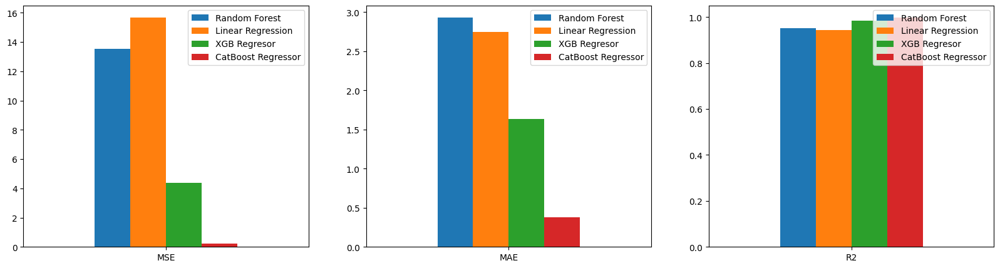

In [70]:
df_mse = pd.DataFrame({'Random Forest': RF_mse, 'Linear Regression': LR_mse,'XGB Regresor':XGB_mse,'CatBoost Regressor':CB_mse}, index=['MSE'])
df_mae = pd.DataFrame({'Random Forest': RF_mae, 'Linear Regression': LR_mae,'XGB Regresor':XGB_mae,'CatBoost Regressor': CB_mae}, index=['MAE'])
df_r2 = pd.DataFrame({'Random Forest': RF_r2, 'Linear Regression': LR_r2,'XGB Regresor':XGB_r2,'CatBoost Regressor': CB_r2}, index=['R2'])


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))

df_mse.plot.bar(rot=0, ax=axes[0])
df_mae.plot.bar(rot=0, ax=axes[1])
df_r2.plot.bar(rot=0, ax=axes[2])

    
plt.show()

In [71]:
print(df_mse)
print('\n\n',df_mae)
print("\n\n",df_r2)

     Random Forest  Linear Regression  XGB Regresor  CatBoost Regressor
MSE      13.518033          15.686326      4.380557            0.227458


      Random Forest  Linear Regression  XGB Regresor  CatBoost Regressor
MAE        2.93463           2.745821      1.637714            0.375719


     Random Forest  Linear Regression  XGB Regresor  CatBoost Regressor
R2        0.95179           0.944057      0.984377            0.999189


The above shown results show that in general Random Forest is slightly better than Linear Regression

In [61]:
# function to remove the string 'regresson__' from the names of the best parameters
def transform(dict, prefix):
    dict_prefix = {key:value for key,value in dict.items() if prefix in key}
    return {key.replace(prefix,''):value for key,value in dict_prefix.items()}

pipe = make_pipeline(preprocess_pipeline, 
                     RF_best_params.get('reduce_dim'),
                     RandomForestRegressor(n_estimators=10, **transform(RF_best_params, 'regresson__')))

final_model =pipe.fit(X, y)

In [62]:
filename = 'final_model.sav'
pickle.dump(final_model, open(filename, 'wb'))